# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[117495.50135958  95611.25879778 123396.80896711 163945.61903468
  92681.20263534  92681.69654331 166962.85594269 128287.52178985
  85865.50347172 119257.05562057  86034.4775969   85969.93480342
 108170.57813688  53738.68354952  57126.84793488  83317.25550298
  71981.73815777 110738.61693473  74472.65917597  63227.95366503
 160920.31283036  92933.55858926 102216.11620354  62973.06639424
  83802.88617593 103666.06970946  68824.92112422 112969.63603961
  82286.50855935  90966.24299436  82257.98971196 182437.27830573
  99562.84804397  70940.73323924 130603.02513683  67282.02216372
 107014.65789057  52935.55780

Omni_P_RQi ================== 0.10789674406088197
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 92681.20263533981, 'S': 10000, 'W': 10000, 'P': 0.10789674406088197, 'dP': 0}, 'j': {'R': 94899.45833203912, 'S': 10000, 'W': 10000, 'P': 0.1053746794319045}, 'k': {'R': 94899.45833203912, 'S': 10000, 'W': 10000, 'P': 0.1053746794319045}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10789674406088197
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 92681.20263533981, 'S': 10000, 'W': 10000, 'P': 0.10789674406088197, 'dP': 0}, 'j': {'R': 94899.45833203912, 'S': 10000, 'W': 10000, 'P': 0.1053746794319045}, 'k': {'R': 94899.45833203912, 'S': 10000, 'W': 10000, 'P': 0.1053746794319045}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10789674406088197
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'p

Omni_P_RQi ================== 0.18608568985105542
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 53738.683549520036, 'S': 10000, 'W': 10000, 'P': 0.18608568985105542, 'dP': 0}, 'j': {'R': 222454.13679694067, 'S': 10000, 'W': 10000, 'P': 0.04495308625853132}, 'k': {'R': 222454.13679694067, 'S': 10000, 'W': 10000, 'P': 0.04495308625853132}}}
config_param a value =============  1
Omni_P_RQi ================== 0.18608568985105542
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 53738.683549520036, 'S': 10000, 'W': 10000, 'P': 0.18608568985105542, 'dP': 0}, 'j': {'R': 222454.13679694067, 'S': 10000, 'W': 10000, 'P': 0.04495308625853132}, 'k': {'R': 222454.13679694067, 'S': 10000, 'W': 10000, 'P': 0.04495308625853132}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.17504904193909077
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.06214255878648488
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 160920.31283035706, 'S': 10000, 'W': 10000, 'P': 0.06214255878648488, 'dP': 0}, 'j': {'R': 129273.91133498424, 'S': 10000, 'W': 10000, 'P': 0.07735512832196476}, 'k': {'R': 129273.91133498424, 'S': 10000, 'W': 10000, 'P': 0.07735512832196476}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10760375640189637
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 92933.5585892591, 'S': 10000, 'W': 10000, 'P': 0.10760375640189637, 'dP': 0}, 'j': {'R': 74439.70910160709, 'S': 10000, 'W': 10000, 'P': 0.13433690325616962}, 'k': {'R': 74439.70910160709, 'S': 10000, 'W': 10000, 'P': 0.13433690325616962}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10760375640189637
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.12156873800364996
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 82257.98971195836, 'S': 10000, 'W': 10000, 'P': 0.12156873800364996, 'dP': 0}, 'j': {'R': 60451.169881367074, 'S': 10000, 'W': 10000, 'P': 0.16542277047118503}, 'k': {'R': 60451.169881367074, 'S': 10000, 'W': 10000, 'P': 0.16542277047118503}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.054813358831421306
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 182437.2783057327, 'S': 10000, 'W': 10000, 'P': 0.054813358831421306, 'dP': 0}, 'j': {'R': 102250.45421452184, 'S': 10000, 'W': 10000, 'P': 0.09779907655979661}, 'k': {'R': 102250.45421452184, 'S': 10000, 'W': 10000, 'P': 0.09779907655979661}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.054813358831421306
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils

Omni_P_RQi ================== 0.18890893785663743
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 52935.55780610538, 'S': 10000, 'W': 10000, 'P': 0.18890893785663743, 'dP': 0}, 'j': {'R': 90073.97902636697, 'S': 10000, 'W': 10000, 'P': 0.11101985399215841}, 'k': {'R': 90073.97902636697, 'S': 10000, 'W': 10000, 'P': 0.11101985399215841}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.15389797387964263
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 64978.113407916564, 'S': 10000, 'W': 10000, 'P': 0.15389797387964263, 'dP': 0}, 'j': {'R': 130220.87599479452, 'S': 10000, 'W': 10000, 'P': 0.07679260274980597}, 'k': {'R': 130220.87599479452, 'S': 10000, 'W': 10000, 'P': 0.07679260274980597}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.15389797387964263
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Ass

Omni_P_RQi ================== 0.12632102272898427
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 79163.38693247065, 'S': 10000, 'W': 10000, 'P': 0.12632102272898427, 'dP': 0}, 'j': {'R': 128888.06274237928, 'S': 10000, 'W': 10000, 'P': 0.07758670420850333}, 'k': {'R': 128888.06274237928, 'S': 10000, 'W': 10000, 'P': 0.07758670420850333}}}
config_param a value =============  1
Omni_P_RQi ================== 0.12632102272898427
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 79163.38693247065, 'S': 10000, 'W': 10000, 'P': 0.12632102272898427, 'dP': 0}, 'j': {'R': 128888.06274237928, 'S': 10000, 'W': 10000, 'P': 0.07758670420850333}, 'k': {'R': 128888.06274237928, 'S': 10000, 'W': 10000, 'P': 0.07758670420850333}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.11612767537501922
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.12457329089288877
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 80274.02927484873, 'S': 10000, 'W': 10000, 'P': 0.12457329089288877, 'dP': 0}, 'j': {'R': 80193.22430095519, 'S': 10000, 'W': 10000, 'P': 0.1246988144842667}, 'k': {'R': 80193.22430095519, 'S': 10000, 'W': 10000, 'P': 0.1246988144842667}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.12457329089288877
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 80274.02927484873, 'S': 10000, 'W': 10000, 'P': 0.12457329089288877, 'dP': 0}, 'j': {'R': 80193.22430095519, 'S': 10000, 'W': 10000, 'P': 0.1246988144842667}, 'k': {'R': 80193.22430095519, 'S': 10000, 'W': 10000, 'P': 0.1246988144842667}}}
config_param a value =============  1
Omni_P_RQi ================== 0.12457329089288877
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'p

Omni_P_RQi ================== 0.07285820950341836
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 137252.8925450854, 'S': 10000, 'W': 10000, 'P': 0.07285820950341836, 'dP': 0}, 'j': {'R': 123752.39939970698, 'S': 10000, 'W': 10000, 'P': 0.08080651404342531}, 'k': {'R': 123752.39939970698, 'S': 10000, 'W': 10000, 'P': 0.08080651404342531}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.07285820950341836
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 137252.8925450854, 'S': 10000, 'W': 10000, 'P': 0.07285820950341836, 'dP': 0}, 'j': {'R': 123752.39939970698, 'S': 10000, 'W': 10000, 'P': 0.08080651404342531}, 'k': {'R': 123752.39939970698, 'S': 10000, 'W': 10000, 'P': 0.08080651404342531}}}
config_param a value =============  1
Omni_P_RQi ================== 0.07285820950341836
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97689.70849547858, 'S': 10000, 'W': 10000, 'P': 0.10236492824075562, 'dP': 0}, 'j': {'R': 130582.47675060149, 'S': 10000, 'W': 10000, 'P': 0.0765799535193296}, 'k': {'R': 130582.47675060149, 'S': 10000, 'W': 10000, 'P': 0.0765799535193296}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10236492824075562
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97689.70849547858, 'S': 10000, 'W': 10000, 'P': 0.10236492824075562, 'dP': 0}, 'j': {'R': 130582.47675060149, 'S': 10000, 'W': 10000, 'P': 0.0765799535193296}, 'k': {'R': 130582.47675060149, 'S': 10000, 'W': 10000, 'P': 0.0765799535193296}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.07219931704418876
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 138505.4652785651, 'S': 10000, 'W': 10000, 'P': 0

Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 166175.1451102321, 'S': 10000, 'W': 10000, 'P': 0.060177471145678924, 'dP': 0}, 'j': {'R': 111709.93842779858, 'S': 10000, 'W': 10000, 'P': 0.08951755001157122}, 'k': {'R': 111709.93842779858, 'S': 10000, 'W': 10000, 'P': 0.08951755001157122}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.23404670864967486
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 42726.51411205347, 'S': 10000, 'W': 10000, 'P': 0.23404670864967486, 'dP': 0}, 'j': {'R': 109396.84385658882, 'S': 10000, 'W': 10000, 'P': 0.0914103153936439}, 'k': {'R': 109396.84385658882, 'S': 10000, 'W': 10000, 'P': 0.0914103153936439}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.23404670864967486
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 42726.51411205347, 'S':

Omni_P_RQi ================== 0.08905498607866283
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 112290.17532119917, 'S': 10000, 'W': 10000, 'P': 0.08905498607866283, 'dP': 0}, 'j': {'R': 75712.4775130362, 'S': 10000, 'W': 10000, 'P': 0.13207862598708645}, 'k': {'R': 75712.4775130362, 'S': 10000, 'W': 10000, 'P': 0.13207862598708645}}}
config_param a value =============  1
Omni_P_RQi ================== 0.08905498607866283
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 112290.17532119917, 'S': 10000, 'W': 10000, 'P': 0.08905498607866283, 'dP': 0}, 'j': {'R': 75712.4775130362, 'S': 10000, 'W': 10000, 'P': 0.13207862598708645}, 'k': {'R': 75712.4775130362, 'S': 10000, 'W': 10000, 'P': 0.13207862598708645}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.06189604918936017
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {

Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103201.23953890195, 'S': 10000, 'W': 10000, 'P': 0.09689806096011547, 'dP': 0}, 'j': {'R': 86507.80377551435, 'S': 10000, 'W': 10000, 'P': 0.11559650763935422}, 'k': {'R': 86507.80377551435, 'S': 10000, 'W': 10000, 'P': 0.11559650763935422}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09689806096011547
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103201.23953890195, 'S': 10000, 'W': 10000, 'P': 0.09689806096011547, 'dP': 0}, 'j': {'R': 86507.80377551435, 'S': 10000, 'W': 10000, 'P': 0.11559650763935422}, 'k': {'R': 86507.80377551435, 'S': 10000, 'W': 10000, 'P': 0.11559650763935422}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09689806096011547
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103201.23953890195, 'S': 1

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

H_chosen_agent **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61160.01 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9338.802938351562
H_agent r out =  61160.01185474315
**********
Q ADDED INTO POOL: 1000 to existing amount 22899.260953570443
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9338.802938351562 from reserve 129122.86779743702
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 77682.66 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5425.13135098263
H_agent r out =  77682.65699985887
**********
Q ADDED INTO POOL: 1000 to existing amount 22693.81352442213
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64712.39 110000.00 136000.00 170000.00 150000.00 0.00 120

delta W H_chosen_agentdelta_Ri =  -4839.217476552643
H_agent r out =  53565.51226100148
**********
Q ADDED INTO POOL: 1000 to existing amount 35574.80492185195
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4839.217476552643 from reserve 127061.01362058085
**********
 7362.983496437308
 addliq - Sq delta Sq 10269.134801452334
addliq - Sq delta S   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63532.82 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56020.17 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 10269.134801452334
POOL ADD LIQUIDITY Timestep ===  10 delta W  13099.591004452357

delta_Ri =  -3747.833757254756
H_agent r out =  63532.81796098211
**********
Q ADDED INTO POOL: 1000 to exist

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44499.24 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 146876.91 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -5299.54616001347
H_agent r out = delta_Ri = H_chosen_agent 3040.794265422992
H_agent r out =  146876.90758279304
**********
Q ADDED INTO POOL: 1000 to existing amount 41612.141492346855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3040.794265422992 from reserve 98804.78896052174
**********
  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56286.02 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_c

H_chosen_agentH_chosen_agentH_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161119.93 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2728.371423343991
H_chosen_agent H_agent r out =  161119.93105975186
**********
Q ADDED INTO POOL: 1000 to existing amount 43380.601301309005
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2728.371423343991 from reserve 93491.32773802575
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40388.45 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2737.4335431176696
H_agent r out =  40388.44702764031
**********
Q ADDED INTO POOL: 1000 to existing amount 43305.2102303061
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2737.4335431176696 from reser

H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9674.76 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  166478.15417053827
**********
Q ADDED INTO POOL: 1000 to existing amount 39174.35246963707
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4080.4701194422673 from reserve 123371.09716416927
**********
delta_Ri =  -2918.234263275985
H_agent r out =  9674.756456302346
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13185.69 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3566.1072321258985
H_agent r out =  13185.687633835645
**********
Q ADDED INTO POOL: 1000 to existing amount 38271.06554660614
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3566.1072321258985 from reserve 104582

********** 3480.5616299656804
**********
Q ADDED INTO POOL: 1000 to existing amount 41660.40232420797
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3473.931901183039 from reserve 113708.16309517695
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22728.62 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3326.2462395154457
H_agent r out =  -22728.624748699956
**********
Q ADDED INTO POOL: 1000 to existing amount 42366.978654855084
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3326.2462395154457 from reserve 111234.23119399391
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2020.0451652034176 from reserve 79441.24517893544
**********
H_chosen_agent H_chosen_agent H_agent r out =  27568.017603441273
**********
Q ADDED INTO POOL: 1000 to existing amount 45472.282830546705
*****

Q ADDED INTO POOL: 1000 to existing amount 39585.46443777177
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3222.126969866866 from reserve 98147.22259298776
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1096.40 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2373.2669565628853
H_agent r out =  -1096.395754333223H_chosen_agent 
**********H_chosen_agent 
**********
Q ADDED INTO POOL: 1000 to existing amount 46550.33641771154   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 204331.96 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3080.1282008043254
H_agent r out =  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2373.2669565628853 from reserve 88399.10560524615
**********
POOL RESERVE ONE RE


H_chosen_agent
H_agent r out =  173286.22206216687
**********
Q ADDED INTO POOL: 1000 to existing amount 48809.59858038485
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2024.6699170673814 from reserve 80395.4744811479
**********
 **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -37580.20 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2506.062027117823
H_agent r out =  -37580.19697483931
**********
Q ADDED INTO POOL: 1000 to existing amount 47366.978654855084
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10587.87 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1851.1080928651857
H_agent r out =  10587.87284119905
**********
Q ADDED INTO POOL: 1000 to existing amount 50500.288664121246
**********
*********

delta_Ri =  2897.5497645656887
H_agent r out =  216283.11542075488
**********


delta_Ri =  1926.5445678250169
H_agent r out =  177284.9583134739
**********delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 41207.302605975805 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14384.74 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1906.9185710013987
H_agent r out =  -14384.741744411087
**********
Q ADDED INTO POOL: 1000 to existing amount 50784.34930662663
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1906.9185710013987 from reserve 79110.75961516827
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182253.88 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1770.4850051594449

delta_Ri =  2074.218610730899
H_agent 

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184461.57 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1792.3423778490662
H_agent r out =  -19842.280607576125
**********
Q ADDED INTO POOL: 1000 to existing amount 52064.070524164934
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1792.3423778490662 from reserve 76653.22075200322
**********


delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 2019.699837909223 from reserve 80262.62831577618
delta_Ri = H_chosen_agent
  **********
1637.9388905943931   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27167.19 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2009.3434890251917
H_agent r out =  -27167.188671547825
**********
Q ADDED INT

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -54715.94 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9463.15 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1875.0504194296907
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193859.86 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
 H_chosen_agentdelta_Ri = 
 -54715.94244141651delta_Ri = 2525.328055187793   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23390.76 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

H_agent r out =  -28202.842615826692 2231.710870406745
POOL RESERVE ONE REMOVING ASSET i in amount 1845.1416639372965 from reserve 82579.52038240041
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -60228.48 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1851.8275230569868
H_agent r out =  -60228.47722423076
**********
Q ADDED INTO POOL: 1000 to existing amount 53566.21886736336
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1851.8275230569868 from reserve 82734.37871846312
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197111.44 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192296.51 110000.00 

********************
Q ADDED INTO POOL: 1000 to existing amount 54218.063180377816

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197707.34 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 57750.43156101639
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1391.2384363482272 from reserve 67416.6214987143
**********
**********
delta_Ri =  -1530.489298817493
H_agent r out =  -41214.1057350733
**********
Q ADDED INTO POOL: 1000 to existing amount 53439.00816723537
**********H_chosen_agent **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203133.08 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1391.2970826447722
H_agent r out =  203133.0815288453
**********
Q ADDED INTO POOL: 1000 to existing a

delta_Ri = H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198956.34 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1340.5386404152293
H_agent r out =  -17977.966804699056
**********
Q ADDED INTO POOL: 1000 to existing amount 57559.173542544035
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1340.5386404152293 from reserve 64703.23583064076
**********
H_agent r out =  205899.56782752406
**********
Q ADDED INTO POOL: 1000 to existing amount 55337.27926631504
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1485.737749502091 from reserve 68711.69097025352
**********
 H_chosen_agent
  delta_Ri =  246969.01047807754   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -5750.00 110000.00 98000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -74711.90 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1785.5538449353162
H_agent r out =  -74711.89667100825
**********
Q ADDED INTO POOL: 1000 to existing amount 54391.59216680806
**********
H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -8192.73 110000.00 96000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -1309.3794128133036
H_agent r out =  -8192.732183359285
**********
Q ADDED INTO POOL: 1000 to existing amount 57920.52179278422
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1309.3794128133036 from reserve 63672.77128836067
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1785.5538449353162 from reserve 81250.95927168561
**********
H_chosen_agent   m   r_i_ou

delta_Ri =  1696.1100200171995

H_agent r out = H_agent r out = 
 -51843.90812388185
**********
Q ADDED INTO POOL: 1000 to existing amount 46294.71533117369
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1460.7298384713308 from reserve 54607.81049511545
**********
 delta_Ri = 
delta_Ri =   -1301.1771898043853
H_agent r out =  -24296.273339569947
**********
Q ADDED INTO POOL: 1000 to existing amount 48109.5798365881
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1301.1771898043853 from reserve 50497.08890834713
**********
252128.58735574497 **********
Q ADDED INTO POOL: 1000 to existing amount 58449.034109436354
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1302.9529122012361 from reserve 64318.997713873425
**********
1138.2445769926178H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45585.80 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13

delta_Ri = **********
Q ADDED INTO POOL: 1000 to existing amount 63848.33204699762
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1055.837737394858 from reserve 57828.723627224725
**********
 -1294.2934868727002
H_chosen_agentH_chosen_agent H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108616.62 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  -46795.25386713806 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -57399.75 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
**********
Q ADDED INTO POOL: 1000 to existing amount 50778.71287129134
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1294.2934868727002 from reserve 53687.98548491879
**********

 delta_Ri =  -1328.33433963241
H_ag

H_chosen_agent 221838.3961361068
**********
Q ADDED INTO POOL: 1000 to existing amount 65827.67259500452
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 982.7447903346784 from reserve 55772.86266167074
**********
H_chosen_agentdelta_Ri =  -1123.6557054899358
H_agent r out =  -50499.45648979533
**********
Q ADDED INTO POOL: 1000 to existing amount 53778.71287129134
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1123.6557054899358 from reserve 49983.78286226152
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18486.21 110000.00 88000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  -1153.007985330076
H_agent r out =  -18486.2096897167
**********
Q ADDED INTO POOL: 1000 to existing amount 49536.16228011602
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1153.007985330076 from reserve 46393.34519834638
******


delta_Ri =  -12622.238320660108
H_agent r out = delta_Ri =  1349.129554166045
H_agent r out =  213236.03617165145
**********
Q ADDED INTO POOL: 1000 to existing amount 57595.80611647965
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1349.129554166045 from reserve 65445.66037166327
**********
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19770.83758342348
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 12622.238320660108 from reserve 131287.5217898483
**********
 H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 128034.82 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  4764.5217789779190
H_chosen_agent
 delta W  11700.756843240204 delta S **********
POOL RESERVE ONE REMOVING ASSET i in amount 9345.681353266127 from reserve 155762.23480040996
**********
 
add

POOL RESERVE ONE REMOVING ASSET i in amount 1042.3584314402326 from reserve 45653.64406770462-7438.16019380709 
**********
 6492.868147178806
addliq - Sq delta S 6492.868147178806
POOL ADD LIQUIDITY Timestep ===  10 delta W  10759.2829056127 delta S  5425

POOL REMOVE LIQUIDITY share fraction of pool = 0.1792254729309179
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21504756416979337
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21504756416979337
155425.0
H_agent r out =  7557.815419116551
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 130977.48 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3945.380078008189
H_agent r out =  130977.48356944553
**********
Q ADDED INTO POOL: 1000 to existing amount 36733.53584651865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3945.380078008189 from reserve 108888.01990227448
**********
34857.683507273

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2812.69 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -5627.202896418573
H_agent r out =  2812.6900316327446
**********
Q ADDED INTO POOL: 1000 to existing amount 33625.205073368095
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5627.202896418573 from reserve 136758.3090663121
**********
delta_Ri =  997.4968651665934
H_agent r out =  224097.55284190574
**********
Q ADDED INTO POOL: 1000 to existing amount 53401.89922184764
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 997.4968651665934 from reserve 44198.00412906695
**********
  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 151432.21 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_o

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12859.67 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 163377.52 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3583.832164712752
H_agent r out =  163377.5180802249
**********
Q ADDED INTO POOL: 1000 to existing amount 35175.16706737364
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3583.832164712752 from reserve 93303.68455511486
**********
 -4504.001716082472
H_agent r out =  -12859.67105007145
**********
Q ADDED INTO POOL: 1000 to existing amount 36422.83988634476
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4504.001716082472 from reserve 122085.9479846079
**********

   m  r_i_ou

delta_Ri =  2868.617086192694
H_chosen_agent delta_Ri =  3435.5784227920494
 **********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70070.55 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71679.70 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4731.019593390458
H_agent r out =  71679.70364050614
**********
Q ADDED INTO POOL: 1000 to existing amount 23514.090292018158
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4731.019593390458 from reserve 68361.40018382092
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8436.03 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

H_chosen_agent **********
**********
delta_Ri =  -4287.673068286954
H_agent r out =  66948.68404711568
**********
Q ADDED INTO POOL: 1000 to existing amount 35693.060890295696
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4287.673068286954 from reserve 114630.38059043046
**********
 H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3122.4898441343244 from reserve 95961.194117007
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8845.32 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2809.7143609807736
H_agent r out =  -8845.323372037663
**********
Q ADDED INTO POOL: 1000 to existing amount 38983.56098370469
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2809.7143609807736 from reserve 84411.73224853427
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44216.26 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54571.47 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
 
delta_Ri =  -3830.256077183125
H_agent r out =  54571.466292207966
**********
Q ADDED INTO POOL: 1000 to existing amount 37212.39951721965
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3830.256077183125 from reserve 108253.16283552274
**********
H_chosen_agentdelta_Ri =  -3523.861756355931
H_agent r out =  44216.26347008909
**********
Q ADDED INTO POOL: 1000 to existing amount 37560.708877609955
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3523.861756355931 from reserve 100827.52226786665
*******

0 130000.00 180000.00 160000.00  delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in amount 2097.4002787285663 from reserve 72791.00806609649
**********

 H_chosen_agentdelta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28762.28 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2259.1682047561644H_chosen_agent  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192257.48 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2521.4734632537366H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43776.47 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_agent r out = 
delta_Ri =  -3177.1476113097583
H_agent r out =  43776.47402749903
*********

H_chosen_agentdelta_Ri =  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21022.37 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    1563.7581435839081
H_agent r out =  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 204359.74 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2298.0310130680336
H_agent r out =  204359.74130995534
**********
Q ADDED INTO POOL: 1000 to existing amount 44852.337912766416
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2298.0310130680336 from reserve 82135.76004962406
**********
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31446.01 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130

1506.4763315078396delta_Ri = 
H_agent r out =  202578.83978838826
**********
Q ADDED INTO POOL: 1000 to existing amount 48997.25997698619
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1506.4763315078396 from reserve 60102.36284695148
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189206.94 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1656.939115089568H_chosen_agentdelta_Ri = 
H_agent r out = H_chosen_agent  -36641.99544852849
**********
Q ADDED INTO POOL: 1000 to existing amount 47902.06759060598
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1656.939115089568 from reserve 64615.06017204343
**********
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26554.82 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1640.5807343

**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6070.90 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1796.2077128766377
H_agent r out =  6070.896908335087
**********
Q ADDED INTO POOL: 1000 to existing amount 48810.047975093585
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1796.2077128766377 from reserve 71682.15570611261
**********
 220335.92748000138
**********H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -44891.57 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1495.721938503664
H_agent r out =  -44891.57113437272
**********
Q ADDED INTO POOL: 1000 to existing amount 49926.4903776448
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1495.721938503664

0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198558.47 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  1528.9012729269573
H_agent r out =  198558.47190289985
**********
Q ADDED INTO POOL: 1000 to existing amount 53116.617303476385

delta_Ri =  1304.2735379102076
H_agent r out =  212815.08868469798
**********
Q ADDED INTO POOL: 1000 to existing amount 51928.72752838536
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1304.2735379102076 from reserve 55866.11395064176
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214119.36 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1528.901272926957

1725.255056283737H_chosen_agent 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -45381.92 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_agent r out = 

delta_Ri = delta_Ri =   -1228.4340740802982
H_agent r out =  -45381.921087465635
**********
Q ADDED INTO POOL: 1000 to existing amount 57244.589516385924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1228.4340740802982 from reserve 58905.600702382704
**********
Q ADDED INTO POOL: 1000 to existing amount 51131.29635634569 H_chosen_agent  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1860.9123999240576 from reserve 77848.37660718057
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203033.18 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1912.5753274190226
H_a

POOL RESERVE ONE REMOVING ASSET i in amount 1705.6046025134146 from reserve 70608.48860763539
**********
H_chosen_agent  H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -82826.17 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3878.28 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 208485.00 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agentdelta_Ri =  -1700.076280846036

delta_Ri = delta_Ri =  1315.6493539712549
H_agent r out =  208485.00036010827
**********
Q ADDED INTO POOL: 1000 to existing amount 56502.15063323924
*

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222914.51 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
delta_Ri =  1394.6880353709885
H_agent r out =  222914.5061832158
**********
Q ADDED INTO POOL: 1000 to existing amount 50517.33025623165
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1394.6880353709885 from reserve 57766.696452123964
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -52354.24 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 54726.51703340527
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1439.16796307815 from reserve 65972.01355233119
**********
H_agent r out =  -5578.361210653225
**********
Q ADDED INTO POOL: 1000 to existing amount 50324.902067866635

delta_Ri = H_chosen_agent H_chosen_agentH_chosen_agent -1388.4160604491374    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229402.45 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -5888.12784542093
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 217317.29 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1116.2428098321707H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 235425.41 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -55631.88 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j

delta_Ri = H_chosen_agent -1462.8474643123284
H_agent r out =  -11971.564697332484
**********
Q ADDED INTO POOL: 1000 to existing amount 53077.92414530573
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1462.8474643123284 from reserve 64639.69410044502
**********
delta_Ri =   
delta_Ri = H_agent r out = -949.8262305005919
H_agent r out =  -58585.50030711819
**********
Q ADDED INTO POOL: 1000 to existing amount 63721.64561647133
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 949.8262305005919 from reserve 51702.021482730146
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148636.85 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8128.230076199514
H_agent r out =  148636.84842254725
**********
Q ADDED INTO POOL: 1000 to existing amount 23761.773557888013
**********
**********
POOL RESERVE ONE REMOVING ASSET

delta W H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240428.27 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  H_chosen_agent 
delta_Ri =  1728.6967694981993
H_agent r out =  240428.26883351762
**********
Q ADDED INTO POOL: 1000 to existing amount 50209.1414970548
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1728.6967694981993 from reserve 71067.23252606181
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 85555.82 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171002.96 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 
delta_Ri =  6262.07719076

H_chosen_agentH_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 4716.351621654901 from reserve 114016.96473221299    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 248293.62 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67780.33 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1480.8293982119537   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -4396.4239678863505
H_agent r out =  67780.33263574674
**********
Q ADDED INTO POOL: 1000 to existing amount 35223.546213249654

**********
**********
POOL RESERVE ONE REMOVING AS

0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 52064.024204575835
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1534.4904403807045 from reserve 66245.43022278156
H_chosen_agent********** 
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19778.74 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57011.14 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -3779.556314053085
H_agent r out =  57011.13511320318
**********

 Q ADDED INTO POOL: 1000 to existing amount 35911.59000181936delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 252502.22 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

 

0 130000.00 180000.00 160000.00  
delta_Ri =  6655.4757084172115
H_agent r out =  146658.78391839887
**********
Q ADDED INTO POOL: 1000 to existing amount 30143.150662965098
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40130.68 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 155178.0
delta_Ri =  -2831.8870357564024
H_agent r out =  40130.68437436613
**********
Q ADDED INTO POOL: 1000 to existing amount 40009.22784767698
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2831.8870357564024 from reserve 87996.18784608616
**********
H_chosen_agent
H_chosen_agent  
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26927.64 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  

H_chosen_agent **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165220.97 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5280.784111164467
H_agent r out =  165220.969623238
**********
Q ADDED INTO POOL: 1000 to existing amount 32645.24527275268
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5280.784111164467 from reserve 124066.55216661032
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36431.45 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agentdelta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29744.17 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out  

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184022.78 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3895.768831101228
H_agent r out =  184022.78430569178
**********
Q ADDED INTO POOL: 1000 to existing amount 36412.801360479294
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3895.768831101228 from reserve 106264.73748415656
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46053.53 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187918.55 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** delta_Ri =  -4116.6967

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191538.32 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3508.312377684253
H_agent r out =  191538.3194019321
**********
Q ADDED INTO POOL: 1000 to existing amount 37848.03657312673
**********
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 3508.312377684253 from reserve 100749.20238791624
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34513.66 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3420.7214069708593
H_agent r out =  34513.660532262424
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70703.92 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0

Q ADDED INTO POOL: 1000 to existing amount 45082.37826072747POOL RESERVE ONE REMOVING ASSET i in amount 3254.408663761398 from reserve 96969.0563437873H_chosen_agent
********** delta_Ri = 

**********Q ADDED INTO POOL: 1000 to existing amount 41080.018267273466
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 84112.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 ********************

POOL RESERVE ONE REMOVING ASSET i in amount 1969.0739098738718 from reserve 70449.95853646768
**********

POOL RESERVE ONE REMOVING ASSET i in amount 5316.831068455609 from reserve 82252.49274694538
********************
delta_Ri = -2506.056327576164 -13136.011034060619
H_agent r out = 

**********H_chosen_agent**********H_chosen_agent 
H_agent r out =  
 84112.04553548046
POOL RESERVE ONE REMOVING ASSET i in amount 3236.9953611990913 from reserve 104065.98168048945
**********

H_chosen_agent   m  

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 256632.86 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1994.7386909629683
H_agent r out =  256632.85993637107
**********
Q ADDED INTO POOL: 1000 to existing amount 50863.83778346395
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1994.7386909629683 from reserve 83312.75909830838
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4205.575333780335 from reserve 121778.40723456541
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12201.83 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3274.6411264660796
H_agent r out =  12201.82981545916
**********
Q ADDED INTO POOL: 1000 to existing amount 40904.00287503

delta_Ri = 

Q ADDED INTO POOL: 1000 to existing amount 40991.0108390454
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3500.8856574793194 from reserve 110913.50378976972
**********
delta_Ri =   -7360.338515935397
H_agent r out =  32906.646989359004
**********
Q ADDED INTO POOL: 1000 to existing amount 30777.273479382322
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7360.338515935397 from reserve 157869.50293205283
**********
H_chosen_agent-1585.7991845652787H_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 229230.46 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2755.5057989014404
H_agent r out =  229230.46458449948
**********
Q ADDED INTO POOL: 1000 to existing amount 41439.22402668262
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2755.5057989014404 from reserve 89057.05720534893
**********d

0 130000.00 180000.00 160000.00  
H_agent r out =  -5921.636752550663
**********
Q ADDED INTO POOL: 1000 to existing amount 51833.012701137224
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1624.60818393563 from reserve 69759.56588278916
**********
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6425.16 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2706.191874627735
H_agent r out =  -6425.1628685901105
**********
Q ADDED INTO POOL: 1000 to existing amount 44049.61233148436
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2706.191874627735 from reserve 95070.33849098925
**********
 
delta_Ri =  -3327.4905876902117
H_agent r out =  20668.357040810137
**********
Q ADDED INTO POOL: 1000 to existing amount 41784.82379709959
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3327.49058769021

delta_Ri =  H_chosen_agentH_chosen_agentH_chosen_agent1675.7693075329937 -1418.2525395226241
H_agent r out =  -10804.331850664366
********** 
Q ADDED INTO POOL: 1000 to existing amount 52650.3756600822
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1418.2525395226241 from reserve 62061.17162105568
**********

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 242308.42 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
 278679.7647420614
**********
Q ADDED INTO POOL: 1000 to existing amount 54601.9065028587
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1675.7693075329937 from reserve 76265.85429261804
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8373.78 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 282089.61 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1653.1875104453095
H_agent r out =  282089.60746866855
**********
Q ADDED INTO POOL: 1000 to existing amount 48394.92217912003
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1653.1875104453095 from reserve 64957.707640579465
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 249217.83 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2126.0303500945815
H_agent r out =  249217.82500478067
**********
Q ADDED INTO POOL: 1000 to existing amount 45829.082461653954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2126.0303500945815 from reserve 78069.69678506776
*****

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1581.6083300097982 from reserve 53670.369500516106
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23356.50 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 257950.27 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2045.6624050232713
H_agent r out =  257950.268113086
**********
Q ADDED INTO POOL: 1000 to existing amount 39526.67737119352
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2045.6624050232713 from reserve 62191.02636388059
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10391.75 110000.00 114000.00 170000.00 150000.00 0.00 12

Q ADDED INTO POOL: 1000 to existing amount 40985.372778637575
**********

H_chosen_agent 
H_agent r out =  -29089.869580269584
**********
Q ADDED INTO POOL: 1000 to existing amount 46537.32711045317
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1028.6411025021087 from reserve 38301.27881784753
**********
Q ADDED INTO POOL: 1000 to existing amount 45183.16312524001
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1382.323467178832 from reserve 50134.71110731159
**********
H_chosen_agent H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69319.94 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7374.14837100874
H_agent r out =  69319.9425058085
**********
Q ADDED INTO POOL: 1000 to existing amount 22718.556444525962
**********POOL RESERVE ONE REMOVING ASSET i in amount 1874.1027232740746 from reserve 80736.

0 130000.00 180000.00 160000.00  **********-2758.975974797979    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 77567.45 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 6758.796190328052 from reserve 145233.31592464808
**********

H_agent r out =  

 -7967.439666358414delta_Ri =  -1609.5994205780878
H_agent r out =  -27651.78654218965
**********delta_Ri = 
Q ADDED INTO POOL: 1000 to existing amount 55730.98990819285
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1609.5994205780878 from reserve 74745.02242492019
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45430.04 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1271.7473893557917
H_agent r out =  -45430.03513970661
*******

0 130000.00 180000.00 160000.00  delta_Ri = addliq - Sq delta Sq   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -55639.78 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   H_chosen_agent-5205.87364380380911433.54979967813    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43153.14 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri = delta_Ri =  -2516.5950284951236
H_agent r out =  -55639.78238392958
**********
Q ADDED INTO POOL: 1000 to existing amount 45591.91122433411
**********
**********H_agent r out = 


POOL RESERVE ONE REMOVING ASSET i in amount 2516.5950284951236 from reserve 91323.07355876423
**********
delta_Ri = -30845.325382743544 -1293.5585054935461
H_agent r out =  -47960.69673492253
**********
Q ADDED INTO POOL: 1000 to existing amount 50695.8766628815

H_chosen_agent H_chosen_agentH_chosen_agent delta_Ri =  -6631.419625702087
H_agent r out =  82898.78514049892
**********
Q ADDED INTO POOL: 1000 to existing amount 21651.40624842831
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6631.419625702087 from reserve 81510.04393827647
**********
H_chosen_agent  
delta_Ri =  -3686.5826623451553H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19983.57 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -62897.92 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -41079.40860861179   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50015.67 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     

0 130000.00 180000.00 160000.00   H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -69427.42 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  -4473.198455959235
H_agent r out =  65655.12241507792
**********
Q ADDED INTO POOL: 1000 to existing amount 35310.560071517786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4473.198455959235 from reserve 116266.38121285547
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22602.83 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -46171.49 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -1193.2740680501586
H

0 130000.00 180000.00 160000.00       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35592.64 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49480.41 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -3398.481129225434
H_agent r out =  49480.410283342855
**********
Q ADDED INTO POOL: 1000 to existing amount 39058.464729666346
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3398.481129225434 from reserve 101091.66908112039
**********
3469.496217252782

delta_Ri =  -3181.787565882284
H_agent r out =  5738.810405593265
**********
Q ADDED INTO POOL: 1000 to existing amount 40058.52196719477
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3181.787565882284 from reserve 99026.33

0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -38468.49 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1961.3145086023317
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28263.11 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2278.970701349952
H_agent r out = delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 2919.2631667197875 from reserve 94799.64089295277 **********
 28263.110251316662
**********
Q ADDED INTO POOL: 1000 to existing amount 47890.74102462217
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2278.970701349952 from reserve 87944.80679463144
**********


 -2567.590733852236
H_agent r out =  -38468.48503073868
**********
Q ADDED INTO POOL: 1000 to existing amount 47649.621773

0 130000.00 180000.00 160000.00  delta_Ri = 

H_chosen_agent  delta_Ri = **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1002.2844010101693 from reserve 49157.158558860254
**********
2928.5995940091148
H_agent r out =   -2984.9319120250143
H_agent r out =  -3407.144063615321
**********
Q ADDED INTO POOL: 1000 to existing amount 41052.656697583305
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2984.9319120250143 from reserve 95880.37772623298
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -81360.75 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26560.22 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  181952.38067738502H_chosen_agent
**********
Q ADDED INTO POOL: 10

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5107.50 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent-1789.5350336479069    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -85024.13 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1844.1542212270965
H_agent r out =  -85024.13276390661
**********
Q ADDED INTO POOL: 1000 to existing amount 51560.04366072254
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1844.1542212270965 from reserve 77938.72317878719
**********

H_agent r out = H_agent r out =  18401.739809031158
**********
Q ADDED INTO POOL: 1000 to existing amount 50098.804964272225
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1789.5350336479069 from reserve 73012.99860680869
**********

Q ADDED INTO POOL

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17557.97 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -59738.80 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2256.08006920991
H_agent r out =  -59738.80421135861
**********
Q ADDED INTO POOL: 1000 to existing amount 50211.923258566676
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2256.08006920991 from reserve 93206.81482332075
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19900.01 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1847.2635402646242
H_agent r out =  -17557.97485

H_chosen_agent -22937.9061594935
**********
Q ADDED INTO POOL: 1000 to existing amount 53214.234924625074
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1692.2164294441122 from reserve 74319.14946107841
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115522.62 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4767.62 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  13370.337294741028
H_agent r out = H_chosen_agentdelta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -64191.11 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   115522.62379512575
**********
Q ADDED

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29570.70 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2282.317018216592
H_agent r out =  -29570.699215148845
**********
Q ADDED INTO POOL: 1000 to existing amount 45593.87941534115
delta_Ri =  9057.68796073254
H_agent r out =  150402.91564257478
**********
Q ADDED INTO POOL: 1000 to existing amount 28225.736464935537
**********
**********
H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 9057.68796073254 from reserve 172559.94030011908   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216771.69 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1744.7823347785968
H_agent r out =  216771.6881039211
**********
Q ADDED INTO POOL: 1000 to existing amount 48798.774156779014
**********
**********
H_

 4497.727220523047155840.0H_agent r out = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -36063.07 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1945.6583364358519
H_agent r out =  H_chosen_agent  -36063.06932498204
**********
Q ADDED INTO POOL: 1000 to existing amount 48593.87941534115
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1945.6583364358519 from reserve 77224.45246486623
**********
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 7375.6682255479245 from reserve 155350.40177517265
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7106.40 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1972.0386374226873
H_agent r out =  -7106.402871231949
**********
Q ADDED INTO POOL: 1000 to existin

H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 84577.32 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1049.571264829702 from reserve 55710.01722474719
**********
 
delta_Ri =  -5855.340974635007
H_agent r out =  84577.32138486406
**********
Q ADDED INTO POOL: 1000 to existing amount 21662.56713059938
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5855.340974635007 from reserve 73611.79898176117
**********
**********
H_chosen_agentdelta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184581.51 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.

**********H_chosen_agentaddliq - Sq delta Sq 9928.156391672808 H_chosen_agent

H_agent r out = addliq - Sq delta S**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19335.24 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11935.59 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    POOL RESERVE ONE REMOVING ASSET i in amount 3687.5783285546045 from reserve 99832.96385520685

delta_Ri =  -1011.7007961323335
H_agent r out =  -11935.587934682502
**********
Q ADDED INTO POOL: 1000 to existing amount 63332.06359079583
**********
 81404.50904360805
**********
Q ADDED INTO POOL: 1000 to existing amount 21609.587063622253
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7557.474032900777 from reserve 92575.087180

H_chosen_agent **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42468.35 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
delta_Ri =  -1800.905055436119

delta_Ri =  -1698.8913546468984   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61086.29 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********


H_agent r out = **********
Q ADDED INTO POOL: 1000 to existing amount 38324.02785046701
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3162.389387666902 from reserve 92325.57653421309
**********
delta_Ri =  -3732.9093562814096
H_agent r out =  61086.28714264418
**********
Q ADDED INTO POOL: 1000 to existing amount 37377.314378417985
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3732.9093562814096 from reserve 106120.7647

H_chosen_agentH_chosen_agent **********


 **********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47266.59 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -3082.3528422802815
H_agent r out =  47266.58909718027
**********
Q ADDED INTO POOL: 1000 to existing amount 40177.82683627955
 4458.855153142897
H_agent r out =  216808.4438914311
**********
Q ADDED INTO POOL: 1000 to existing amount 36084.42769042735
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4458.855153142897 from reserve 120154.41205126279
**********
H_chosen_agentH_chosen_agent **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205186.23 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in amount 3082.352

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 86710.78 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -55388.26 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
delta_Ri =  -1500.1091085502665
H_agent r out =  -55388.25902755441
**********
Q ADDED INTO POOL: 1000 to existing amount 45916.65998833953
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1500.1091085502665 from reserve 55510.862865289775
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 225840.73 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = -3288.627674602725 -4241.5602413810575
H_agent r out 

H_chosen_agent H_chosen_agent
**********
H_chosen_agent **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -59860.63 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1527.8692672499233
H_agent r out =  -59860.628136161235
**********
Q ADDED INTO POOL: 1000 to existing amount 45590.80686412825
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1527.8692672499233 from reserve 56038.493756682954
**********
delta_Ri =  -3249.265592023067

 H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 2487.9193397583595 from reserve 81728.44623855456   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -61388.50 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********

delta_Ri =  -1446.6330834866867
H_agent r out =  -61388.49740341116
**********
Q ADDED

H_chosen_agent delta_Ri =  -2219.856246857196
H_agent r out =  23529.253021526718
**********
Q ADDED INTO POOL: 1000 to existing amount 45655.82911498969
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2219.856246857196 from reserve 81563.73061842383
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 78486.66 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 225398.30 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  3227.12959934037
H_agent r out =  248038.24712009556
**********
Q ADDED INTO POOL: 1000 to existing amount 40705.35233924486
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3227.12959934037 from reserve 101924.60882259834
**********
delta_Ri = 
delta_Ri = H_c

H_chosen_agentaddliq - Sq delta SqH_chosen_agentH_chosen_agent 14425.477946569594
addliq - Sq delta S 14425.477946569592
POOL ADD LIQUIDITY Timestep ===  10 delta W  19069.94235896283
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17162.19 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 229809.25 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2023.3282235285276
H_agent r out =  229809.2504098189
**********
Q ADDED INTO POOL: 1000 to existing amount 45478.593097574965
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2023.3282235285276 from reserve 73587.55855729096
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0

 2188.768275823085H_chosen_agent 

delta_Ri = H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 139416.18 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58179.20 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   11217.180184164792
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19567.04659474444
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 11217.180184164792 from reserve 115738.61693472519
**********

delta_Ri =  1997.180316060133
H_agent r out =  139416.18489021322
**********
Q ADDED INTO POOL: 1000 to existing amount 47319.95505500218
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1997.180316060133 from reserve 7

0 130000.00 180000.00 160000.00  H_chosen_agent addliq - Sq delta SqH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61547.04 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   5473.231146150872
addliq - Sq delta S 5473.231146150872
POOL ADD LIQUIDITY Timestep ===  10 delta W  5842.216178445513

delta_Ri = H_chosen_agent 
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 143410.91 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1545.479234239061H_chosen_agent delta_Ri =  -2381.5032112210124
H_agent r out =  61547.035127035066
**********
Q ADDED INTO POOL: 1000 to existing amount 46895.488461184235

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2381.5032112210124 from reserve 89528.7732848057
**********
   m   r_i_out    r_i_in         h       

H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 2078.9039061558738 from reserve 77237.49129609465
**********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142666.88 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 277775.16 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  5948.100745957041
H_agent r out =  142666.88054883858
**********
Q ADDED INTO POOL: 1000 to existing amount 30190.542322332694
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5948.100745957041 from reserve 125071.73638588663
**********
H_chosen_agent 1803.865674683228
H_agent r out =  147255.75004867974
**********
Q ADDED INTO POOL: 1000 to existing amount 49282.69133866198
**********
**

0 130000.00 180000.00 160000.00  delta_Ri =  1785.1346465647655
H_agent r out =  152647.23000703688
**********
Q ADDED INTO POOL: 1000 to existing amount 49484.605020406416
**********

H_chosen_agent
delta_Ri =  4675.706423310107
H_agent r out =  159130.37116740647
**********
Q ADDED INTO POOL: 1000 to existing amount 32806.49232451483
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4675.706423310107 from reserve 110608.24576731876
**********
delta_Ri =  -2240.0076037631225
H_agent r out =  -8700.113016056644
**********
Q ADDED INTO POOL: 1000 to existing amount 46120.00861167931
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38936.77 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in amount 1785.1346465647655 from reserve 72091.45354248318
**********
  -2028.7709258601333
H_agen

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31035.30 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1767.3483277629323
H_agent r out =  31035.295029285247
**********
Q ADDED INTO POOL: 1000 to existing amount 49166.37225041563
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1767.3483277629323 from reserve 71162.14296416029
**********
H_chosen_agent POOL REMOVE LIQUIDITY Timestep ===  90 delta W  6099.830208295481   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19043.26 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1815.0427584663646
H_agent r out =  -19043.258201577537
**********
Q ADDED INTO POOL: 1000 to existing amount 50139.31977085867
**********
**********
POOL RESERVE ONE REMOVING ASS

**********H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1793.4143306499855 from reserve 71709.18795471817
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1452.287733160809 from reserve 69682.00812534188
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30961.93 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1541.1271268220512
H_agent r out =  -30961.932640037536
**********
Q ADDED INTO POOL: 1000 to existing amount 53554.652311184786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1541.1271268220512 from reserve 68208.6454968376
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184861.01 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3533.87

H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16745.08 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1510.8970462661505H_chosen_agent 
 delta_Ri = delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36734.98 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194801.78 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2914.80558670955
H_agent r out =  167493.02675326227
**********
Q ADDED INTO POOL: 1000 to existing amount 52939.039240844366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1510.8970462661505 from reserve 66245.656796

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19504.02 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154459.0
delta_Ri =  -1293.615331581921
H_agent r out =  27730.912104676852
**********
Q ADDED INTO POOL: 1000 to existing amount 60088.48264039178
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1293.615331581921 from reserve 65712.65026244753
**********
 
delta_Ri =  -1401.4281550257454
H_agent r out =  -19504.01724956352
**********
Q ADDED INTO POOL: 1000 to existing amount 44413.659095036266
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1401.4281550257454 from reserve 49745.2272054537
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202995.92 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  



**********-5457.667283761829
H_agent r out =  85677.01774454163
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5457.667283761829 from reserve 68994.27324752563
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 42308.32365830782
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2345.5833510683888 from reserve 77852.74081812466
**********
-11017.475517756222addliq - Sq delta SqH_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210231.46 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 80219.35 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  

   m  r_

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76486.39 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -6760.1326758649275
H_agent r out =  76486.38591221915
**********
Q ADDED INTO POOL: 1000 to existing amount 28189.664844823896
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6760.1326758649275 from reserve 127456.32071563623
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181544.99 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16858.72 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1148.2314628341112
   m  r_i_out    r_i_in       

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184410.18 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1340.1112904956337
H_agent r out =  184410.1798880204
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218456.75 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 13537.40 110000.00 99000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27794.55 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6625.052703239947
H_agent r out =  27794.545579821646
**********
Q 

H_chosen_agentH_agent r out =  10554.745586534464
**********
Q ADDED INTO POOL: 1000 to existing amount 68094.50342054755
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53308.55 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2455.0351320796126
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 132151.29 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6147.915403098969
H_agent r out =  132151.28524851755
**********
Q ADDED INTO POOL: 1000 to existing amount 30958.530684580906
**********
H_agent r out =  53308.54905642273
**********
Q ADDED INTO POOL: 1000 to existing amount 45078.015943788174
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2455.0351320796126 from reserve 88781.20823239342
**********
H_chose

H_chosen_agentdelta_Ri = -869.5568683364602H_chosen_agent 
H_agent r out =  7765.526661691091
**********
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 195347.17 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 1000 to existing amount 47618.67004574734POOL RESERVE ONE REMOVING ASSET i in amount 2376.074086654564 from reserve 85899.662167104791577.9448631539765

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 153842.08 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********delta_Ri =  Q ADDED INTO POOL: 1000 to existing amount 71094.50342054755
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 869.5568683364602 from reserve 53747.26481946175
**********




**********
delta_Ri = H_agent r out =  227054.70664850675
**********
Q

0 130000.00 180000.00 160000.00  **********
**********   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  4067.26 110000.00 89000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2016.9554500171143
H_agent r out =  37918.57248762761
**********
Q ADDED INTO POOL: 1000 to existing amount 48760.417551613806
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2016.9554500171143 from reserve 80391.2316635983
**********

POOL RESERVE ONE REMOVING ASSET i in amount 4278.723062224106 from reserve 49844.60888436544
**********
 
POOL RESERVE ONE REMOVING ASSET i in amount 3250.1506992100744 from reserve 87569.09263806902
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 231611.99 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_


delta_Ri =  -3839.7104316553387
H_agent r out = POOL RESERVE ONE REMOVING ASSET i in amount 1085.0069512414912 from reserve 60034.506172923335 
delta_Ri = 29600.019621265215 -33456.18055417843
**********
Q ADDED INTO POOL: 1000 to existing amount 38602.79485724705
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3839.7104316553387 from reserve 112464.13227617861
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176501.17 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1917.1351608493187 from reserve 78358.34600510068

delta_Ri =  3237.34785816356
H_agent r out =  176501.1662251012
**********
Q ADDED INTO POOL: 1000 to existing amount 38987.65744525289
******************************
Q ADDED INTO POOL: 1000 to existing amount 45795.60199765061
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 232

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182830.10 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 

 -1042.4417208319485
 2958.273002187273
H_agent r out =  182830.1003240794
**********
Q ADDED INTO POOL: 1000 to existing amount 40337.09602134481
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2958.273002187273 from reserve 92340.47781279583
**********H_agent r out =  1967.761063911194

Q ADDED INTO POOL: 1000 to existing amount 47874.70569103954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2079.0027613545203 from reserve 80194.73055260332
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20798.47 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
**********

  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191287.67 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -47766.10393671704Q ADDED INTO POOL: 1000 to existing amount 51302.49290161836
**********
Q ADDED INTO POOL: 1000 to existing amount 40542.660086624375
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3366.813511164199 from reserve 105154.20889363998
**********
H_chosen_agent


H_chosen_agent delta_Ri =  2564.514495865026
H_agent r out = ********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1267.5040140309052 from reserve 56993.34252981009
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1749.3020085232563 from reserve 73479.0789966988
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66029.57 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in  

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2275.483603567476 from reserve 72992.7552206181
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9689.22 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1775.816479399649
H_agent r out =  9689.215322177948
**********
Q ADDED INTO POOL: 1000 to existing amount 50972.614551368264
**********H_chosen_agent  -842.2343595713753
H_agent r out =  -4596.231677706193
**********
Q ADDED INTO POOL: 1000 to existing amount 56751.4314699595
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 842.2343595713753 from reserve 39970.97306122116
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1775.816479399649 from reserve 74006.47082516194
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3252.66 110000.00 115000.00 170000.00 150000.00

delta_Ri = 154534.0

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198657.65 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  H_chosen_agent
delta_Ri =  -2318.018291817021
H_agent r out =  52442.71597811971
**********
Q ADDED INTO POOL: 1000 to existing amount 41363.3221901837
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4188.08 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 106874.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5853.732226384545
-1688.4719797697476
H_agent r out =  20032.96855738856
**********
Q ADDED INTO POOL: 1000 to existing amount 52425.


Q ADDED INTO POOL: 1000 to existing amount 52517.23549652814
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1647.6106116075937 from reserve 71210.76598293375
**********
H_chosen_agentH_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 250991.29 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2754.10 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1573.0623375237049
H_agent r out =  -2754.1001316578404
**********
Q ADDED INTO POOL: 1000 to existing amount 53517.23549652814
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1573.0623375237049 from reserve 69563.15537132615 
delta_Ri =  991.3309793060021
H_agent r out =  250991.

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12004.11 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1553.0497603889992
H_agent r out =  12004.111888287418
**********
Q ADDED INTO POOL: 1000 to existing amount 54266.87613739644
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1553.0497603889992 from reserve 70476.77106425817
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 253871.27 110000.00 87000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  900.5780689377
H_agent r out =  253871.27076695595
**********
Q ADDED INTO POOL: 1000 to existing amount 50998.80274542825
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 900.5780689377 from reserve 37735.547836145735
**********
H_chosen_agentdelt

6358.277340487878  H_chosen_agentH_chosen_agent H_chosen_agent-1311.2701942390308    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6094.62 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agentdelta S    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209468.78 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =   3059
POOL REMOVE LIQUIDITY share fraction of pool = 0.12265411032563038
 -23791.42001613404
**********
Q ADDED INTO POOL: 1000 to existing amount 51377.82727816159
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1311.2701942390308 from reserve 55178.51478728301
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 133441.25 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in

H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55271.79 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108111.39 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217561.80 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  2048.538382640051
H_agent r out =  217561.79850368036
**********
Q ADDED INTO POOL: 1000 to existing amount 46503.451684160675
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2048.538382640051 from reserve 76608.77963319486
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107992.67 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1630.906428088281
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2451.890255550225 from reserve 81010.45292582297
**********
H_chosen_agent
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 114960.85 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =    156377.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 121355.66 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


23212.992470335164delta_Ri = delta_Ri = 
6626.620932823209 **********H_chosen_agent

     m  r_i_out    r_i_in         h       q_i       s_i  s_

H_agent r out =  -6596.173964136682
**********
Q ADDED INTO POOL: 1000 to existing amount 49233.70775971865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1163.8350562553424 from reserve 46940.33529706744
**********
   H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -7760.01 110000.00 91000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1107.4390019643042H_chosen_agent
H_agent r out =  -7760.0090203920245
**********
Q ADDED INTO POOL: 1000 to existing amount 50233.70775971865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1107.4390019643042 from reserve 45776.50024081209
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 147415.91 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in 


 3707.452767351726
H_agent r out = delta_Ri =  H_chosen_agent144618.31645821087 H_chosen_agent
**********
Q ADDED INTO POOL: 1000 to existing amount 35491.357419301574
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3707.452767351726 from reserve 97698.93904477313
**********
7006.59245725335  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162810.89 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -9969.64 110000.00 89000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
H_chosen_agent155310.43800636815
**********
Q ADDED INTO POOL: 1000 to existing amount 24699.938909705863
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7006.59245725335 from reserve 108609.87482398891
**********
delta_Ri = 


H_chosen_agent151761.65719631687   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14717.05 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174310.84 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5311.078409979573
H_agent r out =  174310.83524787147
**********
Q ADDED INTO POOL: 1000 to existing amount 35426.03719314378
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5311.078409979573 from reserve 139609.4775824856
**********

delta_Ri =   -1707.8258025933073
H_agent r out =  14717.05488306262
**********
Q ADDED INTO POOL: 1000 to existing amount 46650.972999035665
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1707.8258025933073 from reserve 64455.73843258262
***

POOL RESERVE ONE REMOVING ASSET i in amount 2652.8930786748765 from reserve 82418.56829741695
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4728.496521875455 from reserve 56016.84669990982
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 84060.40 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3990.8862190980494
H_agent r out =  84060.39651300076
**********
Q ADDED INTO POOL: 1000 to existing amount 22208.700504334352
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3990.8862190980494 from reserve 51288.350178034365
**********
delta_Ri =  addliq - Sq delta Sq 11676.602799141596
addliq - Sq delta S
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 163551.58 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130

 2414.0354637593878
POOL RESERVE ONE REMOVING ASSET i in amount 2432.8703890280726 from reserve 84596.80610668314H_chosen_agentH_chosen_agentH_agent r out = 
3534.32473585641
H_agent r out =  205413.18988463708
**********
Q ADDED INTO POOL: 1000 to existing amount 41235.77671135551    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66461.50 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183177.13 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172820.95 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2232.2140028328713
H_a

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193213.04 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1530.6524181028894
H_agent r out =  193213.0410008785
**********
Q ADDED INTO POOL: 1000 to existing amount 50758.90773275019
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1530.6524181028894 from reserve 63768.69715689205
**********
 173467.06153554618
**********
Q ADDED INTO POOL: 1000 to existing amount 43658.105800909725
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2446.1982640786146 from reserve 84502.87326787092

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194743.69 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
del

********** 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1538.3881812413745 from reserve 63921.57860452711
**********
-3522.8572991347514   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18993.88 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********************H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 2236.4074160975765 from reserve 80748.28138784102
**********



H_chosen_agentdelta_Ri = H_agent r out =    34047.90814933753 -1804.8742931159666
H_agent r out =  -18993.878311463126
**********
Q ADDED INTO POOL: 1000 to existing amount 49205.93010068527
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1804.8742931159666 from reserve 72744.73862326203
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199598.55 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_

H_agent r out =   202555.68816884604
**********
Q ADDED INTO POOL: 1000 to existing amount 51612.706319284975
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1468.2773319146982 from reserve 62426.04998892453
**********
23972.45074738952576352.71661859089H_chosen_agent
**********
Q ADDED INTO POOL: 1000 to existing amount 40658.87604611576
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2918.1066111089017 from reserve 91479.5645534659
**********

delta_Ri = delta_Ri =  -1597.4060860909592
H_agent r out =  -27339.173898885667
**********
Q ADDED INTO POOL: 1000 to existing amount 51713.09729415509
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1597.4060860909592 from reserve 68399.44303583949
**********
 POOL RESERVE ONE REMOVING ASSET i in amount 1571.2515747780456 from reserve 63185.62069537145
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 236038.17 110000.00 114000.00 170000.00 150000.00 0.00 120000.

18106.27766693324**********
delta_Ri =  -2045.375432874502
H_agent r out =  36010.5147089249
**********
Q ADDED INTO POOL: 1000 to existing amount 45110.98338691107
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2045.375432874502 from reserve 73238.46837395847
**********



**********
**********
**********
delta_Ri = H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 42026.52902856753delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33965.14 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent  1979.3697067186374POOL RESERVE ONE REMOVING ASSET i in amount 2629.4366357074596 from reserve 86762.23766507824
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195422.89 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delt

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent********** 
delta_Ri =  -2206.1673877808125
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 249805.14 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  1732.757730475147
H_agent r out =  249805.13685384675
**********
Q ADDED INTO POOL: 1000 to existing amount 54749.2458716488
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1732.757730475147 from reserve 79115.17597651023
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203068.40 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  58217.151609487555
**********
Q ADDED INTO POOL: 1000 to existing amount 45268.572602019514
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 

H_chosen_agent H_chosen_agent
delta_Ri =  -1527.5808611148486
H_agent r out =  -40094.16848691739
**********
Q ADDED INTO POOL: 1000 to existing amount 43988.339008357936
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 253239.09 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1671.262844141731
H_agent r out =  253239.09120581436
**********
Q ADDED INTO POOL: 1000 to existing amount 55569.93635435337
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1671.262844141731 from reserve 77681.22162454265

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1527.5808611148486 from reserve 53570.98452396462
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -927.83 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
de

**********H_chosen_agentH_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208382.29 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

delta_Ri =  1395.3967293500218
H_agent r out =  208382.2918212285
**********
Q ADDED INTO POOL: 1000 to existing amount 54660.43923200635
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1395.3967293500218 from reserve 63587.64298218865
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 258045.89 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6655.23 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 100

262408.2980477868
**********H_chosen_agent -3304.2060917027284 

Q ADDED INTO POOL: 1000 to existing amount 60190.33678058062H_agent r out =  56756.26267514228
**********
Q ADDED INTO POOL: 1000 to existing amount 36415.455934599646
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3304.2060917027284 from reserve 90738.00083291293
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14191.67 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10693.796241731887H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 214118.53 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1379.6731223131344 from reserve 70512.01478257019
**********
 H_chosen_agent
   m  r_i_ou

H_chosen_agentH_chosen_agent H_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 218778.35 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 80632.62 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -5573.658645569119
H_agent r out =  80632.61654696251
**********
Q ADDED INTO POOL: 1000 to existing amount 29624.37776321546
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5573.658645569119 from reserve 113105.2757229332
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14902.79 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1774.907

H_chosen_agent  H_agent r out =  33004.46053802534
**********
Q ADDED INTO POOL: 1000 to existing amount 44351.96339016806   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61212.27 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2453.2502915337004 from reserve 78019.44699675891
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 272249.44 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1057.8521656616329
H_agent r out =  272249.4404122124155827.0

H_agent r out =  -21647.872384690505
**********
Q ADDED INTO POOL: 1000 to existing amount 52412.60243711056
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1551.5153504225984 from reserve 67522.7057521847
**********
**********
delta

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28447.68 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2285.1180091077904
H_agent r out =  28447.681634309123
**********
Q ADDED INTO POOL: 1000 to existing amount 44565.33078395477
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1121.9755640569556 from reserve 63522.7803940784
**********
H_chosen_agent 157781.0-2741.2626119848874   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29848.50 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2285.1180091077904 from reserve 80574.52956918417
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26162.56 110000.00 113000.00

0 130000.00 180000.00 160000.00  
delta_Ri =  -1985.675385029781
H_agent r out =  21906.844136312415
**********
Q ADDED INTO POOL: 1000 to existing amount 47089.38164862922
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1985.675385029781 from reserve 75033.69207118748
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36513.30 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent  H_chosen_agentH_chosen_agent-2298.2253261763067H_chosen_agent
H_agent r out =  36513.29655020251
**********
Q ADDED INTO POOL: 1000 to existing amount 40632.37891077165
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2298.2253261763067 from reserve 71985.95572617318
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28113.76 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

  

delta_Ri =  -1760.15161753124775878.335828268435H_chosen_agent 

H_agent r out = H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33068.33 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226998.97 110000.00 85000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1531.4750702109814
H_agent r out =  -33068.332355270715
**********
Q ADDED INTO POOL: 1000 to existing amount 52706.75921685665
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1531.4750702109814 from reserve 67102.24578160446
**********
100000.0
delta_Ri =  810.4005872520086
H_agent r out =  226998.96995556445
**********
Q ADDED INTO POOL: 1000 to existing amount 50914.34798604268
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amo


H_agent r out =  29487.733110551562
**********
Q ADDED INTO POOL: 1000 to existing amount 41032.95132655741
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2236.836029788409 from reserve 70960.39228652223
**********
 delta_Ri =  -1620.6626633847868
H_agent r out =  -36259.547879004014
**********
Q ADDED INTO POOL: 1000 to existing amount 42542.197264593065
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1620.6626633847868 from reserve 54482.31494496239
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110918.93 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  4877.334419345366
H_agent r out =  110918.92988907897
**********
Q ADDED INTO POOL: 1000 to existing amount 20982.97839153748
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 80618.20 110000.00 137000.00 170000.00 150000.00 

Q ADDED INTO POOL: 1000 to existing amount 60376.054560269244
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1012.4536307987976 from reserve 51932.53202794727
**********


POOL RESERVE ONE REMOVING ASSET i in amount 4024.166042843783 from reserve 99050.77041711529
**********
H_chosen_agentH_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 36110.39622185263 -1416.509798943349
H_agent r out =  -40848.036223185525
**********
Q ADDED INTO POOL: 1000 to existing amount 44844.994003042775
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1416.509798943349 from reserve 50893.82660078088
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43649.01 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2824.4128712681327
H_agent r out =  43649.01393571187
**********
Q ADDED INTO POOL: 1000 to existing amount 42425.7625306188
*********

131634.39063404096
delta_Ri = 35598.14756903702
**********
Q ADDED INTO POOL: 1000 to existing amount 45044.16493931115
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2423.766077594239 from reserve 87568.08237245411
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56955.59 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3083.4099257743574
H_agent r out =  56955.59071933025
**********
Q ADDED INTO POOL: 1000 to existing amount 39835.22851422305
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3083.4099257743574 from reserve 95272.84622231426
**********
 **********
Q ADDED INTO POOL: 1000 to existing amount 36249.200016281124
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3304.4801839542693 from reserve 89593.56303099263
**********
H_chosen_agent-3520.1334142618443H_chosen_agent
H_agent r o

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28604.16 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1827.4844258456444
H_agent r out =  76963.57524025603
**********
Q ADDED INTO POOL: 1000 to existing amount 26687.65142572317
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1827.4844258456444 from reserve 31702.258789776064
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37755.50 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6650.417279338082
H_agent r out =  37755.502122575046
**********
Q ADDED INTO POOL: 1000 to existing amount 32089.05339178773
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6650.417279338082 from reserve 153675.81495293207
**********
 H_chosen_agen

 16424.528033757466
addliq - Sq delta S 16424.528033757466

Q ADDED INTO POOL: 1000 to existing amount 43209.39901493889
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1949.6598406861215 from reserve 66099.19506408519
**********
H_chosen_agentPOOL ADD LIQUIDITY Timestep ===   H_chosen_agent10 delta W  20816.872636638058
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14143.49 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4936.805935754261
H_agent r out =  14143.49213031913
**********
Q ADDED INTO POOL: 1000 to existing amount 35708.959397155806
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4936.805935754261 from reserve 132063.80496067615
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   774.59 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

    


delta_Ri =  2471.8954123614058
H_agent r out =  154948.2742573099
**********
Q ADDED INTO POOL: 1000 to existing amount 40385.95888469967
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2471.8954123614058 from reserve 77279.67940772374
**********
 H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67110.85 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1542.600388340718
H_agent r out =  67110.84715188223
**********
Q ADDED INTO POOL: 1000 to existing amount 59109.64714829042
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1542.600388340718 from reserve 76849.53070140227
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 132226.82 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1741.6890679412313 from reserve 62377.450002852995
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1461.802652995709 from reserve 74785.6354281925delta_Ri = 

**********
H_chosen_agent**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21598.25 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out = 

-1687.3205525582853
H_agent r out =  9964.537489055769
**********
Q ADDED INTO POOL: 1000 to existing amount 52117.93832178115
**********
**********H_chosen_agentdelta_Ri =  
 -1768.2275408568241
H_agent r out =  21598.25156915256
**********
Q ADDED INTO POOL: 1000 to existing amount 49571.17693657926
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1768.2275408568241 from reserve 71915.50707213656
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16191

0 130000.00 180000.00 160000.00  **********
delta_Ri =  2046.5005419024774
H_agent r out =  166015.4745326981
**********
Q ADDED INTO POOL: 1000 to existing amount 43422.69887391161
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2046.5005419024774 from reserve 70212.47913233555

POOL RESERVE ONE REMOVING ASSET i in amount 3252.1025849449743 from reserve 106866.60173746961
**********

**********delta_Ri =  -1067.2751614032486
H_agent r out =  -10727.484987497248
**********
Q ADDED INTO POOL: 1000 to existing amount 56904.410553619506
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1067.2751614032486 from reserve 51254.25317027341
**********

delta_Ri = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5039.72 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    -1462.9693087573241
H_agent r out =  61062.603706727

delta_Ri =  -1555.809

0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56801.23 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** H_chosen_agent

**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145690.91 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1434.4121684091383 from reserve 56504.43218796176
delta_Ri = delta_Ri = delta_Ri = 
**********
********** -933.1748555082964 

  -1558.4453787031885
H_agent r out =  11163.180873894993
**********
Q ADDED INTO POOL: 1000 to existing amount 52192.55096900046
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1558.4453787031885 from reserve 67480.436376879
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r

0 130000.00 180000.00 160000.00   delta_Ri =  -1236.2145897484538
H_agent r out =  -13063.443844047348
**********
Q ADDED INTO POOL: 1000 to existing amount 51692.257150390185
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1236.2145897484538 from reserve 52409.21533192333
**********

delta_Ri =  -1409.8666483468694
H_agent r out =  -2348.381388457632
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55461.77 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = H_chosen_agent
  H_chosen_agent
delta_Ri = 149340.61761524464Q ADDED INTO POOL: 1000 to existing amount 56136.52510157435
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1409.8666483468694 from reserve 66621.55341495949
**********
 -1364.4404202229937
H_agent r out =  55461.76831411163
**********
Q ADDED INTO POOL: 1000 to existing amount 62205.232846900086
**********
 

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 155782.74 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -342.70 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1233.5411149198935
H_agent r out =  -342.7024851937965
**********
Q ADDED INTO POOL: 1000 to existing amount 57499.419368176386
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1233.5411149198935 from reserve 59974.553017790204
**********
H_chosen_agentdelta_Ri =  H_chosen_agent1545.6657725615785  H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71318.30 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  7105.587466508914
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19867.059860225243
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7105.587466508914 from reserve 75472.65917597068
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42471.86 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -5263.60 110000.00 98000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in        h    

0 180000.00 160000.00   1515.7579480022607
delta_Ri =  
delta_Ri =  -1123.6886602758084
H_agent r out =  -17033.446964618655
**********
Q ADDED INTO POOL: 1000 to existing amount 50067.42712045435
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1123.6886602758084 from reserve 46260.7891613719
**********
 -1129.3487636128887
H_agent r out =  192952.66958344184
**********
Q ADDED INTO POOL: 1000 to existing amount 48867.309556958506
**********

H_chosen_agentH_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166574.11 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40210.63 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
   -8941.542320017936H_chosen_agent 
de

0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent
delta_Ri =  -968.9551258617448
H_agent r out =  -13206.826920013313
**********
Q ADDED INTO POOL: 1000 to existing amount 63679.12669379959
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 968.9551258617448 from reserve 53110.42858297068
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197425.11 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20986.14 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170921.15 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

 **********delta_Ri = H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -65080.64 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 51760.137209864755

 H_agent r out = 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1314.3969241933492 from reserve 56077.72966473929
**********

Q ADDED INTO POOL: 1000 to existing amount 34161.97829292306delta_Ri = 989.1971912881634   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16881.36 110000.00 87000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
 
H_agent r out =  172972.72331590366
**********
Q ADDED INTO POOL: 1000 to existing amount 65842.89430369534
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 989.1971912881634 from reserve 56154.124618971386
*

addliq - Sq delta Sq 7191.260252196424
H_chosen_agent 
delta_Ri =  1028.1720071292284
H_agent r out =  175873.37654796775
**********
Q ADDED INTO POOL: 1000 to existing amount 64761.4970439285
**********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19369.11 110000.00 84000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -856.6479526744587
H_agent r out =  -19369.109291425404
**********
Q ADDED INTO POOL: 1000 to existing amount 54389.81396697079
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 856.6479526744587 from reserve 38979.91728050577
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20225.76 110000.00 83000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -819.7617300685224
H_agent r out =  -20225.757244099863
*******


 H_chosen_agent
delta_Ri =  -1979.3748132102198
H_agent r out =  -75746.8341968406
**********
Q ADDED INTO POOL: 1000 to existing amount 44783.07703491544
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1979.3748132102198 from reserve 70994.01353945932
**********
-4990.000414667091
H_agent r out =  94189.41226968422
**********
Q ADDED INTO POOL: 1000 to existing amount 20811.350135049826
**********
delta_Ri =  3216.5207043313967
delta_Ri =  -1152.2236214309908
H_chosen_agentH_agent r out =  27457.953062734807
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148506.69 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   **********
POOL RESERVE ONE REMOVING ASSET i in amount 4990.000414667091 from reserve 58417.36593471783
**********
4008.1058264348726H_agent r out = **********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 1

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13583.45 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent -3651.9198496037448
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8925.450752289738
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19893.114242201736
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8925.450752289738 from reserve 93933.5585892591
**********
delta_Ri =  -2720.5328607410643
H_agent r out =  -13583.445383059703
**********
Q ADDED INTO POOL: 1000 to existing amount 39876.847171588546
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2720.5328607410643 from reserve 83155.1715

H_chosen_agent 
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44058.00 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 72085.07 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4665.9493180148365
H_agent r out =  72085.07278177925
**********
Q ADDED INTO POOL: 1000 to existing amount 23714.244774387014
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4665.9493180148365 from reserve 67018.63137103835
**********
delta_Ri =  H_chosen_agentdelta_Ri = 158697.0H_chosen_agent
2679.247314987279    
-4926.984035975157   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70496.73 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q

 H_agent r out = H_agent r out =  
delta_Ri =  -2024.205432891877
H_agent r out =  -30199.120505758612
**********
Q ADDED INTO POOL: 1000 to existing amount 44646.691488517834
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2024.205432891877 from reserve 71539.49642896658
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59428.50 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  58952.256098629696
delta_Ri =  -2382.424041114861
H_agent r out =  59428.49961452764
**********
Q ADDED INTO POOL: 1000 to existing amount 42360.6788798236
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2382.424041114861 from reserve 79656.45327956126
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 36821.526372861634
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3922.336425357409 from reserve 107885.8146878888
**********
   m

Q ADDED INTO POOL: 1000 to existing amount 20881.554595865513H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6662.34924200379 from reserve 76736.111660668
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193830.42 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15607.75 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3039.2868002497594
H_agent r out =  15607.746385396662
**********
Q ADDED INTO POOL: 1000 to existing amount 37842.66114656701
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3039.2868002497594 from reserve 87823.86258893227
**********
175196.64302406463   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \

POOL RESERVE ONE REMOVING ASSET i in amount 2007.809784371411 from reserve 73151.43729339134H_chosen_agent 
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2715.6526564460587 from reserve 82949.08783201335
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197081.57 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1579.8535296196185
H_agent r out =  197081.56773409602
**********
Q ADDED INTO POOL: 1000 to existing amount 49516.617244172114

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46003.24 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1909.974607385962
H_agent r out =  41401.82443847718
**********
Q ADDED INTO POOL: 1000 to existing amount 40289.69715890342
**********H_agent r out =  

**********H_chosen_agentdelta_Ri =  H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 2355.7436587945745 from reserve 77183.94940632327H_chosen_agent addliq - Sq delta Sq 8302.756706360433
addliq - Sq delta S 8302.756706360433
POOL ADD LIQUIDITY Timestep ===  10 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201738.30 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -44996.04 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1613.904661685062
H_agent r out =  -44996.04174912794
**********
Q ADDED INTO POOL: 1000 to existing amount 48795.9787209953
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1613.904661685062 from reserve 63742.57518559727
**********
H_chos

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agentH_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 146582.36 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33766.53 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1592.8946677310796
H_agent r out =  33766.533480846134
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -52622.59 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1493.5588394903411
H_agent r out =  -52622.591922784944
**********
delta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_o

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160514.32 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  4020.9769141539327
H_agent r out =  160514.31629128422
**********
Q ADDED INTO POOL: 1000 to existing amount 36777.48232787064
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4020.9769141539327 from reserve 111151.75341817377
**********

POOL RESERVE ONE REMOVING ASSET i in amount 1661.5340238142887 from reserve 66401.5924781487
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39772.22 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16184.25 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in    

delta_Ri =  3283.3270887130493H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26547.37 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 48049.53077217494
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1643.9867297957996 from reserve 64353.16823492544
**********

delta_Ri = 
delta_Ri =  -2283.029229100575
H_agent r out = H_agent r out =  175398.31284429252
**********
Q ADDED INTO POOL: 1000 to existing amount 39663.29968985373
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3283.3270887130493 from reserve 100267.75686516546
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10208.51 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
26547.36792234765d

     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6594.83 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1700.486089722734
H_agent r out =  6594.834702963856
**********
21996.265820645134H_chosen_agent H_chosen_agentH_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 50773.6141406236
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1700.486089722734 from reserve 70528.39329222294
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 46046.97843062729
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2144.548579736388 from reserve 78799.15199657029
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19851.72 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent    m 

H_chosen_agentH_chosen_agent  H_chosen_agent  1097.9507344064348H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60307.02 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -32369.31 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  15790.990239677847 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20571.81 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1262.2892746349262
H_agent r out =  20571.813847794063
**********
Q ADDED INTO POOL: 1000 to existing amount 54675.89435694575
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1262.2892746349262 from reserve 57799.767512827704
*****

H_chosen_agent 155319.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203413.89 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent 1863.62226239197

H_agent r out =  203413.88640502255
**********
Q ADDED INTO POOL: 1000 to existing amount 49479.8178308574
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1863.62226239197 from reserve 75252.18330443543
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10299.42 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1703.0256793831832
H_agent r out =  10299.423884563137
**********
Q ADDED INTO POOL: 1000 to existing amount 50461.86623353786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1703.0256793831832 from reserve 70102.31006048831
**********
H_cho

H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7218.91 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15250.07 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta W  9150.786422249452 delta S 
H_chosen_agent
  delta_Ri =  -1436.3986332307486
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3904.87 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1335.216034023696
H_agent r out =  15250.070798715473
**********
Q ADDED INTO POOL: 1000 to existing amount 53435.02608974979
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1335.216034023696 from reserve 5

POOL RESERVE ONE REMOVING ASSET i in amount 1755.757204963901 from reserve 71501.04295602966********************
**********

H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 213728.75 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 1411.9023381501338 from reserve 46157.92194929689
**********

  delta_Ri =  1127.8169940317514
H_agent r out =  231470.57127433835
**********
Q ADDED INTO POOL: 1000 to existing amount 45657.123458672715
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1127.8169940317514 from reserve 41220.03440711142
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10029.30 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent H_chosen_agent
d

Q ADDED INTO POOL: 1000 to existing amount 51018.668431114595H_chosen_agent 
 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6514.48 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1143.0574653018266
H_agent r out =  -6514.4820321436355
**********
Q ADDED INTO POOL: 1000 to existing amount 59409.83743445107
**********
Q ADDED INTO POOL: 1000 to existing amount 41659.7860887338935655.75474815674
**********
Q ADDED INTO POOL: 1000 to existing amount 52623.82542579016
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  8640.50 110000.00 98000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1396.9038670311002
H_agent r out =  8640.504615535148
**********
Q ADDED INTO POOL: 1000 to existing amount 52465.80539834346
**********
**********
POOL RES

POOL RESERVE ONE REMOVING ASSET i in amount 1140.446262006074 from reserve 57564.556506883506delta S  7605
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29585.64 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
delta_Ri = POOL REMOVE LIQUIDITY share fraction of pool = 0.24137955774593783
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2979905404836239
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2979905404836239
 157605.0-7217.6065902139H_chosen_agent 1814.5731806392614
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -14127.02 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -1043.1235111023934
H_agent r out =  -14127.0246852803
**********
Q ADDED INTO POOL: 1000 to existing amount 61705.27211050112
**********
**********
POOL RESERVE ONE REM

0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1071.6506296514594 from reserve 42914.892892801356
**********

 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 229534.58 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1107.3267856788332
H_agent r out =  -25689.332315207517
**********
Q ADDED INTO POOL: 1000 to existing amount 49609.38363448142
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1107.3267856788332 from reserve 44636.43953831146
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25607.34 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1707.1466497593035
H_agent r out =  229534.58259793743
**********
Q ADDED INTO POOL: 1000 to existing amount 42500

H_chosen_agent H_chosen_agent H_chosen_agent
delta_Ri =  1627.277023028608
H_agent r out =  232907.50208355417
**********
Q ADDED INTO POOL: 1000 to existing amount 43293.07804196687
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1627.277023028608 from reserve 55618.04598695727
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22099.23 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19433.45 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1079.025394971309
H_agent r out =  22099.228292784654
**********

delta_Ri =  -1115.6217970648534
H_agent r out =  -19433.451950793475
**********
Q ADDED INTO POOL: 1000 to existing amount 48538.3594218437
**********
**********
POOL RESER

H_agent r out = Q ADDED INTO POOL: 1000 to existing amount 61886.20645347193H_chosen_agent H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47670.86 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4971.237101790065
H_agent r out =  47670.857258298034
**********
Q ADDED INTO POOL: 1000 to existing amount 30241.71467496247
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4971.237101790065 from reserve 103957.3658176456
**********


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    ******************************


122270.26390676879H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 3959.5095345988557 from reserve 97992.29694660899
**********
Q ADDED INTO POOL: 1000 to e

**********
Q ADDED INTO POOL: 1000 to existing amount 37184.63861403904
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3106.825473027994 from reserve 86584.8618428068
**********
delta_Ri =   -3309.7280258710675
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69834.63 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_agent r out =  38334.45344002093
**********
Q ADDED INTO POOL: 1000 to existing amount 38031.864771512795
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3309.7280258710675 from reserve 96268.01202928001
**********
 H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15745.09 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1064.968682800851
H_agent r out =  15745.087708852268
**********
Q ADD

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32137.47 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2538.3079901604888
H_agent r out =  32137.465610368014
**********
Q ADDED INTO POOL: 1000 to existing amount 40083.44983455971
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2538.3079901604888 from reserve 78110.53200460503
**********

**********

 **********
Q ADDED INTO POOL: 1000 to existing amount 38246.167935925594
**********H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29599.16 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2378.420253015763
H_agent r out =  29599.157620207523
**********
Q ADDED INTO POOL: 1000 to existing amount 41083.44983455971
**********
**********
POOL

delta_Ri =  3103.134827268587
H_agent r out = H_chosen_agent
 151387.0150740091
**********
Q ADDED INTO POOL: 1000 to existing amount 40246.167935925594
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3103.134827268587 from reserve 96579.22792035436
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6664.23 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -2223.6378464824243
H_agent r out =  6664.230171244664
**********
Q ADDED INTO POOL: 1000 to existing amount 40318.50532120822
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2223.6378464824243 from reserve 68950.73873059225
**********
 


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22684.88 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -26


POOL RESERVE ONE REMOVING ASSET i in amount 2195.708351249986 from reserve 78195.96212184314
**********
H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 66852.46915682187
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 860.8864020529746 from reserve 49923.61358335482
**********
Q ADDED INTO POOL: 1000 to existing amount 44256.736129051584**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2426.680694005034 from reserve 85259.31143089957
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44968.36 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13066.70 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2075.560279672216
H_agent r out =  13066.695181334067

H_chosen_ag

H_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1917.86 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2127.4644871279056
H_agent r out =  -1917.8556670869007
**********
Q ADDED INTO POOL: 1000 to existing amount 40975.64738228933

  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2127.4644871279056 from reserve 67368.65289226068
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4045.32 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2058.3363663474142
H_agent r out =  -4045.3201542148063
**********
Q ADDED INTO POOL: 1000 to existing amount 41490.66022528783
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2058.3363663474142 from reserve 66241.18840513277


H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25779.04 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2474.738333745528
H_agent r out =  25779.043115153003
**********
Q ADDED INTO POOL: 1000 to existing amount 42479.01212306112
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2474.738333745528 from reserve 83037.03282711135
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3569.31 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1641.7034538847345
H_agent r out =  3569.3122350686535
**********
Q ADDED INTO POOL: 1000 to existing amount 50016.46736935907
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1641.7034538847345 from reserve 67502.87082432772
*********

delta_Ri =  H_chosen_agentH_chosen_agent   -2882.0365875830094
H_agent r out =  28483.003030551074
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18717.41 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2185.5040904889784
**********
Q ADDED INTO POOL: 1000 to existing amount 42632.99970063314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2882.0365875830094 from reserve 97149.07274000908
**********
H_chosen_agent H_agent r out =  18717.40815640227   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160724.23 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2080.1703449259094
H_agent r out =  160724.22569499383
**********
Q ADDED INTO POOL: 1000 to existing amount 49519.33537283768
**********
**********
POOL RESERVE ONE 

H_chosen_agent  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1955.219011649122 from reserve 73710.58063467647
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186150.51 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1635.617189929758
H_agent r out =  186150.51442685578
**********
Q ADDED INTO POOL: 1000 to existing amount 51780.51063177974
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1635.617189929758 from reserve 69815.7285675077
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170626.90 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1801.553415938843
H_agent r out =  170626.8981596678
**********
Q ADDED INTO POOL: 1000 to existing amount 52488.24499097741
**********
**********
POOL RESERVE ONE 

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5222.92 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32090.61 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1286.0354440243673
H_agent r out =  -32090.6076078178
**********
Q ADDED INTO POOL: 1000 to existing amount 38475.76358529197
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1286.0354440243673 from reserve 37504.019456378
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182656.78 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1579.8353865297315
H_age

H_chosen_agent
 -11182.376104602301 Q ADDED INTO POOL: 1000 to existing amount 52194.22700855915
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200654.00 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19592.01 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

delta_Ri = 100000.0**********
POOL RESERVE ONE REMOVING ASSET i in amount 1737.1197930237447 from reserve 75219.92942897681
**********

 delta_Ri = H_chosen_agent  
    m  r_i_out    r_i_in         h       q_i       s

delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 4313.053128233743 from reserve 61095.14518388106
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190317.87 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1468.3652656694699
H_agent r out =  190317.87404996197
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8978.31 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1712.6116989914906
H_agent r out =  -8978.30646829453
**********
Q ADDED INTO POOL: 1000 to existing amount 52502.320239406996
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1712.6116989914906 from reserve 74687.76324116347
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 

delta_Ri =  H_chosen_agent-1497.2648157870103   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194546.65 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 43043.17377916389
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1427.1337225591324 from reserve 48694.24075097799
**********

 H_chosen_agent H_agent r out =   -8832.016452128966
**********
Q ADDED INTO POOL: 1000 to existing amount 51922.55954393387
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1497.2648157870103 from reserve 64425.97325982942
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58110.66 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6095.915182656279
H_agent r out =  58110.6574804

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29422.97 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46376.46 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5497.604511522983
H_agent r out =  46376.46188713331
**********
Q ADDED INTO POOL: 1000 to existing amount 31762.57224776965
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5497.604511522983 from reserve 123346.0979267414
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 210010.28 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1210.8548465

POOL REMOVE LIQUIDITY share fraction of pool = 0.20511351099617114-9614.272510355007
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9614.272510355007 from reserve 102216.11620353562
**********


POOL REMOVE LIQUIDITY share fraction of reserve = 0.2474511848843737
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2474511848843737
156007.0
H_agent r out =  -22102.22586369895
**********
Q ADDED INTO POOL: 1000 to existing amount 54387.45030060445
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1572.8153690826532 from reserve 71563.84384575907
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23675.04 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1505.0883877702408
H_agent r out =  -23675.041232781605
**********
Q ADDED IN

 
**********
Q ADDED INTO POOL: 1000 to existing amount 37476.53631357304
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3457.769870754998 from reserve 97376.44991324506
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 202752.73 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1104.5920195302335
H_agent r out =  202752.73498275026
**********
Q ADDED INTO POOL: 1000 to existing amount 64346.67970530755
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1104.5920195302335 from reserve 61050.151193174956
**********
H_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20598.02 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i   

H_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 65724.32301359462
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 922.7769924212969 from reserve 52274.08467339178
**********
H_chosen_agent 2074.6934416433146
H_agent r out =  150146.0157220247
**********
Q ADDED INTO POOL: 1000 to existing amount 46138.04422298612
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2074.6934416433146 from reserve 76827.05067221235
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82100.09 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -15273.761303760777

 H_agent r out =  74323.73296413013
**********
Q ADDED INTO POOL: 1000 to existing amount 28166.456304089104
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7091.550711724172 from reserve 133539.84916766576
**********
H_chosen_agent    m   r

delta_Ri = delta_Ri =  -11396.488773138137
H_agent r out =  53903.77870147516 -2501.72326358132
H_agent r out =  -4413.693590549516
**********
Q ADDED INTO POOL: 1000 to existing amount 42307.27232571861
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2501.72326358132 from reserve 82555.94244905857

POOL REMOVE LIQUIDITY weight fraction of pool = 0.21230893992940827
155357.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166787.13 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = **********H_chosen_agent 

H_chosen_agent 
 -4916.016054227696
H_agent r out =  43417.81190099579
**********
Q ADDED INTO POOL: 1000 to existing amount 31830.872328196587
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4916.016054227696 from reserve 110633.92810453141
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_o

H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 4115.706889697081 from reserve 101009.64916360426
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160772.75 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2150.024817772299
H_agent r out =  160772.7463953782
**********
Q ADDED INTO POOL: 1000 to existing amount 45480.849097197555
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2150.024817772299 from reserve 78200.31999885885
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162922.77 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3116.5837171647736 from reserve 47045.14881496783
**********delt

H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2566.690320457347 from reserve 93199.87473904956
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22918.40 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8307.10942457872
H_agent r out =  22918.401664154117
**********
Q ADDED INTO POOL: 1000 to existing amount 29117.863827374964
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8307.10942457872 from reserve 164355.6799698868
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177497.29 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  1553.3418266243946
H_agent r out =  177497.2937985043
**********
Q ADDED INTO POOL: 1000 to existing amount 54020.36088949298
*********

delta_Ri =  -2055.7074262947476**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   287.54 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60640.39 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6305.00124733322
H_agent r out =  287.5435186212462
**********
Q ADDED INTO POOL: 1000 to existing amount 31962.53804812796
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6305.00124733322 from reserve 142724.82182435394
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3762.913975805915 from reserve 96443.01425523289
**********

Q ADDED INTO POOL: 1000 to existing amount 49531.82294625966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1734.912096969365

H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4552.49 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2853.304067142034
H_agent r out =  4552.489958711154
**********
Q ADDED INTO POOL: 1000 to existing amount 38671.39986868474
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2853.304067142034 from reserve 83768.60616224677
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183924.76 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 50713.231202074305
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1636.2518578930658 from reserve 68093.20707869623
**********
H_chosen_agent delta_Ri =  H_chosen_agent-2127.4084013162837
H

H_chosen_agent H_chosen_agent delta_Ri = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188584.52 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49728.99 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2022.5352842296393
H_agent r out =  49728.988909012485
 -3973.984322037884
**********
Q ADDED INTO POOL: 1000 to existing amount 50115.84899323685
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2022.5352842296393 from reserve 82553.91003323617
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47706.45 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

Q ADDED INTO POOL: 1000 to existing amount 36055.26182721718H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190887.08 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1363.4141308653861
H_agent r out =  190887.08150357648
**********
Q ADDED INTO POOL: 1000 to existing amount 54628.05609351941
**********
 H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3567.558480843906 from reserve 96677.78612342145
**********
**********
H_chosen_agentH_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1363.4141308653861 from reserve 62085.98489066054
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197539.41 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1552.9866306078582
H_agent r out =  197539.40889361012
*

H_agent r out = H_chosen_agent 27126.588644928823 
delta_Ri =  -3197.439290492508
H_agent r out =  38839.43618157217
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 196332.81 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1301.5647513495292
H_agent r out =  196332.81299742567
**********
Q ADDED INTO POOL: 1000 to existing amount 55679.47870870978
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1301.5647513495292 from reserve 60640.25339681138
**********
157471.0
**********
Q ADDED INTO POOL: 1000 to existing amount 39612.92058710296
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2773.9956698278515 from reserve 85092.8316392923
**********
Q ADDED INTO POOL: 1000 to existing amount 36364.537055044384
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3197.439290492508 from reserve 87642.32

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22530.77 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 delta_Ri = 
delta_Ri =  1089.6139402170463
H_agent r out =  213779.55020618657
**********
Q ADDED INTO POOL: 1000 to existing amount 50588.643890902764
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1089.6139402170463 from reserve 45208.661835778184
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12653.44 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5787.163836888021 from reserve 62973.066394236994
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   

**********delta_Ri =  -2249.6138751814033
H_agent r out =  -84064.27063365387
**********
Q ADDED INTO POOL: 1000 to existing amount 46807.747742750966
**********

H_agent r out =  17692.31081433174
**********
Q ADDED INTO POOL: 1000 to existing amount 41892.61217499165

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2249.6138751814033 from reserve 84373.00767207883
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19692.56 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1526.756148563283
H_agent r out =  19692.555055775167
**********
Q ADDED INTO POOL: 1000 to existing amount 56136.40593526384
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1526.756148563283 from reserve 71517.47617999888
**********

POOL RESERVE ONE REMOVING ASSET i in amount 1680.9173342702172 from reserve 66032.63723139868
**********
H_chosen_agentaddliq - Sq del

H_agent r out =  **********  -1706.9410031470047
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15044.89 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 8217.15720888734POOL RESERVE ONE REMOVING ASSET i in amount 2064.3621329878483 from reserve 80763.14753836421H_agent r out = delta_Ri = H_chosen_agent
  **********
H_chosen_agent-35797.59101673158-1629.3887651743294
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0    71.11 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

addliq - Sq delta S **********
Q ADDED INTO POOL: 1000 to existing amount 47041.10558245975
H_chosen_agent 8217.15720888734
H_agent r out = 74398.18698227973**********H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -92738.49 110000.00 104000.00 170000.00 150000

H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65691.12 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent-40818.91572044696 H_chosen_agent H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -96764.14 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10194.80 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1593.4068630117006
H_agent r out =  10194.7972573472
**********
Q ADDED INTO POOL: 1000 to existing amount 55120.596688673155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1593.4068630117006 from reserve 73019.71838157091
**********

**********
Q 

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173455.83 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3610.4873191026154
H_agent r out =  173455.82652051773   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48860.39 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 37801.22784108138
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53977.69 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -45099.73493606897**********
delta_Ri =  -2089.639886608645
H_agent r out =  53977.68694492228
**********
Q ADDED INTO POOL: 1000 to existing amount 46214.50940937638
**********

0 130000.00 180000.00 160000.00  ********** 
H_agent r out =  928.3958077248567
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10860.84 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2083.5998556288328
H_agent r out =  47874.65910426946
**********
Q ADDED INTO POOL: 1000 to existing amount 46272.99675733295
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2083.5998556288328 from reserve 77847.72549850646
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45791.06 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2026.5663441568306
H_agent r out =  45791.05924864063
**********
Q ADDED INTO POOL: 1000 to existing amount 46788.017888085385
**********
**********
POOL RESERVE ONE REMOVING ASSET i in a

POOL ADD LIQUIDITY Timestep ===  10 delta W H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37792.16 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 106764.98 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5579.7381307643445
H_agent r out =  106764.9807569491
**********
Q ADDED INTO POOL: 1000 to existing amount 20716.60603050806
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5579.7381307643445 from reserve 64059.94036727461-1116.7200726137298**********

**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 112344.72 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

delta_Ri =  3467.178992091217H_chosen_agent 
H_agent r out =  151834.46630017852    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205229.65 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

**********
Q ADDED INTO POOL: 1000 to existing amount 49695.53957289626
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1745.5500275651548 from reserve 71210.92500066866
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207752.64 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2578.597224156751
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18853.09 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -14

1885.6254361963972
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174222.78 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2660.524061765864H_agent r out =  233452.92554197347
**********
Q ADDED INTO POOL: 1000 to existing amount 38916.50019360382
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3960.6293172041983 from reserve 117984.3527637592
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1110.5180551794044 from reserve 37839.01905453793
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28257.86 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1202.4912600133373
H_agent r out =  -28257.862990141024
**********
Q ADDED INTO POOL: 1000 to existing amount 44161.7069807934
**********
******

 **********-966.6422142788471
H_agent r out =  -32689.910485422246
**********
Q ADDED INTO POOL: 1000 to existing amount 48161.7069807934

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 966.6422142788471 from reserve 37947.5837167594
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39573.23 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2973.2363449843533
H_agent r out =  39573.227948977

delta_Ri =  -7737.045376190795
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 384

0 130000.00 180000.00 160000.00  
delta_Ri =  -9750.652649329613
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9750.652649329613 from reserve 103666.06970945804
**********
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27930.24 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190969.44 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2607.9941793906887
H_agent r out =  27930.235582317528
**********
Q ADDED INTO POOL: 1000 to existing amount 40458.73225094605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2607.9941793906887 from reserve 82216.7441416651
**********

 
delta_Ri =  2530.030536749335
H_agent r out =  150686.6516568437
**********
Q ADDED INTO POOL: 1000 to existing amount 43161.16297996541
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2530.030536749335 from reserve 86138.26946737994
**********
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59799.47 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3301.4249479744194
H_agent r out =  59799.47395908482
**********
Q ADDED INTO POOL: 1000 to existing amount 39013.95974393522
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3301.4249479744194 from reserve 98057.46367104318
**********
 3281.3927042993964   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17769.18 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00 

POOL RESERVE ONE REMOVING ASSET i in amount 2274.3836087492145 from reserve 76725.22862664763

H_agent r out =  42672.12171519408
**********
Q ADDED INTO POOL: 1000 to existing amount 43039.998567238224
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2547.336419587503 from reserve 85930.11142715244
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 261004.20 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 

**********
********** 
delta_Ri =  2884.326463228479
H_agent r out =  261004.20199838563
**********
Q ADDED INTO POOL: 1000 to existing amount 43933.11711592055
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2884.326463228479 from reserve 100433.07630734704
**********

-6052.864282821349POOL RESERVE ONE REMOVING ASSET i in amount 2049.1342568533146 from reserve 77408.68346258353
H_chosen_agentH_chosen_agentH_age

0 130000.00 180000.00 160000.00  
delta_Ri =  -5191.511419765711
H_agent r out =  56295.39507406445
**********
Q ADDED INTO POOL: 1000 to existing amount 32047.568530655622
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5191.511419765711 from reserve 117961.46478352248
**********
7864.780544618139
**********
Q ADDED INTO POOL: 1000 to existing amount 50510.30415843179
**********
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170009.17 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1718.6072624100918
H_agent r out =  170009.1675890049
**********
Q ADDED INTO POOL: 1000 to existing amount 50303.97760814836
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1718.6072624100918 from reserve 70815.75353521867
**********
H_chosen_agent H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i      

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90451.09 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

delta_Ri =  -7889.146401338289
H_agent r out =  90451.09462900505
**********
Q ADDED INTO POOL: 1000 to existing amount 20900.18682189947
**********
********** 
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36586.51 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4156.142371829056
H_agent r out =  36586.510193820715
**********
Q ADDED INTO POOL: 1000 to existing amount 34644.65386014485
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4156.142371829056 from reserve 105252.57990327873
**********
 delta_Ri = 
POOL RESERVE ONE REMOVING ASSET i in amount 7889.146401338289 from reserve 

H_chosen_agent  addliq - Sq delta SqH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 282295.87 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12377.14 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
 8588.174243133368   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21446.85 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3199.2335546200993
H_agent r out =  21446.846139677757
**********
Q ADDED INTO POOL: 1000 to existing amount 38106.037163625224
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3199.2335546200993 from reserve 92112.91584913578
**********
 
delta_R

 delta_Ri =   1222.228216923711**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191444.61 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1213.429767874167
H_agent r out =  191444.6102368595
**********
Q ADDED INTO POOL: 1000 to existing amount 58021.56019171246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1213.429767874167 from reserve 59380.310887364074
**********
 -2453.726354809466
H_agent r out =  6815.169374954943
**********
Q ADDED INTO POOL: 1000 to existing amount 42107.50863437305
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21055.22 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1286.9685995762422
H_agent r out =  -21055.220807149642
**********
Q ADDED INTO POOL: 1000 to existing amount 42384.

H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1218.5569609815595 from reserve 62636.418383284334
**********
**********delta_Ri =  -3734.14050915064

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1772.1250875622557 from reserve 78473.65155403958
**********delta_Ri =  1068.9399597866898
H_agent r out =  197127.94166230608
**********
Q ADDED INTO POOL: 1000 to existing amount 61186.10488276304
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1068.9399597866898 from reserve 55696.97946191743
**********
Q ADDED INTO POOL: 1000 to existing amount 38931.762915862615
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3420.8540624038387 from reserve 101323.07039269034
**********
H_agent r out =  43711.32826325155
**********
Q ADDED INTO POOL: 1000 to existing amount 38849.47607569939
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3734.14050915064 from reserve 111680.9643028596
**********

H_chosen_agentH_chosen

0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 990.6104517332279 from reserve 53599.382381328796
**********

Q ADDED INTO POOL: 1000 to existing amount 40310.20446201967H_chosen_agentdelta_Ri =  
 -2131.796019576532
H_agent r out =  
-4763.86272838174
**********
Q ADDED INTO POOL: 1000 to existing amount 44440.655370416476
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2131.796019576532 from reserve 74902.20698107629
**********
**********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8740.43603253422 from reserve 91966.24299436348
**********
 H_chosen_agent **********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 302602.03 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1487.6211073547724
H_agent r out =  302602.0339482423
**********
Q ADDED INTO POOL: 1000 to existing amount 57375

H_chosen_agent -2434.9746954039406
H_agent r out =  15967.644360136546
**********
Q ADDED INTO POOL: 1000 to existing amount 45847.963222243714
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2434.9746954039406 from reserve 89937.28039974456
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13532.67 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2306.3910662659787
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70833.00 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5493.998375956903
H_agent r out =  70832.99805754381
**********
Q ADDED INTO POOL: 1000 to existing amount 31133.203844604006
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5493.998375956903 from reserve 1197

**********H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 48091.769674896306
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234727.97 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1159.3450454541432
H_agent r out =  234727.96769203484
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1976.7423807865366 from reserve 76679.7017028562
**********
H_chosen_agent 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11140.11 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1877.3379230633457
H_agent r out =  11140.111278103994
Q ADDED INTO POOL: 1000 to existing amount 50083.058606895705   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7091.92 110000.00 109000.00 170000.00 150000.0

**********Q ADDED INTO POOL: 1000 to existing amount 34466.050351025595

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1375.8330699123526 from reserve 62825.959885112185
**********
**********H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 29854.017289366035
 **********H_chosen_agent 

**********
POOL RESERVE ONE REMOVING ASSET i in amount 7942.603285740932 from reserve 165647.12122941337
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1192.14 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1359.8366171938146
H_agent r out =  1192.1371032414654
**********
Q ADDED INTO POOL: 1000 to existing amount 55219.086219489924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1359.8366171938146 from reserve 62450.12681519983
**********
H_chosen_agent H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 40

********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1188.3800452200203 from reserve 58313.25242634992
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1172.1051928539546 from reserve 43906.517145677295
-1853.093409526182
H_agent r out =  -1420.836320950223
**********
Q ADDED INTO POOL: 1000 to existing amount 49309.45335813095
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1853.093409526182 from reserve 74142.01172301544
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16051.45 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1740.0277689176671
H_agent r out =  -16051.445394137432
**********
Q ADDED INTO POOL: 1000 to existing amount 52522.26647416356**********

**********
**********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1740.0277689176671 from reserve 75918.19064547

H_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39087.70 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11158.45 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2180.282664176145
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33610.87 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -11158.454757573292
**********
Q ADDED INTO POOL: 1000 to existing amount 46180.860615123405delta_Ri =  -3864.2924954490177
H_agent r out =  -33610.87399979935
**********
Q ADDED INTO POOL: 1000 to existing amount 38657.073

**********
H_agent r out =  -53674.77182925046
**********
Q ADDED INTO POOL: 1000 to existing amount 43673.61069600489
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1278.8588972771297 from reserve 45746.82522145273**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1634.7603474051573 from reserve 73581.3522504476
**********
**********
**********
**********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1972.2527127257497 from reserve 70971.0773169683
**********

Q ADDED INTO POOL: 1000 to existing amount 45365.38409651888
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2280.10427555636 from reserve 82224.11062221622
**********
 
POOL RESERVE ONE REMOVING ASSET i in amount 2813.048525465756 from reserve 97762.5064764822
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19293.67 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25487.22 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16019.17 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1802.2964667936646
H_agent r out =  -25487.21608461636
**********
Q ADDED INTO POOL: 1000 to existing amount 41054.85927233593
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1802.2964667936646 from reserve 57214.79283513189
**********

delta_Ri =  -1606.0293718948344
H_agent r out =  -16019.168608795473
**********
Q ADDED INTO POOL: 1000 to existing amount 49116.66009027795
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 120052.05 110000.00 137000.00 

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -77932.90 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1868.872746809444
H_agent r out =  -77932.90404554359
**********
Q ADDED INTO POOL: 1000 to existing amount 51436.15153377839
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1868.872746809444 from reserve 79504.37426018908
**********
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 124304.03 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6120.827463729286
H_agent r out =  124304.03192746968
**********
Q ADDED INTO POOL: 1000 to existing amount 22331.715308153714
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6120.827463729286 from reserve 80258.81611649603
**********
 -1522.144766

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145828.37 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1636.0398199074225
H_agent r out =  -33983.20500932115
**********
Q ADDED INTO POOL: 1000 to existing amount 45453.444513675684
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1636.0398199074225 from reserve 59780.39115325066
**********
H_chosen_agent 155353.0
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140572.38 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3296.5977071582984

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28545.27 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
d

 6858.1356625519775 delta S  2639
POOL REMOVE LIQUIDITY share fraction of pool = 0.11073327744652783H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160108.16 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2296.502378506143
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165766.19 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   160108.15584123155
delta_Ri =  3287.381865676742
H_agent r out =  165766.1925914801
**********
Q ADDED INTO POOL: 1000 to existing amount 38573.23186766317
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3287.381865676742 from reserve 96796.65545248559
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 44882.18451801274
**********
**********H_chosen_agent
   

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197098.37 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2012.9730693119357
H_agent r out =  197098.36918949313
**********
Q ADDED INTO POOL: 1000 to existing amount 46595.508505996695
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2012.9730693119357 from reserve 75464.47885447259
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199111.34 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1960.0501802751323
H_agent r out =  199111.34225880506
**********
Q ADDED INTO POOL: 1000 to existing amount 47089.82570805159
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1960.0501802751323 from reserve 74451.50578516065
***

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197467.43 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1351.1585463704498
H_agent r out =  197467.42547916214
**********
Q ADDED INTO POOL: 1000 to existing amount 55561.04520716294
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1351.1585463704498 from reserve 62790.56423279631
**********

delta_Ri = H_chosen_agent 1852.5987112422656
H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198818.58 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1294.1909049667097
H_agent r out =  198818.5840255326
**********
Q ADDED INTO POOL: 1000 to existing amount 56561.04520716294
**********
**********
POOL RESERVE ONE REMOVING ASSET i

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 210230.33 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1311.6593609213169
H_agent r out =  230825.56298362598
**********
Q ADDED INTO POOL: 1000 to existing amount 55395.34762106528
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1311.6593609213169 from reserve 60737.28506033974
**********

delta_Ri =  930.9546858703435
H_agent r out =  210230.32566864262
**********
Q ADDED INTO POOL: 1000 to existing amount 64962.89442391836
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 930.9546858703435 from reserve 52027.664043315825
**********
154695.0
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 211161.28 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13

0 130000.00 180000.00 160000.00  
delta_Ri =  -2941.372305595063
H_agent r out =  51798.996091702546
**********
Q ADDED INTO POOL: 1000 to existing amount 44398.28614147387
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2941.372305595063 from reserve 104361.84413566826
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48857.62 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2779.836046289284
H_agent r out =  48857.623786107484
**********
Q ADDED INTO POOL: 1000 to existing amount 45398.28614147387
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2779.836046289284 from reserve 101420.47183007319
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46077.79 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1568.72 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1736.331314433229
H_agent r out =  -1568.7201503302613
**********
Q ADDED INTO POOL: 1000 to existing amount 54956.33939566937
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1736.331314433229 from reserve 79994.12789363545
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3305.05 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1704.732335968079
H_agent r out =  -3305.05146476349
**********
Q ADDED INTO POOL: 1000 to existing amount 55377.34904823121
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1704.732335968079 from reserve 79257.79657920222
**********
H_chosen_agent

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 87310.34 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4884.447257338188
H_agent r out =  87310.3388750466
**********
Q ADDED INTO POOL: 1000 to existing amount 21694.997400459142
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4884.447257338188 from reserve 60251.072114284805
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82425.89 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4449.629611234545
H_agent r out =  82425.8916177084
**********
Q ADDED INTO POOL: 1000 to existing amount 22249.596317424996
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4449.629611234545 from reserve 57366.62485694662
**********
addliq - Sq del

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5352.43 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1576.5334232669672
H_agent r out =  5352.433012826406
**********
Q ADDED INTO POOL: 1000 to existing amount 50080.19314534095
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1576.5334232669672 from reserve 64293.16625206456
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3775.90 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1501.0337106372904
H_agent r out =  3775.899589559439
**********
Q ADDED INTO POOL: 1000 to existing amount 51080.19314534095
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1501.0337106372904 from reserve 62716.63282879759
**********
H_chosen_age

 
delta_Ri =  -6307.642768959273
H_agent r out = 88046.423635784
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
delta_Ri =  4080.308729449777
H_agent r out =  104921.44641734767
**********
Q ADDED INTO POOL: 1000 to existing amount 21000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4080.308729449777 from reserve 48014.111388757716
**********
H_agent r out = H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 78030.13 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 20906.076404687716 

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8285.383987276417 from reserve 96709.84566733633
**********
delta_Ri =  POOL RESERVE ONE REMOVING ASSET i in amount 9893.80080124861 from reserve 115133.33004254065H_chosen_agent
**********
 -8411.855683764883
H_a

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4269.014258044684 from reserve 56549.013227639705
**********
-2956.8994253137907
H_agent r out =  78206.97912786467
**********
Q ADDED INTO POOL: 1000 to existing amount 24335.278579444806
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2956.8994253137907 from reserve 45185.09253578127
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142684.71 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq 16600.27853256878
addliq - Sq delta S 
delta_Ri =  4898.112914101259
H_agent r out =  142684.71007226963
**********
H_chosen_agent addliq - Sq delta Sq 13872.472943457818
addliq - Sq delta S Q ADDED INTO POOL: 1000 to existing amount 33449.99375282334   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54592.00 110000.00 135000.00 170000.00 150000.00 0.00 1

H_chosen_agent H_chosen_agent H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69713.61 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2644.5504362307356
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36554.33 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = -3173.439045954659H_agent r out =  69713.60525534488
**********
Q ADDED INTO POOL: 1000 to existing amount 43215.992882542945
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2644.5504362307356 from reserve 90691.71866326148
**********
 -5113.3166915885595
H_agent r out =  36554.32867272484
**********
Q ADDED INTO POOL: 1000 to existing amount 33697.79325578877
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5113.3166915885595 from reserve 124641

-2683.9110138233077   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20164.62 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3377.269287486271
H_agent r out =  20164.623500027654
**********
Q ADDED INTO POOL: 1000 to existing amount 40841.82333293834
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3377.269287486271 from reserve 107767.64863686105
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52508.32 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3044.986646863531
H_agent r out =  52508.31751185572   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27158.83 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41607.55 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1796.015245483522
H_agent r out =  41607.55456197507
********** delta_Ri =  -2874.2194208284245H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 137301.12 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1956.640952303449
H_agent r out =  137301.11919634155
**********
Q ADDED INTO POOL: 1000 to existing amount 48779.12668847458
**********
Q ADDED INTO POOL: 1000 to existing amount 50426.10105829623
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1796.015245483522 from reserve 74585.66796989167
**********
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6714.

H_agent r out =  161727.97964656263
**********
Q ADDED INTO POOL: 1000 to existing amount 46053.10628014004
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1981.6462021102896 from reserve 73212.75359267558
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5432.49 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2271.5175699676784
H_agent r out =  -5432.490776971987
**********
Q ADDED INTO POOL: 1000 to existing amount 47721.70622219106
**********H_chosen_agent  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192482.34 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2310.341307509008
H_agent r out =  192482.34113921187
**********
   m   r_i_out    r_i_in         h 

Q ADDED INTO POOL: 1000 to existing amount 38431.36209439733
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2769.966168879712 from reserve 80655.97324068371
**********

**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15128.65 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2719.1804668117697
H_agent r out =  -15128.650818763037
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167367.31 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1791.9614932677798
H_agent r out =  167367.30998665342
**********
Q ADDED INTO POOL: 1000 to existing amount 47928.7979276203
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1791.9614932677798 from reserve 69573.42325


**********
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 45549.30901168467
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2584.0203703595184 from reserve 94667.9098568255
**********
delta_Ri =  -1860.031751245198
H_agent r out =  -17897.215708733183
**********
Q ADDED INTO POOL: 1000 to existing amount 51745.79092630233
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1860.031751245198 from reserve 79705.80942810023
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 151324.80 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1577.3593728026226
H_agent r out =  151324.80092942368
**********
Q ADDED INTO POOL: 1000 to existing amount 53224.48820950683
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1577.3593728026226 from reserve 69610.75687668168
**********
H_chosen_agent    m   r_i_out    r_i_in 

delta_Ri = **********H_chosen_agent  -1707.1566395799919
H_agent r out =  -23272.51672710579
**********
Q ADDED INTO POOL: 1000 to existing amount 53601.04818306722
**********
 -30687.548045883552
**********
Q ADDED INTO POOL: 1000 to existing amount 49390.568547581206
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1855.7594427504164 from reserve 74399.35836087313
**********


**********
POOL RESERVE ONE REMOVING ASSET i in amount 1707.1566395799919 from reserve 76330.50840972761**********
POOL RESERVE ONE REMOVING ASSET i in amount 2358.0514026020946 from reserve 74258.12012123216
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1368.4790871067692 from reserve 65025.61421381274H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 157531.63 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1524.0739796459518
H_agent r out =  157531.6270


Q ADDED INTO POOL: 1000 to existing amount 50644.175208332286
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1649.07 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent H_chosen_agent 
delta_Ri =  -2086.2257132151017
H_agent r out =  1649.0706422481176
**********
Q ADDED INTO POOL: 1000 to existing amount 49626.61127609216
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2086.2257132151017 from reserve 84964.79406322265
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1742.1341422423823 from reserve 72030.05298838113
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -437.16 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2081.860480580247
H_agent r out =  -437.1550

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186035.66 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1563.3472194613444
H_agent r out =  186035.65689138748
**********
Q ADDED INTO POOL: 1000 to existing amount 50614.799451056664
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1563.3472194613444 from reserve 64905.07634785075
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164851.55 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1381.3852413734303
H_agent r out =  164851.5501921072
**********
Q ADDED INTO POOL: 1000 to existing amount 56203.41337644792
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1381.3852413734303 from reserve 65084.00761399815
**********
Q ADDED 

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1517.168473781279 from reserve 71926.91913900552
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19016.66 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169031.06 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1332.4448564645274
H_agent r out =  169031.05550246313
**********

delta_Ri =  -1325.2011254689724
H_agent r out =  19016.661134780592
**********
Q ADDED INTO POOL: 1000 to existing amount 57170.948814555035
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1325.2011254689724 from reserve 63994.77454269718
**********
H_chosen_agent    m  r_i_out    r_i_in         h       

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172947.49 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent H_agent r out = delta_Ri =  6951.02372653933
H_agent r out =  118197.97103069487
**********
Q ADDED INTO POOL: 1000 to existing amount 22000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6951.02372653933 from reserve 88816.68685987218
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195161.95 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1373.2431594944098
H_agent r out =  195161.94965543327
**********
Q ADDED INTO POOL: 1000 to existing amount 53352.371455017084
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1373.2431594944098 from reserve 60778.7835

-1219.6388776438066
H_agent r out =  11402.661707048035
**********
Q ADDED INTO POOL: 1000 to existing amount 59202.888193668136
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1219.6388776438066 from reserve 61380.77511496462
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 237177.09 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1090.1893316552066
**********
H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5264.873462408549 from reserve 76927.72265085207
**********
H_agent r out = H_chosen_agent  237177.08765345503
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176723.47 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1304.456028733151
H_agent r out =  176723.4684249337
**********
Q 

H_chosen_agent
 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 180846.88 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** POOL REMOVE LIQUIDITY Timestep === **********


delta_Ri =  1382.6829220033328POOL RESERVE ONE REMOVING ASSET i in amount 1100.203877585944 from reserve 44585.86816243555
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145092.66 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
H_chosen_agentdelta_Ri =  3874.44389516001
H_agent r out = 
 90 145092.65770603184
**********
Q ADDED INTO POOL: 1000 to existing amount 39046.4361722503
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3874.44389516001 from reserve 115922.00018453524
**********
H_agent r out =  180846.88164149015
**********
Q ADDED INTO POOL: 10

0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 42850.81230395116
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9715.575506620664 from reserve 105720.10723747619

delta_Ri =  1482.7164572808588
H_agent r out =  204704.95165242226
**********
Q ADDED INTO POOL: 1000 to existing amount 40017.77241018643
**********

delta_Ri =  -5721.853255886368
H_agent r out =  93486.8013183325
**********
Q ADDED INTO POOL: 1000 to existing amount 20510.3658527096
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5721.853255886368 from reserve 63768.823482048174
**********
**********
H_chosen_agentH_agent r out =  3729.8743155595234
**********
Q ADDED INTO POOL: 1000 to existing amount 46384.637770527486
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1220.2582772056999 from reserve 45728.147266313805
POOL RESERVE ONE REMOVING ASSET i in amount 7504.254956725277 from reserve 100345.34607003917
**********
addliq -

delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in amount 1256.4944149987243 from reserve 42111.64001599679
**********

delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********  
-4040.0243849430876H_chosen_agent
H_agent r out =   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 77608.52 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3090.1495817991226
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6698.552684546287
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19860.752907810933
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6698.552684546287 from reserve 71940.73323923821
**********

H


Q ADDED INTO POOL: 1000 to existing amount 35125.47861554151   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67865.62 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -3922.7894500936336
H_agent r out =  67865.62232773118
**********
Q ADDED INTO POOL: 1000 to existing amount 24783.34518058767 -4698.706972872392
H_agent r out =  63909.45177587766
**********
Q ADDED INTO POOL: 1000 to existing amount 24509.263434518973
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4698.706972872392 from reserve 72629.55901335384
**********




delta_Ri =  2564.732353956721
H_agent r out =  176992.66426884188
**********
Q ADDED INTO POOL: 1000 to existing amount 45767.92297982947**********

******************************
POOL RESERVE ONE REMOVING ASSET i in amount 2853.622930776997 from reserve 40155.77559988901
**********
**********

**********
POOL RESERVE

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51605.76 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2271.8697815093396
H_agent r out =  51605.7611397951
**********
Q ADDED INTO POOL: 1000 to existing amount 43589.5384882944
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2271.8697815093396 from reserve 77887.7833035108
**********
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 49082.98688074975
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1992.6650997737927 from reserve 80067.83606101362
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184391.94 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 39880.470208146406
**********
**********
POOL RESERV

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53482.95 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2416.6516791287327
H_agent r out =  53482.94652720483
**********
Q ADDED INTO POOL: 1000 to existing amount 43853.843366713096
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2416.6516791287327 from reserve 84423.67976644305
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40264.34 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3901.828007842386
H_agent r out =  40264.34373773052
**********
Q ADDED INTO POOL: 1000 to existing amount 37215.83171740227
**********Q ADDED INTO POOL: 1000 to existing amount 41947.574257860506
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  

H_chosen_agentH_chosen_agent  Q ADDED INTO POOL: 1000 to existing amount 46853.843366713096H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2044.1971289731885 from reserve 77566.97528547986
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197580.65 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208533.34 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29763.84 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44582.04 110000.00 

H_chosen_agent213689.8898726182025.904955504468
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 44843.238074677334
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2389.885853530088 from reserve 85397.0165341387
********** -1835.6594030225426
H_agent r out =  37592.60183115773
**********
Q ADDED INTO POOL: 1000 to existing amount 47366.72681639283
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22296.69 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2447.298550401601
H_agent r out =  22296.69367555993
**********
Q ADDED INTO POOL: 1000 to existing amount 45256.05097071001
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2447.298550401601 from reserve 87985.51317548982
H_chosen_agent 

H_agent r out =  201594.49183688275
**********
Q ADDED INTO POOL: 1000 to existing amount 50275.4603349089
**********

H

1974.4783268889012
H_agent r out =  222559.6840606601
**********
Q ADDED INTO POOL: 1000 to existing amount 48367.23979734261
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1974.4783268889012 from reserve 77527.22234609655
**********
H_chosen_agent H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6556.22 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2120.4388681932915
H_agent r out =  6556.217479917288
delta_Ri =  -2245.3650750198613
H_agent r out =  17534.62626722168
**********
Q ADDED INTO POOL: 1000 to existing amount 46812.10381222677
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2245.3650750198613 from reserve 84223.44576715157
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35475.24 110000.00 119000.00 170000.00 150000.00 0.00 120000.00 

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent **********
H_chosen_agent 
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 1275.5598687589672 from reserve 61123.98248211651
**********
H_chosen_agent delta_Ri =  -1814.0340006354452
H_agent r out =  -813.4825245773327
**********
Q ADDED INTO POOL: 1000 to existing amount 49973.52214296768
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40437.85 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1253.1463191248965
H_agent r out =  40437.84733036181
**********
Q ADDED INTO POOL: 1000 to existing amount 59446.799133214554
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1253.1463191248965 from reserve 63373.40513646721
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214799.91 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

  

**********H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 1218.374533348347 from reserve 62489.25909087015
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18920.12 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1305.290669675261
H_agent r out =  18920.120652730377
**********
Q ADDED INTO POOL: 1000 to existing amount 56274.79985180202
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1305.290669675261 from reserve 61860.8538919686
**********


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34335.33 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1171.7277942364044
H_agent r out =  34335.3267514164
**********
Q ADDED INTO POOL: 1000 to existing amount 61162.91884704435
**********
   m

******************************H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226374.20 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 239362.64 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 


Q ADDED INTO POOL: 1000 to existing amount 57475.87754073525POOL RESERVE ONE REMOVING ASSET i in amount 1479.4066568945561 from reserve 66539.87344742374**********
 delta_Ri =  1986.1353714949312
H_agent r out =  239362.6402798197
**********
Q ADDED INTO POOL: 1000 to existing amount 48236.2729662849delta_Ri = 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1986.1353714949312 from reserve 77724.26612693693
**********

 
POOL RESERVE ONE REMOVING ASSET i in amou

H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 52342.65842909339H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30689.52 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8542.25 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1566.8949858374208
H_agent r out =  -8542.247688732461
**********
Q ADDED INTO POOL: 1000 to existing amount 54063.17652258854
**********

delta_Ri =  -1184.8548712013994
H_agent r out =  30689.518112951966
**********
********************
POOL RESERVE ONE REMOVING ASSET i in amount 1566.8949858374208 from reserve 70146.57181119743
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1728.9683698764468 from reserve 75124.29004239463
******

H_chosen_agent  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10440.58 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1203.0997292789907
H_agent r out =  10440.57508206902
**********
Q ADDED INTO POOL: 1000 to existing amount 58234.89378457264
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1203.0997292789907 from reserve 59381.308321307246
**********

Q ADDED INTO POOL: 1000 to existing amount 54470.98597351347
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1295.14754884792 from reserve 58509.62072516706
**********
3815H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13128.18 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1455.1108446808566
H_agent r out =  -13128.17911854587

0 180000.00 160000.00  H_chosen_agent -1128.4292630212167
H_agent r out =  10287.234690701229
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1389.579353397848 from reserve 67285.81576698985
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89806.48 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8437.637469108478
H_agent r out =  89806.47925377915
**********
Q ADDED INTO POOL: 1000 to existing amount 20816.32530999672
delta_Ri =  -1326.1609805554629
H_agent r out =  22321.903311696817
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8437.637469108478 from reserve 98821.1371443462
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  6816.97 110000.00 97000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.

0 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27133.40 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 19682.77 110000.00 94000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1260.8691793488902
H_agent r out =  19682.77315076753
**********
Q ADDED INTO POOL: 1000 to existing amount 59331.5417797581
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1260.8691793488902 from reserve 63618.33095687292
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1039.6769702742345 from reserve 52358.13774131617
**********
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  7036.44 110000.00 98000.00 170000.00 150000.00 0.00 120000.00 130

POOL ADD LIQUIDITY Timestep ===  10 delta W  H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0   809.73 110000.00 92000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1099.158949867575
H_agent r out =  809.729739776214
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31302.72 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1473.6336083800795
H_agent r out =  -31302.715981674224
**********
Q ADDED INTO POOL: 1000 to existing amount 54283.11771737701
**********9809.197719088208**********
Q ADDED INTO POOL: 1000 to existing amount 60503.990555937686
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1099.158949867575 from reserve 56750.46297901444
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1389.082732071505 from reserve

157089.0
 -1011.3352065972556
H_agent r out =  -28351.811622368754
**********
Q ADDED INTO POOL: 1000 to existing amount 53035.06857922058
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1011.3352065972556 from reserve 44234.69953395483
**********
delta_Ri =  -6111.729859394262
H_agent r out =  100000.0
H_chosen_agent********************H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1348.12551177179 from reserve 66280.77011916679
**********
H_chosen_agent H_chosen_agent  H_chosen_agent delta_Ri =  -4889.144594703537
H_agent r out =  62717.59973285716
**********
Q ADDED INTO POOL: 1000 to existing amount 34274.28358514654
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4889.144594703537 from reserve 123732.2576234242
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29787.46 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160



**********
POOL RESERVE ONE REMOVING ASSET i in amount 1183.1480221670258 from reserve 50488.43785528607
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -2632.80 110000.00 89000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 6812.395882836294 from reserve 145520.07427066768**********
**********


**********
POOL RESERVE ONE REMOVING ASSET i in amount 923.8464514578458 from reserve 42257.25784918666
**********

delta_Ri =  -1079.6062889158968
H_agent r out =  -2632.7959115543995
**********
Q ADDED INTO POOL: 1000 to existing amount 47149.50567960951
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1079.6062889158968 from reserve 41285.88460379887
**********
**********
delta_Ri =  -1321.931848613201
H_agent r out =  -37150.8017459
**********
Q ADDED INTO POOL: 1000 to existing amount 47188.291145605464
**********
H_chosen_agent *********

0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48759.76 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4289.372025572693
H_agent r out =  48759.761351380715
**********
Q ADDED INTO POOL: 1000 to existing amount 35947.72318124068
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4289.372025572693 from reserve 115774.41924194776
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43253.65 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35879.13 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1120.8942

POOL RESERVE ONE REMOVING ASSET i in amount 4524.445939815133 from reserve 118152.823595646H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 3596.1439718581237 from reserve 105873.75440574618
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  10091.922913520877
H_agent r out =  100000.0
**********
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23541.47 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4189.814751702933
H_agent r out =  23541.471249074213
**********
Q ADDED INTO POOL: 1000 to existing amount 36076.1416237065
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4189.814751702933 from reserve 113628.37765583

addliq - Sq delta Sq 9645.490654667883
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83103.06 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********addliq - Sq delta SPOOL RESERVE ONE REMOVING ASSET i in amount 3571.985378619233 from reserve 104790.94528759523H_chosen_agent 
**********
delta_Ri =  -6569.709690323613
H_agent r out =  83103.05606103424
**********
Q ADDED INTO POOL: 1000 to existing amount 21752.492737150922
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6569.709690323613 from reserve 81418.77948200877
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21706.86 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3323.181198749204
H_agent r out =  21706.857651301274
*********

addliq - Sq delta Sq 147619.84271054668
**********
Q ADDED INTO POOL: 1000 to existing amount 39430.09579697105
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3269.1147097122443 from reserve 99068.97678938317
**********
 8909.0140065028
addliq - Sq delta S 8909.0140065028
POOL ADD LIQUIDITY Timestep ===  10 delta W  10853.220800269608
**********H_chosen_agentH_agent r out = H_chosen_agent
7138.253864321347 **********
  POOL ADD LIQUIDITY Timestep ===    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1255.66 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44213.56 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =   -2726.783533474168
H_agent r out =  44213.559353837045
**********
Q ADDED IN

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160220.24 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61143.08 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4358.17488181362
H_agent r out =  61143.07677865645
**********
Q ADDED INTO POOL: 1000 to existing amount 35581.284376455566
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4358.17488181362 from reserve 114458.80019963099
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 4127.653379216054 from reserve 112250.52481211924 
H_chosen_agent 
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17519.85 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in    

H_chosen_agent delta_Ri = delta_Ri =      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3299.09 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2743.3589693377967
H_agent r out =  3299.0871502592936
**********
Q ADDED INTO POOL: 1000 to existing amount 42574.65374138311
**********
**********
4015.188448742146-3184.93771904855

H_agent r out =  6778.463723042854
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2743.3589693377967 from reserve 92313.74504082632Q ADDED INTO POOL: 1000 to existing amount 40200.21155473107
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165527.43 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********

POOL RESERVE ONE REMOVING ASSET i in amount 2243.947298781966 from reserve 69876.6891552825

0 130000.00 180000.00 160000.00  
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18646.41 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1984.312348841874
H_agent r out =  -18646.412074529642
**********
Q ADDED INTO POOL: 1000 to existing amount 48397.749030284955
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1984.312348841874 from reserve 78368.24581603738
**********
3254.0530354278485
H_agent r out =  181862.21264755377
**********
Q ADDED INTO POOL: 1000 to existing amount 38855.35791568651
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3254.0530354278485 from reserve 96736.34006144403
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20630.72 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13000

H_chosen_agent 
delta_Ri =  1837.309746357505
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24898.00 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_agent r out =  180719.42880248834
**********
Q ADDED INTO POOL: 1000 to existing amount 49360.15221893643
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1837.309746357505 from reserve 73969.39069744154

delta_Ri =  -3696.693650211171
H_agent r out =  48924.10802241286
**********
Q ADDED INTO POOL: 1000 to existing amount 37783.02552424557
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3696.693650211171 from reserve 105239.8314433874
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194532.61 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =

H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 50807.51859155149
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1710.282185535899 from reserve 71335.5717881903
**********
H_chosen_agent 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2375.883487610273 from reserve 82450.09922046107
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186063.53 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -34845.81 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1629.7144026458152
H_agent r out =  -34845.80762205785
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 155925.99 110000.00 125000.00 170000.00 

********************

Q ADDED INTO POOL: 1000 to existing amount 48803.39784411749
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1900.5949465176113 from reserve 75079.77354651484
**********
H_chosen_agent **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192542.99 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -40628.09 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1617.1139205310192

delta_Ri =  -1915.270175853593
H_agent r out = 
H_agent r out =  11135.148703338935
**********
Q ADDED INTO POOL: 1000 to existing amount 45858.05032443254
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1617.1139205310192 from reserve 59113.26211125551
**********
 -40628.085646465246H_chosen_ag

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 227806.36 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -35911.14 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1525.269279025817
H_agent r out =  -35911.14374376139
**********
Q ADDED INTO POOL: 1000 to existing amount 53675.89784316807
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1525.269279025817 from reserve 67691.88139307202
**********
delta_Ri =  -1572.2590372706861
 
delta_Ri =  1961.5066412557749
H_agent r out =  227806.35545494335
**********
Q ADDED INTO POOL: 1000 to existing amount 47234.98929606821
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1961.5066412557749 from reserve 74792.19725405444
**

H_chosen_agentH_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 175804.71 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3209.85 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1413.2418391507956
H_agent r out =  3209.8476970226216
**********
Q ADDED INTO POOL: 1000 to existing amount 48351.17180099251
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1413.2418391507956 from reserve 55187.961104939204
**********delta_Ri = H_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -38894.43 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delt

**********
delta_Ri = 
delta_Ri =  -1915.209621649421
H_agent r out =  -9095.542800729627
**********
Q ADDED INTO POOL: 1000 to existing amount 48575.4969444236
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1915.209621649421 from reserve 75220.18062024491
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11010.75 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1820.058248286162
H_agent r out =  -11010.752422379048
**********
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1616.7250025032738 from reserve 67821.2450191418
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 209736.25 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1134.1994101567482
H_ag

POOL REMOVE LIQUIDITY Timestep ===    90 H_chosen_agent H_chosen_agent delta W    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17924.46 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1587.2909140089287
H_agent r out =  -17924.461180301696
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53943.67 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1619.1981671820315
H_agent r out =  53943.66838687775
**********
Q ADDED INTO POOL: 1000 to existing amount 53070.40354918842
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1619.1981671820315 from reserve 70879.22619298317
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188243.62 110000.00 109000.00 170000.00 150000.00 0.0

     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 244510.45 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1413.838724777166

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1234.817478410481 from reserve 60483.077330582564
**********
H_agent r out =  244510.44903264864
**********
Q ADDED INTO POOL: 1000 to existing amount 44519.57833998705
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1413.838724777166 from reserve 50061.51294153929
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1520.6477693035672 from reserve 68642.7788825909
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -53848.30 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in


H_agent r out =  74323.61578106605
**********
Q ADDED INTO POOL: 1000 to existing amount 22668.98224539743
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6173.928558302364 from reserve 83922.16849006391
**********
 
**********
delta_Ri = delta S  5283
POOL REMOVE LIQUIDITY share fraction of pool = 0.17933089248486578
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2146090271032275
H_chosen_agent H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68149.69 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5322.842061725633
H_agent r out =  68149.68722276369
**********
Q ADDED INTO POOL: 1000 to existing amount 23668.98224539743
**********  H_chosen_agent POOL REMOVE LIQUIDITY weight fraction of pool = 0.21460902710322746
155283.0
1446.4553499526778   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0 

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58189.84 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4235.447661674258
H_agent r out =  58189.83713482866
**********
Q ADDED INTO POOL: 1000 to existing amount 36997.15109765947
**********
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223896.32 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 204686.19 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115270.19 110000.00 137000.00 170000.00 150000.00 

delta_Ri =  -3097.7042265648497
H_agent r out =  35766.43812042986
**********
Q ADDED INTO POOL: 1000 to existing amount 41651.22479036542
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 84246.92 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6224.263602265082
H_agent r out =  84246.92287364035
**********
Q ADDED INTO POOL: 1000 to existing amount 21612.878035535443
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6224.263602265082 from reserve 77935.74237357022
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 78022.66 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 129449.01 110000.00 132000.00 170000.00 150000.0

delta_Ri =  2009.301642567162
H_agent r out =  H_chosen_agent  29976.261427026995
**********
Q ADDED INTO POOL: 1000 to existing amount 56151.29387099059
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1406.6390884984503 from reserve 65911.81923313244
**********
6024.800874874313
POOL ADD LIQUIDITY Timestep ===  10 delta W  7099.846042951156
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29455.72 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140046.50 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6767.643877402897
H_agent r out =  140046.49806795863
**********
Q ADDED INTO POOL: 1000 to existing amount 30668.578654713267
**********
**********
POOL RESERVE ONE REMOVING ASSET i 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20915.85 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri = 
delta_Ri =  -2531.079812158015
H_agent r out =  20915.853124195863
**********
Q ADDED INTO POOL: 1000 to existing amount 45071.4028927043
**********H_chosen_agent  -5134.941832583124
H_agent r out =  93816.84729943232
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5134.941832583124 from reserve 61098.86946314801
**********

-1251.5290438765562
H_agent r out =  23183.763812323148
**********
Q ADDED INTO POOL: 1000 to existing amount 58926.345374177974
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1251.5290438765562 from reserve 62119.32161842859
**********

 H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 163796

**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160141.94 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 4445.199260069446
H_agent r out =  173130.045184993
**********
Q ADDED INTO POOL: 1000 to existing amount 35565.962687079256
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4445.199260069446 from reserve 117472.97995184036
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1328.5159664256357 from reserve 61411.434337577266

delta_Ri =  -2373.4853372264233
H_agent r out =  15990.16292242299
**********
Q ADDED INTO POOL: 1000 to existing amount 46235.31419751746
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2373.4853372264233 from reserve 88588.71563142086
**********

**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76659.41 110000.00 135000.00 170000.00 15000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190095.11 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32911.40 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1061.1939793633176
H_agent r out =  -32911.40415095498
**********
Q ADDED INTO POOL: 1000 to existing amount 60938.39352057556
**********
**********H_chosen_agent 
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165331.98 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********delta_Ri = 
Q ADDED INTO POOL: 1000 to existing amount 45961.96515531266
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171620.31 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   12338.390567715585
**********
 1505.6595337341869
H_agent r out =  171620.31071964058
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193094.82 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3667.6099157718545
H_agent r out =  193094.81713374323
**********
Q ADDED INTO POOL: 1000 to existing amount 38169.88620824697
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -389.34 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = **********
Q ADDED INTO POOL: 1000 to existing amount

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56338.00 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2593.329575298296
H_agent r out =  56338.003636270296
**********
Q ADDED INTO POOL: 1000 to existing amount 42326.86069229408
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2593.329575298296 from reserve 86620.025799986
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38825.13 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent delta_Ri = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200799.74 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  

0 130000.00 180000.00 160000.00  
delta_Ri =  -1579.247092745391
H_agent r out = H_agent r out = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48711.66 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1806.7100756952632
H_agent r out =  
   206618.75481713572delta_Ri = POOL REMOVE LIQUIDITY Timestep === -5486.818668363878
**********
Q ADDED INTO POOL: 1000 to existing amount 54548.6709345503
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1579.247092745391 from reserve 72111.73404063396
**********
  -2497.5266230325983

H_agent r out =  48711.65509547089
**********
Q ADDED INTO POOL: 1000 to existing amount 42954.36164634609
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2497.5266230325983 from reserve 84993.6772591866
**********
90**********
 delta W  10896.423114472425 delta S  4618
POOL REMOVE LIQUIDITY share frac

0 130000.00 180000.00 160000.00   
delta_Ri =  1237.6499312161795
H_agent r out =  182627.49162780453
**********
Q ADDED INTO POOL: 1000 to existing amount 63496.44783054577
**********
addliq - Sq delta Sq 11882.43379491649
addliq - Sq delta S 11882.433794916491
POOL ADD LIQUIDITY Timestep ===  10 delta W  13603.50194030075
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1237.6499312161795 from reserve 67350.62178011205
**********

1675.58746023695333006.6731564284933H_chosen_agentdelta_Ri =  -1413.24878991385
H_agent r out =  -11413.945640179492
**********
Q ADDED INTO POOL: 1000 to existing amount 57127.14724699663
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1413.24878991385 from reserve 68184.60706881835
**********

 
H_agent r out = H_chosen_agent  209328.31344988995
**********
Q ADDED INTO POOL: 1000 to existing amount 41140.7498665204
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3006.6731564284933 from reserve 96274.71168694337
**

0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 65835.94207422745**********
 
H_chosen_agent**********
 delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in amount 1426.1613190472242 from reserve 68511.15661938021
**********
 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1136.7019071675363 from reserve 64519.66802581495
**********
-2598.6422584553125   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215121.37 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 229452.09 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent 1580.5406884832837
H_agent r out =  215121.36773436537
**********
Q ADDED INTO POOL: 1000 to existing amount 49715.26118446016
H_agent

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21936.73 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 127199.44 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218206.42 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1480.720734784147
H_agent r out =  218206.41920483316
**********
Q ADDED INTO POOL: 1000 to existing amount 51042.56620060297
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1480.720734784147 from reserve 62109.30421614131
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18213.96 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1773.1997054221529
H_agent r out =  18213.96146457419
**********
Q ADDED INTO POOL: 1000 to existing amount 49221.60324817259
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1773.1997054221529 from reserve 71495.98362828989
**********

delta_Ri =  -1986.4824241650292
H_agent r out =  53297.236272870316
**********
Q ADDED INTO POOL: 1000 to existing amount 45639.43161118166
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 53359.303142609955
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1327.865019015658 from reserve 58779.59903949383
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 134998.87 110000.00 133000.00 170000.00 150000.00 0.00 120000.0

**********
Q ADDED INTO POOL: 1000 to existing amount 54056.43041258166
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1286.2660144131162 from reserve 57836.390223897164
**********
H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  10210.104789191799 delta S H_chosen_agent  192864.80207674115
**********
Q ADDED INTO POOL: 1000 to existing amount 69920.98398249017
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 987.8959406429395 from reserve 60113.311331175406
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227765.60 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1230.2539643151945
H_agent r out =  227765.5992114904
**********
Q ADDED INTO POOL: 1000 to existing amount 55056.43041258166
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1230.2539643151945 from reserve 56550.1242094


delta_Ri =  -1228.5686094073653
H_agent r out =  -33584.439559466584
**********
Q ADDED INTO POOL: 1000 to existing amount 50906.83510549772
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1228.5686094073653 from reserve 51612.8279573259
**********
**********Q ADDED INTO POOL: 1000 to existing amount 46722.49676786947
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7913.620211118293 from reserve 86112.11726839707
**********

********** **********H_chosen_agent-1477.7699410647288
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230259.64 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r out =  9927.656784697605
**********
Q ADDED INTO POOL: 1000 to existing amount 53017.584315107066
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1477.7699410647288 from reserve 65209.6789484133
**********
POOL RESERVE ONE REMOVING ASSET

 9445.57459201324
POOL ADD LIQUIDITY Timestep ===  10 **********
 delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in amount 2478.4593117861223 from reserve 84549.63475778868
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169092.21 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2337.1211981706533
H_agent r out =  169092.2114864681
**********
Q ADDED INTO POOL: 1000 to existing amount 44228.43790951961
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2337.1211981706533 from reserve 82071.17544600255
**********
 -3761.632480649648
delta W  12583.81605250071
H_chosen_agent
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171429.33 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta

**********
Q ADDED INTO POOL: 1000 to existing amount 44876.91401500491
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 122719.49 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2406.1104170247595
H_agent r out =  122719.4869268701
**********
Q ADDED INTO POOL: 1000 to existing amount 45559.709230092754
**********
H_chosen_agent H_chosen_agent **********
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 2251.4546720140415 from reserve 80526.5048253004
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -3981.05 110000.00 96000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1462.1829898004655
H_agent r out =  -3981.0469102368193
**********
Q ADDED INTO POOL: 1000 to existing amount 41

H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 127456.23 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri = H_chosen_agent delta_Ri =  2207.92544730566
H_agent r out =  127456.22831720422
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 111520.22 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9704.578805898298
H_agent r out =  111520.21919997886
**********
Q ADDED INTO POOL: 1000 to existing amount 20821.198247872162

delta_Ri =  -7796.558397850723
H_agent r out =  80478.1135245567
**********
Q ADDED INTO POOL: 1000 to existing amount 21480.013936046384
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7796.558397850723 from reserve 96570.87307387099
**********

   m   r_i_out    

 10delta_Ri =   1847.826340060065
H_agent r out =  135690.1622638232
**********
Q ADDED INTO POOL: 1000 to existing amount 50624.7483012803
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1847.826340060065 from reserve 76734.14042272964
**********

POOL RESERVE ONE REMOVING ASSET i in amount 5768.34231073316 from reserve 127415.94518527645
**********
delta W  10886.841986099063
H_chosen_agent 6339.704856450352H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30874.72 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3107.455701487469
H_agent r out =  30874.71937857413
**********
Q ADDED INTO POOL: 1000 to existing amount 42670.18666049392
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3107.455701487469 from reserve 103674.12279378957
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r

H_chosen_agent  **********   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 10090.63 110000.00 98000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38858.98 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75089.33 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149092.36 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5735.5202283123435
H_agent r out =  149092.3611313635
**********
Q ADDED INTO POOL: 1000 to existi

 delta_Ri = H_chosen_agentH_chosen_agent4267.6190930052035 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 146607.17 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    **********H_agent r out = -3765.9447320063705

delta_Ri =  1758.381606267096
H_agent r out =  146607.16683249967
**********
Q ADDED INTO POOL: 1000 to existing amount 51644.98336876489
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1758.381606267096 from reserve 74817.13585405321
**********
 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3911.25972865032 from reserve 103099.31286308155
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  4246.16 110000.00 93000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1090.1602836821312
H_agent r out =  4246.162657541475
H_agent r out =  

**********H_chosen_agent H_chosen_agent 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3362.8291089993295 from reserve 96844.16743816204
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5008.45 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2141.455728384753
H_agent r out =  5008.448304155582
**********
Q ADDED INTO POOL: 1000 to existing amount 49369.40159298434
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2141.455728384753 from reserve 85807.85171937101
**********
H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  2109.70 110000.00 91000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200553.44 110000.00 106000.00 170000.00

H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 204136.86 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1758.9251329026479
H_agent r out =  204136.86147837547
**********
Q ADDED INTO POOL: 1000 to existing amount 49480.93138564455
3161.090273651587
H_agent r out =  194598.1168180112
**********
Q ADDED INTO POOL: 1000 to existing amount 39925.0054609889
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3161.090273651587 from reserve 97364.6652771871
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36223.07 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2404.52805704944
H_agent r out =  36223.06532018875
**********
Q ADDED INTO POOL: 1000 to existing amount 42784.30676835533
**


**********
delta_Ri = **********
 1398.0010498245929
H_agent r out =  215678.78066116202
**********
Q ADDED INTO POOL: 1000 to existing amount 43003.17990589133
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1398.0010498245929 from reserve 47375.369157809866
**********
H_chosen_agent H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161269.81 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1462.5388949052374
H_agent r out =  161269.81030398738
**********
Q ADDED INTO POOL: 1000 to existing amount 55689.31589762355
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1462.5388949052374 from reserve 68154.49238256548
**********

POOL RESERVE ONE REMOVING ASSET i in amount 2185.9966901850307 from reserve 86643.75175632052
**********
 H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 7284.90085662239 from reserve 69

H_chosen_agentdelta_Ri =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164175.37 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11493.32 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-1264.447910532903
H_agent r out =  -982.94978767778
**********
Q ADDED INTO POOL: 1000 to existing amount 57224.7656461095
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1264.447910532903 from reserve 61129.167480719276
**********

delta_Ri =  -2221.1373704988587
H_agent r out =  -11493.323420205144
**********
Q ADDED INTO POOL: 1000 to existing amount 48607.2211029689
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2221.1373704988587 from reserve 87306.07999501028
**********
**********

delta_Ri = delta_Ri =  2153.5420575018347
H_agent r out =  229849.6102655482
**********
Q ADDED INTO POOL: 1000 to existing amount 46307.75194286224
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2153.5420575018347 from reserve 80113.17182965012
**********


H_agent r out = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 132336.79 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4052.328184403039
H_agent r out =  132336.79499533816
**********
Q ADDED INTO POOL: 1000 to existing amount 31746.616426832963
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4052.328184403039 from reserve 91546.63941484052
**********
H_chosen_agent **********      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 136389.12 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1300

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6817.29 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1584.7441591009028
H_agent r out =  6817.291202233146
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 181352.41 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 50372.27024552455

**********
Q ADDED INTO POOL: 1000 to existing amount 37511.131714743766
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2544.608003284118 from reserve 72213.98862348034
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59715.50 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_


H_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 55808.64155088713
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1578.4396232810254 from reserve 73420.71753031052
**********
  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 183971.11 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 244290.63 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154432.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  delta_Ri =  2184.5602706224263
H_agent r out =  166059.12497949172
**********

delta_Ri =  1925.049087785088
H_agent r out =  244290.631932705
**********
Q ADDED INTO POOL: 1000 to existing amount 48411.69083103831
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1925.049087785088 f

delta_Ri =  -2551.8605732883743
H_agent r out =  48899.94015192469
**********
Q ADDED INTO POOL: 1000 to existing amount 44211.526083058736
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2551.8605732883743 from reserve 90063.32708439537
**********
delta_Ri =  -1432.7021396698844
H_agent r out =  -42181.548125932124
**********
Q ADDED INTO POOL: 1000 to existing amount 52801.95079983408
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1432.7021396698844 from reserve 62911.21142338213
**********
delta_Ri =  H_chosen_agent-963.4092095992225
H_agent r out =  -20833.336978076844
**********
Q ADDED INTO POOL: 1000 to existing amount 51423.483117168325
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 963.4092095992225 from reserve 40972.49169563097
**********
  1780.754906470453H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3926.09 110000.00 103000.00 170000.00 150000.00 0.00 12000

**********H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1692.159389230854 from reserve 58687.83288671244
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37293.90 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent 
delta_Ri =  -1991.9712088267852
H_agent r out =  37293.89554962405-1517.7940148706114   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 251680.46 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1925.3110350866334
H_agent r out =  251680.45514350533
**********
Q ADDED INTO POOL: 1000 to existing amount 40995.29611801065
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1925.3110350866334 from reserve 61368.26638350811
**********
H_chosen_agent 
**********
**********
POOL RESERVE ONE R

delta_Ri =  -1333.3939287208746
H_agent r out =  -49177.35333608022
**********
Q ADDED INTO POOL: 1000 to existing amount 44757.99062484598
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1333.3939287208746 from reserve 47791.116343216076
**********

**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82574.68 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3948.3262338431537
H_agent r out =  82574.68133103858
**********
Q ADDED INTO POOL: 1000 to existing amount 33538.56382162261
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3948.3262338431537 from reserve 96998.98401759141
**********
**********H_chosen_agent
********** H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31415.14 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47192.80 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4866.581641878516
H_agent r out =  47192.79863176281
**********delta_Ri =  1331.3768428615272delta_Ri = 

H_agent r out =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56190.79 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2675.995262422393
H_chosen_agent H_agent r out = H_chosen_agent 4143.662939199039
H_agent r out =  158035.89552877186
**********
 H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 36590.00731902635
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4143.662939199039 from reserve 113763.50788644364
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i    

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51013.23 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 36056.84409303368
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4374.949724717782 from reserve 118564.3604563741
**********
1281.8725060309473 169621.50466705652
**********
Q ADDED INTO POOL: 1000 to existing amount 39590.00731902635
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3353.9503922629506 from reserve 102177.89874815897
**********
H_chosen_agent  -3466.7081734641865
 113969.00015498174H_agent r out =  1556.657889787
**********
Q ADDED INTO POOL: 1000 to existing amount 40029.46468119885
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71735.35 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j     

delta_Ri =  -3826.1460381530846
H_agent r out =  20810.006458923846
**********
**********3523.4465338448945Q ADDED INTO POOL: 1000 to existing amount 37897.70199927496
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3826.1460381530846 from reserve 110772.78855412213
**********
1097.1069097071143H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14961.01 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 42294.7982405096
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2120.689083064859 from reserve 70765.04446893885
**********
H_agent r out =  127875.60667104738
**********
Q ADDED INTO POOL: 1000 to existing amount 24638.30642768265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3523.4465338448945 from reserve 54398.42260380136
**********


**********

H_chosen_agent H_agen

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13347.78 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1468.871658443233
H_agent r out =  10989.641065514013
**********
Q ADDED INTO POOL: 1000 to existing amount 55282.98609528096
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1468.871658443233 from reserve 68153.0279979847
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2380.1621837168423 from reserve 87967.12300351536 POOL RESERVE ONE REMOVING ASSET i in amount 3110.4985480108917 from reserve 98321.15805888813
**********
H_chosen_agent
**********

3081.199587022121H_chosen_agent 41063.275498441675
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25348.84 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2254.6881518893224

H_chosen_agent**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28702.46 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2753.4917585852327
H_agent r out =  28702.455104499182
**********
Q ADDED INTO POOL: 1000 to existing amount 39800.69661377338
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2753.4917585852327 from reserve 83952.59073073357
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191433.00 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2809.562873126587
H_agent r out =  191433.00276189193
**********
Q ADDED INTO POOL: 1000 to existing amount 42348.653689056715
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34298.97

0 130000.00 180000.00 160000.00  H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202501.73 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2400.7657928272943 from reserve 87471.4520076212
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  1239.20 110000.00 99000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1312.5351853069549
H_agent r out =  1239.202722956844
**********
Q ADDED INTO POOL: 1000 to existing amount 57945.92432203543
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1312.5351853069549 from reserve 64402.58965542754
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27730.51 110000.00 114000.

 
-1880.4871006643657   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 211911.24 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209751.76 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1067.9588938489835
H_agent r out =  211911.243757139
**********
Q ADDED INTO POOL: 1000 to existing amount 38387.357170858784
**********
**********

delta_Ri =  2230.5637650790923
POOL RESERVE ONE REMOVING ASSET i in amount 1304.4699236708036 from reserve 55347.050550664084
**********
H_chosen_agentH_chosen_agent 
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -1413.60 110000.00 97000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  11428.115607520593    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 74322.22 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4113.168782022334
H_agent r out =  74322.21589845631
**********
Q ADDED INTO POOL: 1000 to existing amount 32369.04339831853
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4113.168782022334 from reserve 96205.65030863498
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1894.7766763298537 from reserve 76459.12396372363
**********
Q ADDED INTO POOL: 1000 to existing amount 48768.00536350128
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1628.1571829947682 from reserve 64259.899912266956
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2618.39 110000.00 110000.00 170000.00 150000.00 0.00 12000

H_chosen_agentH_chosen_agent
 **********POOL RESERVE ONE REMOVING ASSET i in amount 1815.078786156628 from reserve 74807.92044964408
delta_Ri =  -1270.8176338444027
H_agent r out =  -9126.2125114671
**********
Q ADDED INTO POOL: 1000 to existing amount 47601.98639574228
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1270.8176338444027 from reserve 49175.03228259835
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170933.55 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
H_chosen_agent 
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11870.09 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -47750.82 110000.00 104000.00 170000.00 150000.00 0.00 1200

**********
H_agent r out =  -28009.85334701713
**********
Q ADDED INTO POOL: 1000 to existing amount 47765.97641203548
********************


Q ADDED INTO POOL: 1000 to existing amount 54030.599919161425
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1262.5625251467404 from reserve 56481.08774714479
**********
**********
**********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 2108.9217123866006 from reserve 81952.92874818116
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177356.35 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 1567.755705675541 from reserve 71157.83107260913
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39366.80 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.0

H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 40899.64835751149
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2180.7965117502863 from reserve 69715.22417658147
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19135.72 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -39525.63 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180247.74 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1651.8110279432537
H_agent r out =  -39525.62660672149
**********
delta_Ri =  1438.3799657109048
H_agent r out = 

**********
delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 

POOL REMOVE LIQUIDITY share fraction of reserve = 0.18316622935049734
POOL REMOVE LIQUIDITY weight fraction of pool = 0.18316622935049734Q ADDED INTO POOL: 1000 to existing amount 35421.751524907115
**********
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 1941.8728280556472 from reserve 65741.787729298841624.2590977722616
H_agent r out =  242823.32852313886
**********
Q ADDED INTO POOL: 1000 to existing amount 43980.99579802729
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1624.2590977722616 from reserve 56635.13343436384
**********
 
154067.0
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -48785.95 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13138.26 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -52824.41 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5308.452029491248
H_agent r out =  120892.91788971666
**********
Q ADDED INTO POOL: 1000 to existing amount 22471.788704013154
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5308.452029491248 from reserve 70357.21773651775
**********

delta_Ri =  -1730.6630521447487
H_agent r out =  13138.257025897929
**********
Q ADDED INTO POOL: 1000 to existing amount 44753.2533139332
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1730.6630521447487 from reserve 62021.69143607657
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3155.346641612807 from reserve 89534.6862527995
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -66182.52 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent**********
delta_Ri =  -1223.707651698012
H_agent r out =  -66182.52427362141
**********
Q ADDED INTO POOL: 1000 to existing amount 60571.7547172488
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1223.707651698012 from reserve 62753.28001074191
**********
 delta_Ri =  4254.0032942369635
H_agent r out =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193129.91 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 153560.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8383.017759655002 delt

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60824.64 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5052.525375586279
H_agent r out =  60824.64416457077
**********
Q ADDED INTO POOL: 1000 to existing amount 34029.81614439595
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5052.525375586279 from reserve 126624.04757978622
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 13144.252768856146 from reserve 139745.82756864605
**********
delta_Ri =  1308.1801754652838
H_agent r out =  197404.9769498746
**********
Q ADDED INTO POOL: 1000 to existing amount 57908.62416023069
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1308.1801754652838 from reserve 63869.05232497425
********************

Q ADDED INTO POOL: 1000 to existing amount 34007.10045317189
**********
   m   r_i_out    r_i_in         h       q


H_agent r out =  42323.47700394233
**********
Q ADDED INTO POOL: 1000 to existing amount 37547.758865112984
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3875.4764356314586 from reserve 109416.23655325662
**********
 **********Q ADDED INTO POOL: 1000 to existing amount 58667.66160225381
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1475.34 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 1267.810905020613 from reserve 62861.824043295936
**********



delta_Ri = **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41661.25 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 -1803.908427426976
H_agent r out =  1475.3416760094153
**********
Q ADDED INTO POOL: 1000 to existi

POOL ADD LIQUIDITY Timestep === 
delta_Ri =  3378.8215068709915
H_agent r out = 
**********
Q ADDED INTO POOL: 1000 to existing amount 24000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6758.470158273395 from reserve 99995.03685019167
**********
 
H_chosen_agent**********delta_Ri = delta_Ri =  1275.4716937867424
H_agent r out =  
-3619.662253696709 160237.55689224685delta_Ri =  
H_agent r out =  34561.84448412778
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7039.05 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
205226.96078796187POOL RESERVE ONE REMOVING ASSET i in amount 1957.549004287624 from reserve 70210.4848730441910
 
Q ADDED INTO POOL: 1000 to existing amount 38502.29062687357
**********
Q ADDED INTO POOL: 1000 to existing amount 58515.30944675353
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1275.4716937867424 from 

H_chosen_agent

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32484.11 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5548.016691174991
H_agent r out =  32484.111822002902
**********
Q ADDED INTO POOL: 1000 to existing amount 33696.451382515224
**********
6277.151716630675
H_agent r out =  147699.23759244508
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1536.06 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2897.2386898035875 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17386.78 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********
POOL RESERVE ONE REMOVING ASSET i in amount 5548.016691174991 from reser

0 130000.00 180000.00 160000.00  H_chosen_agent 
**********H_chosen_agent 
delta_Ri =  2516.288394292755
H_agent r out =  178136.26807576636
**********
Q ADDED INTO POOL: 1000 to existing amount 43336.9408085485
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7857.71 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 3227.8676726767762 from reserve 100874.85708909691
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 80444.33 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4753.19724945231
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164733.74 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **

POOL RESERVE ONE REMOVING ASSET i in amount 2056.972136285929 from reserve 77755.30595155561
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12474.82 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1281.9687425377379
**********
H_chosen_agent********************
Q ADDED INTO POOL: 1000 to existing amount 35021.15771408889
**********
 
H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3467.527987596595 from reserve 106417.2455886578
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -718.39 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4093.8391413259606 from reserve 105219.12539715653
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182138.61 11

**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62803.44 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********

Q ADDED INTO POOL: 1000 to existing amount 46875.292570542566
**********
delta_Ri =  3281.3479454960834

delta_Ri =  -4715.170054669943
H_agent r out =  62803.43537502987
**********H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 2369.0723144113335 from reserve 85103.08367808272
**********
H_chosen_agent H_agent r out =  193220.5355710308
**********
Q ADDED INTO POOL: 1000 to existing amount 41640.75255860481
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3281.3479454960834 from reserve 106715.26871333251
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196501.88 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12702.43 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2200.473260014124
H_agent r out =  -12702.426557453144
**********
Q ADDED INTO POOL: 1000 to existing amount 46672.727598539816
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2200.473260014124 from reserve 83096.97685776232
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45686.68 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2938.3566572623154
H_agent r out =  45686.68133632814
**********
Q ADDED INTO POOL: 1000 to existing amount 39549.588847377694
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23460.10 110000.00 94000.00 170000.00 150000.00

0 130000.00 180000.00 160000.00  H_agent r out =  45109.20225448436
**********
Q ADDED INTO POOL: 1000 to existing amount 34406.970235405155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3670.5712002463447 from reserve 93383.23152933308
**********
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26351.50 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 2656.9400726725157 from reserve 84394.42311158913H_chosen_agent 
delta_Ri =  -1666.3606169833615
H_agent r out =  -23911.307244858894
**********
Q ADDED INTO POOL: 1000 to existing amount 52013.76699634865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1666.3606169833615 from reserve 71181.4523044554
**********
delta_Ri =  -915.826860718139
H_agent r out =  -26351.503015890117
**********
Q ADDED INTO POOL: 1000 to existing amount 61440.18718


Q ADDED INTO POOL: 1000 to existing amount 54999.61129950346
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1452.6597604176195 from reserve 66393.92844762377
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29732.66 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210290.50 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29188.37 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2605.2349014668334
H_agent r out =  29188.371486838314
**********
   m   r_i_out    r_i_in        

H_chosen_agent **********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1372.3518329488622 from reserve 64507.90599575788
H_chosen_agent**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20755.58 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2047.9934682844323
H_agent r out =  20755.58352039052
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19473.33 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 45397.15236439177

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 114643.47 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5747.03357

0 130000.00 180000.00 160000.00  delta_Ri = 
H_agent r out =  221440.61229433224 
H_agent r out =  6967.973667500471
**********
Q ADDED INTO POOL: 1000 to existing amount 44446.93181368148
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1864.422992012556 from reserve 66242.00294234924
**********

 
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 236500.57 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1610.9898206365551
 -1670.0390826232926
H_agent r out =  11487.760990935629
**********
Q ADDED INTO POOL: 1000 to existing amount 49209.62329944085
**********154402.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W -2218.3381710053995
H_agent r out =  -46017.83159578073
**********
Q ADDED INTO POOL: 1000 to existing amount 47495.808571623595
**********
 delta W  8483.084042797389 delta S   9224.745734041857 delta S  4402
POOL REMOVE LIQUIDI

POOL RESERVE ONE REMOVING ASSET i in amount 1404.265883571584 from reserve 69442.74058399597
**********

H_agent r out =  223107.2088554973
**********
Q ADDED INTO POOL: 1000 to existing amount 41987.625835536775
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1565.04570151944 from reserve 51442.462879032944
**********
-43653.593430398505
**********
Q ADDED INTO POOL: 1000 to existing amount 46311.54771495274
delta_Ri = H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1449.0194735136924 from reserve 54194.50579249548
**********
 H_chosen_agent  H_chosen_agent H_chosen_agent2832.0393042708356
H_agent r out =  145950.70623231892
**********
Q ADDED INTO POOL: 1000 to existing amount 43774.26921126258
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2832.0393042708356 from reserve 98161.41103607816
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224672.25 

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159713.76 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
********************
POOL RESERVE ONE REMOVING ASSET i in amount 1975.0256000647892 from reserve 79844.61234886936
**********

H_chosen_agent 2460.501931219905
H_agent r out =  159713.76483835763
**********
Q ADDED INTO POOL: 1000 to existing amount 46253.4456279661
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2460.501931219905 from reserve 91398.35243003946
**********
153479.0POOL RESERVE ONE REMOVING ASSET i in amount 1510.334090696689 from reserve 59556.11250407369
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 253076.50 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out  

delta_Ri =  4818.332957111433
H_agent r out =  148571.82012102933
**********
Q ADDED INTO POOL: 1000 to existing amount 34571.05184992744
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4818.332957111433 from reserve 122520.93942828492
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -64629.18 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1720.759402973334
H_agent r out =  -64629.18256346003
**********
Q ADDED INTO POOL: 1000 to existing amount 45478.503338020724
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1720.759402973334 from reserve 62248.14081470051
**********
addliq - Sq delta Sq 14617.00964972716
addliq - Sq delta S 14617.00964972716
POOL ADD LIQUIDITY Timestep ===  10 delta W  17510.870572719738
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4197.51 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1501.440308329244 from reserve 60701.42972386165
**********

delta_Ri =  -1268.8736774823797
H_agent r out =  -4197.507348520622
**********
Q ADDED INTO POOL: 1000 to existing amount 54977.49003898718
**********H_agent r out = delta_Ri =  -1343.7842843164738
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49294.88 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2986.7342287374145
H_agent r out =  49294.88030235789
**********
Q ADDED INTO POOL: 1000 to existing amount 41588.29849915006
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2986.7342287374145 from reserve 97545.0159285

delta_Ri =  
 delta_Ri =      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11175.98 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1765.148601631829-2402.776480048181
28801.744889827743
H_agent r out = 
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160556.64 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
178855.80901531893H_agent r out = 
H_chosen_agentdelta_Ri =    Q ADDED INTO POOL: 1000 to existing amount 47575.16043070429 5493.414981378992
H_agent r out = H_chosen_agent H_chosen_agent57719.138904310195 160556.64211686276
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21700.33 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1144.03262161

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71044.38 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6815.6374434050595
H_agent r out =  71044.3768834057
**********
Q ADDED INTO POOL: 1000 to existing amount 23000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6815.6374434050595 from reserve 93007.15897860398
**********
H_chosen_agent
H_chosen_agent H_chosen_agent 
H_agent r out =  189309.29903395887
**********
Q ADDED INTO POOL: 1000 to existing amount 38273.877050927906
**********
 **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13417.40 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1053.5298846258027
H_agent r out =  -13417.397124951549
**********
Q ADDED INTO POOL: 1000 to existing amount 59357.269293822064

delta_Ri = H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193111.84 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1452.4810229400705
H_agent r out =  193111.84235921106
********************    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43375.60 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6444.694040175125
-1327.6004644929435
H_agent r out =  -15755.144740462752
**********
Q ADDED INTO POOL: 1000 to existing amount 42313.99280252304
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1327.6004644929435 from reserve 43819.258344857364
**********
H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 57280.32317984929
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1452.481022

H_chosen_agentH_chosen_agent H_chosen_agent  H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7864.75 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1780.4974265814194
H_agent r out =  7864.752224496084
**********
Q ADDED INTO POOL: 1000 to existing amount 51083.3799268688
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1780.4974265814194 from reserve 75114.88785073048
**********
H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6084.25 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1697.9337622096168
H_agent r out =  6084.254797914664
**********
Q ADDED INTO POOL: 1000 to existing amount 52083.3799268688
 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1697.9337622

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200308.90 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7101.28 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 87157.49 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -3848.960056209428
H_agent r out =  7101.283175112654
**********
Q ADDED INTO POOL: 1000 to existing amount 37795.292250248174
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3848.960056209428 from reserve 111037.08745947602
**********
H_chosen_agent    m   r_i_out    r_i_in         h     

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221024.78 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1740.948236917856
H_agent r out =  221024.7845266265
**********
Q ADDED INTO POOL: 1000 to existing amount 51067.4166781023
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1740.948236917856 from reserve 73067.97502268772
**********
**********H_chosen_agent H_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 222765.73 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent **********delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50847.11 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1791.882198151647 from reserve 76554.19399257198
**********
  -1420.284812575498H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17526.28 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4224.656355277505
H_agent r out =  17526.27918456568
**********
Q ADDED INTO POOL: 1000 to existing amount 36476.02113643287
**********H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8609.13 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19457.45 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5467.59 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -3016.325255057263
H_agent r out =  5467.586814751047
**********
Q ADDED INTO POOL: 1000 to existing amount 43265.0523115712
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3016.325255057263 from reserve 102430.36890994933
**********
H_chosen_agent  232141.5733524001
**********
Q ADDED INTO POOL: 1000 to existing amount 55479.57576391777
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22571.11 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2562.9365776452073
H_agent r out =  -22571.113717600943
**********
Q ADDED INTO POOL: 1000 to existing amount 44176.719814629316
**********
H_chosen_

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234924.86 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1388.5661670533818

delta_Ri =  -2291.1377808475363
H_agent r out =  -27555.368111822037
**********
Q ADDED INTO POOL: 1000 to existing amount 46176.719814629316
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2291.1377808475363 from reserve 85380.43617254135
**********

 ********************H_agent r out =  234924.86298425822
**********
Q ADDED INTO POOL: 1000 to existing amount 56020.46011604526
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1388.5661670533818 from reserve 65167.896565056006
**********

delta_Ri = **********
Q ADDED INTO POOL: 1000 to existing amount 53806.84114619268delta_Ri =  -3321.080818651745
H_agent r out =  2162.1246061068646
**********
Q ADDED INTO POOL: 1000 to existing amount 39922.57251933913
******

H_chosen_agent H_chosen_agent 154400.0
POOL REMOVE LIQUIDITY Timestep ===  90    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 250937.07 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1579.3875952261674
H_agent r out =  250937.07254134183
**********
Q ADDED INTO POOL: 1000 to existing amount 54557.231487002835
**********

**********delta W  9329.367565882158 delta S  4400delta_Ri =  -1640.5990433306467   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10062.16 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2644.114673245691
H_agent r out =  -10062.155159255452
**********

POOL REMOVE LIQUIDITY share fraction of pool = 0.1587861219042884
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19135476084843595
POOL REMOVE LIQUIDITY weight fraction of po


**********
POOL RESERVE ONE REMOVING ASSET i in amount 2517.1339464478892 from reserve 89432.18605698986
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 244097.43 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -36231.99 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2049.3074585352547
H_agent r out =  -36231.986804337306
**********
Q ADDED INTO POOL: 1000 to existing amount 48285.2192197988
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22180.44 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2030.


delta_Ri =  -1937.979565826245
H_agent r out =  -32181.46167547943
**********
Q ADDED INTO POOL: 1000 to existing amount 51496.78550711403
**********
 H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 1937.979565826245 from reserve 81781.32041971886
**********
-3213.9149010451983
H_agent r out =  65861.48811999518
**********
Q ADDED INTO POOL: 1000 to existing amount 40740.68283263961
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3213.9149010451983 from reserve 101016.14120933344
**********H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89766.86 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8498.344420612424
H_agent r out =  89766.86339049911
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 8498.344420612424 from rese

**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -42426.15 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2191.713441434511
H_agent r out =  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2838.8404191533264 from reserve 94831.6855048143
**********

POOL RESERVE ONE REMOVING ASSET i in amount 1697.420613151628 from reserve 62279.33189298665
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -39679.73 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 79379.59 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4885.301908330634
H_agen


**********
Q ADDED INTO POOL: 1000 to existing amount 45644.04377215567
**********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2392.052946182774 from reserve 86928.49482830743
**********
H_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145005.85 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3071.5305587378407
H_agent r out =  145005.84940905662
**********
Q ADDED INTO POOL: 1000 to existing amount 42469.62206446686
154021.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8144.447688334204 delta S  4021
POOL REMOVE LIQUIDITY share fraction of pool = 0.1407197820730715
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1984.211654225548 from reserve 79304.74781013365
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 116818.62 110000.00 138000.00 170000.00 


H_agent r out =  47720.183724004986
**********
Q ADDED INTO POOL: 1000 to existing amount 43996.43024563823
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2603.438068505141 from reserve 90315.76458918005
**********

H_agent r out =  153698.53140918634H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148577.25 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36967.24 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  delta_Ri =  4160.678338564955
H_agent r out =  148577.25219475414
**********
Q ADDED INTO POOL: 1000 to existing amount 35235.67158316595
**********
H_chosen_agent-3035.2927595855754delta_Ri =  -1174.2951349284872
H_agent r out =  -

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 88253.31 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4497.5890652339995
H_agent r out =  88253.3108294403
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0H_chosen_agentdelta_Ri = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26485.74 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1725.0482030560206
H_agent r out =  26485.74140660106
**********
Q ADDED INTO POOL: 1000 to existing amount 51985.967214623495
********** **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4497.5890652339995 from reserve 58083.174752997504
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40335.84 110000.00 125000.00 170000

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 73431.77 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 48488.083038978955   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -62842.65 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  -1721.1574925853758
H_agent r out =  -62842.647477195045
**********
Q ADDED INTO POOL: 1000 to existing amount 44903.24173250107
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1721.1574925853758 from reserve 61940.1454071858
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18079.74 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.

**********  POOL RESERVE ONE REMOVING ASSET i in amount 2046.5756943660824 from reserve 83394.0672859734516986.76272915719
Q ADDED INTO POOL: 1000 to existing amount 51799.34909576118
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2014.2419382028136 from reserve 86422.17933361637
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181761.25 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2654.7417333761987
H_agent r out =  181761.2527680588
**********
Q ADDED INTO POOL: 1000 to existing amount 41660.83357792777
**********
-1820.6175097828193
153443.0
H_agent r out =  11426.314044329163
**********
Q ADDED INTO POOL: 1000 to existing amount 50812.065964280555
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1820.6175097828193 from reserve 75580.96713366744
**********
 **********
**********


   m  r_i_out    r_i_

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181811.60 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1822.5858276010097
 H_agent r out =  181811.59884274405
**********
Q ADDED INTO POOL: 1000 to existing amount 52241.88349097389
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1822.5858276010097 from reserve 78638.83975567907
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42246.59 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1542.7804392361859
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5488.92 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1767.1472760542886
H_agent r out =  

delta_Ri = **********H_chosen_agent 
delta_Ri = **********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6342.95 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********-7643.9892018224271719.3061839870786


H_agent r out =  189104.3740301086
**********
Q ADDED INTO POOL: 1000 to existing amount 53497.9772629505
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1833.0898776008978 from reserve 71601.33005029481
**********
**********

Q ADDED INTO POOL: 1000 to existing amount 35678.011583093976
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4654.6275345606555 from reserve 122695.60854623298
**********
H_chosen_agent delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 1719.3061839870786 from reserve 76346.06456831454
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3450.48 110000.00 100000.00 170000

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32607.02 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 55015.81953798754H_agent r out =  -6404.416295493189

addliq - Sq delta Sq**********
delta_Ri =  -1222.9255144000485
H_agent r out =  32607.018309395007
**********
Q ADDED INTO POOL: 1000 to existing amount 59113.70193749266
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1222.9255144000485 from reserve 61436.8822329522
**********


H_chosen_agent  **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24186.84 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3986.567322746184
H_agent r out =  24186.839967530323
**********
Q ADDED INTO POOL: 1000 to existing amount 37751.39123949986
**********
**

   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -9305.30 110000.00 96000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1498.884626492153
H_agent r out =  -9305.303280248154
**********
Q ADDED INTO POOL: 1000 to existing amount 43148.65180330513
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1498.884626492153 from reserve 50725.42137888384
**********
H_chosen_agent **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29003.25 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1122.2316832859303
H_agent r out =  29003.247448529728
**********
Q ADDED INTO POOL: 1000 to existing amount 61296.69998070826
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1122.2316832859303 from reserve 58833.11137208692
**********

   m   r_i_out    

delta_Ri = H_chosen_agent**********
 
155871.0
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23471.85 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   POOL REMOVE LIQUIDITY Timestep ===  90 
delta_Ri =  -1101.7807139188476
H_agent r out =  23471.850576760677
**********
Q ADDED INTO POOL: 1000 to existing amount 61786.533576375274
**********
H_chosen_agentH_chosen_agent 6006.673542634269
H_agent r out =  107261.93209549709
**********
Q ADDED INTO POOL: 1000 to existing amount 20869.967477638864
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6006.673542634269 from reserve 69892.72099384115
**********
delta_Ri =  -1472.2494431232678
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218537.72 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -19

delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25109.91 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1297.429050260614
H_agent r out =  -25109.912541827027
**********
Q ADDED INTO POOL: 1000 to existing amount 62238.41639615854
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1297.429050260614 from reserve 69242.03969146607
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1549.618851636476 from reserve 72429.29315954972
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15633.24 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3534.8619738872544
H_agent r out =  15633.240809599927
**********
Q ADDED INTO POOL: 1000 to existing amount 40408.5859509117
**********
****

H_chosen_agent H_chosen_agent H_chosen_agent 
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 1090.5346468444725 from reserve 58007.91688518317
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 224182.09 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
154451.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W delta_Ri =  1378.4144462125237
H_agent r out =  224182.08525337328
**********
Q ADDED INTO POOL: 1000 to existing amount 54049.00286911308
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2224.15 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 131240.39 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130

 
H_agent r out =  16727.439665850146
**********
Q ADDED INTO POOL: 1000 to existing amount 59079.84572632126
H_chosen_agent **********-1326.1299785839692**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8938.49 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 209008.38 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  3205.277540522316
delta_Ri =  -2509.5710235202678
H_agent r out =  -8938.494058704502
**********
Q ADDED INTO POOL: 1000 to existing amount 46104.66080745374
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2509.5710235202678 from reserve 92356.43432596412
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1226.1506345498576 from reserve 61557.30358940734
POOL RESERVE ONE REM

1143.4466238707305   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 11985.30 110000.00 95000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1399.016282280199
H_agent r out =  11985.302159312567
**********
Q ADDED INTO POOL: 1000 to existing amount 55927.11079697203
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1399.016282280199 from reserve 65815.16608286976
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76083.20 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9569.46703830462
H_agent r out =  76083.20325246124
**********
Q ADDED INTO POOL: 1000 to existing amount 21621.563333865382
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9569.46703830462 from reserve 117336.09579754664
**********
   m   r_i_out 

 978.9988676319691
H_agent r out =  234969.67367771047
**********
Q ADDED INTO POOL: 1000 to existing amount 50809.59566014494
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 978.9988676319691 from reserve 40835.909415533264
**********
156511.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W H_chosen_agentdelta_Ri =   11090.146229855527 delta S  6511
POOL REMOVE LIQUIDITY share fraction of pool = 0.19739480028424572
POOL REMOVE LIQUIDITY share fraction of reserve = 0.24013707750217334
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2401370775021733
156511.0
H_chosen_agent  1569.4304118512996
H_agent r out =  216918.77063249046
**********
Q ADDED INTO POOL: 1000 to existing amount 45718.41678795292
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1569.4304118512996 from reserve 57456.77025018787
**********
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  6644.78 110000.00 91000.00 170000.00 150000.0

0 130000.00 180000.00 160000.00  **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91168.71 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7320.441990679385
H_agent r out =  91168.70842673136
**********
Q ADDED INTO POOL: 1000 to existing amount 20894.76555277368
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7320.441990679385 from reserve 86320.34243947844
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31507.27 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174661.36 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1916.123393051385
H_agent

183408.89250764015
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 93620.76 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -50839.53 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47881.99 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1232.354200604173
H_agent r out =  -47881.991171377194
**********
Q ADDED INTO POOL: 1000 to existing amount 61558.04694903551
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1232.354200604173 from reserve 64412.937213291414
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 4585.4

0 130000.00 180000.00 160000.00  

delta_Ri =  -3655.616779292616
H_agent r out = Q ADDED INTO POOL: 1000 to existing amount 22484.953631749973-1334.4283332979821 64459.277395597644
**********
Q ADDED INTO POOL: 1000 to existing amount 38734.395500345025
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3655.616779292616 from reserve 108909.71599402081
**********
**********

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -52833.32 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -55201.248107336614
**********
Q ADDED INTO POOL: 1000 to existing amount 57985.57714754314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1334.4283332979821 from reserve 64977.72958826311
**********
H_chosen_agent
delta_Ri =  -1160.0129049281445
H_agent r out =  -52833.32175007781
**********
Q ADDED INTO POOL: 1000 to existing amount 63134.

H_chosen_agent H_chosen_agent H_chosen_agent H_chosen_agent H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53874.46 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3170.338615358512
H_agent r out =  53874.46430722326
**********
Q ADDED INTO POOL: 1000 to existing amount 40892.17868525446
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3170.338615358512 from reserve 101324.9029056464
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75231.58 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3503.176597512809
H_agent r out =  75231.58321130186
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -57545.37 110000.00 89000.00 170000.00 150000.00 0.00 120000.0

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186567.95 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1463.5127479185392
H_agent r out =  186567.94535688587
**********
Q ADDED INTO POOL: 1000 to existing amount 55571.81464718599
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1463.5127479185392 from reserve 68027.63550828918
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36063.67 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2261.397860847176
H_agent r out =  36063.66988790508
**********
Q ADDED INTO POOL: 1000 to existing amount 46592.350845809386
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2261.397860847176 from reserve 85215.30390065214
**********
H_chosen_ag

delta_Ri =  -2525.521351038266  H_chosen_agent5753.041581985583
POOL ADD LIQUIDITY Timestep ===  10 delta W     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31344.42 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2334.8016528847643
H_agent r out =  31344.42063287278
**********
Q ADDED INTO POOL: 1000 to existing amount 46085.921382966386
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2334.8016528847643 from reserve 86794.85923129591
**********
6750.507616882327
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56795.85 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2707.408403418142
H_agent r out =  56795.8464857154
**********
Q ADDED INTO POOL: 1000 to existing amount 42039.701998083394
**********
**********
POOL RESERVE ONE REM


delta_Ri =  -1855.2968592231175POOL RESERVE ONE REMOVING ASSET i in amount 1334.9893878278822 from reserve 64936.2572225089
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29520.89 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2336.3405154398138
H_agent r out =  -29520.891495705277
**********
Q ADDED INTO POOL: 1000 to existing amount 45570.563046315976
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2336.3405154398138 from reserve 84732.00104938014
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1061.328670426791 from reserve 53022.95287221655

H_agent r out =  21959.246955225903
**********
Q ADDED INTO POOL: 1000 to existing amount 50460.14280785692
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1855.2968592231175 from reserve 77110.88096797295
**********

**********

**********POOL RESERVE ONE REMOVING ASSET i in am

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14808.11 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2098.7489945008706
H_agent r out =  14808.111358459986
**********
Q ADDED INTO POOL: 1000 to existing amount 48098.880390079496
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2098.7489945008706 from reserve 82258.54995688313
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9962.81 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41818.51 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h   

H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 1840.7187596265696 from reserve 72816.63578867694
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1434.3010877187273 from reserve 67314.17026710196
**********
Q ADDED INTO POOL: 1000 to existing amount 54120.88490277318
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -802.63 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1871.4436162723052
H_agent r out =  -802.6349129063326
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205643.89 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162165.80 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13

H_chosen_agent 
H_agent r out =  186104.33283238637
**********
Q ADDED INTO POOL: 1000 to existing amount 41291.63682657574
**********155683.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10528.694702614172 
delta S 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21186.23 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1562.5773572104276
H_agent r out =  21186.23127238205
**********
Q ADDED INTO POOL: 1000 to existing amount 52180.19825834493
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1562.5773572104276 from reserve 67008.4650833998
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2426.337744087411 from reserve 86639.63903272666H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10045.34 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j 

9061.271611560582 delta S  5215
POOL REMOVE LIQUIDITY share fraction of pool = 0.17091010793934402
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21064023235367552
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21064023235367552
155215.0
**********H_agent r out = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -60256.87 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195091.76 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2727.976956538884
H_agent r out =  195091.7615048973
**********
Q ADDED INTO POOL: 1000 to existing amount 43603.414354219334
**********
delta_Ri =  -3130.598942486789
H_agent r out =  70425.19699414793
**********
Q ADDED INTO POOL: 1000 to existing amount 40741.132668498234
*********

H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22019.91 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
2403.7862357942545
delta_Ri =  -1450.669515726015
H_agent r out =  -22019.90702504299
**********
Q ADDED INTO POOL: 1000 to existing amount 46179.66693659145
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1450.669515726015 from reserve 54064.241066415256
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23470.58 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9030.53 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1422.5775961483707

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21360.41 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = delta_Ri =  12760.473003057836
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 12760.473003057836 from reserve 137252.8925450854
**********POOL RESERVE ONE REMOVING ASSET i in amount 2513.0283430172935 from reserve 89116.72383713507
**********
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 2099.802970590687 from reserve 82404.32085598823
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 20637.137374212976
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6970.6317344788495 from reserve 80369.64157105447
**********

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 237786.60 110000.

delta_Ri =  1725.773407130809
H_agent r out =  243399.1853298585
**********
Q ADDED INTO POOL: 1000 to existing amount 51336.1587771134
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1725.773407130809 from reserve 72895.74305481002
**********
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35616.10 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  112760.47300305784
**********
Q ADDED INTO POOL: 1000 to existing amount 20574.47431350657
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 11421.989360261146 from reserve 129492.41954202756
**********

delta_Ri =  -2276.375931715693
H_agent r out = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 93247.22 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

********** 


 H_chosen_agentH_chosen_agent **********
 H_chosen_agent POOL REMOVE LIQUIDITY Timestep ===  90 delta W  11954.974060980454 delta S  6683
POOL REMOVE LIQUIDITY share fraction of pool = 0.20577922128819218
POOL REMOVE LIQUIDITY share fraction of reserve = 0.24856421661704955
POOL REMOVE LIQUIDITY weight fraction of pool = 0.24856421661704953
156683.0
delta_Ri =  1629.93859275556
H_agent r out =  248479.50425250837
**********
Q ADDED INTO POOL: 1000 to existing amount 52541.177361213915
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1629.93859275556 from reserve 70815.42413216017
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71664.80 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27190.44 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j      

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169750.56 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agentH_chosen_agent5678.717815378046
H_agent r out =  169750.562367711
**********
Q ADDED INTO POOL: 1000 to existing amount 32134.59721068445
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5678.717815378046 from reserve 130502.33017737439
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 253285.38 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1504.7534730567047
H_agent r out =  253285.38082618391
**********
Q ADDED INTO POOL: 1000 to existing amount 54287.94941472868
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1504.7534730567047 from reserve 68009.54755848

**********Q ADDED INTO POOL: 1000 to existing amount 46761.10756011219H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1153.0051656092799 from reserve 43190.25854110043
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18279.00 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 261798.29 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1232.8984702806683
H_chosen_agentH_chosen_agent 
 H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20872.89 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3330.026560646586
H_agent r ou

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 265473.79 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15106.84 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1256.3584266634555
H_agent r out =  265473.7851435184
**********
Q ADDED INTO POOL: 1000 to existing amount 50228.34643668679
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1256.3584266634555 from reserve 51673.43973119525
**********


delta_Ri = delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52890.16 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2663.3578362284543
H_agent r out =  52890.15915283226
******

H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24146.76 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2604.72 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2562.7213613235426
H_agent r out =  2604.7157119544295
**********
Q ADDED INTO POOL: 1000 to existing amount 42848.096835687706
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 121299.81 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3891.0911071225155
H_agent r out =  121299.80710403483
**********
Q ADDED INTO POOL: 1000 to existing amount 35487.323537

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34472.00 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1950.4085599911077
H_agent r out =  34471.99898983953
**********
Q ADDED INTO POOL: 1000 to existing amount 49445.846769166594
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1950.4085599911077 from reserve 78301.86291339673
**********
H_chosen_agent 
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12439.23 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1967.4393720907044
H_agent r out =  12439.22593556541
**********
Q ADDED INTO POOL: 1000 to existing amount 46539.98262131366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1967.4393720907044 from reserve 74034.806

-1355.933900035664**********
**********

H_chosen_agent H_agent r out =  2118.5398104641404
**********
H_chosen_agent 
delta_Ri =  -1694.0815700727987
H_agent r out =  27074.38708518883
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149851.49 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2386.539891816803
H_agent r out =  149851.48506760475
**********
Q ADDED INTO POOL: 1000 to existing amount 42625.33238963248
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2386.539891816803 from reserve 79970.74874341296   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14277.97 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29338.53 110000.00 131000.00 170000.00 15

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22217.94 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1701.9900394855688
H_agent r out =  22217.93527523294
**********
Q ADDED INTO POOL: 1000 to existing amount 52215.924192097715
H_chosen_agent 
H_agent r out =  156774.63823900186
**********
Q ADDED INTO POOL: 1000 to existing amount 44753.650500334996
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2105.5430559273846 from reserve 75047.59557201585
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 158880.18 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = -1525.9622001775574   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19066.56 110000.00 129000.00 170000.00 150000.00 0.00 12000

POOL RESERVE ONE REMOVING ASSET i in amount 1762.2380641836883 from reserve 72009.29279956996   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 249970.09 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1282.8737345632396
H_agent r out =  249970.08841301108
**********
Q ADDED INTO POOL: 1000 to existing amount 59134.85717521467
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1282.8737345632396 from reserve 64208.88928258853
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -5400.66 110000.00 95000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1175.9334910740772
H_agent r out =  -5400.659620233924
**********
Q ADDED INTO POOL: 1000 to existing amount 60537.596973695625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1175.93349

POOL REMOVE LIQUIDITY share fraction of pool = 0.14257641197487933delta_Ri = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -10074.90 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 -1798.2991809165087
H_agent r out =  15228.818689865975
**********
Q ADDED INTO POOL: 1000 to existing amount 51036.6457104431
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1798.2991809165087 from reserve 75058.6826134232
**********
delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 253470.45 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8660.21 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_

**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -36020.81 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1682.2965483892642
H_agent r out =  -36020.81084321751
**********
Q ADDED INTO POOL: 1000 to existing amount 50510.62999951373
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1682.2965483892642 from reserve 69331.14139007563
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19352.60 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    1134.5755223884346
H_agent r out =  256178.65844715264
**********
Q ADDED INTO POOL: 1000 to existing amount 53238.02443293675
**********

Q ADDED INTO POOL: 1000 to existing amount 50720.95630844931
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amou

POOL RESERVE ONE REMOVING ASSET i in amount 1516.462343515321 from reserve 66726.18138768023
**********
H_chosen_agentH_chosen_agentdelta_Ri =   H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170494.31 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -14771.88 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1164.615019840651
H_agent r out =  -14771.882804434586-2020.8244295978782
H_agent r out =  7954.890440580627
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -11963

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -38633.38 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1785.491503226149
H_agent r out =  -38633.38212456072
**********
Q ADDED INTO POOL: 1000 to existing amount 50712.53788274778
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1785.491503226149 from reserve 74661.54626010786
**********
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 6492.118868176525 from reserve 69829.8639235572
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 265043.17 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1623.9803713905949
H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 5624.91157893882 from reserve 88152.03301990172
**********
**********
POOL RESERVE ONE 

H_chosen_agent
**********
 1423.2099928562313
H_agent r out =  182287.88268187077
**********
Q ADDED INTO POOL: 1000 to existing amount 52331.18316335289
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1423.2099928562313 from reserve 61534.35112914702
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148054.77 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 116720.83 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -4850.104217892194
H_agent r out =  45186.181966310396
**********
Q ADDED INTO POOL: 1000 to existing amount 35631.20539604094
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4850.104217892194 from reserve 129365.15966191005
**********
delta_Ri =  4076.673

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 120839.17 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
  3325.2815055960377
delta_Ri =  -4171.182577522928
H_agent r out =  31653.286958985074
**********
Q ADDED INTO POOL: 1000 to existing amount 37675.92337870134
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4171.182577522928 from reserve 119832.26465458472
**********delta_Ri =  4064.0809720767443
H_agent r out =  120839.16675525642
**********
Q ADDED INTO POOL: 1000 to existing amount 34730.082078730644
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4064.0809720767443 from reserve 103990.69716830079
**********
H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 52338.53359676591
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 51331.12156444947
**********
   m   r_i_out    r_i_in         h       q_i 

H_agent r out =  -50702.634446044445
**********
Q ADDED INTO POOL: 1000 to existing amount 54338.53359676591
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1509.133772379058 from reserve 68592.2939386241
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76267.76 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 139037.89 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3389.476351195906
H_agent r out =  139037.88944141747
**********H_chosen_agentdelta_Ri =  -3413.295818216554
H_agent r out =  41999.03655704567
**********
Q ADDED INTO POOL: 1000 to existing amount 38741.7113305235
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3413.295818216554 from reserve 100449.47515546

delta_Ri = 
POOL RESERVE ONE REMOVING ASSET i in amount 3223.593306204113 from reserve 92402.49813094384
**********
-8127.999408094583H_agent r out =  193761.43604428912
**********
Q ADDED INTO POOL: 1000 to existing amount 53340.52009838984
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -55122.01 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
Q ADDED INTO POOL: 1000 to existing amount 40438.5656922156H_agent r out = 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3043.4328326038617 from reserve 94736.93685661217
**********
 
delta_Ri =  -1363.6714787686426
H_agent r out =  -55122.01104970978
**********
Q ADDED INTO POOL: 1000 to existing amount 56673.716631394105
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1363.6714787686426 from reserve 65172.91733495877
**********
90773.93688700868
**********
Q ADDED INTO POOL: 1000 to exis

H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 44181.45772589337
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2680.5962325026926 from reserve 94006.51514953266
**********

 H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65034.39 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4680.925798150157
H_agent r out =  65034.38587013385
**********
Q ADDED INTO POOL: 1000 to existing amount 33929.03597579633
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4680.925798150157 from reserve 115186.01988288092
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18580.22 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -65649.79 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160332.18 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 179612.97 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47778.83 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3975.735122777315
H_agent r out =  47778.8336

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 206411.72 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 3324.4038740408114 from reserve 96700.23701551095
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3834.17 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1786.457518646749
H_agent r out =  3834.172053752035
**********
Q ADDED INTO POOL: 1000 to existing amount 49761.68873949051
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1786.457518646749 from reserve 72284.61065217521
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18267.89 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in   

H_agent r out =  193627.414640053762847.612725446872**********
POOL RESERVE ONE REMOVING ASSET i in amount 6232.7976279713985 from reserve 67822.23381101771
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12652.05 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2665.635487895656
H_agent r out =  -12652.05490489236
**********
Q ADDED INTO POOL: 1000 to existing amount 44752.7553068754
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2665.635487895656 from reserve 95526.92279070731
**********
H_chosen_agentdelta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = 
  
H_chosen_agent**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out

H_chosen_agent  19074.486049629028
**********
Q ADDED INTO POOL: 1000 to existing amount 42928.80734881653H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6361.37 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203013.07 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2475.348305952412 from reserve 83226.1200623761
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182389.93 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1683.0017907078225
H_agent r out =  -6361.368421970115
**********
Q ADDED INTO POOL: 1000 to existi

delta_Ri =  **********
H_chosen_agentdelta_Ri =  -2425.516773264
H_agent r out =  -23098.405327222616
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206310.69 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 46461.216869236836   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59736.84 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3005.295409247589
H_agent r out =  59736.83690211206
**********
Q ADDED INTO POOL: 1000 to existing amount 37749.1204662206
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3005.295409247589 from reserve 86559.07071312977
**********

delta_Ri = **********-2111.353999194877
H_agent r out =  9608.97005062388
**********
Q ADDED INTO POOL: 1000 to existing amount 45659

 **********
POOL RESERVE ONE REMOVING ASSET i in amount 2211.200953254369 from reserve 86922.13144915797
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51116.23 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2632.5332044924367
H_agent r out =  51116.228965172864
**********
Q ADDED INTO POOL: 1000 to existing amount 39682.87345919065
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2632.5332044924367 from reserve 80938.46277619057
**********
2412.3536331122373**********

H_agent r out = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -34453.10 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2018.3175650012026
H_agent r out =  -34453.098461167676
**********
Q ADDED INTO POOL: 1000 to existing amount 49429.35179413

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3454.28 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1697.2334300167552
H_agent r out =  -3454.2841947352354
H_agent r out =  206994.9835981177
H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2005.1177930344254 from reserve 81543.4570003005
********************
**********H_chosen_agent 

Q ADDED INTO POOL: 1000 to existing amount 49775.210868246264
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1697.2334300167552 from reserve 68697.34981801185
**********
H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 36693.65876302808
**********H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -39525.94 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29840.13 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2012.8155815193738

delta_Ri =  3442.37293204227
H_agent r out =  29840.134423483956
**********
Q ADDED INTO POOL: 1000 to existing amount 44025.264179668025
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2012.8155815193738 from reserve 70662.36823450166
**********
H_agent r out = H_chosen_agent  223117.07047470924
**********
Q ADDED INTO POOL: 1000 to existing amount 39971.42150904361
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3442.37293204227 from reserve 106188.71712551932   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228198.79 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
H_chosen_agent
delta_Ri =  1

0 130000.00 180000.00 160000.00  delta S 
H_chosen_agentH_chosen_agent**********
 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1972.4052486435398 from reserve 69949.9348235697
**********
  3504
POOL REMOVE LIQUIDITY share fraction of pool = 0.13300001810772868
POOL REMOVE LIQUIDITY share fraction of reserve = 0.16392758920164413
POOL REMOVE LIQUIDITY weight fraction of pool = 0.16392758920164413
153504.0
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17887.29 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1680.130382010759
H_agent r out =  -17887.294224527202
**********
Q ADDED INTO POOL: 1000 to existing amount 49929.36757291089 -12090.659606425002
H_agent r out =  85392.2040879473
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 12090.659606425002 from reserve 1

**********
H_chosen_agent 
H_agent r out =  251504.32342105813
**********
Q ADDED INTO POOL: 1000 to existing amount 46205.850353452806
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2366.7108319394706 from reserve 87801.4641791704
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20236.79 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1814.4968962578057
H_agent r out =  20236.78952565751
**********
Q ADDED INTO POOL: 1000 to existing amount 45869.63958957703
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1814.4968962578057 from reserve 67059.02333667522
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1547.0055029353205 from reserve 65460.520054765046
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18422.29 110000.00 113000.00 170000.00 150000.00

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28553.38 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agentH_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29896.35 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1287.038534927989     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11757.48 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1632.605518172047
H_agent r out =  11757.4824516191
**********
Q ADDED INTO POOL: 1000 to existing amount 47849.30711659526
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1632.605518172047 from reserve 63579.716262636815
**********
   m   

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 278709.95 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1327.762414863449 from reserve 57289.99960584305

**********
delta_Ri =  1971.4269900640877
H_agent r out =  278709.9513840253
**********
Q ADDED INTO POOL: 1000 to existing amount 43566.62435568575
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1971.4269900640877 from reserve 67921.28836585564
**********
H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -4860.00 110000.00 98000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11808.39 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

 

H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20179.81 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5695.141436460545
H_agent r out =  20179.805305235397
**********
Q ADDED INTO POOL: 1000 to existing amount 33115.111834435185
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5695.141436460545 from reserve 137485.59290546397
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -35060.51 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2199.4645436877536
H_agent r out =  -35060.50664220556
**********
Q ADDED INTO POOL: 1000 to existing amount 50329.170808981304
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2199.4645436877536 from reserve 90245.28095802297
**********
H_chose

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -56628.92 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1808.5422829594238
H_agent r out =  -56628.919116752535
**********
Q ADDED INTO POOL: 1000 to existing amount 54456.684073408476
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1808.5422829594238 from reserve 81676.86848347598
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -58437.46 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1861.8056980658948
H_agent r out =  -58437.46139971196
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -35064.80 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_

0 130000.00 180000.00 160000.00  
delta_Ri =  -1708.3638274371067
H_agent r out =  -64599.65269846616
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 52621.193200071604
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1708.3638274371067 from reserve 74706.13490176239
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -74213.53 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1766.5797022846916
H_agent r out =  -74213.53069657384
**********
Q ADDED INTO POOL: 1000 to existing amount 48403.944965796094
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1766.5797022846916 from reserve 69079.34528558425
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -66308.02 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1300

**********
POOL RESERVE ONE REMOVING ASSET i in amount 4845.676944533337 from reserve 70010.60646973184
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65475.22 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4217.27437936971
H_agent r out =  65475.22102971992
**********
Q ADDED INTO POOL: 1000 to existing amount 24798.61792597097
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4217.27437936971 from reserve 65164.9295251985
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61257.95 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3703.790275066627
H_agent r out =  61257.94665035021
**********
Q ADDED INTO POOL: 1000 to existing amount 25798.61792597097
**********
**********
POOL RES

0 130000.00 180000.00 160000.00  
delta_Ri =  -1976.2296480242287
H_agent r out =  10471.97112665595
**********
Q ADDED INTO POOL: 1000 to existing amount 50873.056101378905
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1976.2296480242287 from reserve 82161.67962213451
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8495.74 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1883.3539600263339
H_agent r out =  8495.74147863172
**********
Q ADDED INTO POOL: 1000 to existing amount 51873.056101378905
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1883.3539600263339 from reserve 80185.44997411029
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6612.39 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117097.96 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6735.745648505771
H_agent r out =  117097.96414804584
**********
Q ADDED INTO POOL: 1000 to existing amount 21636.2874157919
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6735.745648505771 from reserve 83591.74434743274
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 123833.71 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5873.4602697052005
H_agent r out =  123833.70979655161
**********
Q ADDED INTO POOL: 1000 to existing amount 22473.520757766557
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5873.4602697052005 from reserve 77855.99869892697
**********
H_chosen_a

POOL RESERVE ONE REMOVING ASSET i in amount 2580.016029089288 from reserve 88397.54026237685
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181872.18 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2489.928915096532
H_agent r out =  181872.184262191
**********
Q ADDED INTO POOL: 1000 to existing amount 43980.18121529645
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2489.928915096532 from reserve 86817.52423328756
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184362.11 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2350.925770274591
H_agent r out =  184362.11317728754
**********
Q ADDED INTO POOL: 1000 to existing amount 44980.18121529645
**********
**********
POOL RESERVE O

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232642.54 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1330.2644467573184
H_agent r out =  232642.53984792478
**********
Q ADDED INTO POOL: 1000 to existing amount 47015.52593832397
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1330.2644467573184 from reserve 50430.358351246214
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233972.80 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1261.8173917455222
H_agent r out =  233972.8042946821
**********
Q ADDED INTO POOL: 1000 to existing amount 48015.52593832397
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1261.8173917455222 from reserve 49100.093904488895
**********
H_chosen_ag

**********
POOL RESERVE ONE REMOVING ASSET i in amount 9692.384979660124 from reserve 130405.68400774784
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149461.85 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8346.168874840932
H_agent r out =  149461.8460821444
**********
Q ADDED INTO POOL: 1000 to existing amount 23670.572627959886
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8346.168874840932 from reserve 120713.29902808771
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 92812.60 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3725.9868620075526
H_agent r out =  92812.60119359176
**********
Q ADDED INTO POOL: 1000 to existing amount 20262.326243199182
H_chosen_agent **********
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57372.37 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6035.177075379971
H_agent r out =  57372.3701557401
**********
Q ADDED INTO POOL: 1000 to existing amount 30010.47887122441
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6035.177075379971 from reserve 126818.76458272051
**********
**********69859.45038264408
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62918.60 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 POOL RESERVE ONE REMOVING ASSET i in amount 5209.8595900565515 from reserve 118408.05791184404
**********
 
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 30869.258468748496
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5646.967

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67374.73 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2371.5476009660283
H_agent r out =  67374.72572027167
Q ADDED INTO POOL: 1000 to existing amount 37192.89776985187

 H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3765.2769247971573 from reserve 104966.55415081221
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214547.18 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4112.328112916928
H_agent r out =  214547.1801399647
**********
Q ADDED INTO POOL: 1000 to existing amount 38461.94500544173
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4112.328112916928 from reserve 120627.96497026733delta_Ri =  **********
Q ADDED INTO POOL: 1000 to existing


********** H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174304.67 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3064.568101753353
H_agent r out =  174304.67136244697
**********
**********3840.776803093593
H_agent r out =  218659.50825288164
**********
Q ADDED INTO POOL: 1000 to existing amount 39461.94500544173
**********
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 3125.94254193796 from reserve 91459.1920623165
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 36806.266671965546POOL RESERVE ONE REMOVING ASSET i in amount 3450.866376302127 from reserve 95335.26548730842
**********POOL RESERVE ONE REMOVING ASSET i in amount 3840.776803093593 from reserve 116515.6368573504
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62716.41 110000.00 127000.00 170000.00 150000.


H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9760.21 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186066.40 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2669.442735741821
H_agent r out =  186066.39897340102
**********
Q ADDED INTO POOL: 1000 to existing amount 38737.17846041496
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2669.442735741821 from reserve 79040.57330879386
**********
H_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10302.52 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agentH_chosen_age

0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  2156.962859680129
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3720.86 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent-2304.2568926371086
H_agent r out = **********
Q ADDED INTO POOL: 1000 to existing amount 42386.823408703116
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2419.079015689858 from reserve 80021.4097414107
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46652.29 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2270.4534820771046
H_agent r out =  3720.862753410052
**********
Q ADDED INTO POOL: 1000 to existing amount 42910.99266535576
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2270.453482077

0 130000.00 180000.00 160000.00  **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4957.56 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 
**********


delta_Ri = H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 2229.0530649566335 from reserve 77065.2780959986
delta_Ri =  -2129.126226597209
H_agent r out =  -746.7309410860307
**********
Q ADDED INTO POOL: 1000 to existing amount 44003.772566489446
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43549.70 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1766.12 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********


delta_Ri =  -2046.4939110752005
H_agent r out =  -12382.23728878568
**********
Q ADDED INTO POOL: 1000 to existing amount 45211.04985218389
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2046.4939110752005 from reserve 73483.54373469959
**********
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10504.65 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2063.783367825347
H_agent r out =  -10504.64638714918
**********
Q ADDED INTO POOL: 1000 to existing amount 44840.73396115139
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2063.783367825347 from reserve 73339.20141755184
**********
H_chosen_agent  POOL RESERVE ONE REMOVING ASSET i in amount 1367.2011217494196 from reserve 56839.804314925495
********************
POOL RESERVE ONE REMOVING ASSET i in amount 1853.7836003776888 from reserve 65673.42095580472


-14519.179127812982H_chosen_agent
 delta_Ri = 
 **********
Q ADDED INTO POOL: 1000 to existing amount 46840.73396115139
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1846.7582196700819 from reserve 69324.66867688803
**********
-1929.9500688449498-12363.450430612207Q ADDED INTO POOL: 1000 to existing amount 50463.02686292147

 -18303.928201150346H_chosen_agent
**********
Q ADDED INTO POOL: 1000 to existing amount 46636.77279146357
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212149.55 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 257573.86 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********H_agent r out = H_chosen_agent 1960.3946729170182
**********
Q ADDED INTO POOL: 1000

H_agent r out =  -21860.896997298994
**********
Q ADDED INTO POOL: 1000 to existing amount 46974.098485734845
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 266627.27 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26152.42 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1954.4407190074862
 -1624.8903113330766
H_agent r out =  -17280.138346135067
H_agent r out =  -26152.419191921166
**********
Q ADDED INTO POOL: 1000 to existing amount 45995.62577898831
**********

delta_Ri =  2088.7418669728377
H_agent r out =  266627.2685292197H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 1495.2100786523094 from reserve 58886.576776750044
**********
**********
**********
POOL

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23788.07 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 **********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 274817.25 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20628.99 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1222.2922566725115 from reserve 53724.74092473087
**********
H_chosen_agent delta_Ri =  -1698.4777685964254
H_agent r out =  -23788.0665378301
**********
Q ADDED INTO POOL: 1000 to existing amount 48150.5515892752
**********
**********
POOL RESERVE ON

delta_Ri =  POOL RESERVE ONE REMOVING ASSET i in amount 1462.794873429146 from reserve 61810.321226442924
**********
H_chosen_agent -1616.8702053320314
H_agent r out =  -18149.90975302612
**********
Q ADDED INTO POOL: 1000 to existing amount 49435.607698640524
**********
H_chosen_agent delta_Ri =  -1489.4342341115187
H_agent r out =  -26985.62582008937
**********
Q ADDED INTO POOL: 1000 to existing amount 53251.95514055
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1489.4342341115187 from reserve 65469.54409302992
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28421.80 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1066.3083876421774
H_agent r out =  28421.795807723505
**********
Q ADDED INTO POOL: 1000 to existing amount 55913.09273102195
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1066.3083876421774 from reserve 50148.309

H_chosen_agent **********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25854.75 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1350.0450965705638
H_agent r out =  -25854.74566890179
**********
Q ADDED INTO POOL: 1000 to existing amount 53210.70645858869
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1350.0450965705638 from reserve 59834.9628265768
**********

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34310.49 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1431.8955015584127
H_agent r out =  -34310.49416708378
**********
Q ADDED INTO POOL: 1000 to existing amount 54092.30620019856
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1431.8955015584127 from reserve 64144.6757460

 H_chosen_agentdelta_Ri =  7047.087203408275
H_agent r out =  117807.60363550867
**********
Q ADDED INTO POOL: 1000 to existing amount 21436.915636954767
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7047.087203408275 from reserve 86036.24416919239
**********9081.867055752158H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31123.69 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37245.15 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45187.19 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in        h  

154990.0  H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 16350.02 110000.00 93000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33571.02 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1140.3616113160438
H_agent r out =  -33571.015031591945
**********
Q ADDED INTO POOL: 1000 to existing amount 46365.359430482116
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1140.3616113160438 from reserve 42712.02730698523
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47398.65 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in    

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 124893.58 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6036.527984376225
H_agent r out =  124893.58005256152
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 13243.77 110000.00 90000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -986.3330569425573
H_agent r out =  13243.770046429521
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -15679.465176139354
delta_Ri =  -1338.3174201093364
H_agent r out =  -43169.61624783781
**********
Q ADDED INTO POOL: 1000 to existing amount 46372.40333105101
**


Q ADDED INTO POOL: 1000 to existing amount 24630.20323552208
********** 
 -4172.667002859867
H_agent r out =  66842.2255400181
**********
Q ADDED INTO POOL: 1000 to existing amount 34595.63708987872
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4172.667002859867 from reserve 106949.19782221294
********************
POOL RESERVE ONE REMOVING ASSET i in amount 1320.7440995433378 from reserve 49272.74121036935
delta_Ri = -1013.6191292476723
H_agent r out =  -38037.44684131088
**********
Q ADDED INTO POOL: 1000 to existing amount 48608.030725715806
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1013.6191292476723 from reserve 40245.595497266295
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3758.056866565217 from reserve 103876.85788778772
**********
H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4519.526014347828 from reserve 69739.96295763487
**********
addliq - Sq delta Sq   m  r_i_out    r_i_in

H_agent r out = delta_Ri =  -3350.1038531327445
H_agent r out =  51558.01235631361
**********
Q ADDED INTO POOL: 1000 to existing amount 37504.0406190246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3350.1038531327445 from reserve 95664.98463850842
**********
H_chosen_agent10 delta W  
POOL RESERVE ONE REMOVING ASSET i in amount 5728.49582196439 from reserve 137300.79209292535
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 152363.03 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3595.0876330325696
H_agent r out =  152363.02889672192
**********
Q ADDED INTO POOL: 1000 to existing amount 39306.794051477336
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3595.0876330325696 from reserve 108502.7521267634H_chosen_agent 
  127302.39776725603
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  

 H_agent r out =  181198.40289357147
**********
Q ADDED INTO POOL: 1000 to existing amount 44022.21957899775
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 40833.33388675226
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3204.4096471905114 from reserve 102224.42523257765
**********
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51244.60 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36514.25 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 46873.27839097887

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 155597.47 110000.00 132000.00 170000.00 150000.00 0.

H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agent    2049.6487995216953
H_agent r out =  182253.05426344095
**********
Q ADDED INTO POOL: 1000 to existing amount 48919.338807991735
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2049.6487995216953 from reserve 81612.7267600444
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20220.06 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-3961.2352457679676H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168459.62 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3814.7097027584146
H_agent r out =  168459.61698081382
**********
Q ADDED INTO POOL: 1000 to existing amount 36920.005089831306
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3814.7097027584146

0 130000.00 180000.00 160000.00  H_chosen_agent H_agent r out =  -30991.948081213854
**********
Q ADDED INTO POOL: 1000 to existing amount 43101.246810594464
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3040.5470091797774 from reserve 102754.20981689537
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3278.8912085787065 from reserve 110803.84522275676
**********

delta_Ri =  3095.2442618791288
H_agent r out =  179134.15096316152
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24620.69 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2950.7958830076495
H_agent r out =  24620.689444267075
**********
Q ADDED INTO POOL: 1000 to existing amount 39346.94809747163
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194910.67 110000.00 116000.00 170000.00 150000.00 0.00 120000

0 130000.00 180000.00 160000.00   -2587.6558673853456
H_agent r out =  -48110.41763648103
**********
Q ADDED INTO POOL: 1000 to existing amount 45875.23536631089
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2587.6558673853456 from reserve 94635.74026162819
**********

H_chosen_agentH_chosen_agent
  H_chosen_agent delta_Ri =  1773.0031533160143
H_agent r out =  198040.38316411787
**********
Q ADDED INTO POOL: 1000 to existing amount 51862.36777530086
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1773.0031533160143 from reserve 75825.39785936751
**********
Q ADDED INTO POOL: 1000 to existing amount 42595.23093563587**********H_chosen_agent H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2036.0901862291232 from reserve 76072.44144934967
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193337.38 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 

**********H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12925.36 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1972.1385431529318
H_agent r out =  -12925.362024399321
**********
Q ADDED INTO POOL: 1000 to existing amount 52726.6556837388
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1972.1385431529318 from reserve 85650.43248438463
H_chosen_agent H_chosen_agent  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212309.84 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1656.595015890222
H_agent r out =  212309.8373680498
**********
Q ADDED INTO POOL: 1000 to existing amount 50468.75046033704
********************
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -55470.

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208561.85 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 54138.695792066304
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1847.780731359302 from reserve 82860.89022735313
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1945.706896857117 from reserve 72670.1476490583
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31154.36 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2624.413326787811
H_agent r out =  -31154.35557965701

**********
Q ADDED INTO POOL: 1000 to existing amount 50152.541860346435
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amoun

**********H_agent r out =  214837.13392952253
**********
Q ADDED INTO POOL: 1000 to existing amount 56629.794689233844
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1430.9146347929047 from reserve 68028.64709396285
H_agent r out =  -22373.470539962243

**********
Q ADDED INTO POOL: 1000 to existing amount 56109.72925797225
********************
********************   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214291.24 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1278.6922802430058 from reserve 60125.64515153529
**********
H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 1661.7694521536594 from reserve 73351.8200934333
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1948.1132828392304 from reserve 72722.84410638327
**********
H_chosen_agent 

H_chosen_agent H_chosen_agent

**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -80384.98 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1548.477110221931
H_agent r out =  -80384.9760397429
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1771.2617743425353 from reserve 78063.90367509967
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1145.1520744233032 from reserve 60788.707688202165
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219495.10 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10463.92 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing 

**********H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228687.77 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 2290.968977026709 from reserve 86126.29534731185
**********
H_chosen_agent
delta_Ri =  1077.8756239138693
H_agent r out =  228687.76916881802
**********
Q ADDED INTO POOL: 1000 to existing amount 60253.579512228345
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1077.8756239138693 from reserve 55156.07863588302
 -33004.584980813874
**********
Q ADDED INTO POOL: 1000 to existing amount 57075.00371051721
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1623.437648820918 from reserve 77571.20952797009
**********
delta_Ri = **********154681.0
H_chosen_agent
 -1692.2325433997953
H_agent r out =  -81489.20920045204
**********
Q ADDED INTO POOL: 1000 to existing amount 54357.97636

**********H_chosen_agent 153509.0delta_Ri =  
H_agent r out =  -83415.55951449565
1035.3524996360256
H_agent r out = 
 
231799.68956998223
**********
Q ADDED INTO POOL: 1000 to existing amount 61279.90981626538
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1035.3524996360256 from reserve 54044.1582347188
**********
H_chosen_agent **********H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 52817.34328896609
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1679.1663180481576 from reserve 73759.58559573641
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -84839.48 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1625.087972926892
H_agent r out =  -84839.47500680623
**********
Q ADDED INTO POOL: 1000 to existing amount 48570.33178524295
**********   m   r_i_out    r_i_in        h       q_


POOL RESERVE ONE REMOVING ASSET i in amount 1293.5044953157262 from reserve 61261.10655260112
**********

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17007.24 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1731.8633923196815
H_agent r out =  -17007.240038664342
**********
Q ADDED INTO POOL: 1000 to existing amount 38636.48566346989
**********H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40998.37 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1543.0550555392883
H_agent r out =  -40998.367866616245
**********
Q ADDED INTO POOL: 1000 to existing amount 58271.15107910401
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1543.0550555392883 from reserve 75577.42664216772
**********
H_cho

0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9083.653921711815
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9083.653921711815 from reserve 98843.84780470106
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45565.39 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  974.2294012004996
H_agent r out =  236542.5610382369
**********

delta_Ri =  -1480.921869007992
H_agent r out =  -45565.389656887586
**********
Q ADDED INTO POOL: 1000 to existing amount 59267.26782093242
**********
delta_Ri = 
Q ADDED INTO POOL: 1000 to existing amount 55843.5118

0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82696.05 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  10676.095284055937
H_agent r out =  112876.92534335867
**********
Q ADDED INTO POOL: 1000 to existing amount 21000
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 92654.93 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3283.2237345313256
H_agent r out =  92654.92964488472
delta_Ri =  -6776.71190690756
H_agent r out =  82696.051687964
**********
Q ADDED INTO POOL: 1000 to existing amount 21861.22382024536
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6776.71190690756 from reserve 86561.83271144931
**********H_chosen_agent
**********
 H_chosen_agent addli


-1566.8039452159344
H_agent r out =  -50321.5695390241
**********
Q ADDED INTO POOL: 1000 to existing amount 50356.805159485324
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1566.8039452159344 from reserve 64330.1955895422
**********
delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 6908.864717547024 from reserve 100270.69263775213
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 943.8138214181186 from reserve 52250.51522543188
**********
H_chosen_agent  H_chosen_agent8319.753748148054
H_agent r out =  159853.9248814694
**********
Q ADDED INTO POOL: 1000 to existing amount 28989.378564819035
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8319.753748148054 from reserve 164892.23301663983
**********
 H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 24052.989684225475
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2038.5211791392464 from reserve 29973.262006730212
**********
H_chosen_agent    m   r_i

0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 913.5126787522473 from reserve 51396.39822182408
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -53428.30 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154242.0
delta_Ri =  -1514.5365544990418
H_agent r out =  -53428.29535329623
**********
Q ADDED INTO POOL: 1000 to existing amount 51042.36645073411
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1514.5365544990418 from reserve 63223.469775270074
**********
H_agent r out =  62967.5762431296
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 153285.42 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


H_chosen_agent delta_Ri =  5475.984521517254
H_agent r out =  153285.41671862782
*****

delta_Ri =  4133.945086174038H_agent r out =  34476.39383267704
**********
Q ADDED INTO POOL: 1000 to existing amount 38657.33943012317
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3575.5673591955347 from reserve 104922.78825965743
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209795.05 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4385.971347826547
H_agent r out =  209795.04609819842
**********
Q ADDED INTO POOL: 1000 to existing amount 36257.22847328556
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4385.971347826547 from reserve 118951.11179991082
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34377.40 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3969.7484986598956
H_agent r o

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189636.95 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  26732.737210812607
**********
Q ADDED INTO POOL: 1000 to existing amount 35624.54287996881
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3771.7226746748906 from reserve 100576.58501551366
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22961.01 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3939.427310379051
H_agent r out =  189636.95290370806
**********
Q ADDED INTO POOL: 1000 to existing amount 38793.97382685253
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3939.427310379051 from reserve 116868.51237485708
**********

H_chosen_agent delta_Ri =  -3498.3464355


POOL RESERVE ONE REMOVING ASSET i in amount 2118.2521338444235 from reserve 80415.76915788428   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 237480.20 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  3322.2470208468667
H_agent r out =  237480.20479768355
**********
Q ADDED INTO POOL: 1000 to existing amount 40206.33681255825
**********
**********
H_chosen_agentH_chosen_agent H_chosen_agent  **********
POOL RESERVE ONE REMOVING ASSET i in amount 3322.2470208468667 from reserve 103265.95310042569
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161708.01 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4710.453253129759
H_agent r out =  161708.009241436
**********
Q ADDED INTO POOL: 1000 to existing amount 35435.89601649731
**********
****


**********
Q ADDED INTO POOL: 1000 to existing amount 41792.41688220402
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3235.400189014693 from reserve 105713.04266443246
**********
H_chosen_agent**********H_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 178947.23 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3638.5142414433703
H_agent r out =  178947.2252396362
**********
Q ADDED INTO POOL: 1000 to existing amount 38982.19365388502
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3638.5142414433703 from reserve 108628.56926914777
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3727.436712262799 from reserve 105178.95619229456
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32996.35 110000.00 129000.00 170000.00 150000.00 0.00 1

0 130000.00 180000.00 160000.00  H_chosen_agent  H_chosen_agent H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12526.47 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2539.7690531571534
H_agent r out =  -12526.468072300315
**********
Q ADDED INTO POOL: 1000 to existing amount 41341.30171566421
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2539.7690531571534 from reserve 82317.37973240073
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 255873.04 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11622.85 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 2329.5151510289975 from reserve 78797.24505574198
**********delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2991.62 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2304.9050839851666
H_agent r out =  2991.6161984697956
**********
Q ADDED INTO POOL: 1000 to existing amount 44686.689748449055
**********
 2367.4012310500134
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 264455.12 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 48059.44324701862
**********
 241277.77437294502
**********
Q ADDED INTO POOL: 1000 to existing amount 47217.60069884425
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2367.401231050

delta_Ri =  -2010.882434570347
H_agent r out =  -26699.71251108336
**********
Q ADDED INTO POOL: 1000 to existing amount 45288.49353524378
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2010.882434570347 from reserve 73144.13529361768
**********H_chosen_agent delta_Ri =  -1797.0928703071745
H_agent r out =  39374.33267796865
**********
Q ADDED INTO POOL: 1000 to existing amount 52199.98154653025
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1797.0928703071745 from reserve 77100.84679002211
**********
Q ADDED INTO POOL: 1000 to existing amount 45931.09620556924H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37577.24 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22479.02 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j

delta_Ri =  -1316.2859615702491H_chosen_agentH_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30613.69 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1500.487571948562
H_agent r out =  32655.93686422358
**********
Q ADDED INTO POOL: 1000 to existing amount 56199.98154653025
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1500.487571948562 from reserve 70382.45097627705
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 256174.02 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1835.813832561431
H_agent r out =  256174.0241118078
**********
Q ADDED INTO POOL: 1000 to existing amount 52308.14044073147
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1835.813832561431 from reserv

H_agent r out = 286319.90052465326   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17367.41 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent 
 -1455.4946369394204
H_agent r out =  -17367.410919207938
**********
Q ADDED INTO POOL: 1000 to existing amount 54574.325225860295
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1455.4946369394204 from reserve 66498.37010427736
**********
delta_Ri = 100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19928.253683653806
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 12907.052412447443 from reserve 139505.4652785651
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219782.14 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1401.311505869889
H_agent r out =  28256

-1493.0107933654515
H_agent r out =  -41200.960156992005
**********H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 1394.9996833027935 from reserve 64984.20226241986H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17499.99 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1437.9402093468084
H_agent r out =  -17499.989678914884
**********
Q ADDED INTO POOL: 1000 to existing amount 54060.18150594494
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1437.9402093468084 from reserve 64955.18023420446
**********

H_chosen_agent H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 41189.50851342945
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1493.0107933654515 from reserve 48162.904054480845
********************
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67362

**********
9177.294844317517   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24104.21 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40498.29 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36410.75 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1548.4927359505 from reserve 70460.02647219435
**********
H_chosen_agent
 POOL RESERVE ONE REMOVING ASSET i in amount 1111.0664797168813 from reserve 41267.75755189079 

delta_Ri =  -1162.7402617050639
H_agent r out =  -24104.214935409076
**********
Q ADDED INTO P

H_chosen_agentH_chosen_agent  **********
POOL RESERVE ONE REMOVING ASSET i in amount 1459.6488469077315 from reserve 68386.74228568938
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29970.05 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4854.67560182688
H_agent r out =  29970.05086506915
**********
Q ADDED INTO POOL: 1000 to existing amount 35219.26657904488
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4854.67560182688 from reserve 127475.51614363425
**********H_chosen_agent 
H_chosen_agent H_chosen_agent **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40673.29 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1414.0734071088195
H_agent r out =  -40673.29439854276
**********
Q ADDED INTO POOL: 1000 to e

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107265.70 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1280.052732642306 from reserve 61274.65335000428
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 35066.84504714055
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26162.71 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32460.57 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1227.6085903782084
H_agent r out =  -32460.56929575738
**********
Q ADDED INTO POOL: 1000 to existing amount 57750.149153784594
**********
******

**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7061.05 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1131.9546799265402
H_agent r out =  -34866.503546053646
**********
Q ADDED INTO POOL: 1000 to existing amount 59750.149153784594
**********POOL RESERVE ONE REMOVING ASSET i in amount 8112.576102866427 from reserve 98478.75451613158
**********


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2290.99 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq delta_Ri =  -4559.069878604332
H_agent r out =  7061.054832344767
**********
Q ADDED INTO POOL: 1000 to existing amount 37661.644674113304
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4559.069878604332 from reserve 129236.19994257689
**********
H_chosen_agent    m 

H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 37996.73663841379
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3853.989065054087 from reserve 111962.52138403193
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 147962.07 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

delta_Ri =  5625.766663373433
H_agent r out =  147962.0697232379
**********
Q ADDED INTO POOL: 1000 to existing amount 31462.161766452653
**********Q ADDED INTO POOL: 1000 to existing amount 66612.61229021547   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 121231.49 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2663.6943585324843
H_agent r out =  121231.48744565464
**********
Q ADDED INTO POOL: 1000 to existing amount 40467.957510618406
***

 POOL REMOVE LIQUIDITY Timestep ===    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24548.54 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3124.85749740099
H_agent r out =  -24548.542478807823
**********
Q ADDED INTO POOL: 1000 to existing amount 43428.25156832179
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3124.85749740099 from reserve 106626.60263142429
**********
H_chosen_agent 90 delta W  8577.850660506812 delta S  3841
POOL REMOVE LIQUIDITY share fraction of pool = 0.14421737043631752
POOL REMOVE LIQUIDITY share fraction of reserve = 0.17336478008419812
POOL REMOVE LIQUIDITY weight fraction of pool = 0.17336478008419812
153841.0 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 175671.40 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44583.52 110000.00 84000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -847.2108075582408
H_agent r out =  -44583.51597925579
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58380.51 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4083.4553702223634
H_agent r out =  58380.50980547913
**********
Q ADDED INTO POOL: 1000 to existing amount 35309.287791722745
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4083.4553702223634 from reserve 106131.06029557066
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54297.05 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -48240.83 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2491.2148533973104 from reserve 82908.8605158166
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50516.44 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3725.6385255561536
H_agent r out =  50516.442392033816
**********
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 36497.710963067366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3725.6385255561536 from reserve 101266.99288212534
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50766.62 110000.00 134000.00 170000.00 150000.00 0.

H_chosen_agentH_chosen_agent H_chosen_agent H_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7628.782651632962
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7628.782651632962 from reserve 81106.97228219485
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41234.73 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4370.071070805488
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36512.12 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

0 130000.00 180000.00 160000.00  

H_chosen_agent H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20447.77 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2299.1835468213003   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -62246.27 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 2292.850918308263 from reserve 86081.99360462658
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25103.64 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3516.2173973120935
H_agent r out =  25103.64220037482
**********
Q ADDED INTO POOL: 1000 to existing amount 40977.166027781765
**********
*****

POOL RESERVE ONE REMOVING ASSET i in amount 1787.0002241922937 from reserve 69699.389870849   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -71501.06 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1399.3250405626884
H_agent r out =  -48574.92482088591
H_agent r out =  224012.75795891826
**********
Q ADDED INTO POOL: 1000 to existing amount 54395.99682826336**********
Q ADDED INTO POOL: 1000 to existing amount 57424.98069473667
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1399.3250405626884 from reserve 67930.54045767918
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -49974.25 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1382.984410845119
H_agent r out =  -49974.2498614486
**********
Q ADDED INTO 

0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48447.52 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3388.6622422152464
H_agent r out =  48447.522541848906
**********
Q ADDED INTO POOL: 1000 to existing amount 38691.611244359636
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3388.6622422152464 from reserve 99554.49482404377
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45058.86 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3297.2034158791753
H_agent r out =  45058.86029963366
**********
Q ADDED INTO POOL: 1000 to existing amount 39084.744160231196
**********
**********
delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in amount 

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -79407.99 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1432.177452842375
H_agent r out =  -79407.98618902922
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3630.24 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -76846.98 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1694.6411807095458
H_agent r out =  -76846.98152306613
**********
Q ADDED INTO POOL: 1000 to existing amount 52499.44564136415
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1694.6411807095458 from reserve 73899.17637504307
**********


********************delta_Ri = 
 **********


-1459.8268139332863
POOL RESERVE ONE REMOVING ASSET i in amount 1631.362088306379 from reserve 72496.18592399164
H_agent r out = 
********************H_chosen_agent 
 POOL RESERVE ONE REMOVING ASSET i in amount 2314.8107788595125 from reserve 91194.1214867245
POOL RESERVE ONE REMOVING ASSET i in amount 2660.030355366182 from reserve 87993.60716443344
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4035.84 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1593.5449945427597
H_agent r out =  -4035.841809699672
**********
Q ADDED INTO POOL: 1000 to existing amount 50536.468745909646


H_chosen_agent -59080.64949361721**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233778.74 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

0 130000.00 180000.00 160000.00  
3043H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21962.91 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
H_chosen_agent 
delta_Ri =  -1283.1657322639828
H_agent r out =  -86293.87466863217
**********
Q ADDED INTO POOL: 1000 to existing amount 62190.850453846666
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1283.1657322639828 from reserve 67881.27044159995
**********
delta_Ri = 
H_chosen_agent delta_Ri = POOL REMOVE LIQUIDITY share fraction of pool = 0.1255588625932226
POOL REMOVE LIQUIDITY share fraction of reserve = 0.15460348230273416
POOL REMOVE LIQUIDITY weight fraction of pool = 0.15460348230273416 940.2365627866965
H_agent r out =  237799.2795309625
**********
Q ADDED INTO POOL: 1000 to existing amount 62945.33057774012
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 94

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27219.86 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 20000
**********delta_Ri = H_chosen_agent
 


**********
POOL RESERVE ONE REMOVING ASSET i in amount 1142.763038195271 from reserve 55870.89237955642
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18799.17 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1895.1726832844404 from reserve 74047.21347310058**********

delta_Ri = delta_Ri =  -1331.2371652485947
H_agent r out =  -18799.169931390785
**********
Q ADDED INTO POOL: 1000 to existing amount 54329.40949172483
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1331.2371652485947 from reserve 5995

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60489.20 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5831.910734484023
H_agent r out =  60489.20224399149
**********
Q ADDED INTO POOL: 1000 to existing amount 30004.528760397177
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33920.59 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1243.703599996493
H_agent r out =  -33920.59165311186
**********
Q ADDED INTO POOL: 1000 to existing amount 62463.456674680165
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1243.703599996493 from reserve 66655.20285567205
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 185637.68 110000.00 93000.00 170000.00 150000.00 0

 -40050.07121952156
**********
addliq - Sq delta Sq
**********
Q ADDED INTO POOL: 1000 to existing amount 63388.27590019557
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1201.850891552244 from reserve 65525.72328926234
**********
 H_chosen_agent7221.577664637748    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71845.55 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -11020.999520097574
H_agent r out =  71845.55204059927
**********
Q ADDED INTO POOL: 1000 to existing amount 21649.490423941977
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 11020.999520097574 from reserve 138406.75232669094
**********
addliq - Sq delta S 7221.577664637749
POOL ADD LIQUIDITY Timestep ===  10 delta W  7996.337121388311
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76827.38 110000.00 137000.00 170000.00 150

**********H_chosen_agent H_chosen_agent119428.99690355304 

 **********
Q ADDED INTO POOL: 1000 to existing amount 21309.6076414377   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65188.80 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 43266.96865818894
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7717.07 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1717.3792007601367
H_agent r out =  -7717.066270615389
**********
Q ADDED INTO POOL: 1000 to existing amount 50285.460160475304
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1717.3792007601367 from reserve 70389.90601157947
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60824.55 

**********
POOL RESERVE ONE REMOVING ASSET i in amount 6467.998823626086 from reserve 134519.10914747723
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46448.71 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
153758.0
H_chosen_agent  -1422.2849371779876
H_agent r out =  -14117.87550072335
**********
Q ADDED INTO POOL: 1000 to existing amount 54285.460160475304
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1422.2849371779876 from reserve 63989.096781471526
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3941.366820619224 from reserve 100349.46545407709
**********
   m  r_i_out    r_i_in         h       q_i

0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 1280.8376911061496 from reserve 56922.92405427777
**********

delta W H_chosen_agent  -3966.774629732378313489.047289169866   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25753.06 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21040.42 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1298.5392787970968
H_agent r out =  -21040.41606805179
**********
Q ADDED INTO POOL: 1000 to existing amount 44465.252491851155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1298.5392787970968 from reserve 45657.103103875976
**********
delta_Ri =  -7200.263592214406
H_agent r out =  25753.059583301358
**********


 H_chosen_agent **********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61328.67 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3230.6999894515234
H_agent r out =  61328.66579741939
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169003.07 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4463.418660255226
H_agent r out =  169003.07240622677
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2262.028187755658 from reserve 84749.2889145775
**********
Q ADDED INTO POOL: 1000 to existing amount 34078.16692841721   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68688.60 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16230.32 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2829.6375397382894
-1962.2797185465008H_chosen_agent
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19065.88 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4056.3672299876516
H_agent r out =  -19065.880500264513
**********
Q ADDED INTO POOL: 1000 to existing amount 37176.023340063985
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4056.3672299876516 from reserve 114495.31978582713
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180578.58 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1

H_agent r out = 
 -33986.05718158054
**********
Q ADDED INTO POOL: 1000 to existing amount 39204.59221104043
**********
Q ADDED INTO POOL: 1000 to existing amount 36340.11124325179
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4618.2101671391765 from reserve 126472.44634221448
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3521.4089260581827 from reserve 106575.14310451112
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2192.827581848131 from reserve 88912.64976677363

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1864.611385351446 from reserve 68667.21253920665
H_chosen_agent**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40005.76 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2836.142714645575
H_agent r out =  40005.759042332276
**********
H_chosen_agent H_chosen_agent Q ADDED INTO POOL:

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 154560.70 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -46798.89434404576
**********
Q ADDED INTO POOL: 1000 to existing amount 43204.59221104043
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2735.000909508909 from reserve 93762.3059420459
**********
H_chosen_agent
delta_Ri =  2025.5108607383288
H_agent r out =  154560.69583367594
**********
Q ADDED INTO POOL: 1000 to existing amount 51263.844446960626
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2025.5108607383288 from reserve 85409.74483954218
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31401.62 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
H_chosen_agent    m   r_i_out    r_i_in         h       q


**********delta_Ri =  1392.8055210638695
delta_Ri = **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -59916.12 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2447.322475984143
H_agent r out =  -59916.12068772368
**********
Q ADDED INTO POOL: 1000 to existing amount 45136.14722632285
********** 
POOL RESERVE ONE REMOVING ASSET i in amount 2177.557350793052 from reserve 79450.0853547342H_agent r out = POOL RESERVE ONE REMOVING ASSET i in amount 1365.5375401428994 from reserve 58955.12639937076
**********

 **********
POOL RESERVE ONE REMOVING ASSET i in amount 2447.322475984143 from reserve 88645.07959836797
**********
1555.1083453311114
204449.92795450016
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1843.72 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -73195.40 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1966.4197287681702
H_agent r out =  -73195.4033903226
**********
Q ADDED INTO POOL: 1000 to existing amount 49261.71607065197
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1966.4197287681702 from reserve 79365.79689576905
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23484.76 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1218.012749354518
H_agent r out =  -23484.763611218506
**********
Q ADDED INTO POOL: 1000 to existing amount 54969.875297273524
**********H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217010.71 11000

**********H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -82580.12 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 1108.8157669624497 from reserve 53049.05574509581
**********

delta_Ri =  -1665.45915255406
H_agent r out =  -82580.11763770338
**********
Q ADDED INTO POOL: 1000 to existing amount 52711.70924444729
**********
H_chosen_agent**********H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 1665.45915255406 from reserve 72981.08264838826
**********
H_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 224601.93 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2316.0039517598984
H_agent r out =  224601.9325412566
**********
Q ADDED INTO P

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -90365.99 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1357.592366550583
H_agent r out =  -90365.99401029604
**********
Q ADDED INTO POOL: 1000 to existing amount 50267.29740196441
**********
delta_Ri = H_chosen_agent  2159.5891085252542
H_agent r out =  231384.81871216508
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30946.47 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent **********addliq - Sq delta Sq 11976.461727022861
addliq - Sq delta S 11976.461727022863
POOL ADD LIQUIDITY Timestep ===  10 delta W  12924.583854471926
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 217724.95 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -94341.49 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent82588.5926388409
**********
Q ADDED INTO POOL: 1000 to existing amount 34691.42659430786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3706.8021456878078 from reserve 94046.94337422909
**********
H_chosen_agent  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10798.417658920449 delta S  6426
POOL REMOVE LIQUIDITY share fraction of pool = 0.2066343395685734
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2555319428204306
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2555319428204306
156426.0
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 78881.79 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1022.57

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 72281.41 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3021.2059394895145   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222053.83 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  72281.41191736258
**********H_chosen_agent 
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -38551.64 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11487.18 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8281.324738903188 delta S  
H_chosen_agent -2017.7684957225795delta_Ri =  899.868050510978
H_agent r out =  223976.1984844526
**********
Q ADDED INTO POOL: 1000 to existing amount 56153.30153887443
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 899.868050510978 from reserve 42352.14603732674
**********
4302
POOL REMOVE LIQUIDITY share fraction of pool = 0.164923022824483
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2059351094493838
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2059351094493838   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -14912.10 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1552.4305278895338
H_agent r out =  -14912.104227997375
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37985.42 110000.00 8

H_agent r out =  225738.46309146122
**********
Q ADDED INTO POOL: 1000 to existing amount 58153.30153887443
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 827.2192913423603 from reserve 40589.881430318084
**********

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226565.68 110000.00 84000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109022.08 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7451.485998660328
H_agent r out =  109022.08291106827
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 248540.26 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j    

********** 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54081.96 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri =  -2166.8217298430177
H_agent r out =  54081.960868927286
**********
Q ADDED INTO POOL: 1000 to existing amount 42323.86248312312
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2166.8217298430177 from reserve 71540.31160431547
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 130699.10 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3153.3493759736825
H_agent r out =  130699.09989417862
**********
Q ADDED INTO POOL: 1000 to existing amount 40902.80437717448
**********
H_chosen_agent 
H_agent r out =  128065.34335646719
**********
Q ADDED INTO POOL: 1000 to existing amount 23388.56608148465
********

 H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89534.96 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8830.401238351751
H_agent r out =  89534.9639533582
**********
Q ADDED INTO POOL: 1000 to existing amount 20891.547024158604
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8830.401238351751 from reserve 101796.14772629761
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53743.24 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2747.5692897478534
H_agent r out =  53743.23900841717
**********
Q ADDED INTO POOL: 1000 to existing amount 43248.94069012367
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2747.5692897478534 from reserve 93259.45159207925
**********delta_Ri =  

**********H_chosen_agent H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 6409.992195271691 from reserve 87750.96109620754
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55380.41 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39256.81 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1891.7335550299752
H_agent r out =  39256.80922749317
**********
Q ADDED INTO POOL: 1000 to existing amount 44571.44722143158
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1891.7335550299752 from reserve 66715.15996288136
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40892.05 110000.00 125000.00 170000.00 150000.00 0.00 1

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 155740.52 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 48605.25975968531
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2028.1934202251716 from reserve 80120.08768573796
**********

delta_Ri =  -3799.861468961992
H_agent r out =  42670.23842857664
**********
41180.3613624611   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34558.57 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 3219.9985683458485
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 163826.03 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q AD

**********
delta_Ri =  2780.3271813504307
H_agent r out =  164806.20753828037
**********
Q ADDED INTO POOL: 1000 to existing amount 41960.140508196186
**********H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2780.3271813504307 from reserve 91311.6766830676
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167586.53 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2674.55979492621
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51176.61 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4689.585892360691
H_agent r out =  51176.61494631457
**********
Q ADDED INTO POOL: 1000 to existing amount 34864.487460807446
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3609.7094721020107 from reserve

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42073.66 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4093.7201203641903
H_agent r out =  42073.66429537342
**********
Q ADDED INTO POOL: 1000 to existing amount 36644.957641187
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4093.7201203641903 from reserve 113363.8396165726
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37979.94 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3807.655557536719
H_agent r out =  37979.94417500923
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 211321.95 110000.00 84000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17103.16 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2721.220759453292
H_agent r out =  17103.158946128762
**********
Q ADDED INTO POOL: 1000 to existing amount 42881.648305108516
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2721.220759453292 from reserve 91364.34271906818
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15903.45 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27302.86 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3234.471969748765
H_agent r out =  27302.862193200497
**********
Q ADDED INTO POOL:

H_agent r out =  92191.29876271216
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6484.916123422211 from reserve 77161.73943593031
**********
2164.724846670208H_chosen_agentH_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15216.13 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2741.1334367656855
H_agent r out =  15216.125749519948
**********
Q ADDED INTO POOL: 1000 to existing amount 42671.82553635276
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11760.51 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  
H_agent r out =  178151.20513166013
**********
Q ADDED INTO POOL: 1000 to existing amount 47339.07762022756
**********
**

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 80082.08 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1877.7748087786224 from reserve 76735.30902058921
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182420.97 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1999.0626813118038
H_agent r out =  182420.97244600716

**********
Q ADDED INTO POOL: 1000 to existing amount 48868.648973389056
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1999.0626813118038 from reserve 79496.95272283831
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2416.514930415394 from reserve 85994.96676069497H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2703.58 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2356.656190382704
H_agent r out =  -2703.5799921567304
**********
Q ADDED INTO POOL: 1000 to existing amount 42044.62018780356
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2356.656190382704 from reserve 78046.97049793482
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1754.71 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1761.219839065108
H_agent r out =  1754.7052865489582
**********
Q ADDED INTO POOL: 1000 to existing amount 51467.70068536948
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1761.219839065108 from reserve 74270.91787021107
**********
H_chosen_agent    m   r_i_out    r_i_in    

Q ADDED INTO POOL: 1000 to existing amount 53406.84460130787delta_Ri =  H_chosen_agent-1694.5211611814475H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207532.43 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1606.2594492536991 from reserve 70853.71487653047
**********
 H_chosen_agent155842.0    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12393.25 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2314.911335024337
H_agent r out =  -12393.248452783348
**********
Q ADDED INTO POOL: 1000 to existing amount 42342.66994787335
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2314.911335024337 from reserve 77357.30203730818
**********
   m   r_i_out    

 
10delta_Ri = -21078.57681545207H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31613.37 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2140.005950029839

**********
Q ADDED INTO POOL: 1000 to existing amount 55705.72156379716
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1414.1138328446982 from reserve 66211.59850574713

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1613.5799365387709 from reserve 70048.35083376813
H_agent r out = **********
 31613.368841389514POOL RESERVE ONE REMOVING ASSET i in amount 1556.6721001602882 from reserve 70035.78602348124
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 204438.81 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1488.9234715130233
H_

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217748.30 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2174.1970820351976
H_agent r out =  217748.29628250614
**********
Q ADDED INTO POOL: 1000 to existing amount 38167.55792188958
**********delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28179.64 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2174.1970820351976 from reserve 63134.087884069566
POOL RESERVE ONE REMOVING ASSET i in amount 2425.7358255358713 from reserve 80446.69792775784   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24292.99 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31273.67 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1267.8720098866181
H_agent r out =  -31273.666903618083
**********
**********Q ADDED INTO POOL: 1000 to existing amount 58183.11696648695

**********
POOL RESERVE ONE REMOVING ASSET i in amount 6849.59766277113 from reserve 78658.6962210087
**********
H_chosen_agentH_chosen_agent**********
delta_Ri =  -1155.124640797961
H_agent r out =  -34489.78486071665
**********
Q ADDED INTO POOL: 1000 to existing amount 60642.54692468557
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1155.124640797961 from reserve 59800.39046048256
**********

 H_chosen_agent  **********
addliq - Sq delta Sq 8245.520208251566
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 86896.76 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148199.54 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -6108.517375748368
H_agent r out =  74941.31886328371
**********
Q ADDED INTO POOL: 1000 to existing amount 22609.922739757763
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6108.517375748368 from reserve 80964.60870036006
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 129561.53 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 73598.25 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3377.7023950218277
H_agent r out =  73598.24793920


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3355.48 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1491.0487919380137
H_agent r out =  3355.4803593129436
**********
Q ADDED INTO POOL: 1000 to existing amount 53372.3005196781
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1491.0487919380137 from reserve 66325.92103253113
**********
addliq - Sq delta Sq 13515.868185626545H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1864.43 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1425.403212687244
H_agent r out =  1864.43156737493
**********
Q ADDED INTO POOL: 1000 to existing amount 54372.3005196781
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1425.403212687244 from reserve 64834

Q ADDED INTO POOL: 1000 to existing amount 50451.45339514788
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1712.3965753773605 from reserve 71156.65677888054
**********
H_chosen_agent -1131.0200783822104   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61897.59 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2676.9998761927955
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162685.43 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1886.2347327894588
H_agent r out =  162685.4288339329
**********
Q ADDED INTO POOL: 1000 to existing amount 46627.11114757924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1886.2347327894588 from reserve 70772.9219014553
**********
H_chosen_agent    m   r_i_out    r_i_in         h     

H_agent r out =  H_agent r out = H_chosen_agent  32129.10936013502
**********
Q ADDED INTO POOL: 1000 to existing amount 40747.919956958205
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3058.4655503578733 from reserve 96152.39919721137
**********
H_chosen_agent H_chosen_agent H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29070.64 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2869.7690626402173
H_agent r out =  29070.643809777146
**********
Q ADDED INTO POOL: 1000 to existing amount 41747.919956958205
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2869.7690626402173 from reserve 93093.9336468535
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51513.98 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18

0 130000.00 180000.00 160000.00  
H_agent r out =  71240.22676634349
**********
Q ADDED INTO POOL: 1000 to existing amount 21562.550695313064
**********H_chosen_agent 

**********
POOL RESERVE ONE REMOVING ASSET i in amount 11375.101567924277 from reserve 138801.42705243515
**********
addliq - Sq delta Sqdelta_Ri =  -2263.837296880933
H_agent r out =  16030.87539473135
**********
Q ADDED INTO POOL: 1000 to existing amount 44321.84887095626
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 175436.37 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1694.730829758571
H_agent r out =  175436.37236843441
**********
Q ADDED INTO POOL: 1000 to existing amount 48649.25965517039
********** **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2263.837296880933 from reserve 80148.75961607927
**********
********** 
**********
POOL RESERVE ONE REMOVING ASSET i in amount

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38238.04 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 126441.31 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  **********
6418.031646743893
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14099.36 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2296.8783986047297
H_agent r out =  14099.364838463896
**********
Q ADDED INTO POOL: 1000 to existing amount 45493.08010538295
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2296.8783986047297 from reserve 83122.65467554024
**********


Q ADDED INTO POOL: 10

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177995.75 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1852.3608041310001
H_agent r out =  177995.74872979673
**********
Q ADDED INTO POOL: 1000 to existing amount 50408.1576091456
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1852.3608041310001 from reserve 76520.46385386522
**********
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34285.57 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1928.9922840608665
H_agent r out =  34285.57425655264
**********
Q ADDED INTO POOL: 1000 to existing amount 50992.384992044594
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4921.27 110000.00 114000.00 170000.

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3931.38 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_agent r out =  -9270.01199237453
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10478.655608716475 from reserve 121939.23638003902
**********
H_chosen_agent  **********
Q ADDED INTO POOL: 1000 to existing amount 34779.56867180118
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4881.867221523731 from reserve 124291.18829371712
**********

90   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6106.91 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1588.3140360514242
H_agent r out =  -6106.905795144948
**********
Q ADDED INTO POOL: 1000 to existing amount 51085.79314985934
**********
**********
POOL RESERVE ONE 

0 130000.00 180000.00 160000.00  H_agent r out = delta_Ri = **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1631.4190206326132 from reserve 74635.05480432797
**********

 H_chosen_agent178329.24132610124
**********
Q ADDED INTO POOL: 1000 to existing amount 41353.168287337256
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3162.3105568825104 from reserve 101931.94244683819
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 44838.40337357173
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2375.201265548445 from reserve 84400.29549973429
**********
 POOL RESERVE ONE REMOVING ASSET i in amount 5204.672103290538 from reserve 84841.05586413322 -1340.1708746252773
H_agent r out =  -13613.009457104854
**********
Q ADDED INTO POOL: 1000 to existing amount 54779.30941821121
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1340.1708746252773 from reserve 61504.87476424308
**********
H_chosen_agent H_chosen_agent

delta_Ri = 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4320.593529618394 from reserve 124627.67878904064
**********

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10022.547222182247 delta S  5658
POOL REMOVE LIQUIDITY share fraction of pool = 0.18126784023007544
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1334.7777518341602 from reserve 61391.238218909624
**********
H_chosen_agentH_chosen_agent POOL REMOVE LIQUIDITY share fraction of reserve = 0.22129044061816597 -3444.407237834146 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20061.42 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1277.9051881221226
H_agent r out =  -20061.423754272473
**********
Q ADDED INTO POOL: 1000 to existing amount 55879.357695225
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1277.9051881221226 from reserve 60056.46046707546
********

H_chosen_agent H_chosen_agent H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8235.23 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3017.534414215616
H_agent r out =  8235.227164339036
delta_Ri =  -1869.8586916420063
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197794.93 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2445.433063710873
H_agent r out =  197794.9281615695
**********
Q ADDED INTO POOL: 1000 to existing amount 45693.55994149463
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2445.433063710873 from reserve 89466.25561136992
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81560.18 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r

delta_Ri = H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2314.38 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2853.381080943051
H_agent r out =  2314.376257575278
**********
Q ADDED INTO POOL: 1000 to existing amount 44671.04389501686
**********

Q ADDED INTO POOL: 1000 to existing amount 47446.78917088353
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2223.4790525201274 from reserve 85253.16396432847
-10561.821226154225
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10561.821226154225 from reserve 112290.17532119917
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76830.62 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 125488.61 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3881.7014382290063 from reserve 107371.7806039238
**********

 
delta_Ri =    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -8612.51 110000.00 90000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1175.7598615156185
H_agent r out =  -8612.512312043269
**********
Q ADDED INTO POOL: 1000 to existing amount 50814.336810016204
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1175.7598615156185 from reserve 49285.23668548636
**********
H_chosen_agent  addliq - Sq delta Sq66570.94546649656H_chosen_agent H_chosen_agent 
**********
Q ADDED INTO POOL: 1000 to existing a

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47384.51 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3872.9774786480243
H_agent r out =  47384.5079028382
**********
Q ADDED INTO POOL: 1000 to existing amount 38405.88982585635
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52475.67 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 8176.573220580805 from reserve 85970.44067321815
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -78782.80 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2045.5318774618333
H_agent r out =  -78782.7966526259

delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 40137.31301223257H_chosen_agentH_chosen_agent  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 74162.27 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent **********H_agent r out =  60927.714726714956
**********
Q ADDED INTO POOL: 1000 to existing amount 51529.27596851649
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1768.1841182616347 from reserve 75386.06546210314
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 223906.66 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1788.8535451941748
H_agent r out =  223906.66067694602
**********
Q ADDED INTO POOL: 1000 to existing amount 51779.37014568458
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1788.

H_agent r out =  50483.84691036047
**********
Q ADDED INTO POOL: 1000 to existing amount 53538.64187973861
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1611.265356839925 from reserve 71942.19764574866
**********
Q ADDED INTO POOL: 1000 to existing amount 56161.56708091904 H_chosen_agent
3260.642886850368H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54697.15 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3256.413657737124
H_agent r out =  54697.154941168206
**********
Q ADDED INTO POOL: 1000 to existing amount 39304.33107510908
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3256.413657737124 from reserve 97667.59561438634
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -37079.28 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42673.33 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2875.2371314605184
H_agent r out =  42673.33337139764
**********
Q ADDED INTO POOL: 1000 to existing amount 41182.650576925305
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2875.2371314605184 from reserve 91643.77404461577
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14774.35 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2698.1008481593058
H_agent r out =  24801.53306022707
**********
Q ADDED INTO POOL: 1000 to existing amount 42030.9353326707
**********
delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in amount 2698.1008481593058 from reserve 89317.74564388917
**********
H_chosen_agent
delta_Ri =  -260

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115020.43 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1571.997546768137
H_agent r out =  45601.01686953643
**********
Q ADDED INTO POOL: 1000 to existing amount 54090.95497388295
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1571.997546768137 from reserve 71059.36760492461
**********
**********
delta_Ri =  12786.133365082384
H_agent r out =  115020.42905154142
**********
Q ADDED INTO POOL: 1000 to existing amount 20851.65390089251

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17057.93 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2536.467054934424
H_agent r out =  17057.928252873975
**********
Q ADDED INTO POOL: 1000 to existing amount 43054.6

H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37773.62 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183029.12 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 156006.52 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2418.7062552689035

delta_Ri =  -1450.1118421153003
H_agent r out =  37773.62409006487
**********
Q ADDED INTO POOL: 1000 to existing amount 55936.105955795356
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1450.1118421153003 from reserve 68231.97482545306
**********
H_agent r out =

**********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -49888.49 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1665.3466928984321
H_agent r out =  -49888.490223370776
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4758.14400656262 from reserve 122128.01971123689
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3488.55 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32162.33 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2261.313116144435
H_agent r out =  32162.330339494078
**********
Q ADDED INTO POOL: 1000 to existing amount 45182.650576925305
**********
*

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -59162.48 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1331.2742649920028
H_agent r out =  -59162.47522995655
**********
Q ADDED INTO POOL: 1000 to existing amount 52454.531739382735
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1331.2742649920028 from reserve 57454.961318184265
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200647.93 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4185.5979503401495
H_agent r out =  200647.93042692234
**********
Q ADDED INTO POOL: 1000 to existing amount 38732.47861588967
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4185.5979503401495 from reserve 123913.26985916935
*

delta_Ri = 
********** H_chosen_agent-1591.5166763123316
H_agent r out =  9894.928988274687
**********
Q ADDED INTO POOL: 1000 to existing amount 51939.065155063145
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1591.5166763123316 from reserve 67865.36966149283
**********
H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1911.209454455152 from reserve 78648.80778617147
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 20530.96 110000.00 98000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1198.1060847019482
H_agent r out =  20530.961835937513
**********
Q ADDED INTO POOL: 1000 to existing amount 60612.383562245
**********

 POOL RESERVE ONE REMOVING ASSET i in amount 1506.6446693565815 from reserve 66537.13930639054**********
POOL RESERVE ONE REMOVING ASSET i in amount 1198.1060847019482 from reserve 61989.31257132571
**********
H_chos

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12925.56 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1377.3887852273263
H_agent r out =  -12925.559071145486
**********
Q ADDED INTO POOL: 1000 to existing amount 55052.869769460485
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1377.3887852273263 from reserve 63590.6535125166
**********
delta_Ri = H_chosen_agent H_chosen_agent H_chosen_agent  -2837.4971104531824
H_agent r out =  14698.951038237858
**********
Q ADDED INTO POOL: 1000 to existing amount 42040.70060154419
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2837.4971104531824 from reserve 93960.13481117725
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13295.29 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

 153544.66781425566H_agent r out =  222900.48192803367
**********
Q ADDED INTO POOL: 1000 to existing amount 43042.78036921547
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3173.2450612990574 from reserve 107660.71835805806
**********

**********H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 15598.15 110000.00 94000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1153.280856170761
H_agent r out =  15598.145786605779
**********
Q ADDED INTO POOL: 1000 to existing amount 46696.90284496963
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1153.280856170761 from reserve 43579.58527834293
**********
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 14444.86 110000.00 93000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1093

**********H_chosen_agentdelta_Ri = delta_Ri =  

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 229121.94 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2876.792298508475
H_agent r out =  229121.93951902367
**********
Q ADDED INTO POOL: 1000 to existing amount 44719.7130032715
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2876.792298508475 from reserve 102439.26076706807
**********
 **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215053.47 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri = 
5552.764682017158H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21973.52 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1389.541796714881 from reserve 63296.59212544323
**********
H_chosen_agent H_chosen_agentH_chosen_agent H_chosen_agent H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219594.06 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1586.1345764967102
H_agent r out =  219594.06487170648
**********
Q ADDED INTO POOL: 1000 to existing amount 52866.512246322476
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1586.1345764967102 from reserve 69429.22496536993
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 237292.87 110000.00 1160


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1396.770809777518 from reserve 63445.919078125626
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66093.88 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri = ********************H_chosen_agent
H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 1575.6737647987652 from reserve 69192.15795438338
**********
 -5103.5719722458925
H_agent r out =  66093.8810485859
**********
Q ADDED INTO POOL: 1000 to existing amount 30939.626871124725
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5103.5719722458925 from reserve 110295.4718133786
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 242352.39 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1600

     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 247106.47 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

H_chosen_agent5529
POOL REMOVE LIQUIDITY share fraction of pool = 0.18444471724277972
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2227731622317905
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2227731622317905
155529.0
 delta_Ri =  2250.384751165749
H_chosen_agent H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21433.13 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227395.59 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89791.43 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9312.29998665253
H_agent r out =  89791.42721154497
**********
Q ADDED INTO POOL: 1000 to existing amount 25257.429689218174
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9312.29998665253 from reserve 150992.66675044692
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 258191.00 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2054.4440010225935
H_agent r out =  258191.00229356522
**********
Q ADDED INTO POOL: 1000 to existing amount 51137.73518328728
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 225028.33 110000.00 1

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 230038.88 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 2649.227700690052 from reserve 78902.31730382089
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1238.1412076004754 from reserve 51680.114016005355
**********
**********
delta_Ri = H_chosen_agentH_chosen_agent H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182164.10 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3823.890851478648
H_agent r out =  182164.09607786586
**********
Q ADDED INTO POOL: 1000 to existing amount 37105.99905863897
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3823.890851478648 from reserve 106964.41666156067
**********
H_chosen_agent   

0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 40328.3076565644
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2435.0246972300524 from reserve 75529.34290306312
**********
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 5993.69358273411 from reserve 75621.0120208078
**********

delta_Ri =  3084.362461519792
H_agent r out =  196232.10316731216
**********
Q ADDED INTO POOL: 1000 to existing amount 40214.30834084647
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3084.362461519792 from reserve 95896.40957211435H_chosen_agent4340********************
 
POOL REMOVE LIQUIDITY share fraction of pool = 0.1571060837974586**********


POOL RESERVE ONE REMOVING ASSET i in amount 2013.6958691264608 from reserve 72766.42418738139
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 29601.16305208615
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10892.73 110000.00

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66955.83 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3814.8442619015273
H_agent r out =  66955.83046735066
**********
Q ADDED INTO POOL: 1000 to existing amount 35944.557624390276
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3814.8442619015273 from reserve 101577.69810765357
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63140.99 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3538.4473600349834
H_agent r out =  63140.98620544914
**********
Q ADDED INTO POOL: 1000 to existing amount 36944.557624390276
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3538.4473600349834 from reserve 97762.85384575205
**********

**********
POOL RESERVE

0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207711.07 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2512.3065866780803
H_agent r out =  207711.07442276727
**********
Q ADDED INTO POOL: 1000 to existing amount 43511.56007183704
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2512.3065866780803 from reserve 86417.43831665926
********************

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56241.94 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3199.212962571946
H_agent r out =  56241.93552337364
**********
Q ADDED INTO POOL: 1000 to existing amount 38340.55084369179
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3199.212962571946 from reserve 92863.80316367654
********

delta_Ri =  -3623.955074514275
H_agent r out =  15059.972736529464
**********
Q ADDED INTO POOL: 1000 to existing amount 34698.75647974353
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3623.955074514275 from reserve 93261.21227543143
**********
H_chosen_agentdelta_Ri = 
delta_Ri =  3346.2283356869557
H_agent r out =   154132.8916425839
**********
Q ADDED INTO POOL: 1000 to existing amount 38945.009751191945
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3346.2283356869557 from reserve 99777.48843558296
**********
H_chosen_agent-1711.4695019915348 2215.139674531427
H_agent r out =  217058.31082880482
**********
Q ADDED INTO POOL: 1000 to existing amount 45706.72820029505
**********

H_chosen_agent  **********
POOL RESERVE ONE REMOVING ASSET i in amount 2215.139674531427 from reserve 81070.20191062169
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11436.02 110000.00 125000.00 170000.00 150000.00 0.00 120000.00

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62677.38 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3185.9880159333798
H_agent r out =  62677.376232428614
**********
Q ADDED INTO POOL: 1000 to existing amount 41798.9393550805
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3185.9880159333798 from reserve 104726.48250224852
**********POOL RESERVE ONE REMOVING ASSET i in amount 2757.215244909152 from reserve 90434.15432972621
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2934.523050507168 from reserve 88751.03114044863
**********

delta_Ri =  -3031.3553602455218
H_agent r out =  4974.116194890936
**********
Q ADDED INTO POOL: 1000 to existing amount 37048.74130849708
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3031.3553602455218 from reserve 85175.35573379291
**********
H_chosen_agent H_chosen_agent 


H_chosen_agentH_agent r out = **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2427.3497153456424 from reserve 76096.91430996112
**********
   
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 262700.12 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1326.7609562557495
H_agent r out =  262700.1167461617
**********
Q ADDED INTO POOL: 1000 to existing amount 53486.148893118385
**********28319.732223749295
**********
Q ADDED INTO POOL: 1000 to existing amount 40856.95817200116
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40551.70 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4829.172238976894
H_agent r out =  40551.70039592392
**********
Q ADDED INTO POOL: 1000 to existing amount 32442.655698129154
**********
**********
POOL RESERVE

H_chosen_agent-2375.1691521727803    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 179512.97 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2756.9469405550735
H_agent r out =  179512.96972760628
**********
Q ADDED INTO POOL: 1000 to existing amount 41907.181912344575
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2756.9469405550735 from reserve 90397.41035056059
********** 
266595.66136255127
H_agent r out =  -10932.02081733236
**********
Q ADDED INTO POOL: 1000 to existing amount 40623.14317940056
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2375.1691521727803 from reserve 75269.2187215696
**********

H_chosen_agent H_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 54147.68656923016
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1287.371277224598 from reserve 58003.766235134426
**********
H

POOL RESERVE ONE REMOVING ASSET i in amount 1274.695668787765 from reserve 46962.473639132724
POOL RESERVE ONE REMOVING ASSET i in amount 2969.363597725585 from reserve 87096.35823238936
**********
H_chosen_agent 
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 250036.34 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1225.8434571690505
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25359.94 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1548.329995377773
H_agent r out =  -25359.93561989729
**********
Q ADDED INTO POOL: 1000 to existing amount 37954.94005143384
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1548.329995377773 from reserve 44345.46686635459
**********
   m   r

POOL RESERVE ONE REMOVING ASSET i in amount 5988.994764662146 from reserve 120093.27219131777
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25335.57 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 254613.23 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1014.3588983545477
H_agent r out =  254613.2258990919
**********
Q ADDED INTO POOL: 1000 to existing amount 52660.26319807509
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1014.3588983545477 from reserve 44191.53957213348
**********


H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 9079.581640156477 from reserve 102801.75134994018
**********
delta_Ri =  -1843.573423667025
H_agent r out =  3418.269839183863
**********
Q ADDE

H_chosen_agent delta_Ri = H_chosen_agent  H_chosen_agent  -2546.6508232386677
H_agent r out =  -2562.4708071979157
**********
Q ADDED INTO POOL: 1000 to existing amount 40930.08528233157
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2546.6508232386677 from reserve 80526.48294523083
**********
Q ADDED INTO POOL: 1000 to existing amount 32464.320346019864
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4400.838172949897 from reserve 102593.2601212287
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89144.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 135418.47 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent 206390.74392047385   m  r_i_out    r_i_in         h     

**********H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14855.37 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2171.547463372816
**********
Q ADDED INTO POOL: 1000 to existing amount 48060.56276305665
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1942.2315179497348 from reserve 75664.16450809252
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -38564.48 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -14855.37444680163
**********
Q ADDED INTO POOL: 1000 to existing amount 43490.74860519654
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2171.547463372816 from reserve 74233.57930562712
**********
delta_Ri =  -1703.557314152659
   m   r_i_out    r_i_in         h   

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24575.15 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1646.1662783441054
H_agent r out =  -24575.14807178564
**********
Q ADDED INTO POOL: 1000 to existing amount 48490.74860519654
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1646.1662783441054 from reserve 64513.80568064312
**********
delta W H_chosen_agent 
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219459.15 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26221.31 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1716.08187


H_agent r out =  -32833.28308161711
**********
Q ADDED INTO POOL: 1000 to existing amount 49196.62171426866
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1585.4776016159171 from reserve 63255.670670811654
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1351.5927132144006 from reserve 43509.42801008751
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224118.25 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -12880.889467164623
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 128

7910.852129456689
POOL ADD LIQUIDITY Timestep ===  10 delta W  10036.075754840214
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 114676.07 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5620.327998956874
H_agent r out =  114676.06653249054
**********
Q ADDED INTO POOL: 1000 to existing amount 21494.77602428096
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5620.327998956874 from reserve 68945.80110781237
**********


delta_Ri =  -5948.373573718807
H_agent r out =  52706.79056852722
**********
Q ADDED INTO POOL: 1000 to existing amount 24754.88679479804
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5948

**********POOL RESERVE ONE REMOVING ASSET i in amount 4777.457097546795 from reserve 128206.38006825908**********2847.634682114869



POOL RESERVE ONE REMOVING ASSET i in amount 1369.505003722255 from reserve 58703.60543134154
**********
H_agent r out =  187065.9543821588
**********
Q ADDED INTO POOL: 1000 to existing amount 37973.78484076591
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2847.634682114869 from reserve 82135.63638263391
**********

 6545.435812313171
addliq - Sq delta S 6545.435812313172
POOL ADD LIQUIDITY Timestep ===  10 delta W  6919.083111790786
**********H_chosen_agentH_chosen_agent **********POOL RESERVE ONE REMOVING ASSET i in amount 2643.5044277979273 from reserve 82409.7206584453
H_chosen_agent 

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1327.5028027943085 from reserve 67332.85762388154
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44754.85 110000.00 97000.00 170000.00 150000.00 0.00 12


delta_Ri =  -1229.3671396974048
H_agent r out =  -47399.084875247914
**********
Q ADDED INTO POOL: 1000 to existing amount 45058.61417072572H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 3574.647504004725 from reserve 99291.96083810805
**********

H_agent r out =  210555.7797398711
**********
Q ADDED INTO POOL: 1000 to existing amount 42297.317901401846
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140904.55 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3325.803693129986
H_agent r out =  140904.5543061996
**********
Q ADDED INTO POOL: 1000 to existing amount 37910.74449204439


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1229.3671396974048 from reserve 43955.31808288085
**********
155618.0
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -873

**********
Q ADDED INTO POOL: 1000 to existing amount 49167.75674452255
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 4082.895258316364 from reserve 100226.52126722253
**********
H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1310.5809920254032 from reserve 52772.26176755648
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208042.76 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********
Q ADDED INTO POOL: 1000 to existing amount 40358.346822157524

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2233.2932410221106 from reserve 75647.85500813386
**********
delta_Ri = H_chosen_agent **********
**********1804.4413683987912 

H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 3373.583352178843 from reserve 106011.67192567699
**********
H_agent r out =  208042.75785001327
**********
Q ADDED INTO POOL: 

POOL RESERVE ONE REMOVING ASSET i in amount 1879.6505054290649 from reserve 69321.94426520208   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118720.76 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215059.01 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  **********H_chosen_agent 
delta_Ri =  7459.150001275839
H_agent r out =  118720.75873227455
**********
Q ADDED INTO POOL: 1000 to existing amount 21742.322326727593
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7459.150001275839 from reserve 93368.19502015419
**********

1591.6945024479571
H_agent r out =  215059.00706353926
**********
Q ADDED INTO POOL: 1000 to existing amount 47517.91259072158
**********
**********
H_chosen_

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 143348.19 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2252.950783243723
H_agent r out =  286.68637397695056
**********
Q ADDED INTO POOL: 1000 to existing amount 47263.96578745625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2252.950783243723 from reserve 86415.19911340346
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22230.00 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  16056.149452615382
H_chosen_agent
H_chosen_agent  10930.831850398601 delta S  6182
POOL REMOVE LIQUIDITY share fraction of pool = 0.22952335628602483
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2905277816039823
POOL REMOVE LIQUIDITY weight fraction of pool = 0.290527

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169938.52 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 235586.82 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1520.5613627777213
H_agent r out =  235586.82374267324
**********
 

H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 50042.0917972801

delta_Ri = H_chosen_agentdelta_Ri =  -1937.013178263636
H_agent r out =  -29941.386748931473
**********
Q ADDED INTO POOL: 1000 to existing amount 51117.11508094131
**********
********************
Q ADDED INTO POOL: 1000 to existing amount 41069.73606778671
**********
 2261.7650526165207
H_agent r out =  169938.51979206537
**********
Q ADDED INTO POOL: 1000 to existing amount 43901.38145276795
****

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3623.33 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -35949.03 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164151.22 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1874.438561877979
H_agent r out =  3623.3277098092803
**********
Q ADDED INTO POOL: 1000 to existing amount 44944.36239619952
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1874.438561877979 from reserve 67533.7077879762
**********

delta_Ri =  3625.3757234522564
H_agent r out =  
H_chosen_agent

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 244472.06 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 79813.21 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4981.0308789916235
H_agent r out =  79813.20868044152
**********
Q ADDED INTO POOL: 1000 to existing amount 22531.936754019116
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17320.89 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1902.2249606804526 from reserve 72066.03918896192
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2017.41 110000.00 113000.00 170000.00 1

H_chosen_agentH_chosen_agent H_chosen_agent
delta_Ri =  -1403.8282284719842
H_agent r out =  -11552.680570251676
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192079.21 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2928.062155023112
H_agent r out =  192079.21132407663
**********
Q ADDED INTO POOL: 1000 to existing amount 41567.17681114872
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2928.062155023112 from reserve 95009.74242835201
**********
 
Q ADDED INTO POOL: 1000 to existing amount 50467.96226534239
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1403.8282284719842 from reserve 58357.69950791524
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26119.44 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 

H_agent r out =  Q ADDED INTO POOL: 1000 to existing amount 57339.6856513916
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1460.4758739973129 from reserve 70171.40603333956
**********
2647.030595460522
195537.87807067425 H_chosen_agent H_agent r out = 
**********
Q ADDED INTO POOL: 1000 to existing amount 46446.1211280541389818.71438426414
 197819.45237939118
**********
Q ADDED INTO POOL: 1000 to existing amount 43216.85592471212
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2647.030595460522 from reserve 90269.50137303746
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49356.02 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3059.4993259874254
H_agent r out =  49356.0249261647
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30876.65 110000.00 1

H_agent r out = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -58428.18 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1434.7279546047562
H_agent r out =  -58428.184025487186
**********
Q ADDED INTO POOL: 1000 to existing amount 57745.97832025059
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2992.772510582461 from reserve 94498.11636496996
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18393.54 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1363.470541793846
H_agent r out =  -18393.540804092678
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33844.39 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in     

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37501.97 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent-1284.3147880699357POOL RESERVE ONE REMOVING ASSET i in amount 1477.9583753721797 from reserve 69871.69672855 

H_agent r out = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34251.68 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1594.857664659163
H_agent r out =  34251.68348069919
**********
Q ADDED INTO POOL: 1000 to existing amount 51581.65114354221
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1594.857664659163 from reserve 67437.2985395295
**********

**********
delta_Ri =  2113.215459583798
H_agent r out =  207550.5073701554
**********
Q ADDED INTO POOL: 1000 to existing amount 47216.85592471212
**********
*******

H_chosen_agent  90 delta W  8417.729010028632 delta S  4250
POOL REMOVE LIQUIDITY share fraction of pool = 0.1522705211681665
POOL REMOVE LIQUIDITY share fraction of reserve = 0.18589812318222163
POOL REMOVE LIQUIDITY weight fraction of pool = 0.18589812318222163
154250.0
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213671.84 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2005.0383176589744
H_chosen_agent H_chosen_agent H_agent r out =  213671.8429229662
**********
Q ADDED INTO POOL: 1000 to existing amount 48212.93513136191
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2005.0383176589744 from reserve 78417.11082946247
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j     

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -49296.02 110000.00 88000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1165.736072899103
H_agent r out =  -49296.01848072368
**********
Q ADDED INTO POOL: 1000 to existing amount 52288.08967081328
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1165.736072899103 from reserve 50587.86151750028
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 216256.97 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221363.25 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1484.2039797464254
H_ag

1970.0623755645042 153410.79142607542
**********
Q ADDED INTO POOL: 1000 to existing amount 34569.26756439366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5409.167517189763 from reserve 137535.03501711335
**********
delta_Ri =  -7317.172553560366
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7317.172553560366 from reserve 79621.86764030291
**********


delta_Ri = H_agent r out =  223384.72204787927H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12762.41 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3057.7057549781657
H_agent r out =  12762.41212729579
**********
Q ADDED INTO POOL: 1000 to existing amount 38900.03599302641

**********
Q ADDED INTO POOL: 1000 to existing amount 48544.7305255413
**********
******

0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 21656.693106724073
**********
H_chosen_agent **********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 229057.54 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1790.38473094542
H_agent r out =  229057.54290789142
**********
Q ADDED INTO POOL: 1000 to existing amount 50447.826371546194
H_chosen_agent**********delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4651.10 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1740.6286769680228
H_agent r out =  4651.097001156444
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169025.43 110000.00 131000.00 170000.00 150000.00 0.00


delta_Ri =  -3363.9713459004424
H_agent r out =  56357.27956226736
**********
Q ADDED INTO POOL: 1000 to existing amount 37479.8407000982
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3363.9713459004424 from reserve 95979.14720257028
**********
Q ADDED INTO POOL: 1000 to existing amount 37145.43704596611

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68521.11 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5597.216962561086
H_agent r out =  68521.11108668229
**********
Q ADDED INTO POOL: 1000 to existing amount 31966.00934085412
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5597.216962561086 from reserve 126722.35062558424
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52993.31 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q

delta_Ri = H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189613.31 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3382.7436519551125
H_agent r out =  189613.30634010842
**********
Q ADDED INTO POOL: 1000 to existing amount 41145.43704596611
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3382.7436519551125 from reserve 108332.52010308036
**********
 
H_chosen_agent  H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 2925.6417191012633 from reserve 89419.4672565976876472.57174750688
**********
Q ADDED INTO POOL: 1000 to existing amount 30607.96530905352
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5804.877784260953 from reserve 123521.67801732678
**********
delta_Ri =  -1538.7999937684276
H_agent r out =  -3678.91256979197
**********
Q ADDED INTO POOL: 1000 to existing amount 52771.24011711766
********

Q ADDED INTO POOL: 1000 to existing amount 44215.10893886704 
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38320.07 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2582.413656896423
H_agent r out =  38320.07323894951
**********
Q ADDED INTO POOL: 1000 to existing amount 41434.760797135714
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2582.413656896423 from reserve 83941.94087925243
**********
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240617.50 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1459.8627085626852
H_agent r out =  240617.4998077832
**********
Q ADDED INTO POOL: 1000 to existing amount 45677.74200061135
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1459.8627085626852 fro

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30443.93 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2469.2181344644164
H_agent r out =  30443.93194530724
**********
Q ADDED INTO POOL: 1000 to existing amount 42161.99768102233
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2469.2181344644164 from reserve 82065.79958561018
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9745.76 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 204921.75 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1535.2175504848944

delta_Ri =  2666.737401151182
H_agent r out =  

**********H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13311.83 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 3323.534623316585 from reserve 94161.8058241005

Q ADDED INTO POOL: 1000 to existing amount 45031.5043495166
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2095.1389129922595 from reserve 75668.51107397328
**********
-1898.5350567519192
**********

delta_Ri =  -2529.5966746145023
H_agent r out =  13311.829305186819
**********
Q ADDED INTO POOL: 1000 to existing amount 42716.8014396555
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2529.5966746145023 from reserve 84513.06884408876
**********
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27269.67 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in 

0 130000.00 180000.00 160000.00  

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2437.213279851252 from reserve 82894.67883501259
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2564.145374377921 from reserve 94122.79188503082   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29930.13 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  2726.2172419679105
H_agent r out =  135043.26122131458
**********
Q ADDED INTO POOL: 1000 to existing amount 40353.676732834814
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2726.2172419679105 from reserve 85142.35383751577
**********
H_agent r out =  -18172.648097535664
**********
Q ADDED INTO POOL: 1000 to existing amount 43373.45500085053
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1483.6243216788705 from reserve 51113.67176100966
**********
   m  r_i_out    r_i_in         h       q_i

Q ADDED INTO POOL: 1000 to existing amount 45406.79750111933
**********
H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 11480.410973670747 from reserve 120128.5127394265
H_chosen_agent **********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 88519.59 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9473.1439181295
H_agent r out =  88519.58902632925
**********
Q ADDED INTO POOL: 1000 to existing amount 20832.989126559445
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9473.1439181295 from reserve 108648.10176575575
**********
H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2157.3181365208684 from reserve 77885.69716098154
**********
H_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 79046.45 110000.00 138000.00 170000.00 150

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45322.74 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent **********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8475.23 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -494.19 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -21926.56780487263
**********
Q ADDED INTO POOL: 1000 to existing amount 48599.78133467607
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1813.6289848318788 from reserve 71274.67173402933
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_

POOL RESERVE ONE REMOVING ASSET i in amount 2213.9060084666003 from reserve 75479.95784597645********************H_agent r out =  160073.8187978025
**********
Q ADDED INTO POOL: 1000 to existing amount 49644.23344534698
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1605.9432075371499 from reserve 65111.79626102785
**********


POOL RESERVE ONE REMOVING ASSET i in amount 1788.6294330742908 from reserve 78420.87259019485
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28804.91 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 245313.58 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1708.7927023465195
H_agent r out =  245313.5832860683
******

H_chosen_agent 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21153078445466392
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21153078445466392
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23523.64 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1549.9164125482507 from reserve 63943.024550056805
**********

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 250485.07 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154602.0 H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 5288.071264736568 from reserve 74106.95315268802
H_chosen_agent **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8636.21 110000.00 101000.00 170000.00 150000.0

delta_Ri =  1718.0029486030273
H_agent r out =  254120.06671093992
**********
Q ADDED INTO POOL: 1000 to existing amount 53810.34400923155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1718.0029486030273 from reserve 76825.75973224892
**********
delta_Ri =  -1497.4653775332276
H_agent r out =  -11858.491912452413
**********
Q ADDED INTO POOL: 1000 to existing amount 51475.55684110968
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1497.4653775332276 from reserve 63763.375727850515
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 255838.07 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170677.16 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000

 8186.329565073402
**********
Q ADDED INTO POOL: 1000 to existing amount 42433.52111869488
**********
**********
 Q ADDED INTO POOL: 1000 to existing amount 48047.00836193244
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1583.8682514290565 from reserve 61681.77246956604H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 2847.1505244228074 from reserve 94314.84230449992H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118053.26 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
44505.54260838023
 **********
**********
Q ADDED INTO POOL: 1000 to existing amount 39804.071574832196
**********
H_chosen_agent**********

 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1543.156855244654 from reserve 47081.91961864484
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4059.11 110000.00 112000.00 170000.00 1

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38239.40 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  delta_Ri = 
addliq - Sq delta Sq 8386.932496036157
addliq - Sq delta S 8386.932496036157
POOL ADD LIQUIDITY Timestep ===  10 delta W  10275.203222813496
1206.0475818554337
H_agent r out =  179866.0718976302
**********
Q ADDED INTO POOL: 1000 to existing amount 55786.65136466968
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1206.0475818554337 from reserve 56319.54316120012
**********
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 12763.730684422237 from reserve 137945.82644318874
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13240.73 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


H_chosen_agent H_chosen_agent146130.85009891837
**********
Q ADDED INTO POOL: 1000 to existing amount 35506.14440607577
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4440.054196453994 from reserve 117070.38943998358
**********
POOL ADD LIQUIDITY Timestep ===  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183418.47 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =  -6999.583321438384
H_agent r out =  91543.18391573569
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********

 10 delta W  6611.404006057647 
delta_Ri =  1141.244001680464
H_agent r out =  183418.4738823539
**********
Q ADDED INTO POOL: 1000 to existing amount 57076.02632160781
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1141.244001680464 from reserve 54767.141176476434
**********
**********   m   r_i_out    r_i_in         h       q_i 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58687.31 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3965.2000132665285
H_agent r out =  58687.31119409996
**********
Q ADDED INTO POOL: 1000 to existing amount 35696.975850394956
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3965.2000132665285 from reserve 104597.69127226686
**********

delta_Ri =  -2069.1271937436786
H_agent r out =  -30136.826778595892
**********
Q ADDED INTO POOL: 1000 to existing amount 46583.71852579198
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2069.1271937436786 from reserve 77952.12697383283
**********
********************   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21355.27 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ON

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1086.64 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24410.16 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1480.9198821043037

delta_Ri =  -3135.987035090341
H_agent r out =  -7587.617910593913
**********
Q ADDED INTO POOL: 1000 to existing amount 40616.36115401483POOL RESERVE ONE REMOVING ASSET i in amount 2025.8429972733043 from reserve 61092.11227496428
**********
H_agent r out = delta_Ri = ********************H_agent r out = 
  

 **********POOL RESERVE ONE REMOVING ASSET i in amount 1507.4528392508337 from reserve 68258.61956564244
**********
190241.758180983-1469.2941040143482**********
H_agent r out =  -1086.6404376243584
**********
Q ADDED INTO POO

********** -1380.4387246564997
POOL RESERVE ONE REMOVING ASSET i in amount 1304.9819384232449 from reserve 43284.70047120491
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89578.32 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -3090.427856583271
H_agent r out =  35154.37193277443
**********
Q ADDED INTO POOL: 1000 to existing amount 39102.55697658235
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3090.427856583271 from reserve 92064.75201094135
**********

-2886.4699485914466
H_agent r out =  -42854.87199598023
**********
Q ADDED INTO POOL: 1000 to existing amount 56578.01406986579
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1380.4387246564997 from reserve 65273.640743446274
**********
delta_Ri = 

 -8953.0733766832
H_agent r out =  89578.31704422404
**********
Q ADDED INTO POOL: 1000 to existing amount 20692.74441252007
*****

H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54630.75 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -4320.188105614383
-1571.6022072347293   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8367.57895965317
H_agent r out =  100000.0
**********H_agent r out =  88583.94322226856
**********
Q ADDED INTO POOL: 1000 to existing amount 21538.86328128343
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4320.188105614383 from reserve 53769.55828109888
**********
 
Q ADDED INTO POOL: 1000 to existing amount 19887.385358854208
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8367.57895965317 from reserve 89049.1062698199
**********

delta_R

delta_Ri =   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36077.07 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent addliq - Sq delta Sq1862.0336923875927
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13757.81 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2213.016190503819
H_agent r out =  13757.807385641709
**********
Q ADDED INTO POOL: 1000 to existing amount 44401.05195487233
H_chosen_agent H_agent r out =  212905.38058831717
**********
Q ADDED INTO POOL: 1000 to existing amount 49537.60698856155
**********
**********
**********8705.473054972023
addliq - Sq delta Sdelta_Ri =  -4010.873079481863
H_agent r out =  36077.06716273936
**********
Q ADDED INTO POOL: 1000 to existing amount 36223.97816161522
   m   r_i_out    r_i_in        h    

0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 1868.9749922609906 from reserve 75433.82525819716
**********

 delta_Ri =  -2308.97124781109
H_agent r out =  67346.10729324946
**********
H_chosen_agent -1448.508389155504H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90794.83 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7808.572062720251
H_agent r out =  90794.83082245916
**********
**********
H_agent r out =  -15639.084934305312
**********
Q ADDED INTO POOL: 1000 to existing amount 54532.501251515096
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1448.508389155504 from reserve 65527.03203175206
**********
H_chosen_agent H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 20880.2435380707
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216636.39 

delta_Ri =  -2806.478592824917**********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1490.1804768296713 from reserve 66427.42643421967
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   391.86 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2031.0749073447441
H_agent r out =  391.8557424986666
**********
Q ADDED INTO POOL: 1000 to existing amount 45885.9427331305
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2031.0749073447441 from reserve 74302.23582066556
**********


H_chosen_agent H_chosen_agent H_chosen_agent H_chosen_agent H_chosen_agent H_agent r out =  12125.754983268365   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -57831.20 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1663.01759

0 130000.00 180000.00 160000.00  
delta_Ri =  2486.982502541841
H_agent r out =  163872.91475817002
**********
Q ADDED INTO POOL: 1000 to existing amount 42561.05196117611
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2486.982502541841 from reserve 83176.19151164983
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28323.42 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1247.9036848515334
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6437.30 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  delta_Ri = -2828.1292877340043
H_agent r out =  6437.3041319296735
**********
Q ADDED INTO POOL: 1000 to existing amount 41231.399472988414
**********
**********
POOL RESERV

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -67494.05 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = H_chosen_agent delta_Ri =  
H_agent r out =  171025.38959949347
**********
Q ADDED INTO POOL: 1000 to existing amount 43831.08577488086
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2304.9635880346514 from reserve 80023.71667032636
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8989.65 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2277.5308585054536
H_agent r out =  -8989.650474483558
**********
Q ADDED INTO POOL: 1000 to existing amount 44804.947177013215
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2277.5308585054536 from reserve 80853.39119178039
*********

delta_Ri = H_chosen_agent  -1538.8347196990383
H_agent r out =  -17393.020058499325
**********
Q ADDED INTO POOL: 1000 to existing amount 51223.88022559525
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1538.8347196990383 from reserve 64517.36001966758
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18931.85 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1561.2256320145439
H_agent r out =  -18931.854778198365
**********
Q ADDED INTO POOL: 1000 to existing amount 50918.24991680051
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109312.50 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7720.872290582581
H_agent r out =  109312.49613516634
**********
Q ADDED INTO P

 H_chosen_agent 10839.441307972746H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231580.00 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent  1719.2751023821872
H_agent r out =  231580.00441213397
**********
Q ADDED INTO POOL: 1000 to existing amount 42504.18200547107
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1719.2751023821872 from reserve 57402.467034105845
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 185223.72 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 41688.689319461686
**********
10   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32057.86 110000.00 113000.00 170000.00 150000.00 0.00 120000.0

 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29156.98 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24492.01 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = -1226.2437387455952**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4984.5603059365885 from reserve 119502.32769613774
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192135.72 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r out =  -29156.975033834628
**********
Q ADDED INTO POOL: 1000 to existing amount 44866.48693260409
**********
**********
POOL RESERVE ONE REMOVING 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201162.85 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1432.6398311270625
H_agent r out =  201162.85203291534
**********
Q ADDED INTO POOL: 1000 to existing amount 52989.07179295082
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1432.6398311270625 from reserve 62886.254236904504
 **********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5972.85 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2043.0308928116747
H_agent r out =  -5972.850741588871
**********
Q ADDED INTO POOL: 1000 to existing amount 46205.333637676034
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2043.0308928116747 from reserve 76193.26622446855
**********

H_chosen_agent delta 

delta_Ri =  -1883.7824250334304
H_agent r out =  -14028.429836628578
**********
Q ADDED INTO POOL: 1000 to existing amount 47730.892968465865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1883.7824250334304 from reserve 73137.68712942884
**********
**********

POOL RESERVE ONE REMOVING ASSET i in amount 3147.368485644336 from reserve 94549.6163339647
**********
H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42052.94 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1559.4873843824278
H_agent r out =  -42052.943984333484
**********
Q ADDED INTO POOL: 1000 to existing amount 43234.60485747248
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1559.4873843824278 from reserve 52910.56134209229 
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15912.21 110000.00 109000.

H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  7929.39 110000.00 95000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 215203.91 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1299.5829038737722
H_agent r out =  215203.91017817054
**********
Q ADDED INTO POOL: 1000 to existing amount 55139.61637541988
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1299.5829038737722 from reserve 59845.1960916493
**********
delta_Ri =  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184297.01 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in 

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35382.90 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1492.2504057140263
H_agent r out =  -35382.90050116989
**********
Q ADDED INTO POOL: 1000 to existing amount 42743.6457861257
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1492.2504057140263 from reserve 50467.27464542369
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203835.45 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2398.464343979854
H_agent r out =  203835.45237756093
**********
Q ADDED INTO POOL: 1000 to existing amount 43440.503791013485
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2398.464343979854 from reserve 82330.66458849653
********

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9024.377804053183 delta S  4945
POOL REMOVE LIQUIDITY share fraction of pool = 0.17910551837191543
POOL REMOVE LIQUIDITY share fraction of reserve = 0.22345413711193116
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22345413711193116
H_chosen_agent154945.0 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47279.01 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3506.5225085156003
H_agent r out =  47279.014650170924
**********
Q ADDED INTO POOL: 1000 to existing amount 38386.97999454157
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3506.5225085156003 from reserve 101947.16915830913
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43772.49 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1800

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6575.14 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2649.2649054947024
H_agent r out =  6575.142846665531
**********
Q ADDED INTO POOL: 1000 to existing amount 42615.83007663782
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2649.2649054947024 from reserve 88243.29735480376
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3925.88 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2552.904824047158
H_agent r out =  3925.8779411708283
**********
Q ADDED INTO POOL: 1000 to existing amount 43226.24473597907
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2552.904824047158 from reserve 86594.03244930906
**********
H_chosen_agen

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 150349.92 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4164.671584601443
H_agent r out =  150349.91720793367
**********
Q ADDED INTO POOL: 1000 to existing amount 36106.26795393242
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4164.671584601443 from reserve 112318.2373002045
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 154514.59 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4008.7324817747062
H_agent r out =  154514.58879253513
**********
Q ADDED INTO POOL: 1000 to existing amount 36613.50739759285
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4008.7324817747062 from reserve 110153.56571560306
**********
H_chosen_

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212031.04 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1623.4668347571592
H_agent r out =  212031.03929711858
**********
Q ADDED INTO POOL: 1000 to existing amount 51989.56899471977
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1623.4668347571592 from reserve 69637.1152110196
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213654.51 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1549.4317047942125
H_agent r out =  213654.50613187574
**********
Q ADDED INTO POOL: 1000 to existing amount 52989.56899471977
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1549.4317047942125 from reserve 68013.64837626244
**********
H_chosen_

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65059.63 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3402.727971995326
H_agent r out =  65059.63388332963
**********
Q ADDED INTO POOL: 1000 to existing amount 26000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3402.727971995326 from reserve 57727.78839146786
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61656.91 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3022.162213798582
H_agent r out =  61656.90591133431
**********
Q ADDED INTO POOL: 1000 to existing amount 27000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3022.162213798582 from reserve 54325.06041947253
**********
H_chosen_agent    m  r_i_out    r_i_

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21144.06 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1438.8289706123837
H_agent r out =  21144.055958000565
**********
Q ADDED INTO POOL: 1000 to existing amount 60867.65818500597
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1438.8289706123837 from reserve 74812.21046613876
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19705.23 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1384.477116562777
H_agent r out =  19705.22698738818
**********
Q ADDED INTO POOL: 1000 to existing amount 61867.65818500597
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1384.477116562777 from reserve 73373.38149552637
**********
H_chosen_agen

H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -3749.02 110000.00 91000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1019.6560580925673
H_agent r out =  -3749.0177046541157
**********
Q ADDED INTO POOL: 1000 to existing amount 70561.91842021557
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1019.6560580925673 from reserve 62919.136803484085
**********
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -4768.67 110000.00 90000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -987.1112043381451
H_agent r out =  -4768.673762746683
**********
Q ADDED INTO POOL: 1000 to existing amount 71561.91842021557
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 987.1112043381451 from reserve 61899.48074539152
**********
H_chosen_agent

In [8]:
import pickle
filename = 'experiment' + '_block1_randomRIforQorQforRI_sigma3_' + '20210528' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,234991.00,117495.50,10000.00,126330.08,63165.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,235991.00,116999.50,10000.00,126330.08,63165.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,1
2,8,233998.00,117999.50,10000.00,126330.08,63165.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,2
3,12,232038.00,118999.50,10000.00,126330.08,63165.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,3
4,16,230111.00,119999.50,10000.00,126330.08,63165.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,176169.31,97675.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,28300.73,m r_i_out r_i_in h q_i ...,1830073447491.55,i,1000,99,2,3,4,96
30296,120287,177169.31,97126.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,28300.73,m r_i_out r_i_in h q_i ...,1830073447491.55,i,1000,99,2,3,4,97
30297,120291,175369.31,98126.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,28300.73,m r_i_out r_i_in h q_i ...,1830073447491.55,i,1000,99,2,3,4,98
30298,120295,176369.31,97572.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,28300.73,m r_i_out r_i_in h q_i ...,1830073447491.55,i,1000,99,2,3,4,99
30299,120299,177369.31,97024.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,28300.73,m r_i_out r_i_in h q_i ...,1830073447491.55,i,1000,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,185336.31,92668.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,183364.31,93668.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,1
20404,119907,181433.31,94668.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,2
20396,119911,182433.31,94151.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,3
20397,119915,180522.31,95151.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,176169.31,97675.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,28300.73,m r_i_out r_i_in h q_i ...,1830073447491.55,i,1000,99,2,3,4,96
20665,120287,177169.31,97126.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,28300.73,m r_i_out r_i_in h q_i ...,1830073447491.55,i,1000,99,2,3,4,97
20666,120291,175369.31,98126.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,28300.73,m r_i_out r_i_in h q_i ...,1830073447491.55,i,1000,99,2,3,4,98
30290,120295,176369.31,97572.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,28300.73,m r_i_out r_i_in h q_i ...,1830073447491.55,i,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([117495.50135958, 145432.43859842, 145989.43859842, ...,
       109631.75954931,  71619.30268655,  97024.15450814])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([117495.50135958,  90966.24299436,  90450.43859842, 112290.1753212 ,
       136945.82644319, 112969.63603961, 111351.95223329,  82286.50855935,
       135294.92838467,  99562.84804397, 103201.2395389 ,  82257.98971196,
        76154.65308934, 182437.27830573, 102216.11620354,  89910.38007817,
        92933.55858926,  94151.63401275,  62973.06639424, 160920.31283036,
        69829.86392356, 103666.06970946, 137252.89254509,  68824.92112422,
        93117.88422135,  83802.88617593,  85595.58086518, 118128.51273943,
        79621.8676403 ,  56424.30268655, 134599.42759769,  96315.72342097,
       111092.75954931, 127086.90640676, 105720.10723748,  79163.38693247,
        84970.44067322, 140935.80428436,  86112.1172684 ,  76917.92516885,
        90688.81949993, 111799.40341522,  61883.43441018, 121962.7820952 ,
        67282.02216372,  84201.59076479, 107014.65789057, 130603.02513683,
       139745.82756865, 161561.20028609,  84516.21258366,  88250.13562623,
        64978.11340792, 1

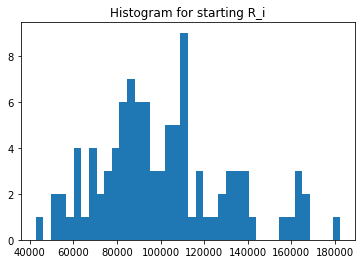

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([234991.00271916, 260881.87719685, 259881.87719685, ...,
       225174.51909863,  89141.60537311, 177369.30901628])

In [24]:
experiments.UNI_Si.unique()

array([10000., 15217., 15802., 15353., 14247., 13662., 14500., 17462.,
       14507., 13552., 14975., 12725., 14097., 14602., 16113., 16994.,
       15241., 14642., 15593., 15259., 17160., 13059., 19867., 16920.,
       14644., 15078., 15704., 13503., 15871., 16089., 13727., 18293.,
       14432., 15136., 14402., 13950., 14645., 14618., 15529., 16358.,
       13560., 15558., 15458., 16426., 17944., 14021., 17029., 13758.,
       15677., 14446., 13479., 16681., 13047., 15842., 17419., 14398.,
       15512., 16151., 19277., 14551., 15759., 16311., 14009., 13043.,
       13825., 13003., 14188., 14386., 15754., 14459., 13509., 15625.,
       15555., 14351., 13973., 15336., 21123., 13716., 14117., 15256.,
       15255., 14816., 14941., 12938., 15079., 13199., 15934., 17135.,
       14302., 14739., 17746., 18602., 16683., 16762., 17781., 13728.,
       15614., 15070., 18697., 19850., 15094., 15554., 14379., 16244.,
       14862., 15285., 15658., 14849., 14400., 18093., 16780., 21084.,
      

In [25]:
experiments.UNI_Qj.unique()

array([126330.07812691, 233252.16996651, 206574.98846482, 169846.10648696,
       151424.95502607, 173015.60755103, 264092.20102653, 166417.74691397,
       135860.52037312, 145009.08008456, 158609.30970373, 122316.11432838,
       141670.10928841, 204500.90842904, 366476.50947373, 120902.33976273,
       148879.41820321, 258216.76280729, 315340.92787112, 133481.04343618,
       483603.23970664, 126885.68213811, 214392.97531279, 258547.82266997,
       291310.35266732, 407207.78853768, 245035.8463788 , 247504.79879941,
       241968.36169322, 145757.26495268, 133862.34756376, 219960.19424527,
       233233.96268078, 233207.10325291, 220239.69298769, 236923.15895959,
       118692.93838739, 216941.02745761, 215325.15490295, 233907.20126638,
       134127.06743443, 305700.71055729, 252163.28119865, 186006.74659839,
       257776.12548476, 130282.6858949 , 212352.62028627, 217603.25257227,
       215660.46618058, 141275.7031774 , 151935.21055775, 330767.26002767,
       148395.17811222, 1

In [26]:
experiments.UNI_Rj.unique()

array([ 63165.03906345, 116626.08498325, 103287.49423241,  84923.05324348,
        75712.47751304,  86507.80377551, 132046.10051326,  83208.87345698,
        67930.26018656,  72504.54004228,  79304.65485187,  61158.05716419,
        70835.0546442 , 102250.45421452, 183238.25473686,  60451.16988137,
        74439.70910161, 129108.38140364, 157670.46393556,  66740.52171809,
       241801.61985332,  63442.84106905, 107196.4876564 , 129273.91133498,
       145655.17633366, 203603.89426884, 122517.9231894 , 123752.39939971,
       120984.18084661,  72878.63247634,  66931.17378188, 109980.09712264,
       116616.98134039, 116603.55162645, 110119.84649385, 118461.57947979,
        59346.46919369, 108470.5137288 , 107662.57745148, 116953.60063319,
        67063.53371722, 152850.35527864, 126081.64059932,  93003.37329919,
       128888.06274238,  65141.34294745, 106176.31014314, 108801.62628614,
       107830.23309029,  70637.8515887 ,  75967.60527887, 165383.63001383,
        74197.58905611,  

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 63165.03906345,  84923.05324348, 116626.08498325,  75712.47751304,
       132046.10051326,  83208.87345698,  67930.26018656, 103287.49423241,
        79304.65485187,  70835.0546442 ,  86507.80377551,  60451.16988137,
       183238.25473686, 102250.45421452, 157670.46393556,  66740.52171809,
        74439.70910161, 129108.38140364,  63442.84106905, 129273.91133498,
       145655.17633366, 203603.89426884, 123752.39939971,  72504.54004228,
       122517.9231894 , 120984.18084661,  72878.63247634,  61158.05716419,
       107196.4876564 , 110119.84649385, 116603.55162645,  59346.46919369,
       108470.5137288 , 107662.57745148, 152850.35527864, 128888.06274238,
       126081.64059932,  65141.34294745,  66931.17378188,  93003.37329919,
       106176.31014314, 118461.57947979, 108801.62628614, 107830.23309029,
       165383.63001383,  75967.60527887,  77550.68873137,  74197.58905611,
       109980.09712264,  70637.8515887 , 116953.60063319, 111902.14637153,
       130220.87599479,  

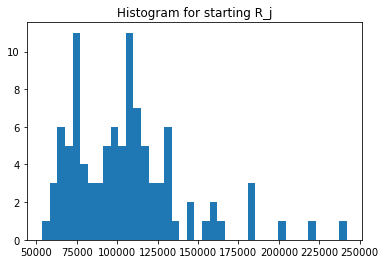

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([117495.50135958,  90450.43859842,  82286.50855935,  90966.24299436,
       112290.1753212 , 103201.2395389 , 136945.82644319, 112969.63603961,
       111351.95223329,  68824.92112422, 135294.92838467, 118128.51273943,
        99562.84804397, 182437.27830573,  76154.65308934,  82257.98971196,
        92933.55858926,  94151.63401275, 102216.11620354,  89910.38007817,
        52458.35073539,  62973.06639424,  79621.8676403 , 160920.31283036,
        69829.86392356, 103666.06970946,  93117.88422135, 137252.89254509,
        83802.88617593,  85595.58086518,  86112.1172684 , 139745.82756865,
        70940.73323924, 134599.42759769,  56424.30268655, 111799.40341522,
        96315.72342097, 111092.75954931, 127086.90640676,  84516.21258366,
       106598.552709  , 105720.10723748,  84970.44067322,  76917.92516885,
        79163.38693247, 140935.80428436,  90688.81949993,  61883.43441018,
       121962.7820952 , 161561.20028609,  84201.59076479,  67282.02216372,
       130603.02513683, 1

In [31]:
experiments.UNI_ji.unique()

array([ 63165.03906345, 116626.08498325, 103287.49423241,  84923.05324348,
        75712.47751304,  86507.80377551, 132046.10051326,  83208.87345698,
        67930.26018656,  72504.54004228,  79304.65485187,  61158.05716419,
        70835.0546442 , 102250.45421452, 183238.25473686,  60451.16988137,
        74439.70910161, 129108.38140364, 157670.46393556,  66740.52171809,
       241801.61985332,  63442.84106905, 107196.4876564 , 129273.91133498,
       145655.17633366, 203603.89426884, 122517.9231894 , 123752.39939971,
       120984.18084661,  72878.63247634,  66931.17378188, 109980.09712264,
       116616.98134039, 116603.55162645, 110119.84649385, 118461.57947979,
        59346.46919369, 108470.5137288 , 107662.57745148, 116953.60063319,
        67063.53371722, 152850.35527864, 126081.64059932,  93003.37329919,
       128888.06274238,  65141.34294745, 106176.31014314, 108801.62628614,
       107830.23309029,  70637.8515887 ,  75967.60527887, 165383.63001383,
        74197.58905611,  

In [32]:
experiments.UNI_Sij.unique()

array([7.42160793e+09, 1.05488805e+10, 8.49916728e+09, 7.72513110e+09,
       8.50176737e+09, 8.92771258e+09, 1.80831624e+10, 9.40007615e+09,
       7.56416709e+09, 4.99011925e+09, 1.07295176e+10, 7.22451033e+09,
       7.05253978e+09, 1.86542946e+10, 1.39544457e+10, 4.97259171e+09,
       6.91794707e+09, 1.21557651e+10, 1.61164625e+10, 6.00066567e+09,
       1.26845142e+10, 3.99519024e+09, 8.53518455e+09, 2.08027983e+10,
       1.01710811e+10, 2.11068155e+10, 1.14086098e+10, 1.69853748e+10,
       1.01388235e+10, 6.23808888e+09, 5.76358509e+09, 1.53692597e+10,
       8.27289416e+09, 1.56947713e+10, 6.21343555e+09, 1.32439339e+10,
       5.71599811e+09, 1.20502887e+10, 1.36825039e+10, 9.88447537e+09,
       7.14887563e+09, 1.61593560e+10, 1.07132126e+10, 7.15362651e+09,
       1.02032156e+10, 9.18074756e+09, 9.62900423e+09, 6.73301830e+09,
       1.31512752e+10, 1.14123361e+10, 6.39659321e+09, 1.11273451e+10,
       9.69042959e+09, 8.29906042e+09, 9.87537959e+09, 8.46150685e+09,
      

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


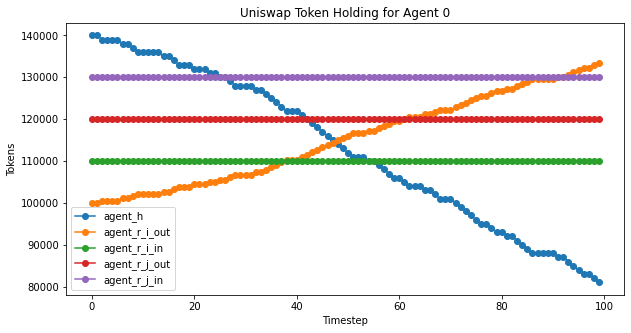

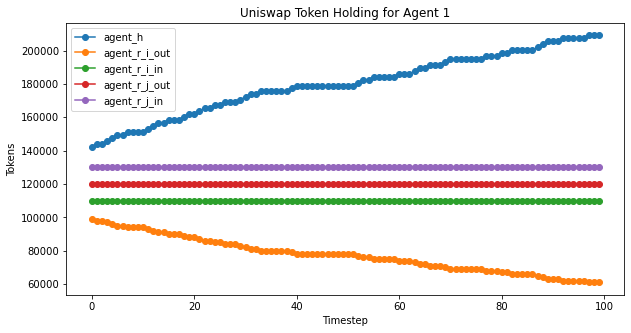

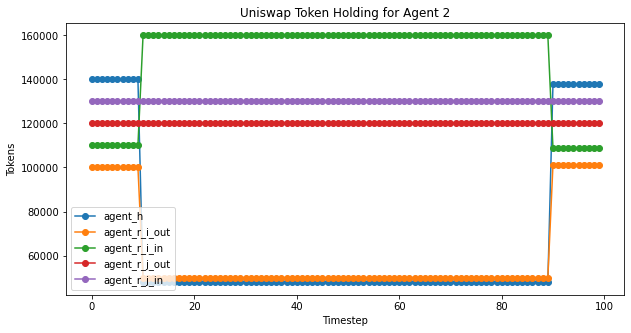

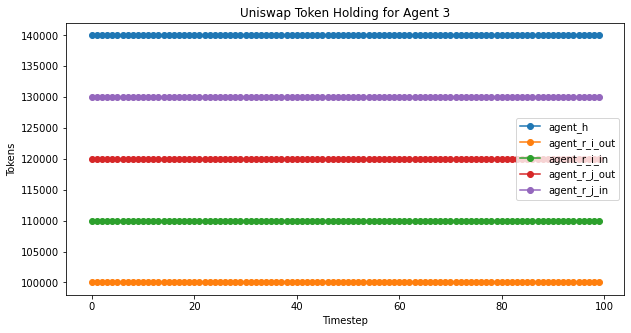

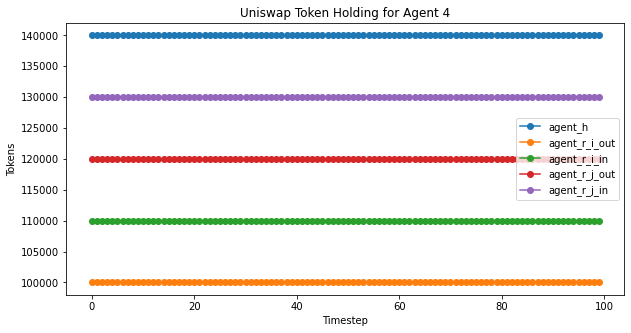

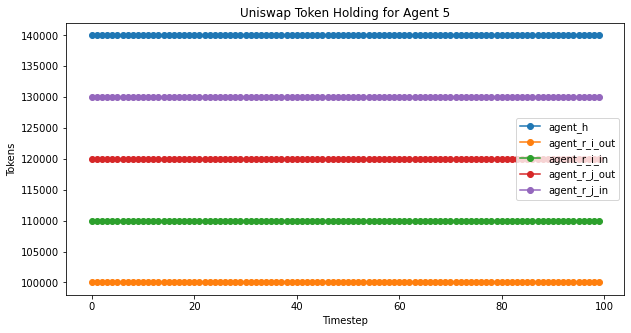

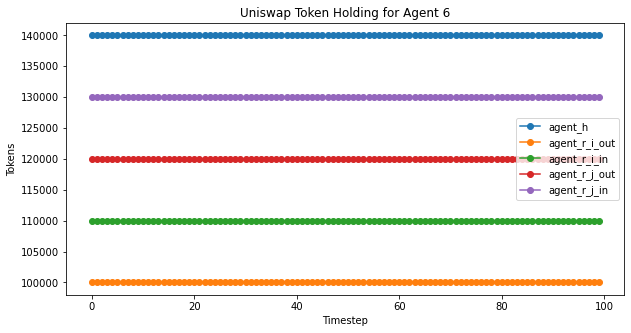

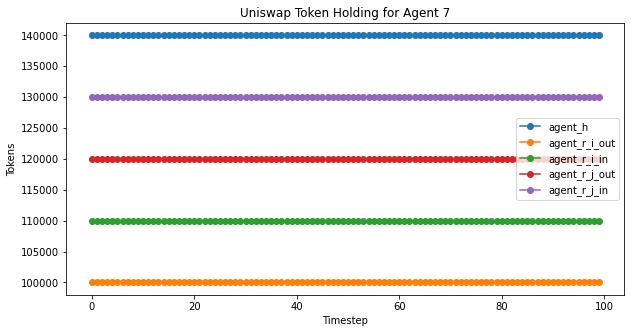

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


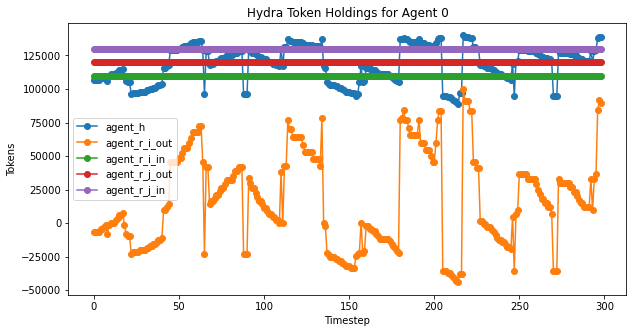

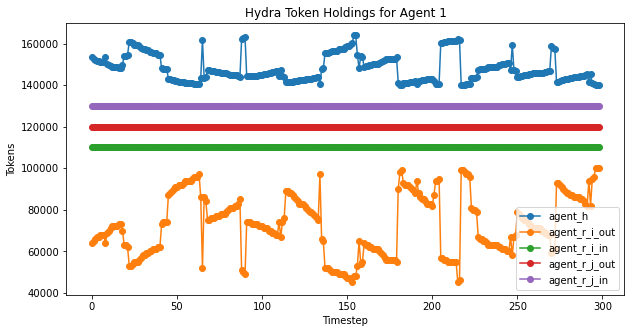

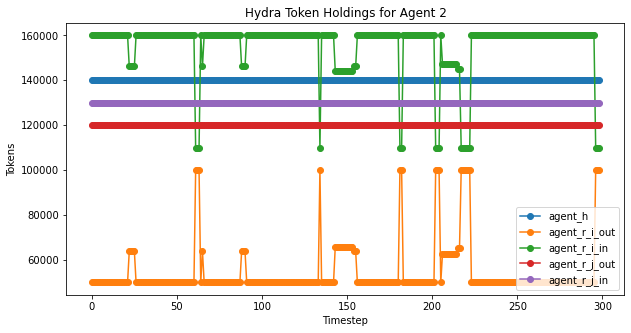

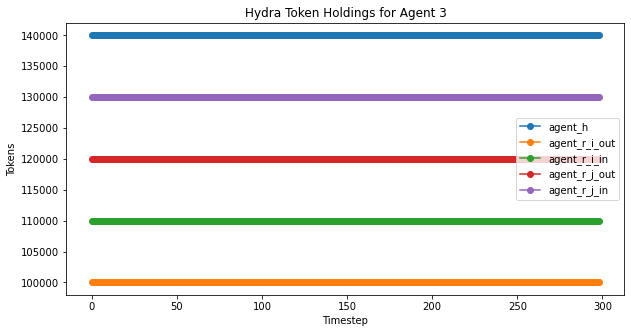

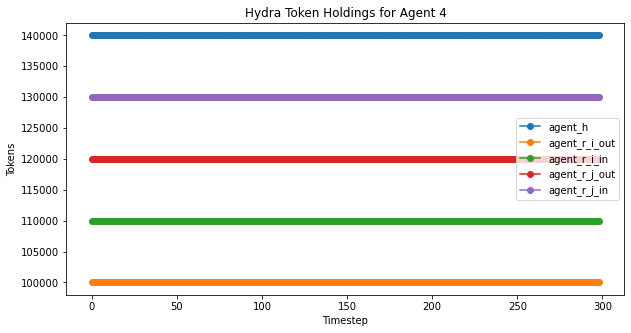

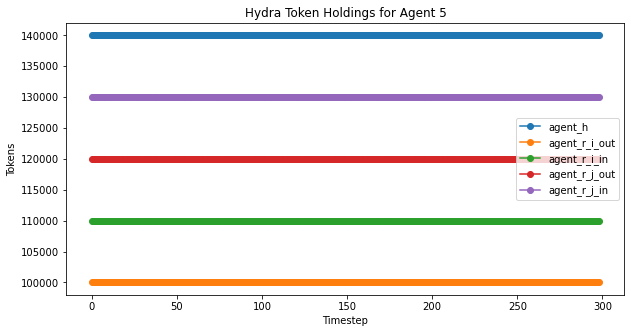

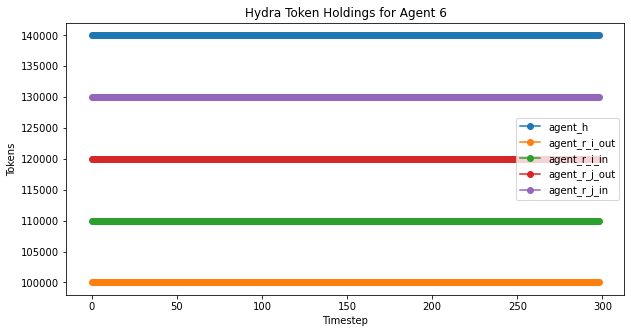

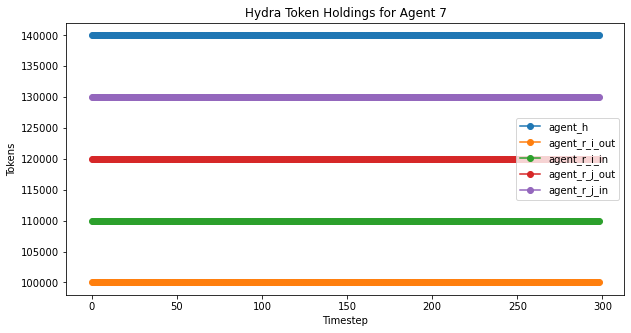

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

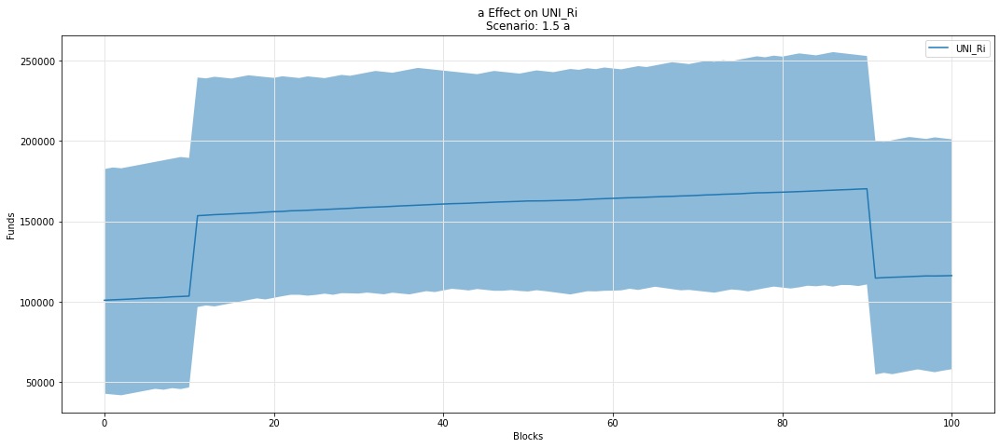

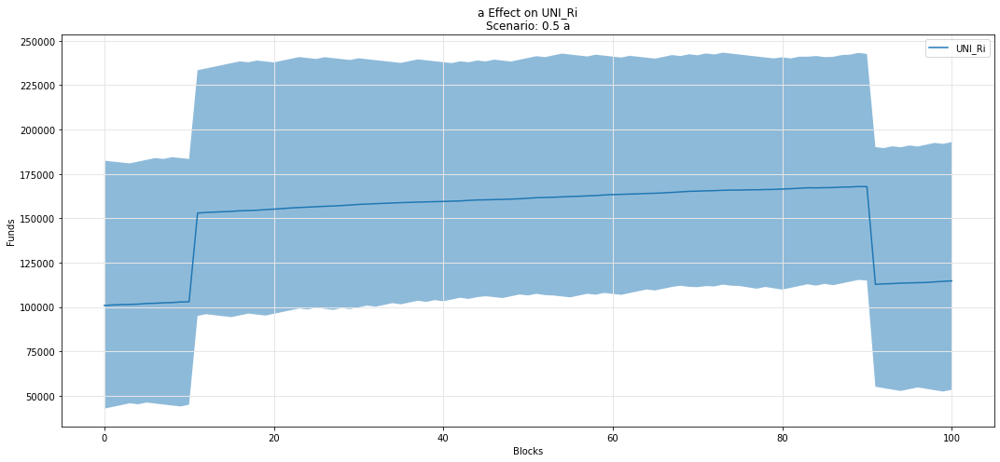

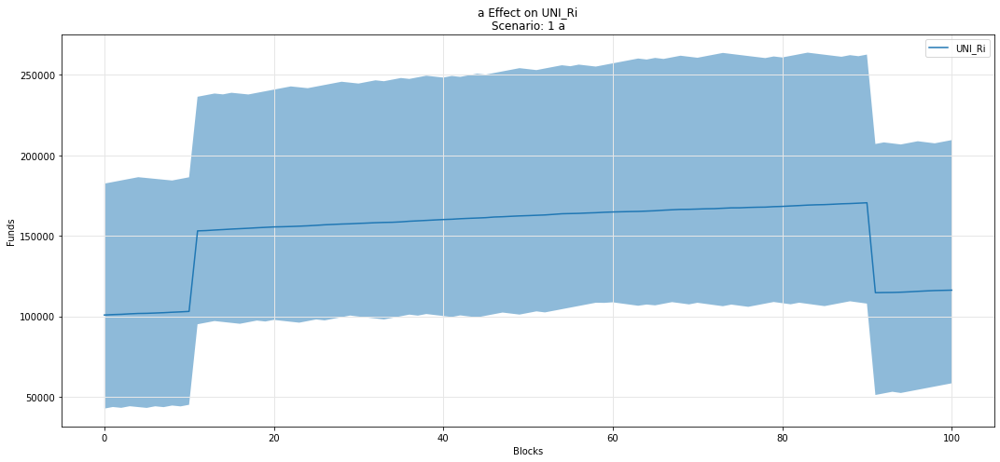

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

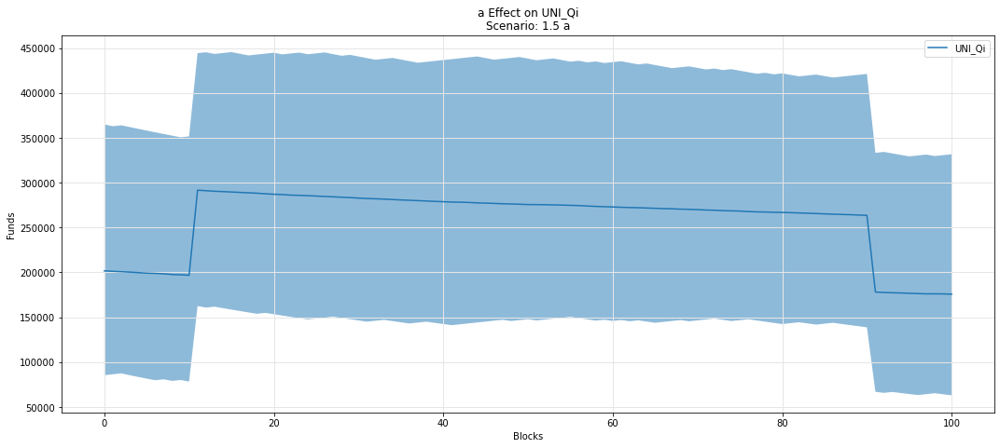

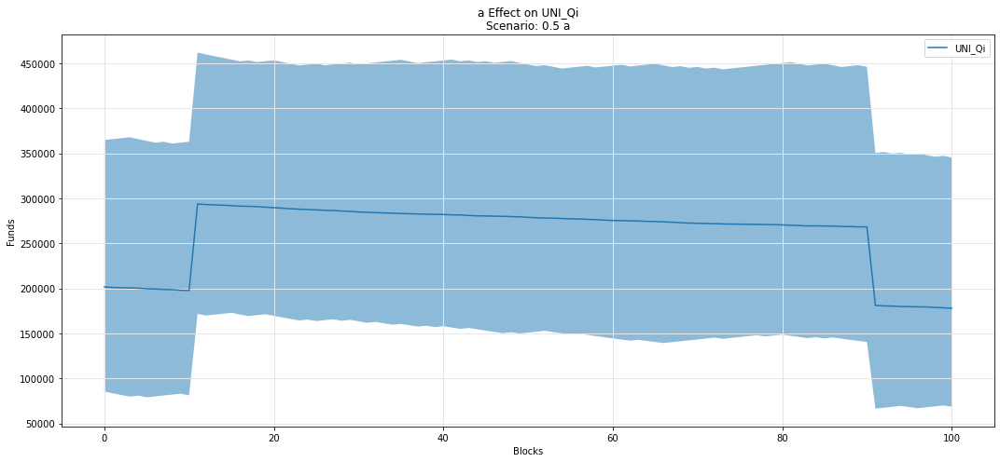

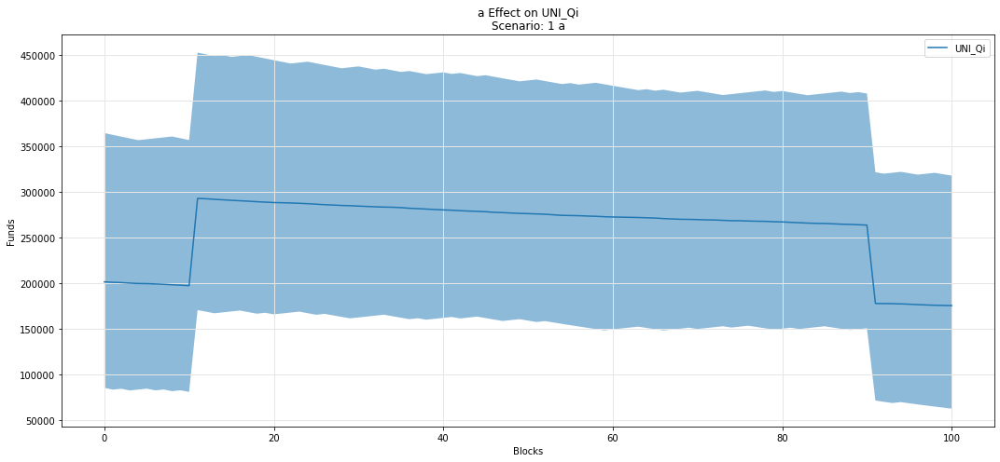

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

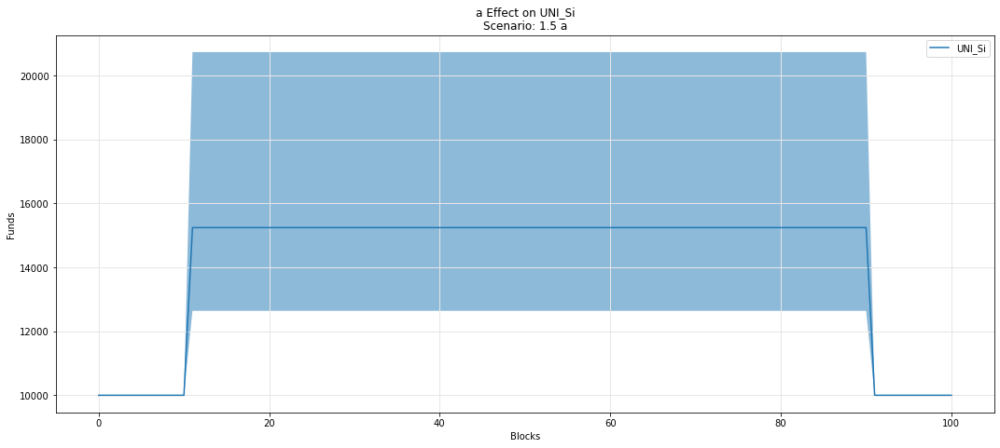

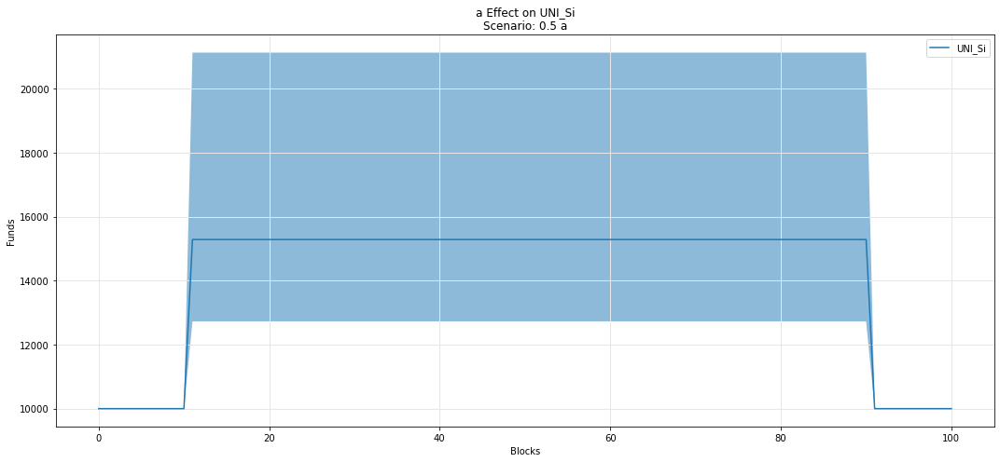

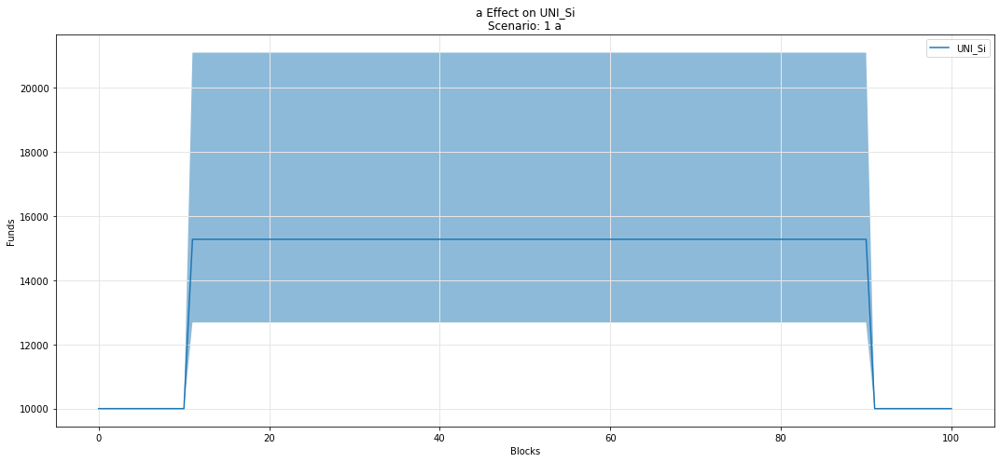

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

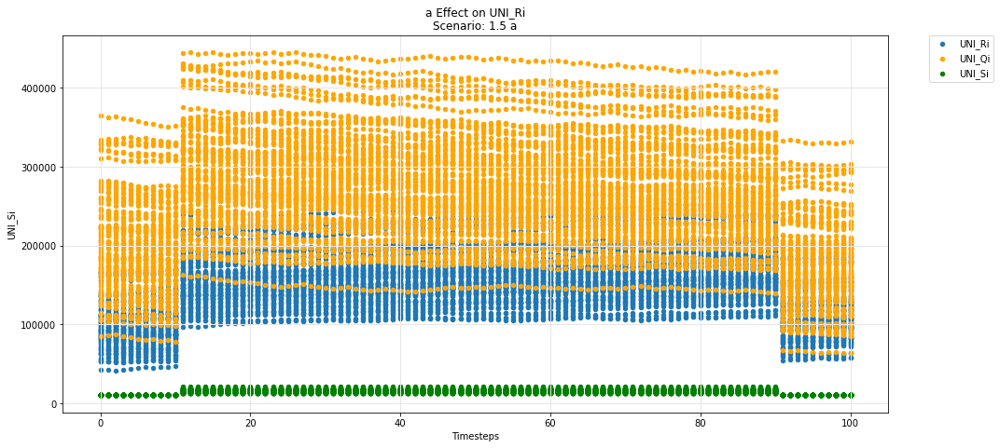

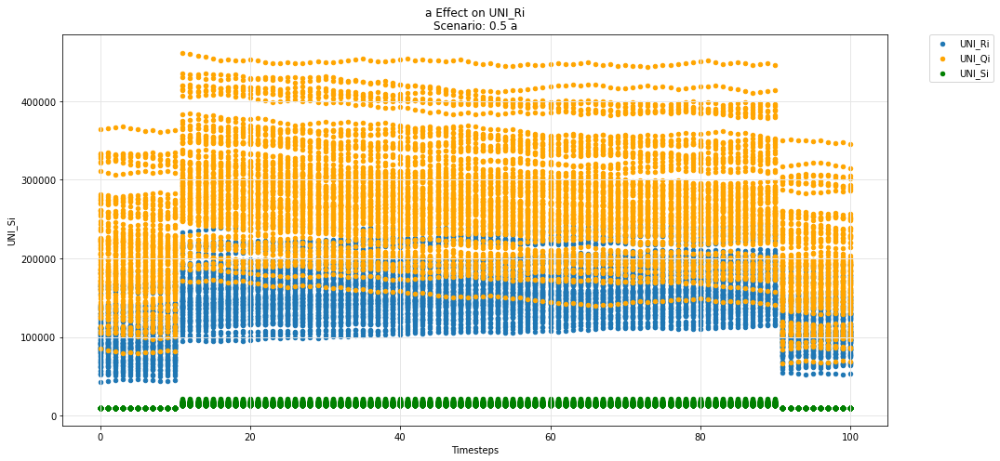

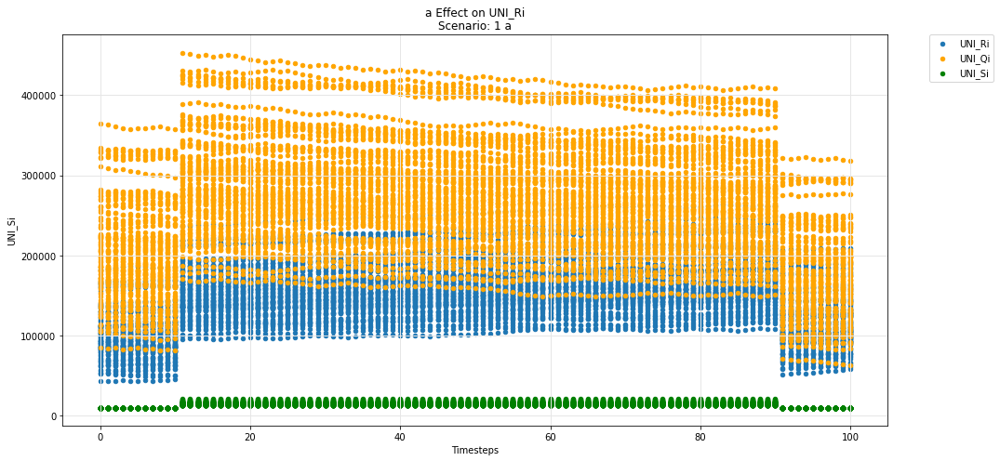

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

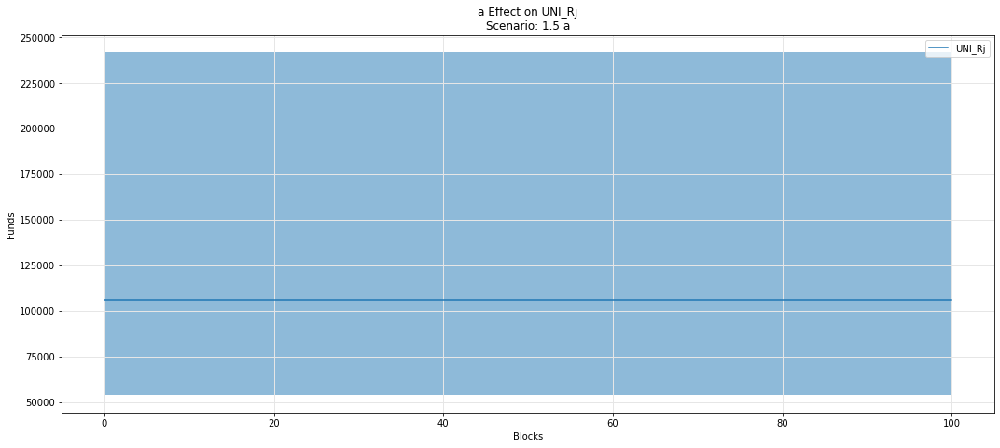

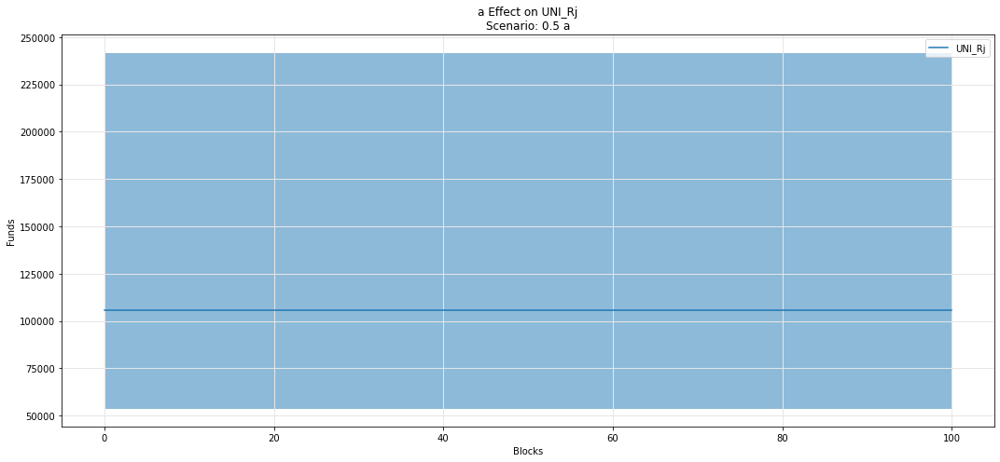

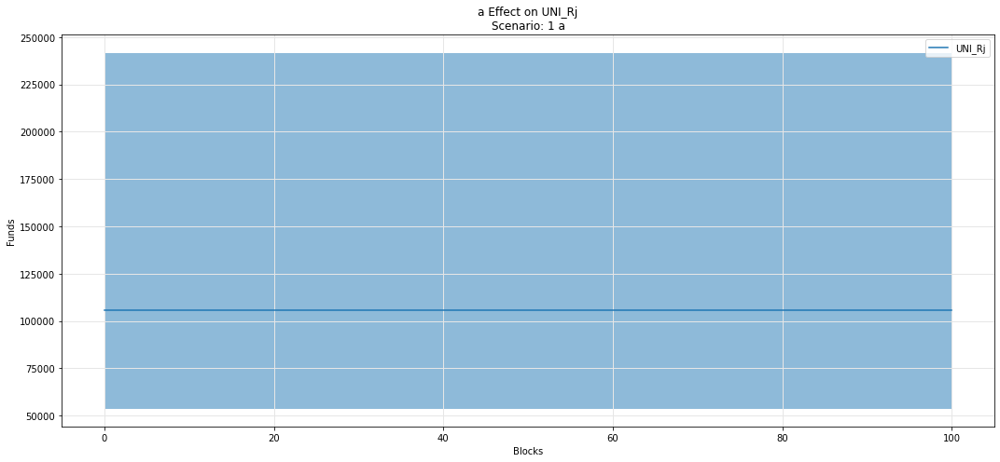

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

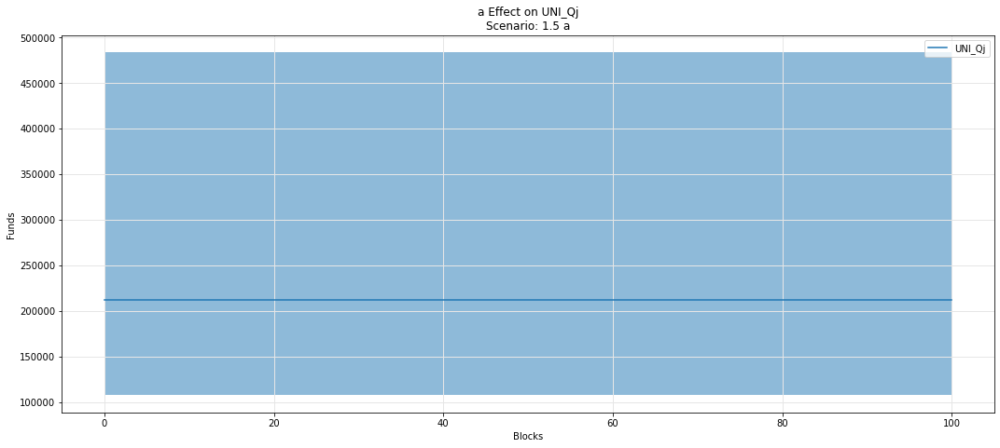

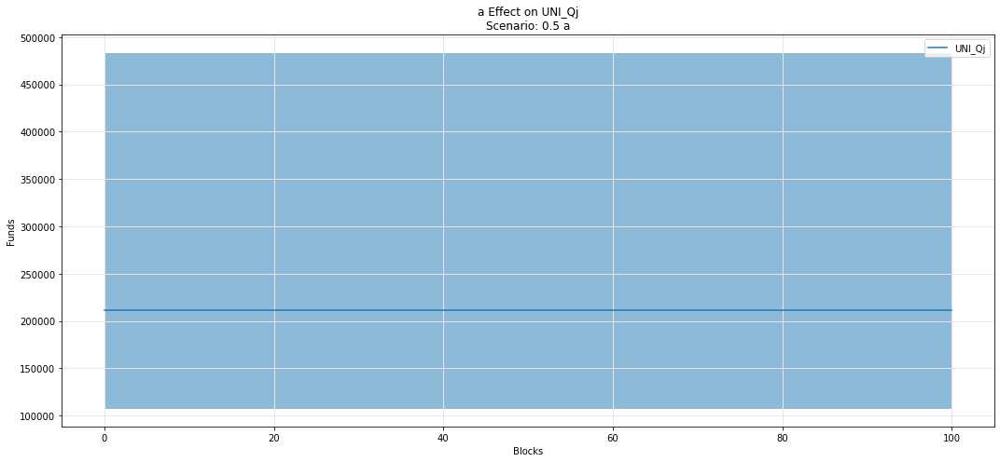

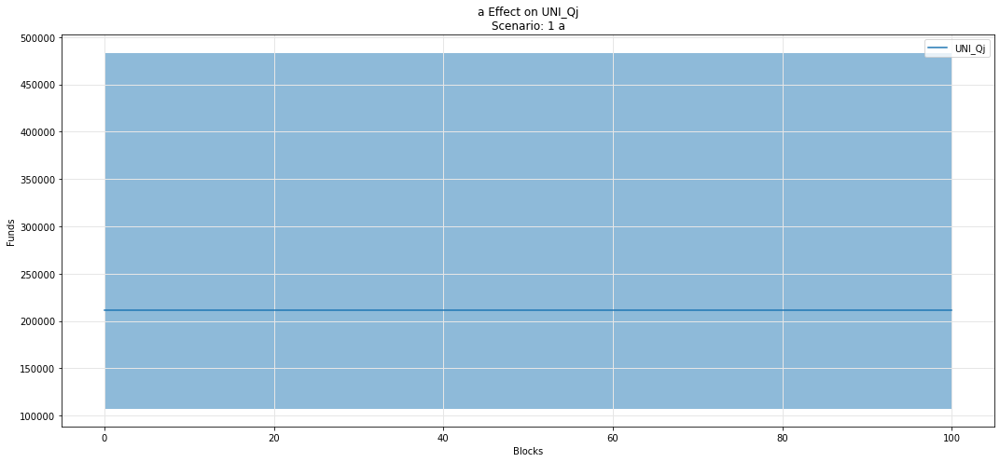

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

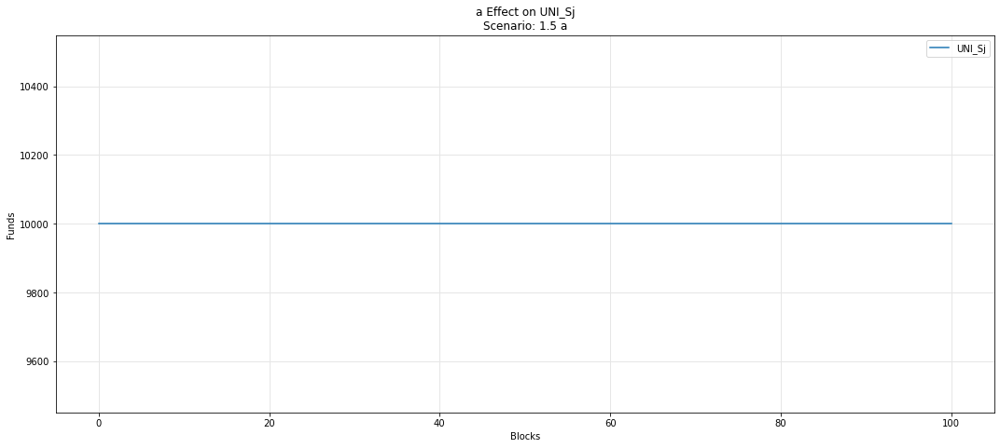

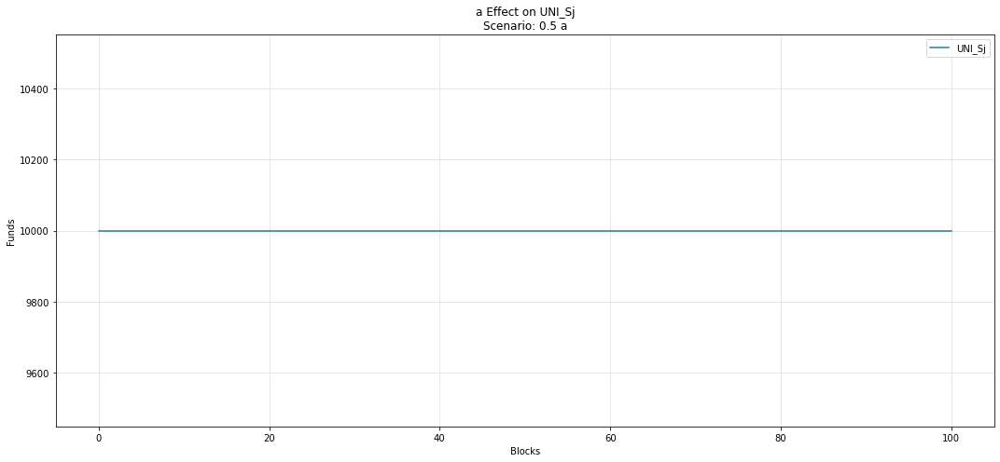

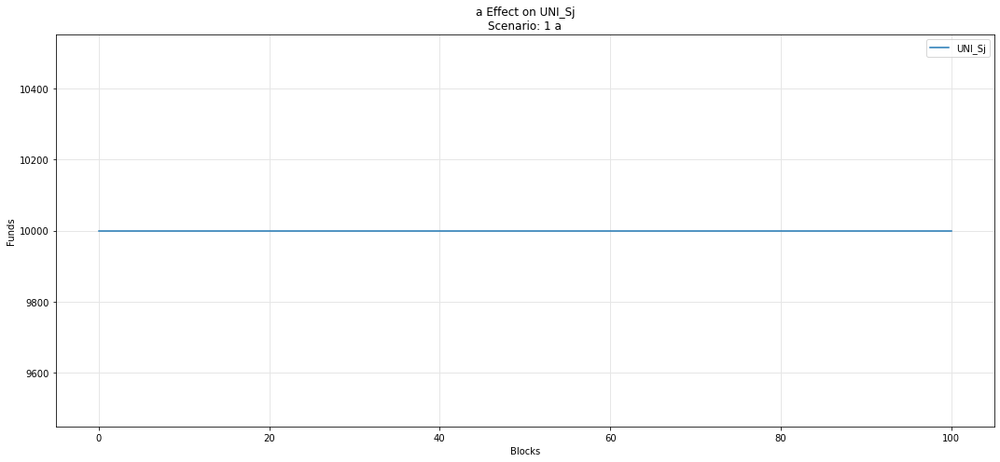

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

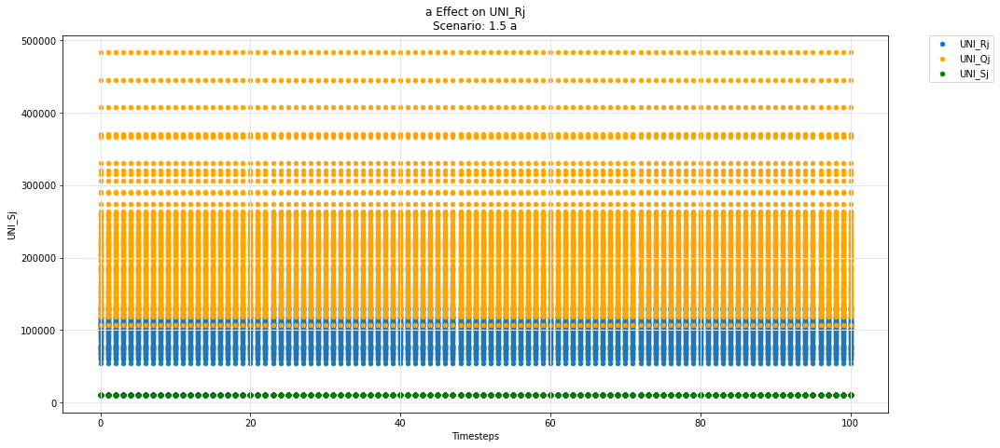

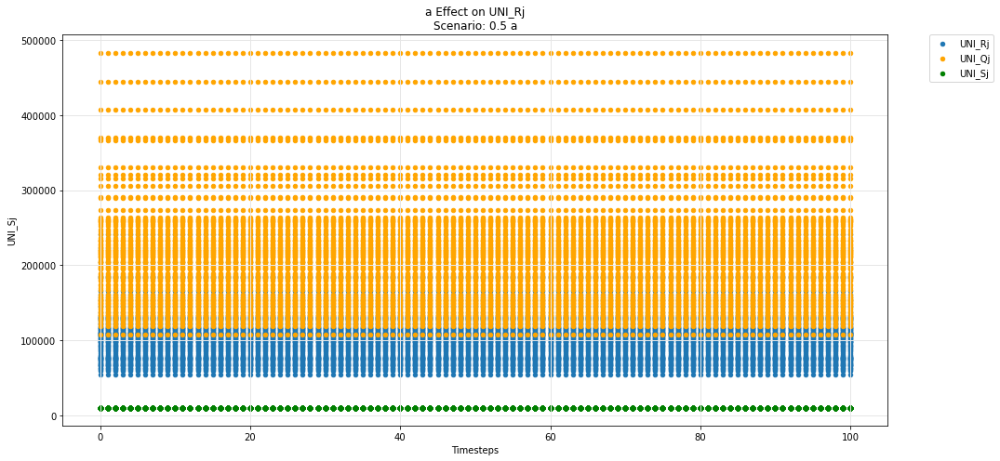

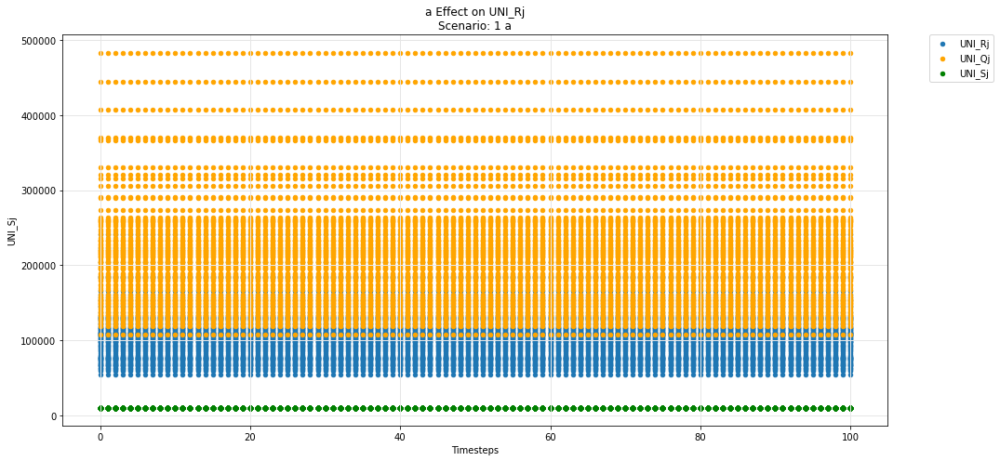

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

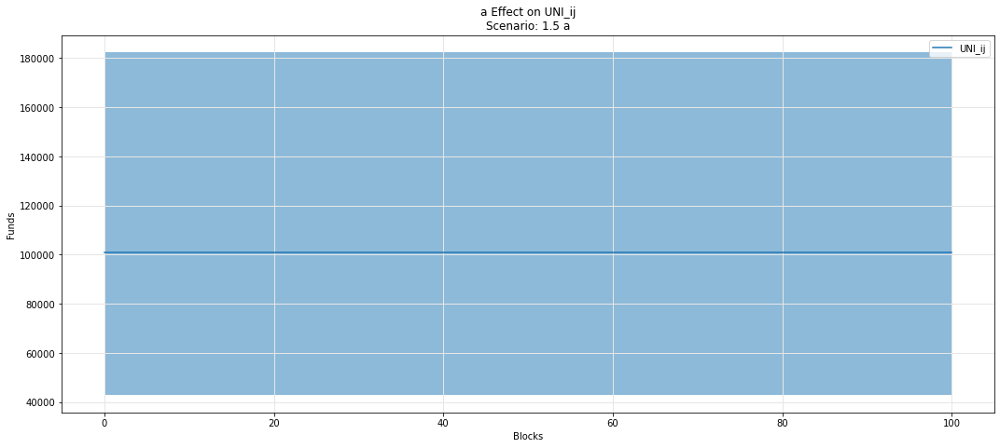

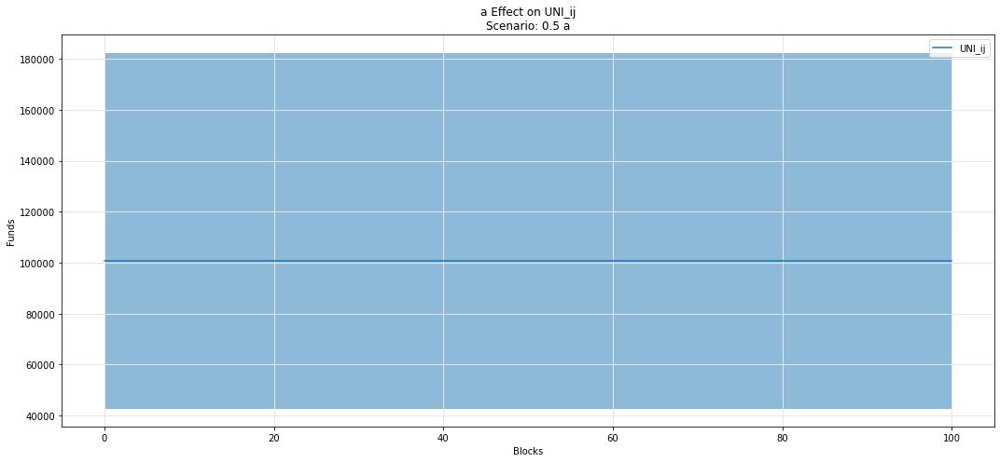

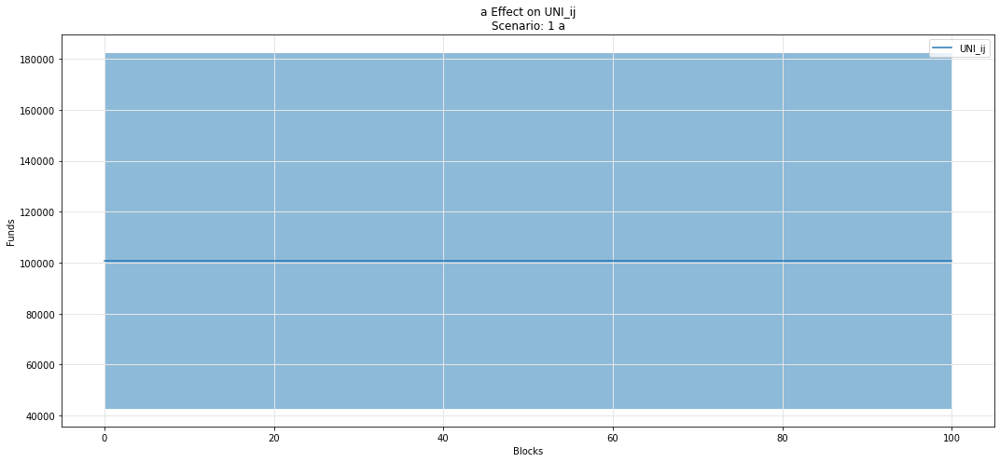

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

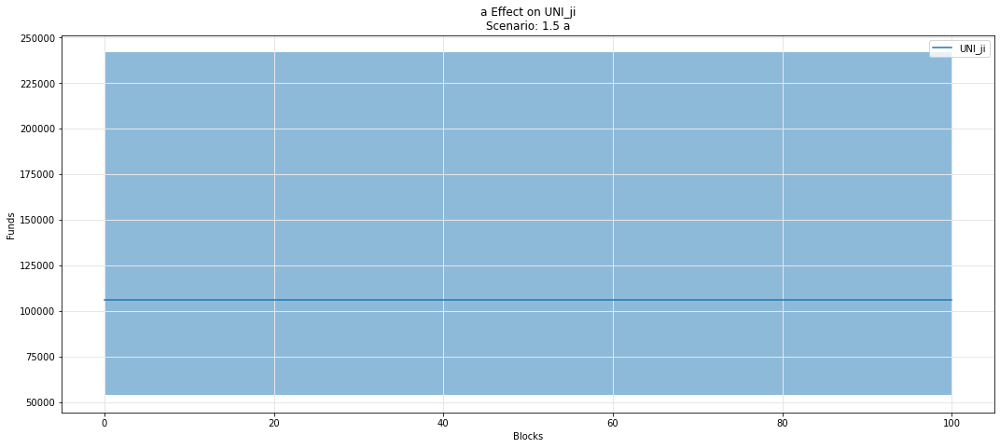

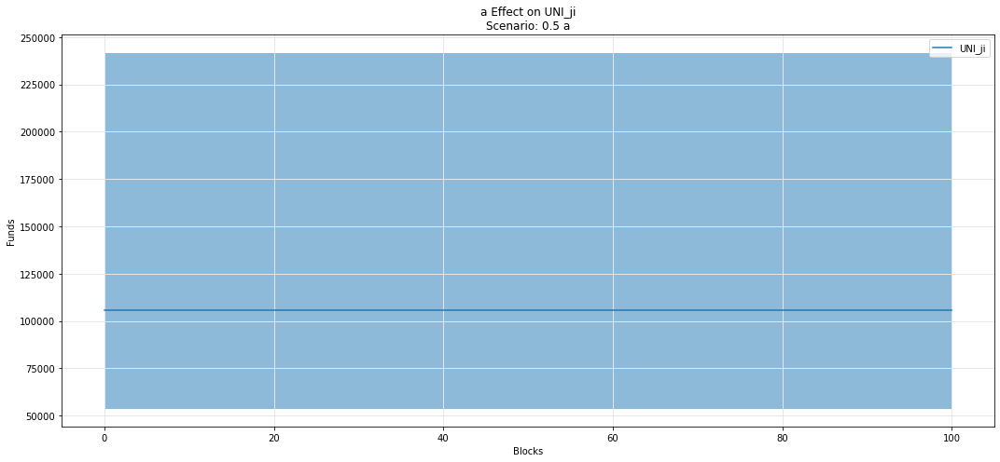

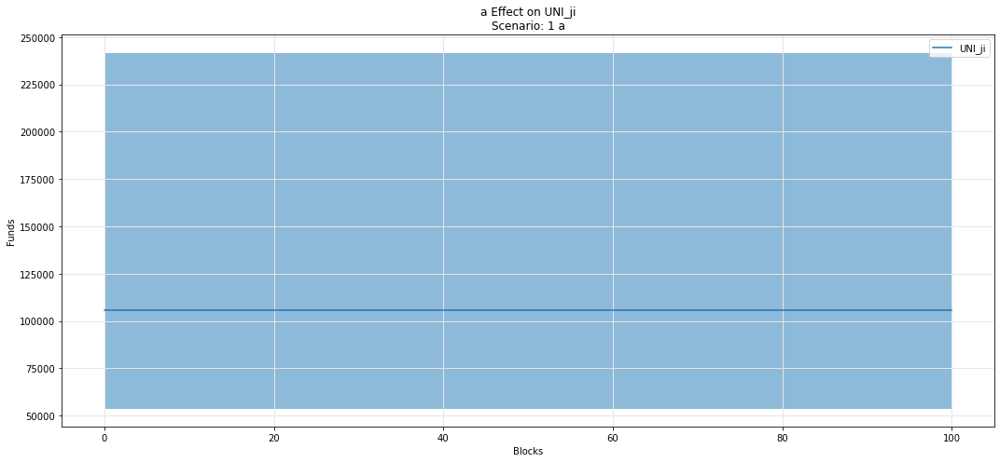

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

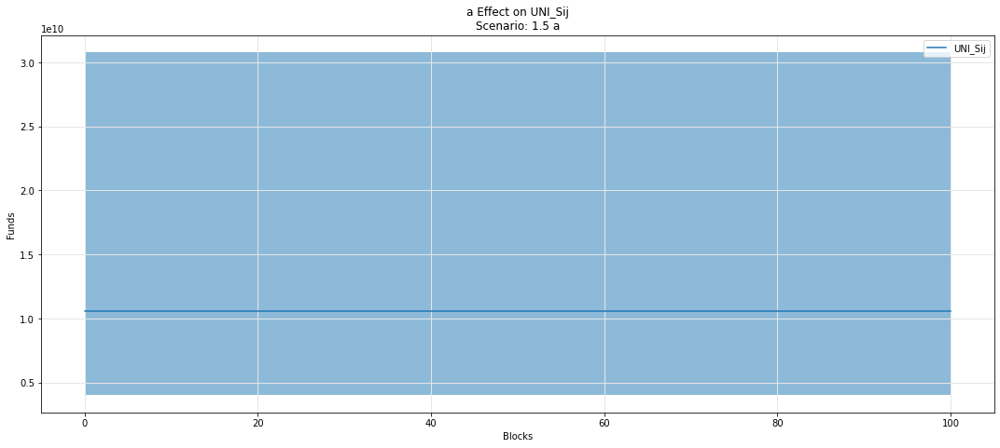

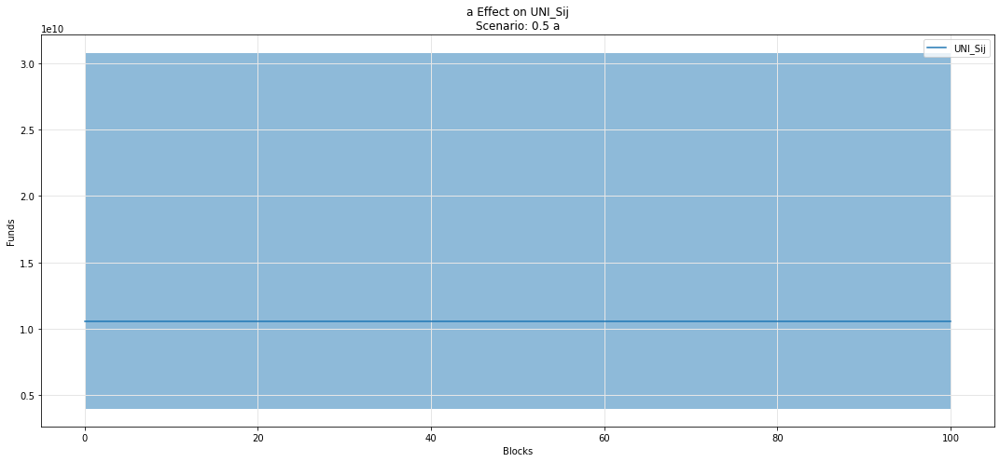

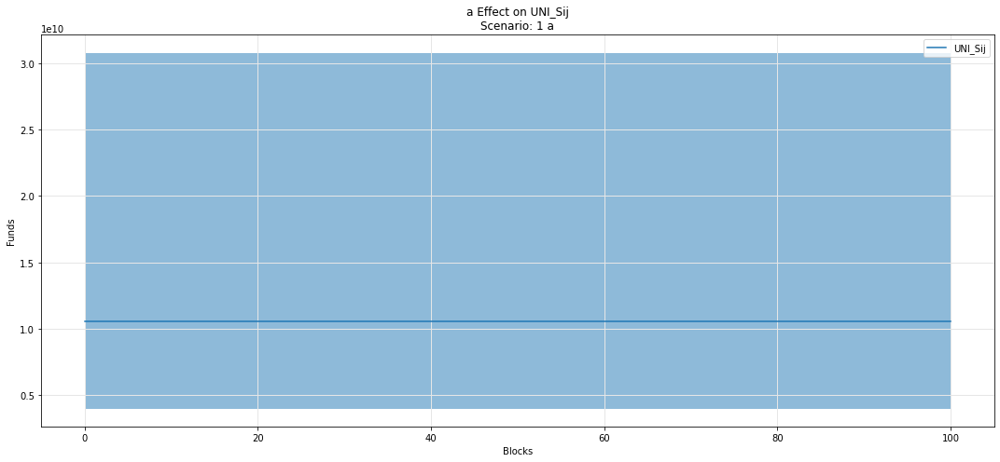

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

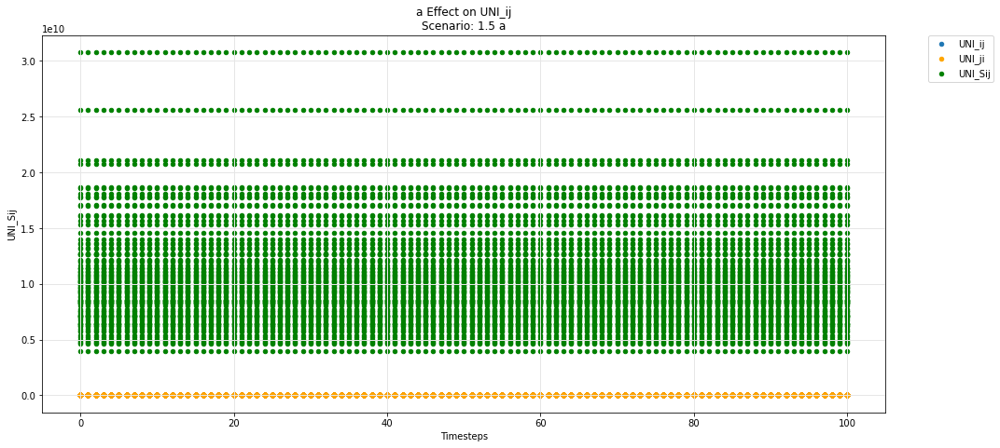

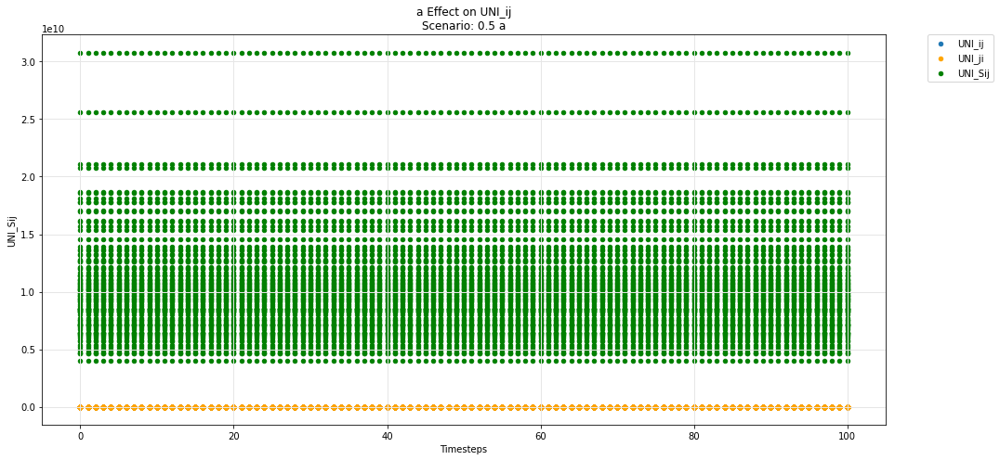

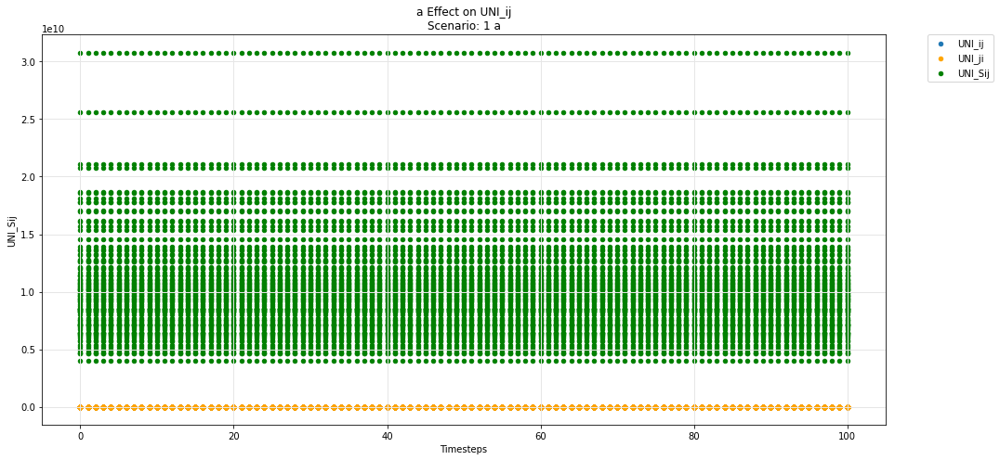

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

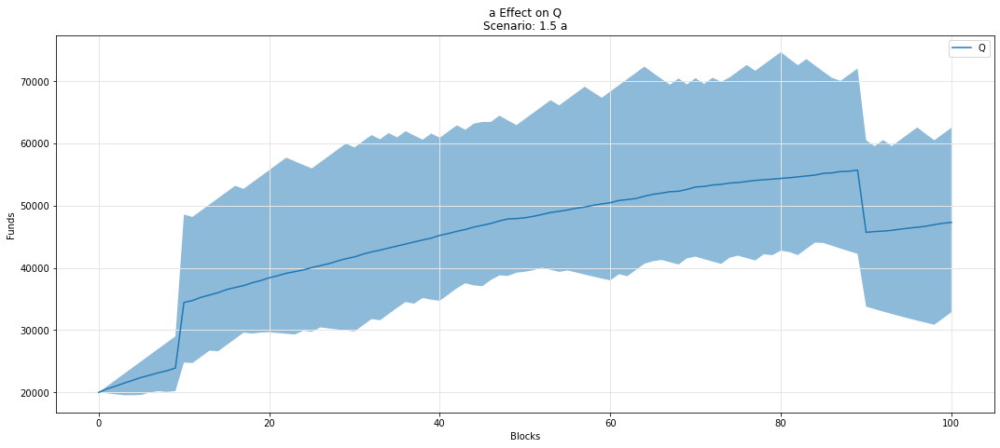

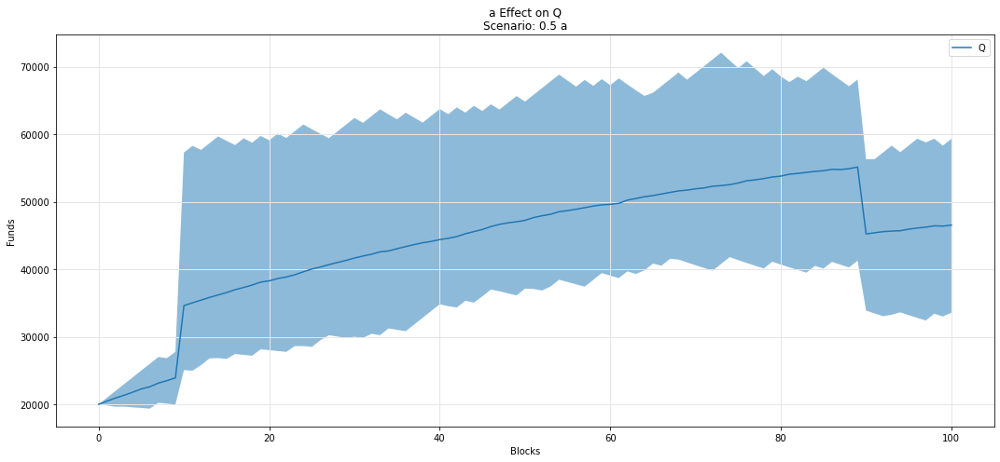

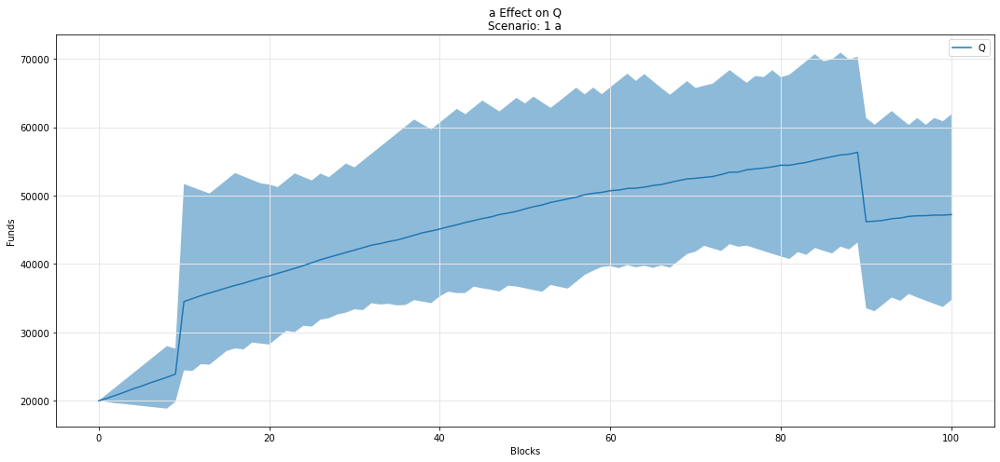

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

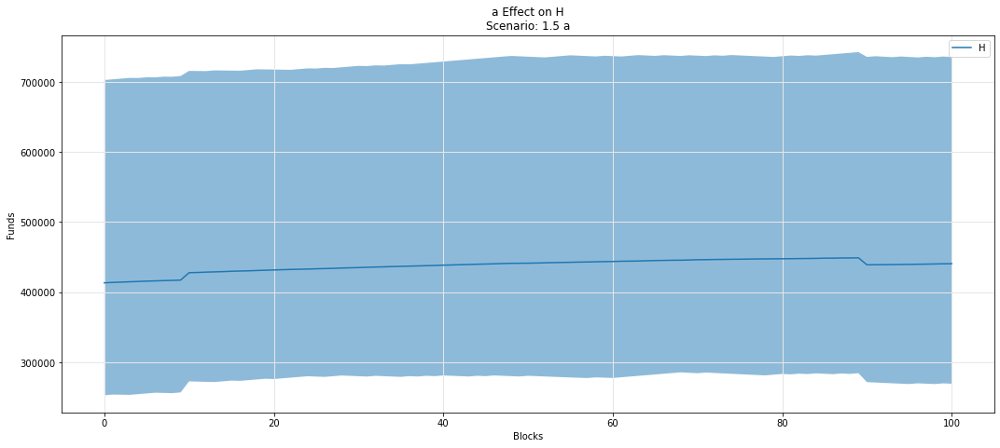

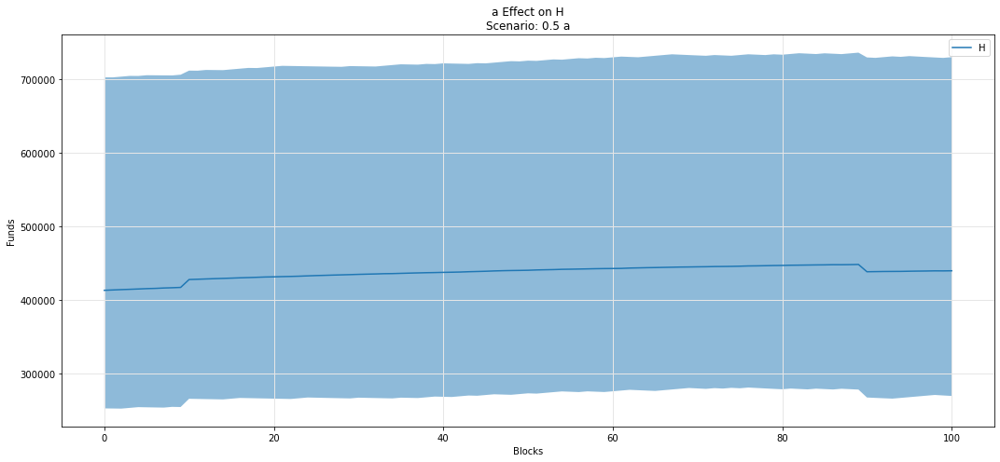

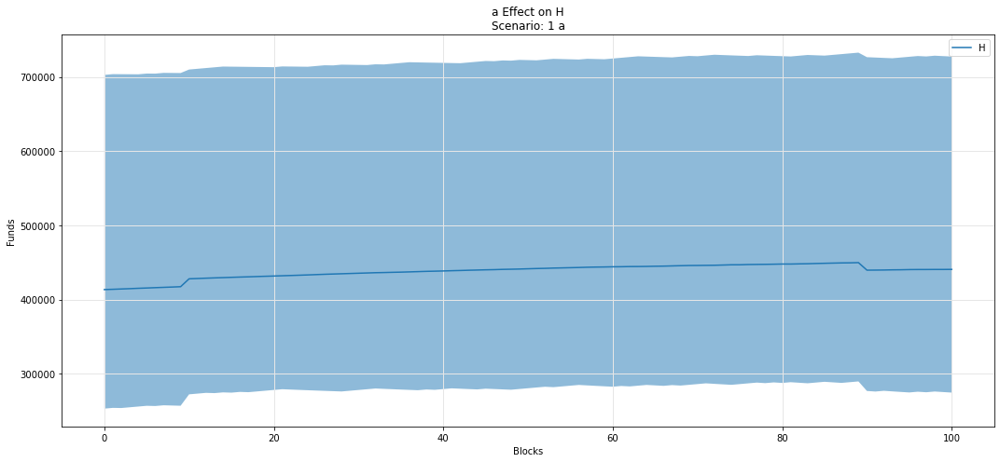

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

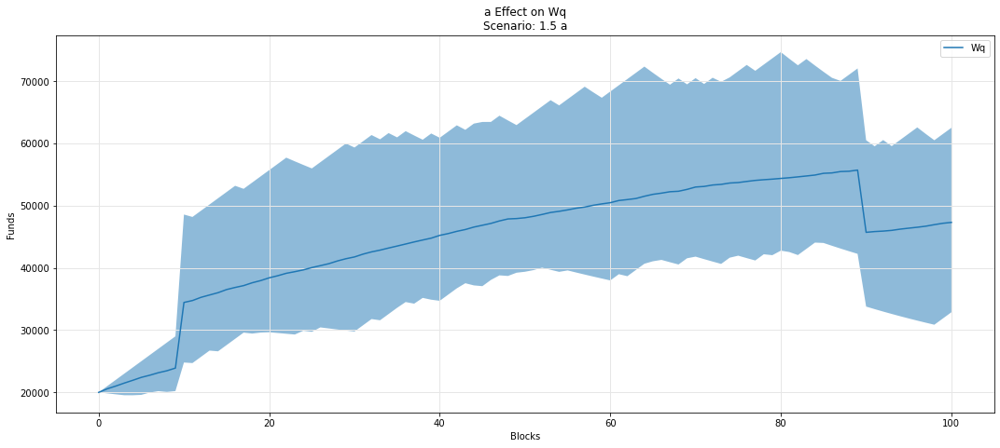

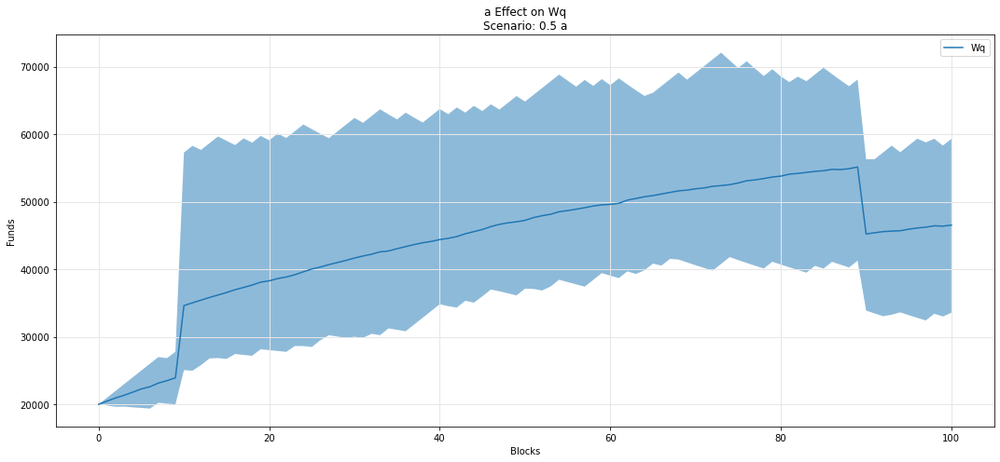

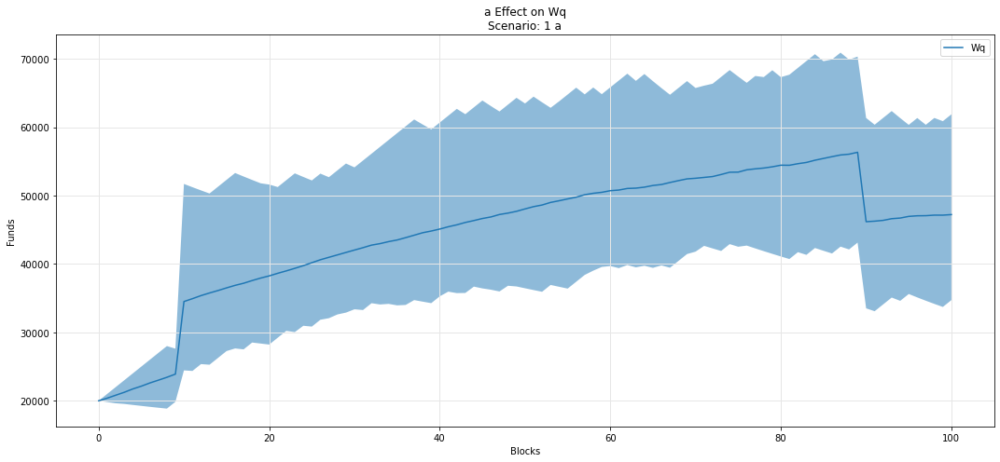

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

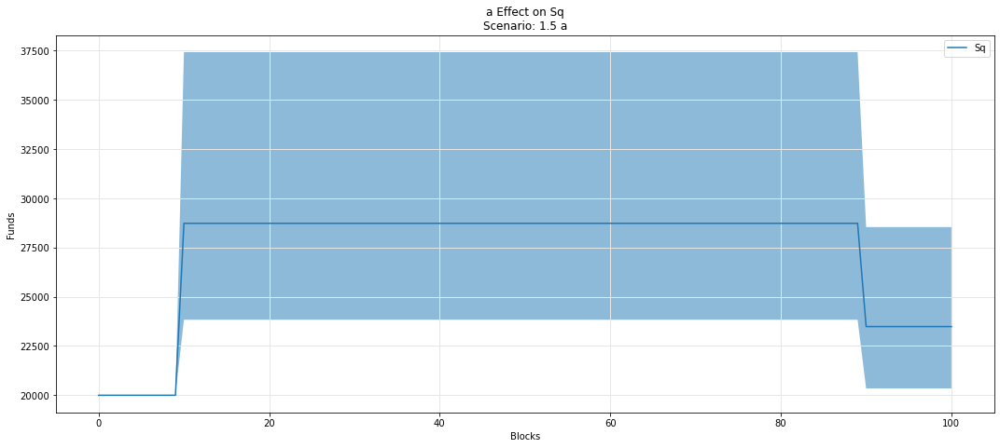

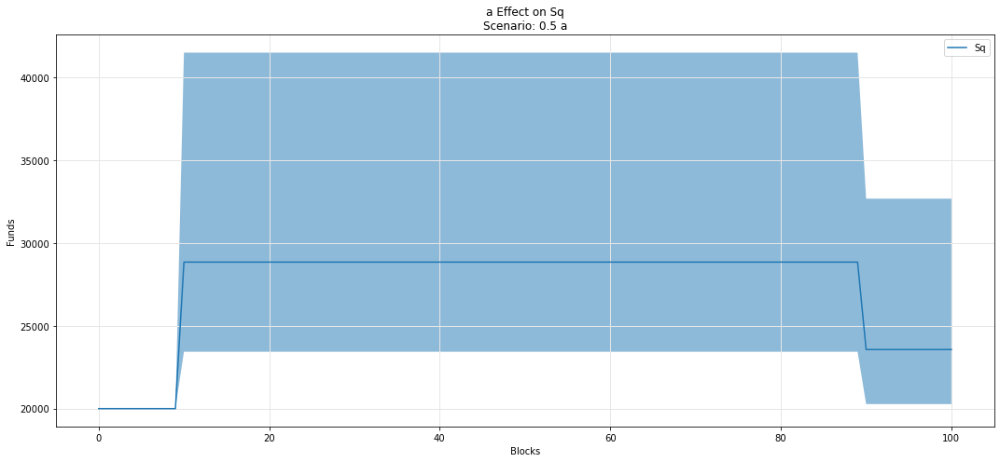

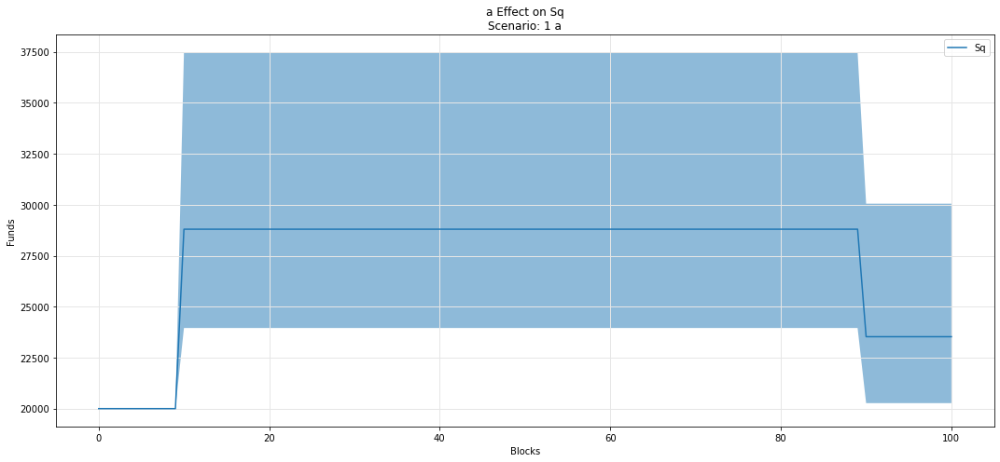

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

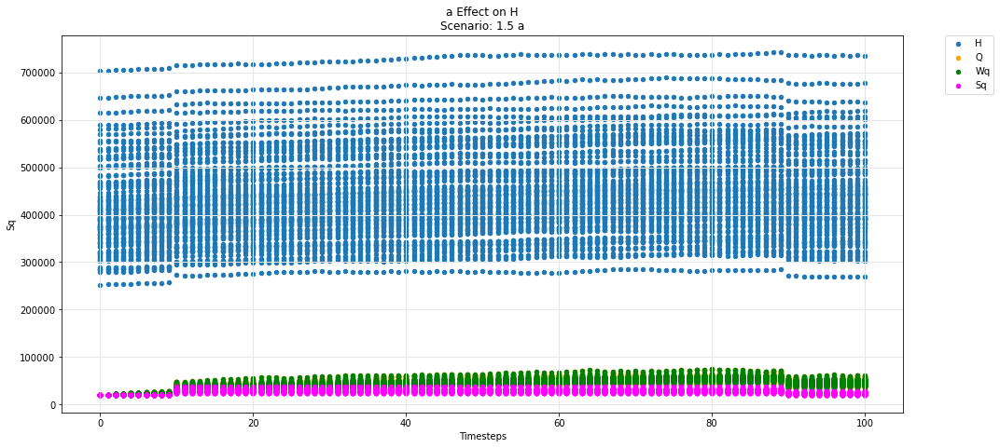

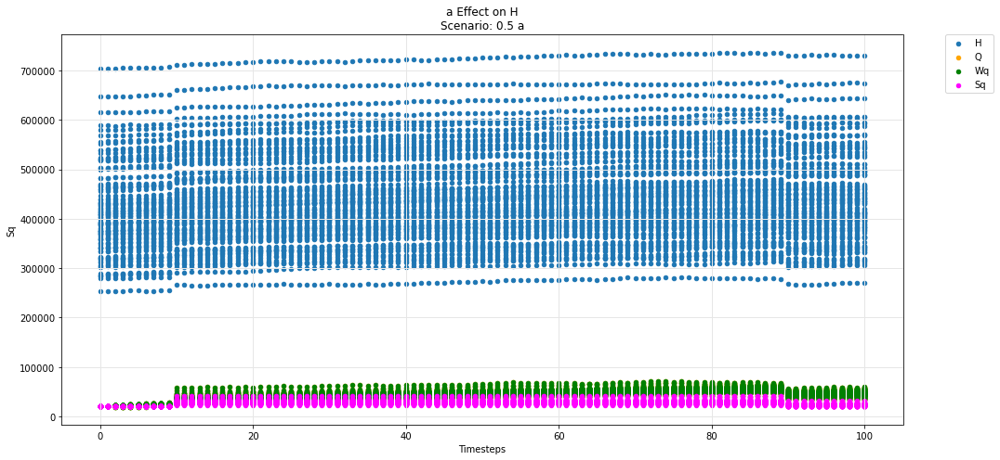

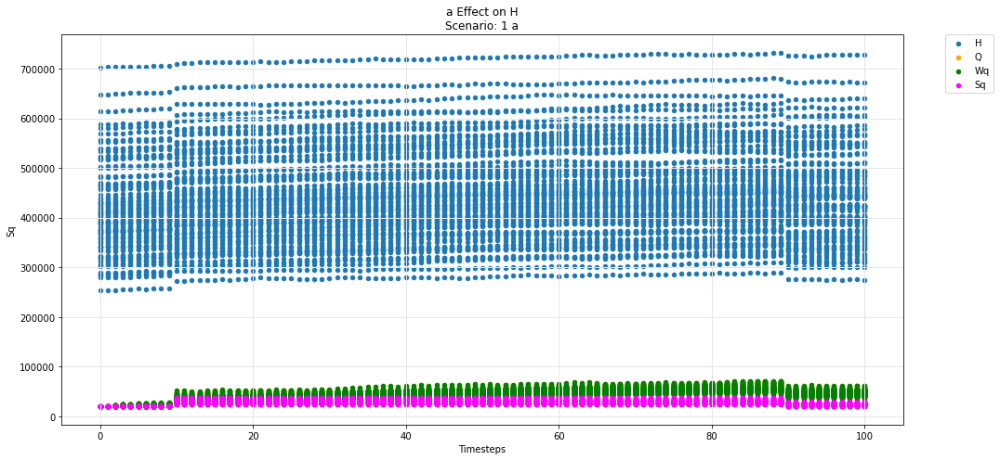

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

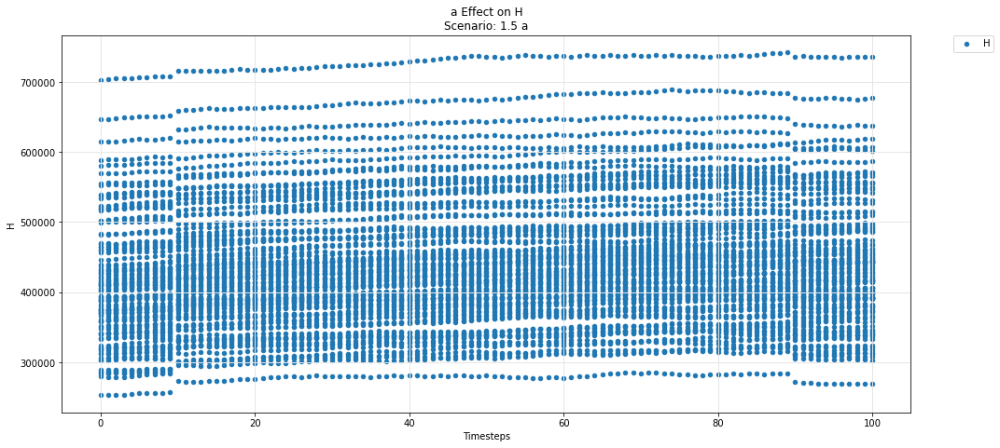

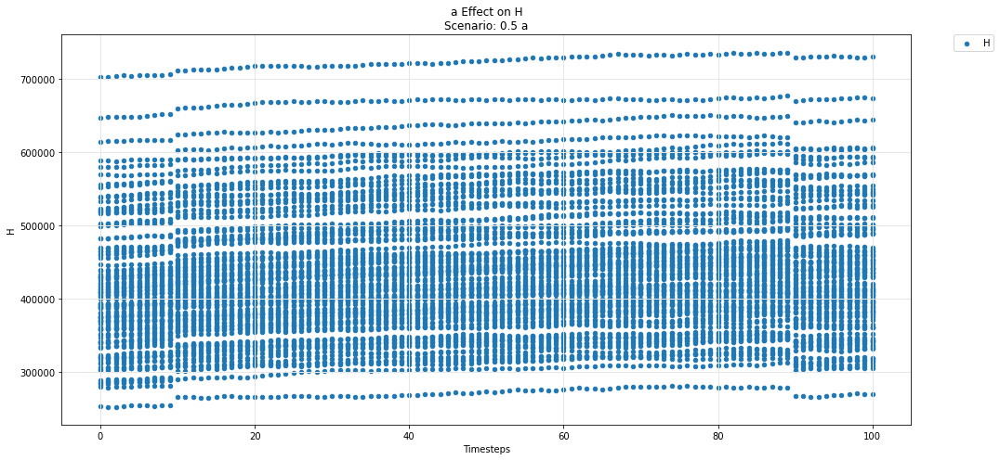

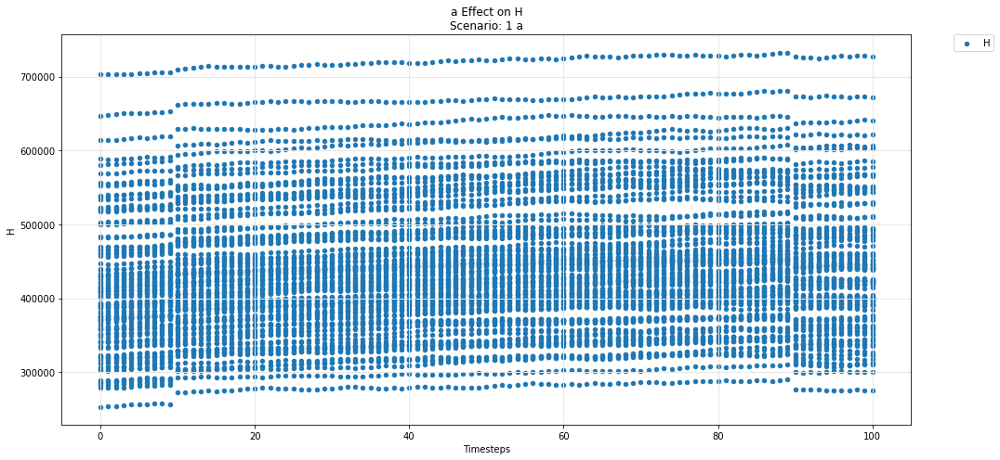

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

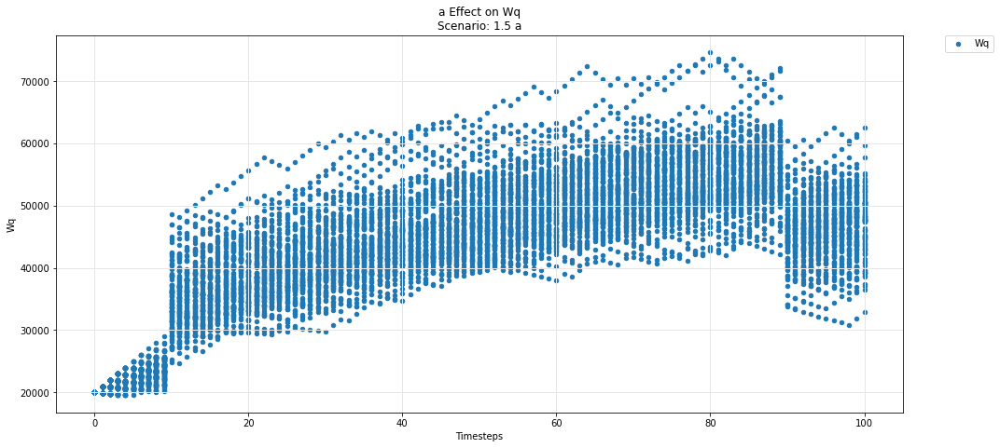

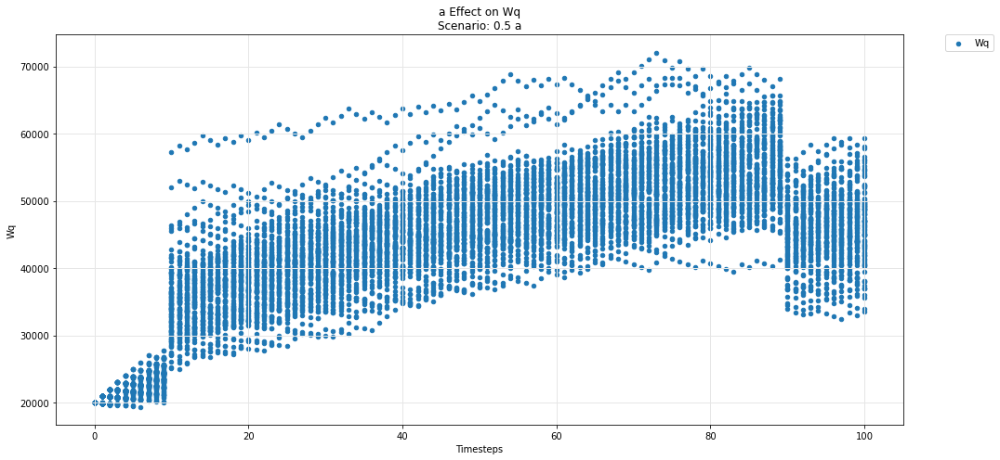

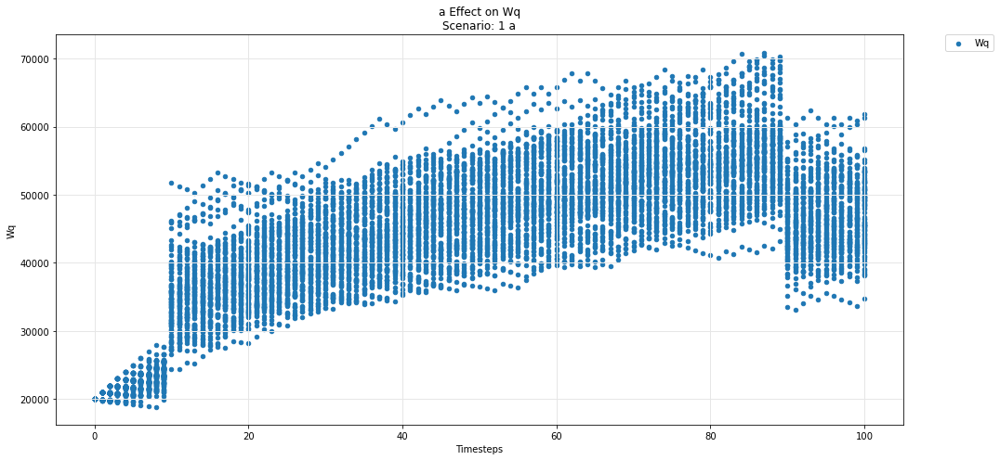

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

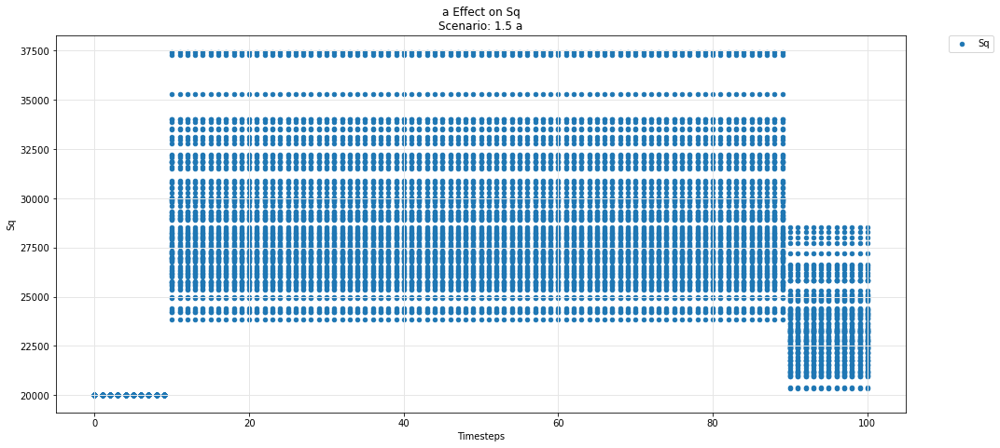

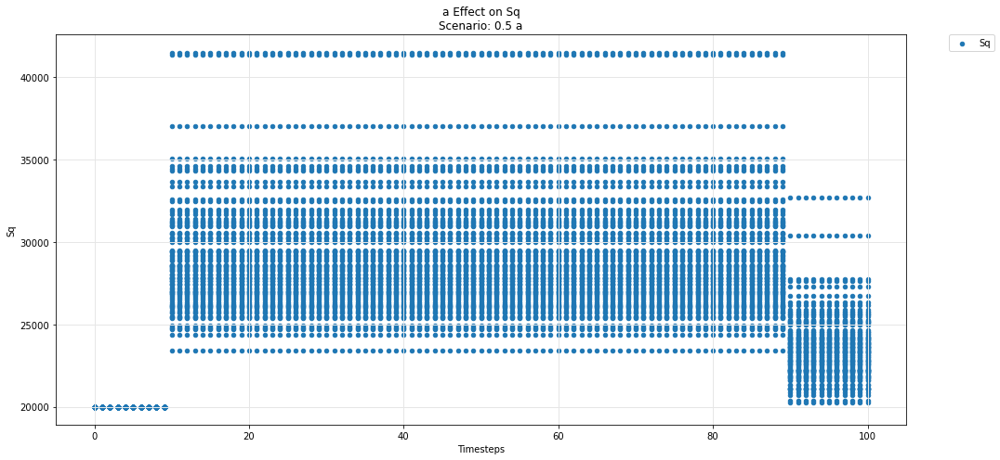

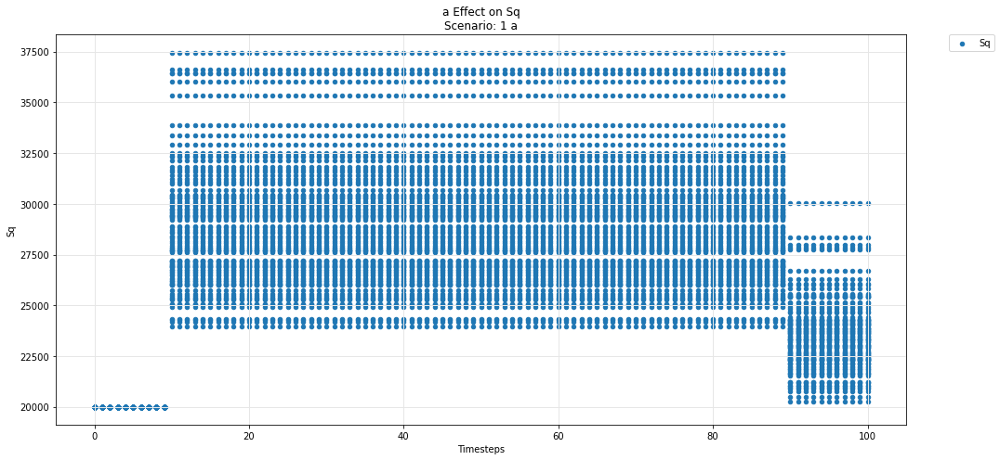

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

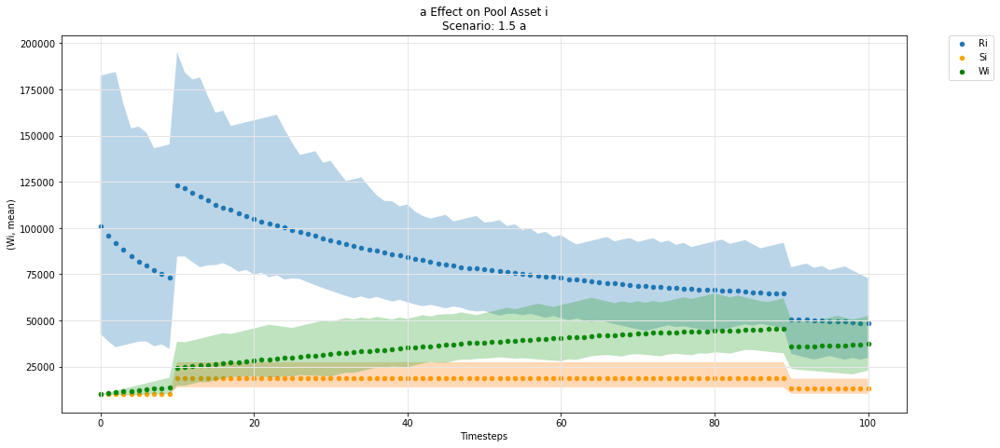

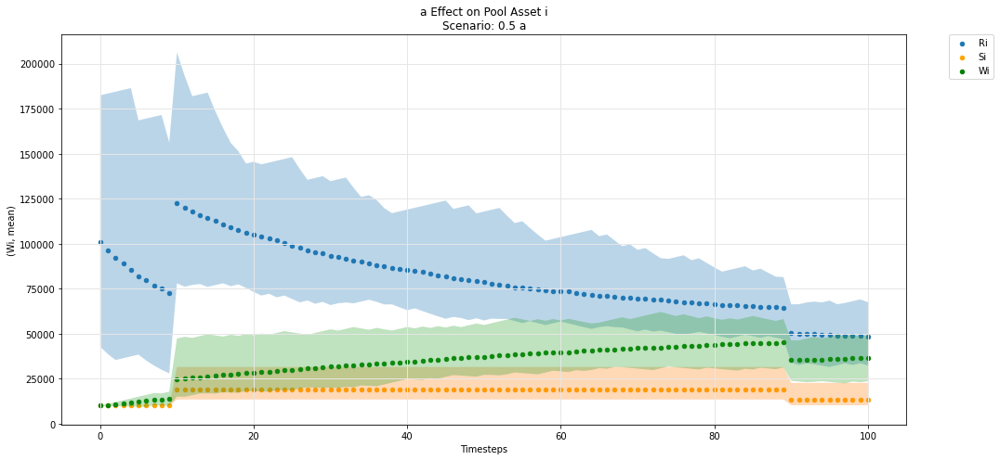

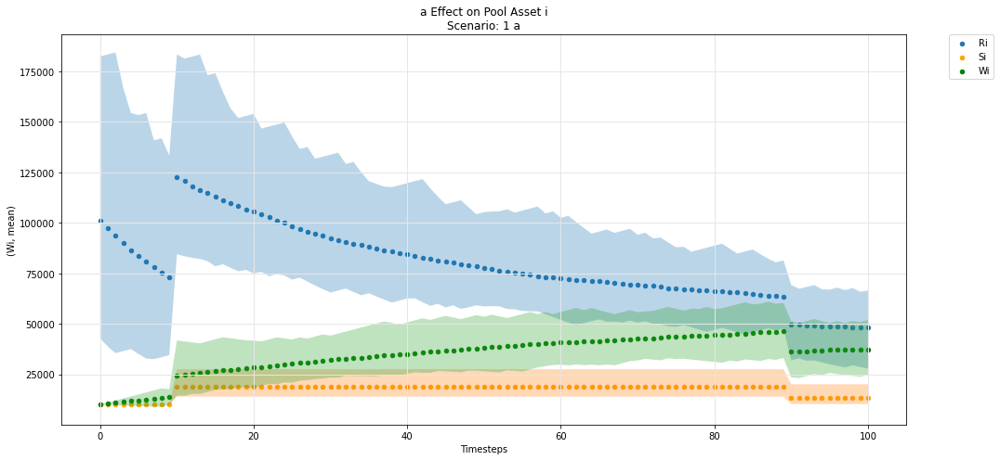

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

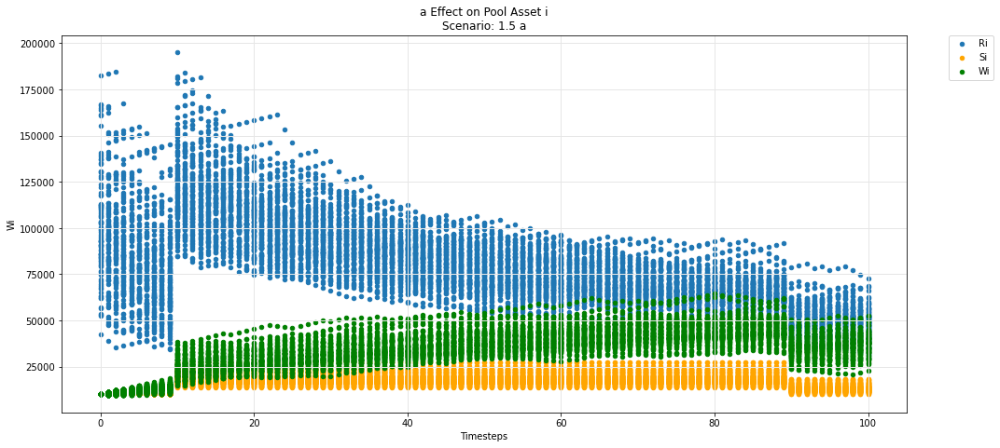

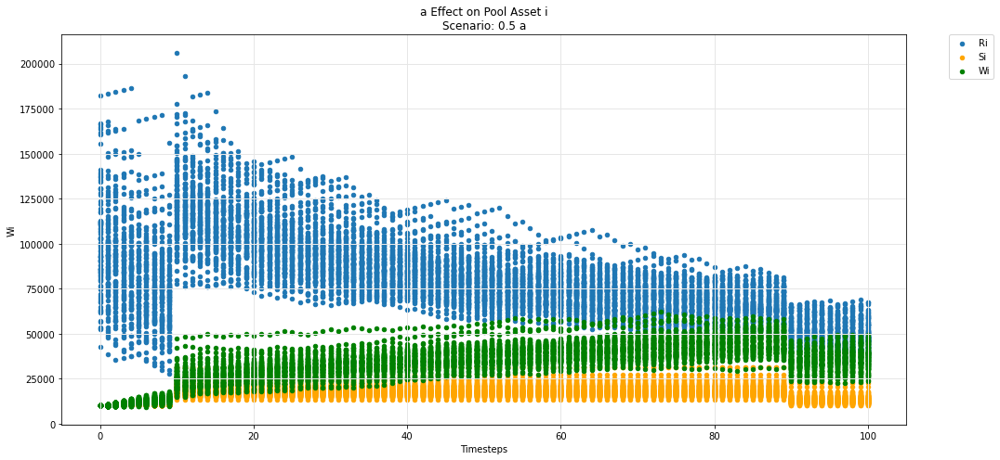

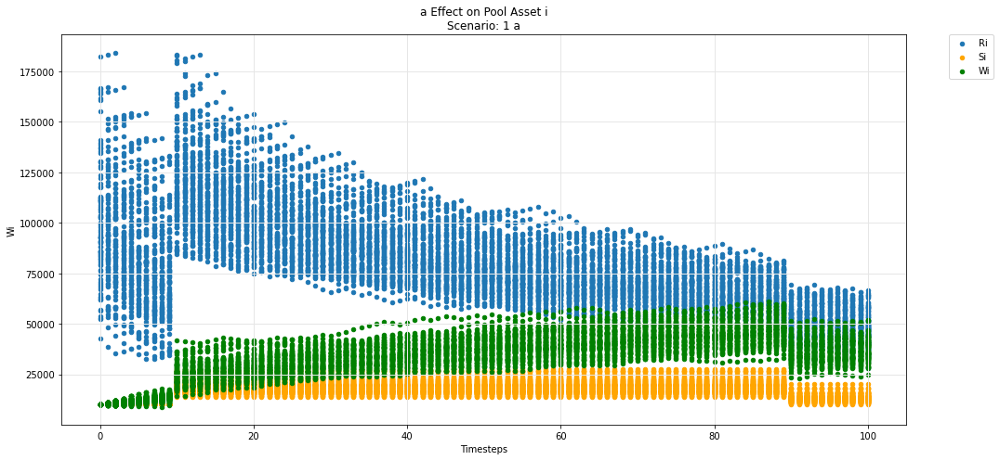

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

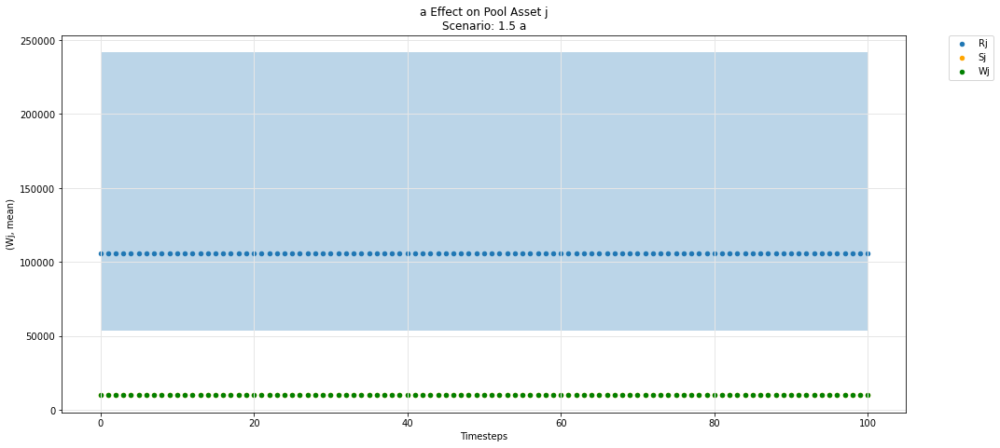

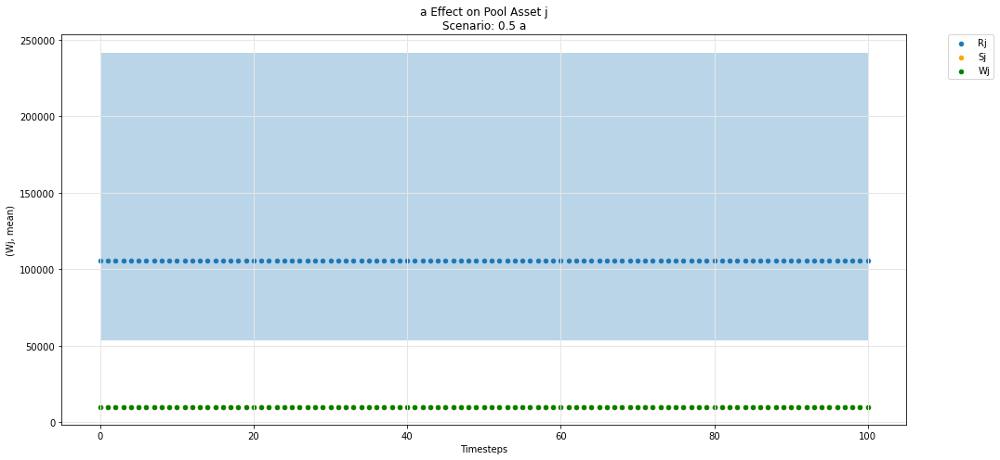

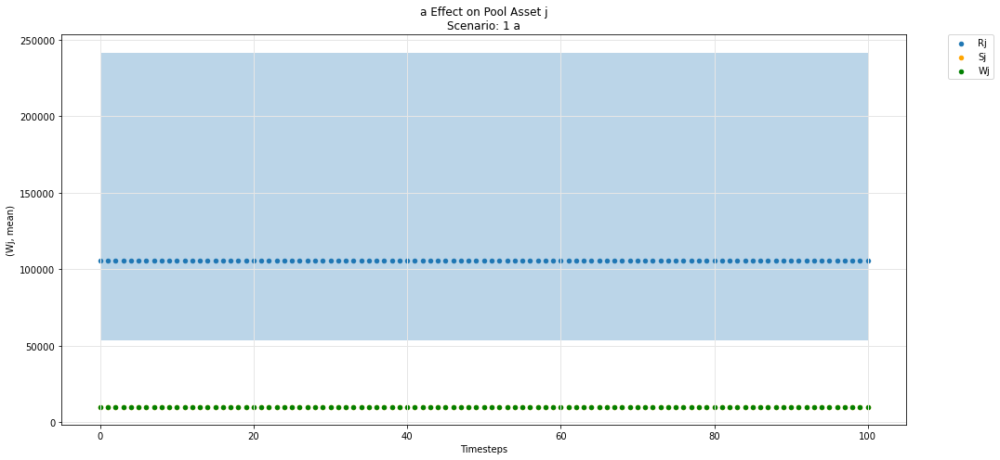

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

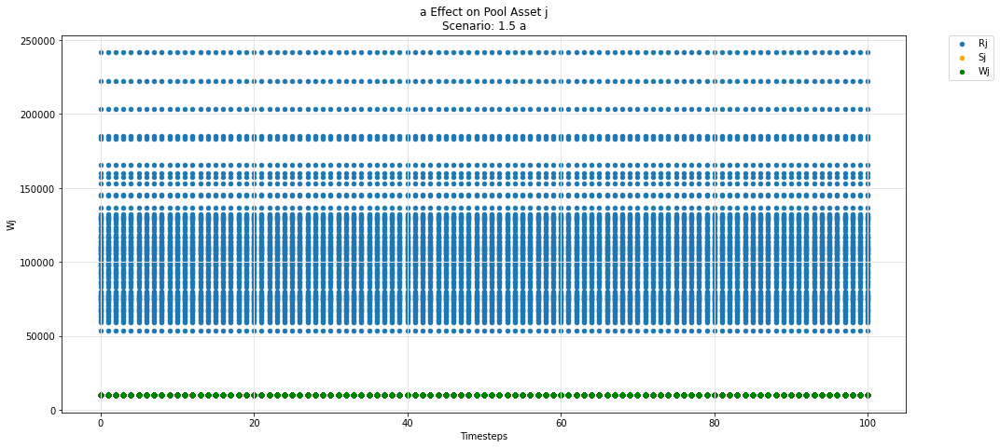

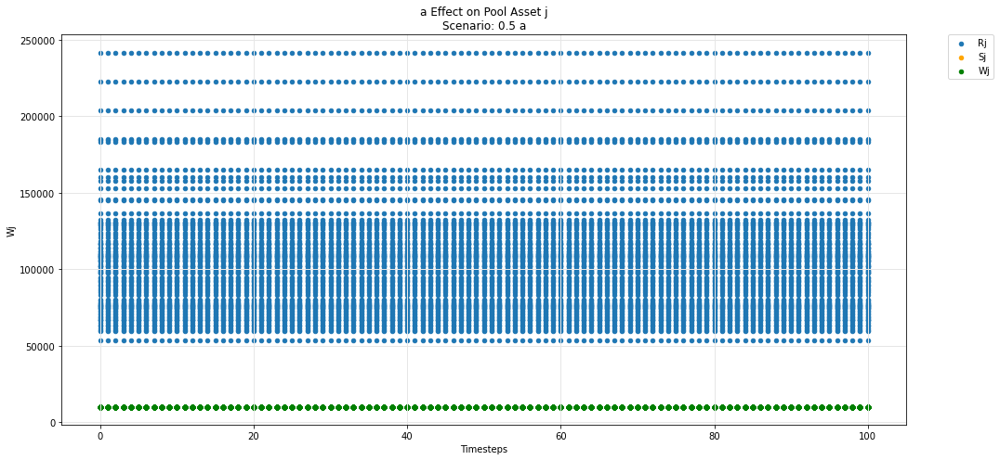

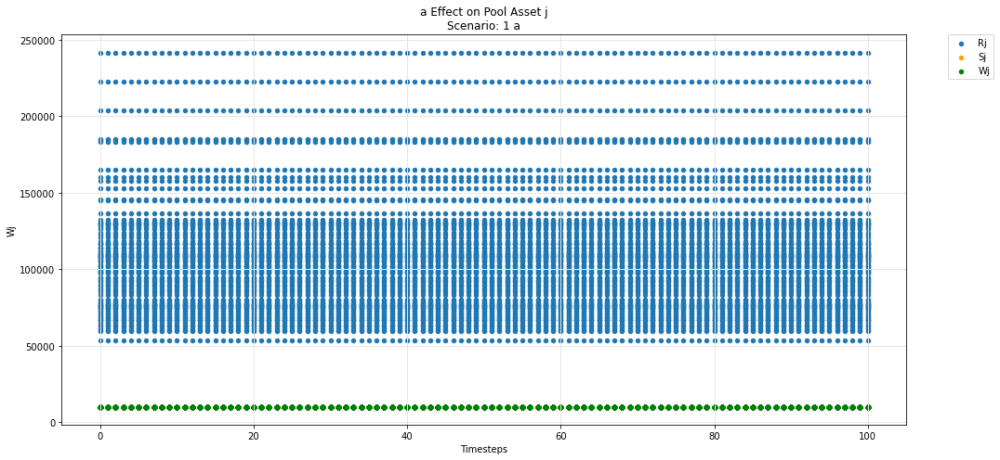

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

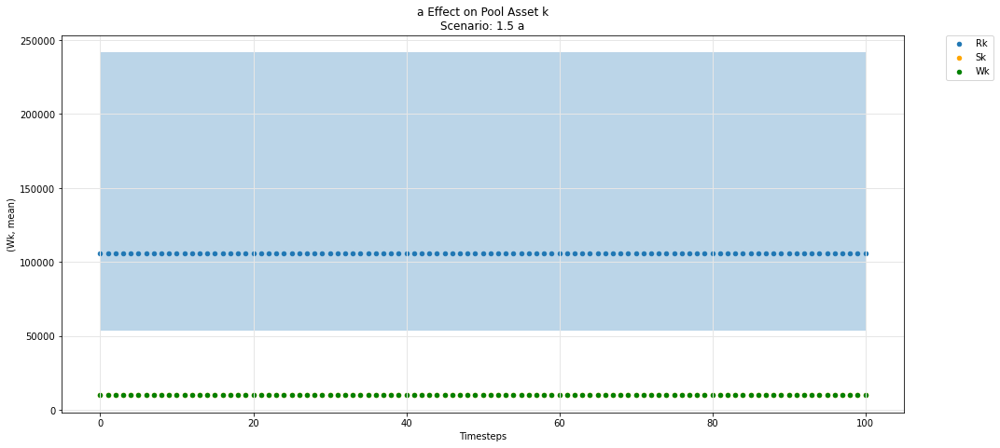

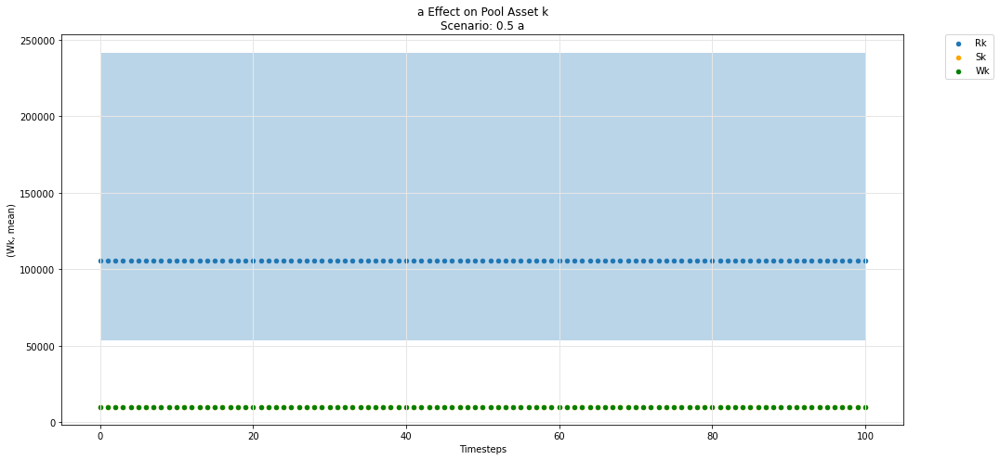

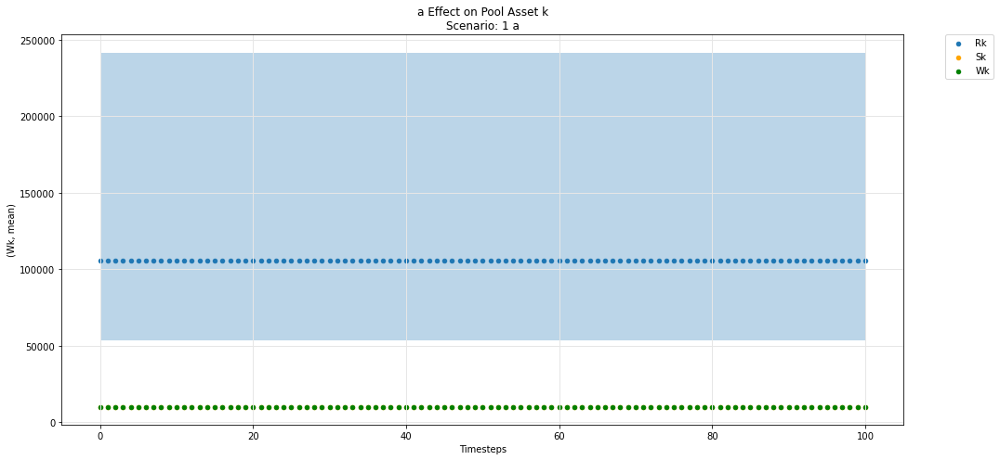

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

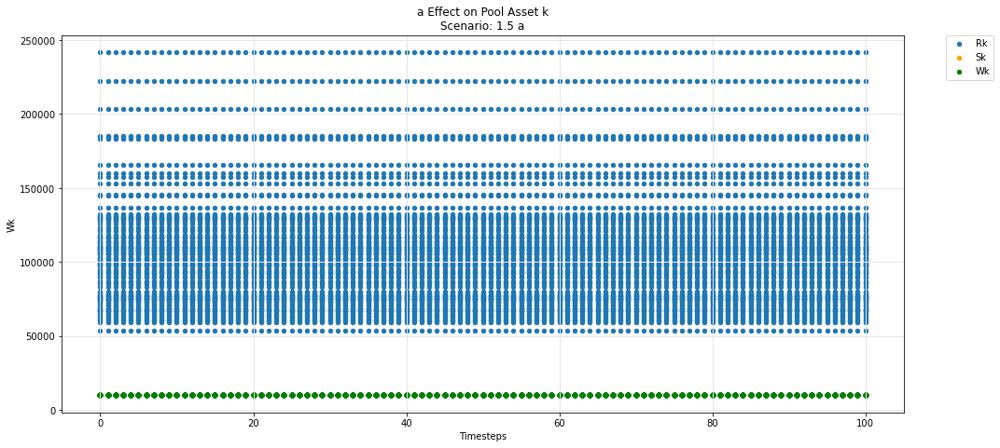

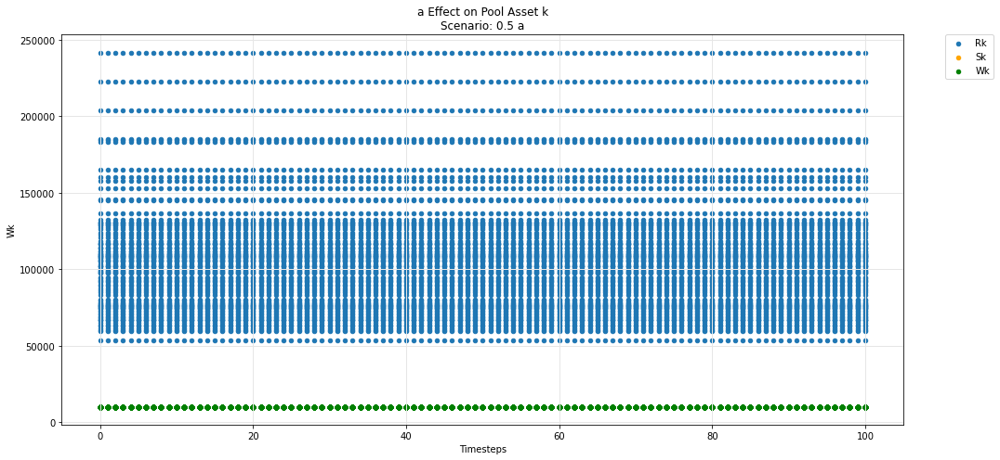

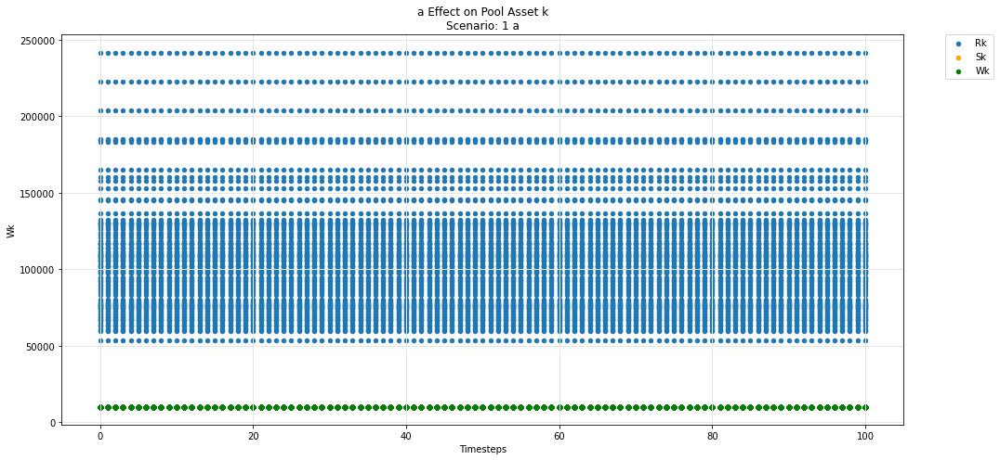

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

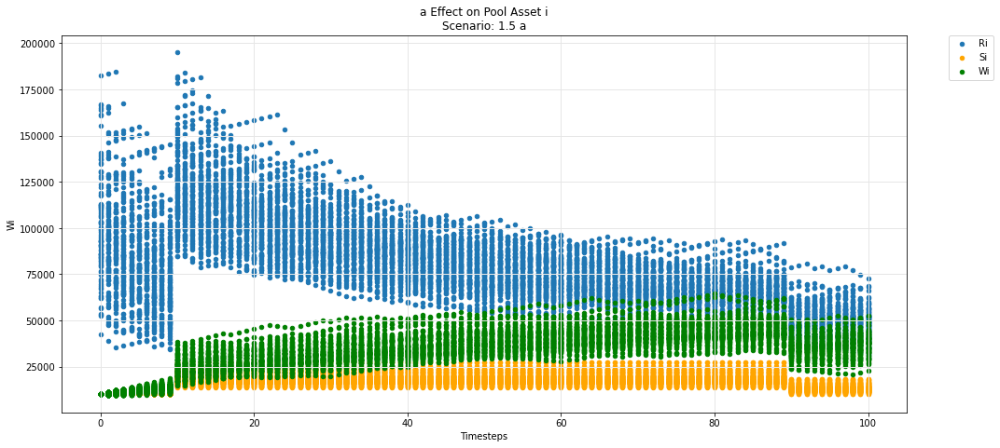

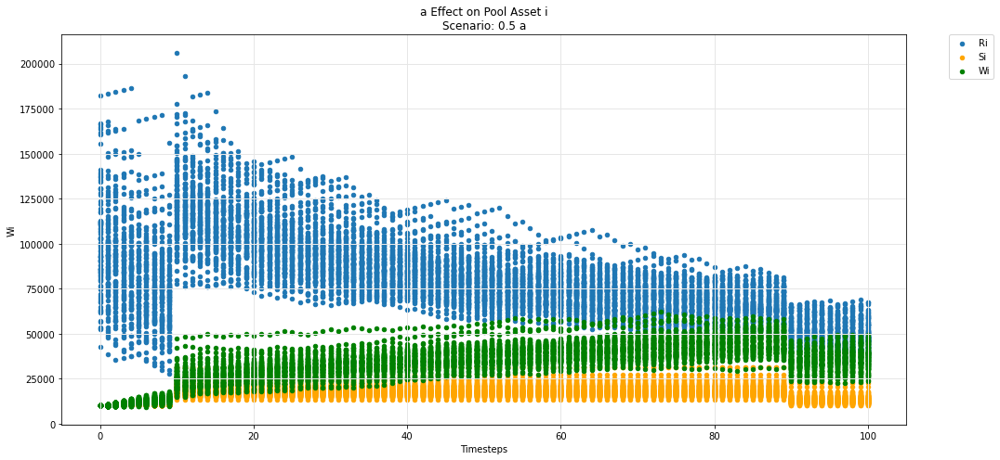

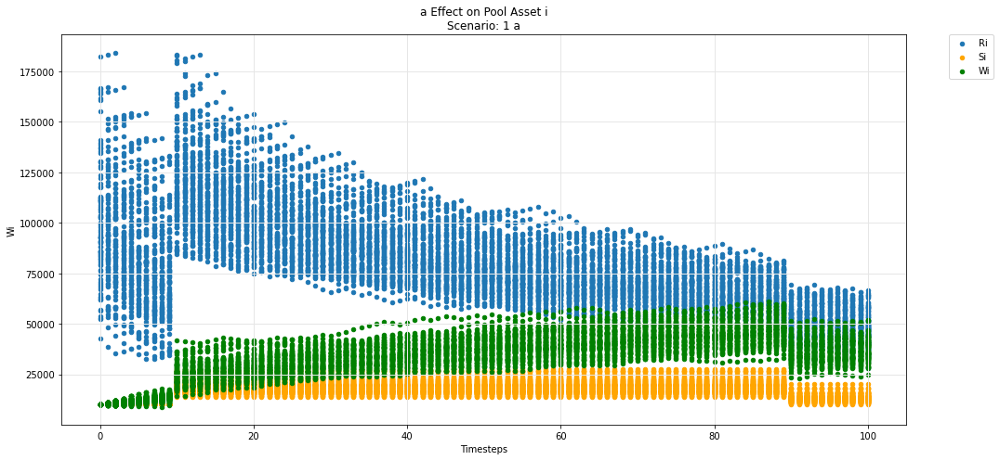

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

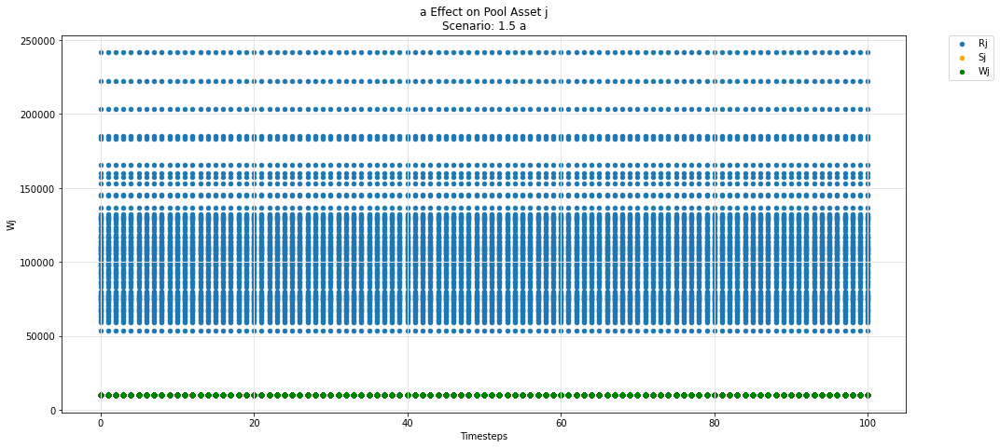

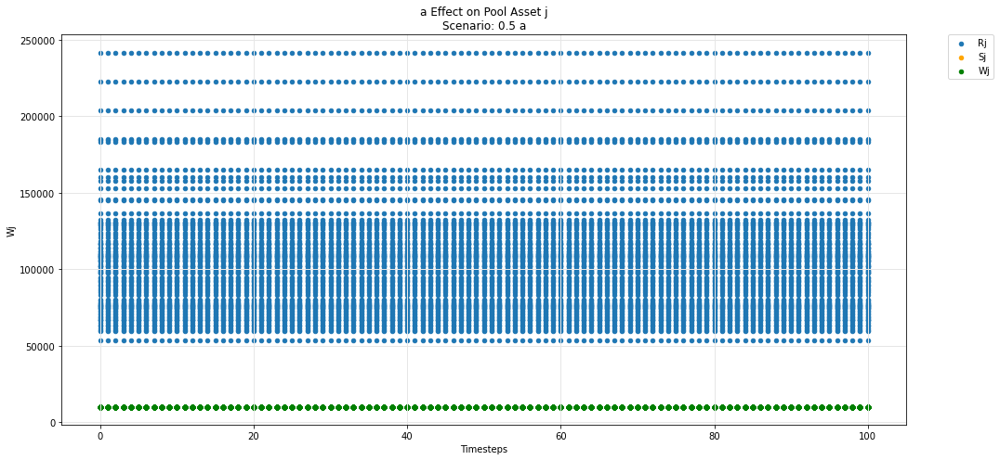

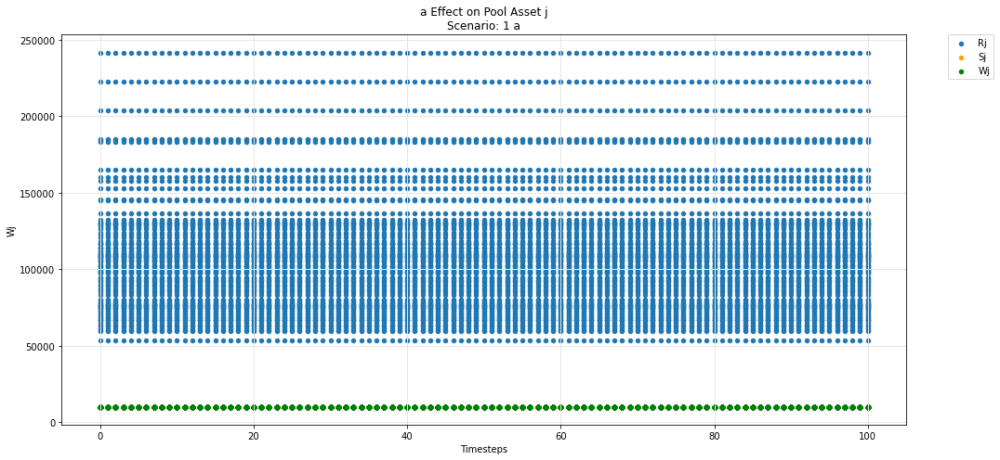

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

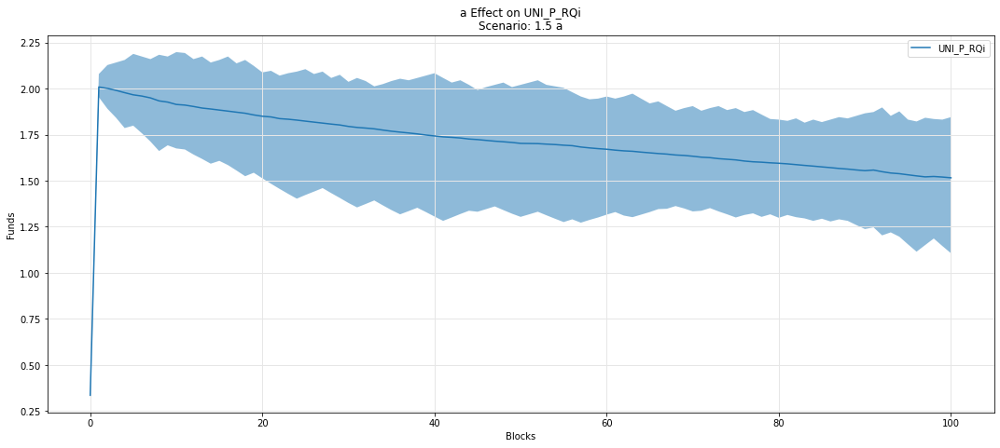

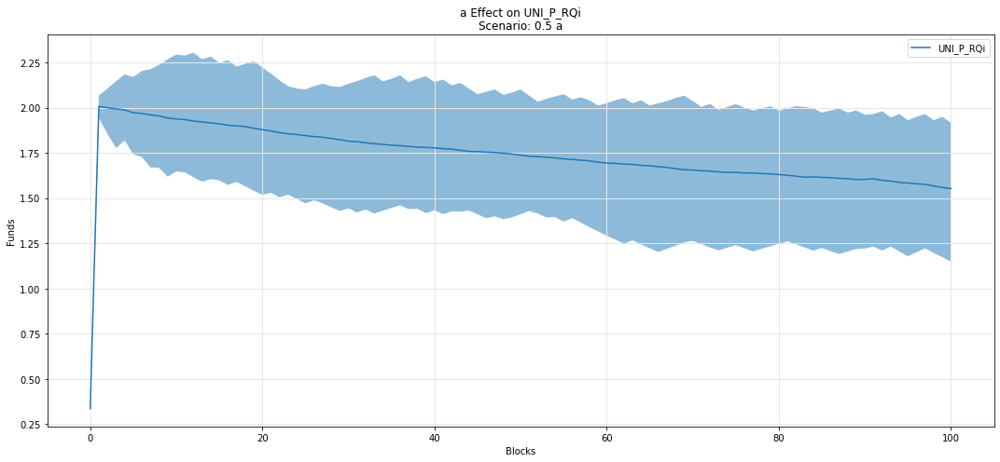

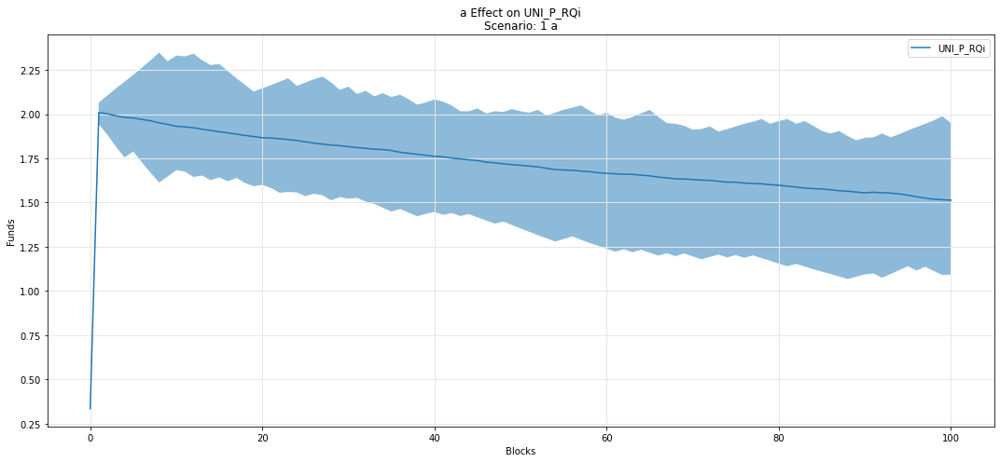

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

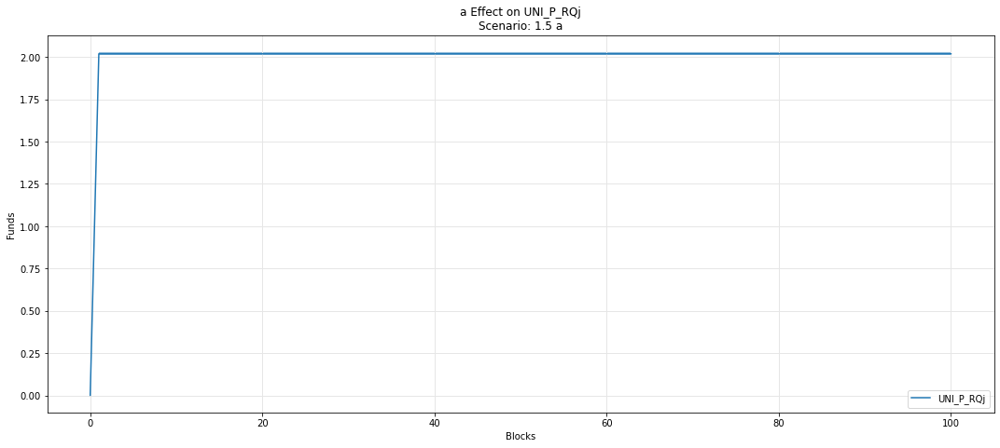

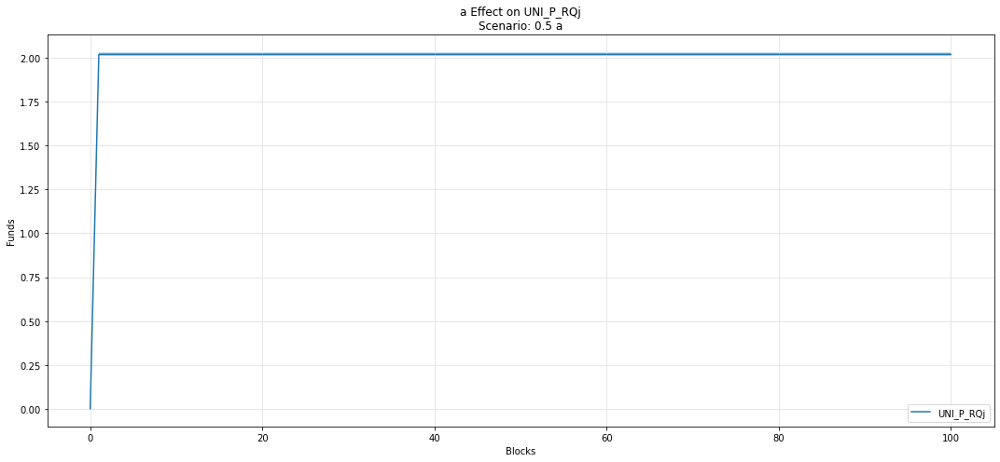

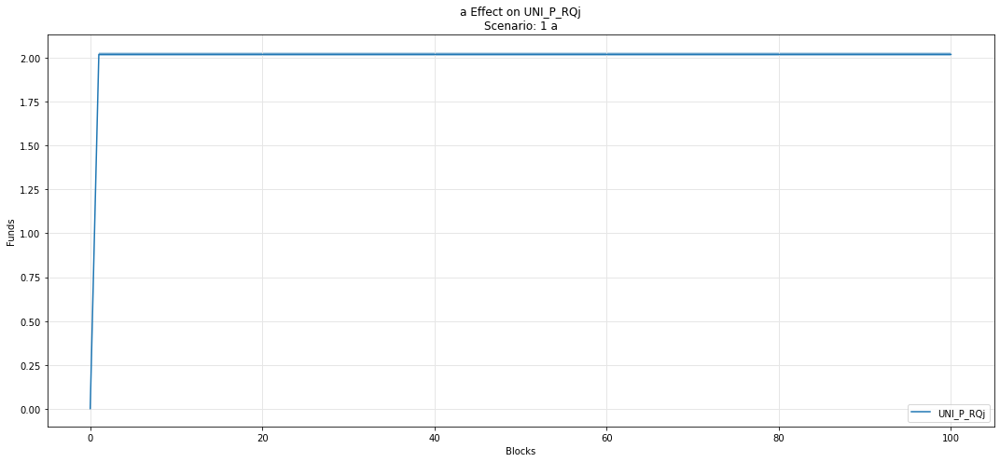

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

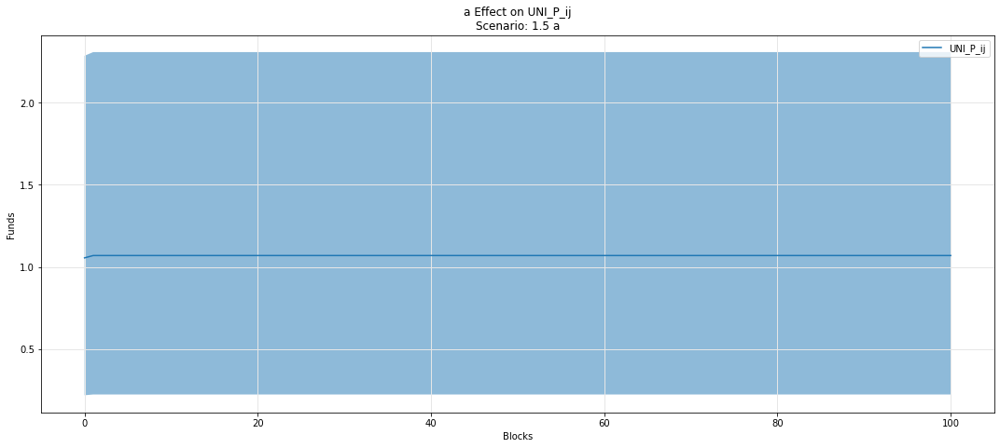

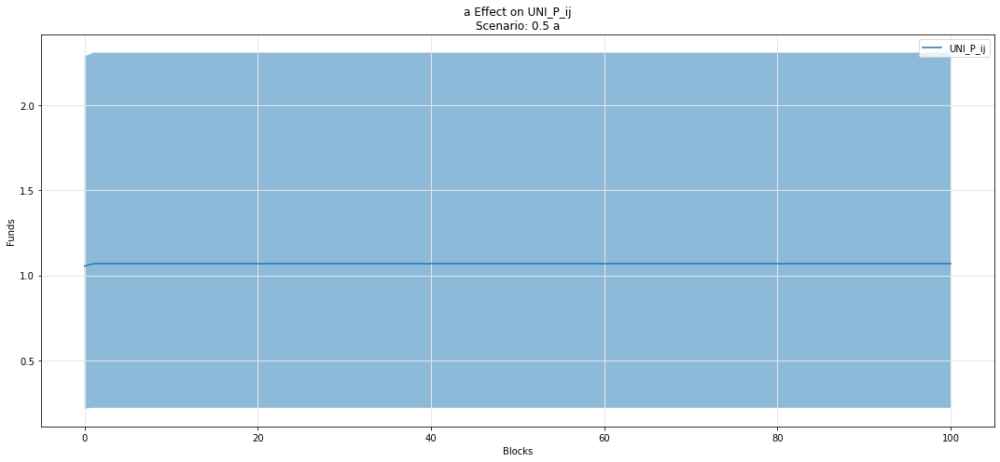

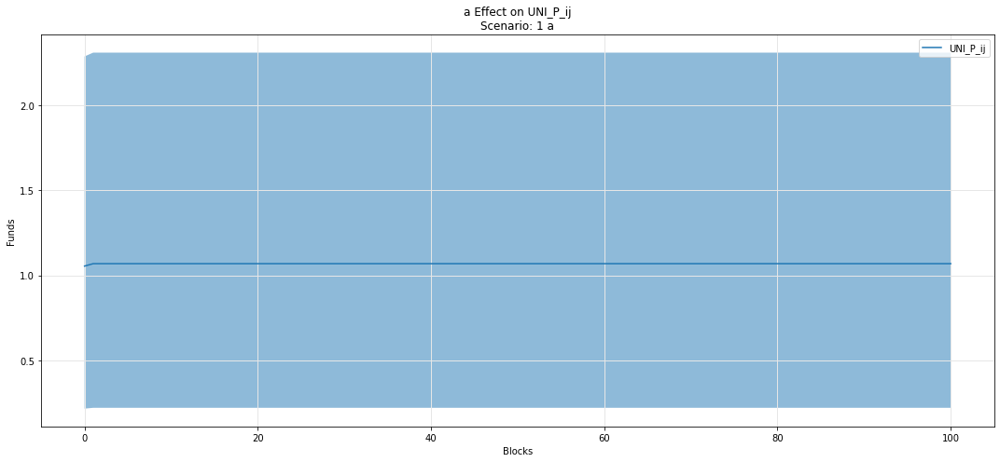

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

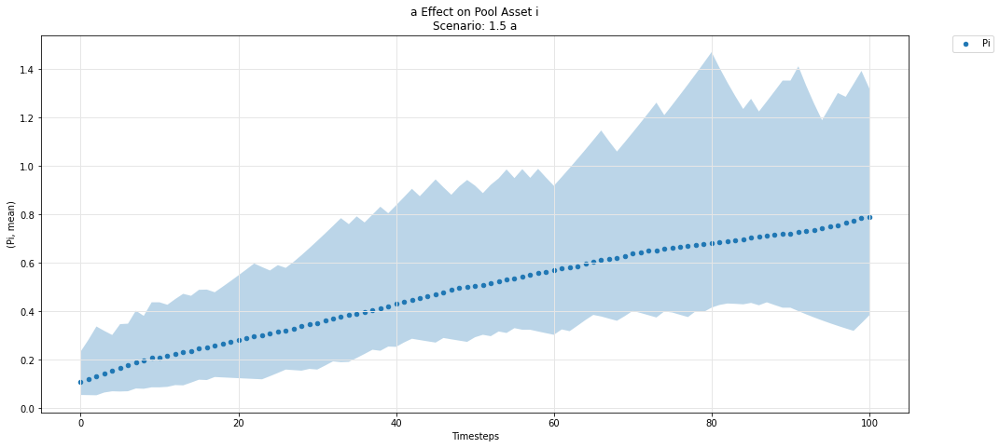

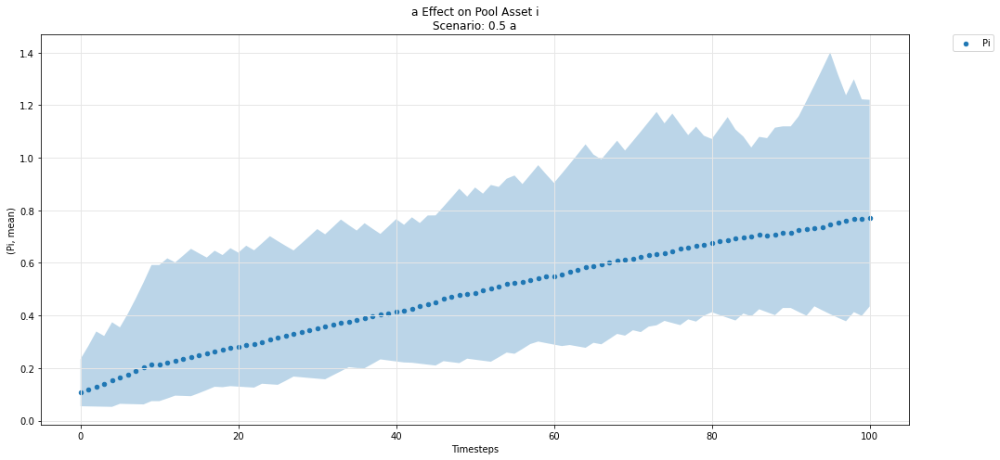

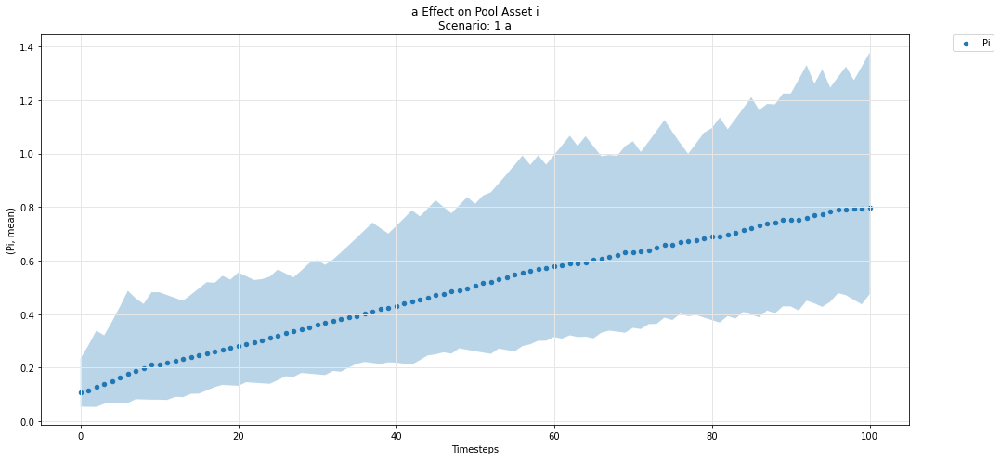

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

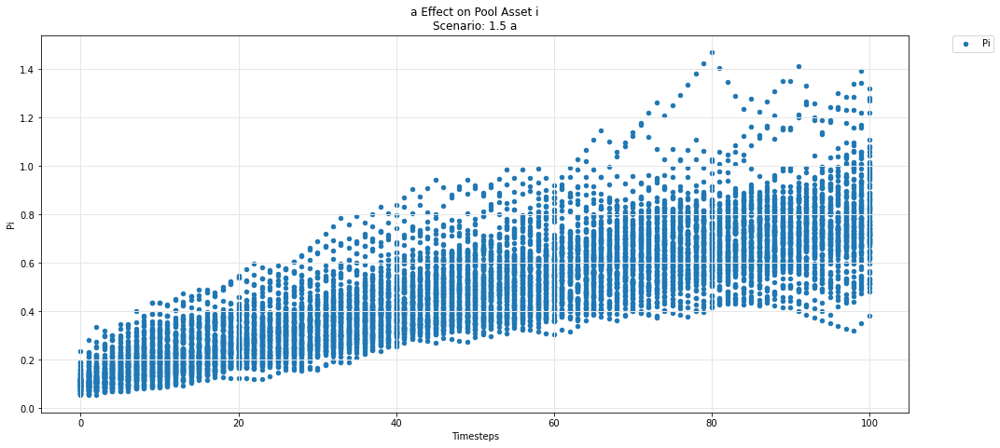

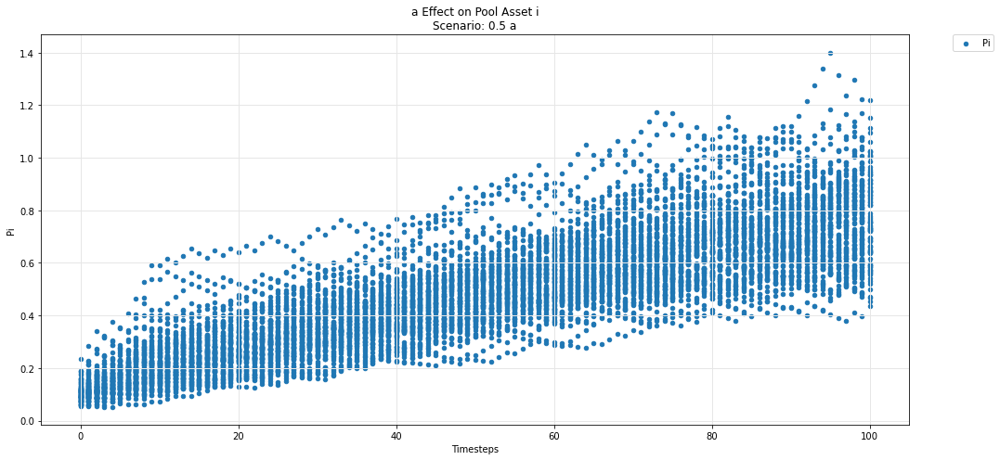

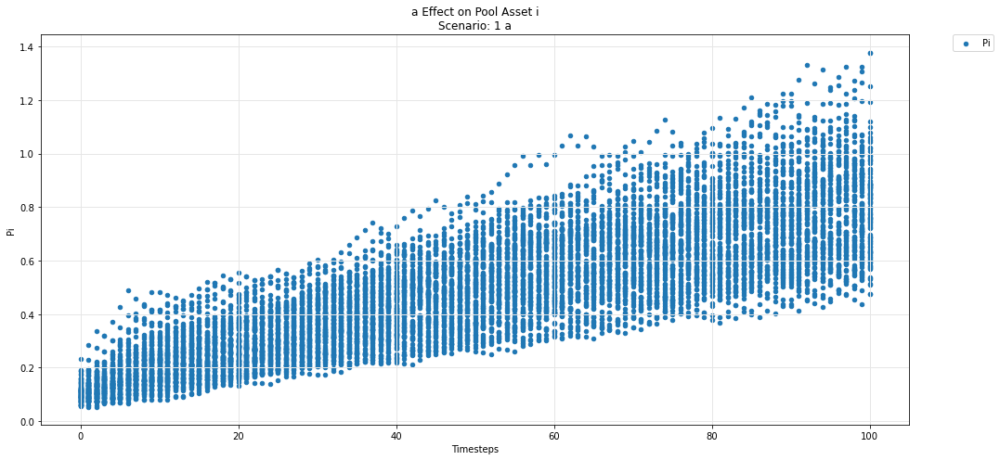

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

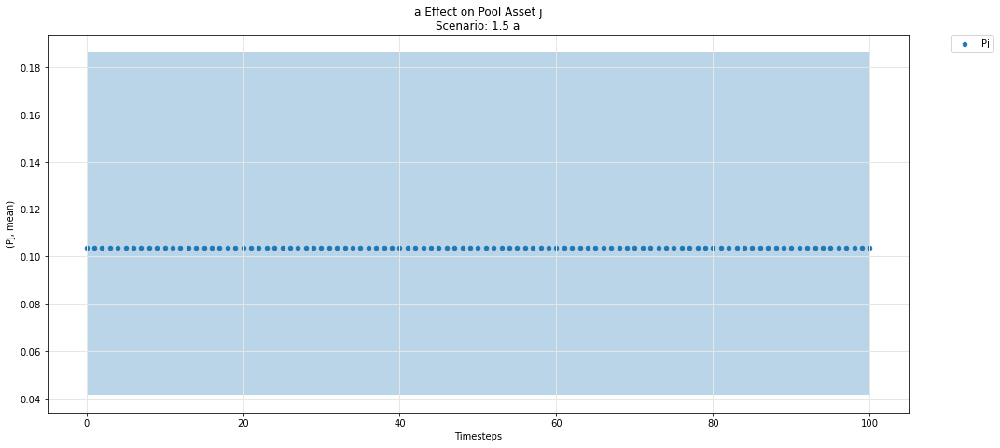

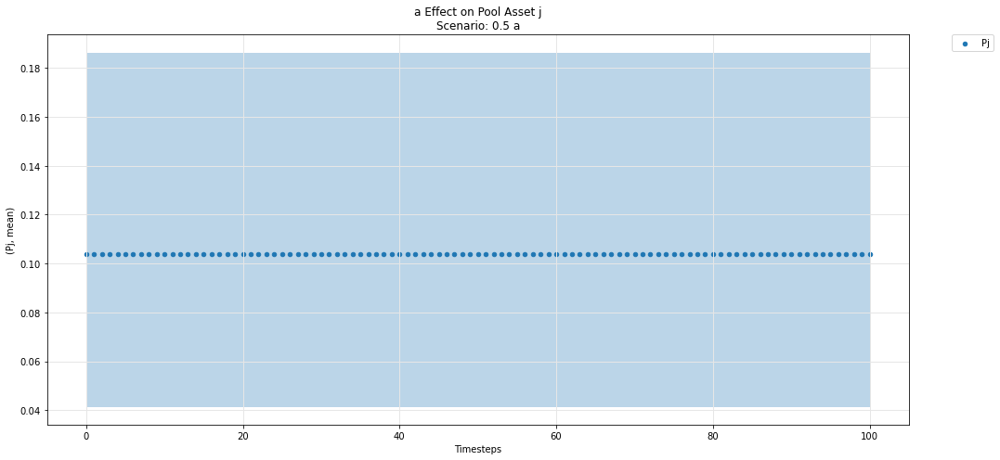

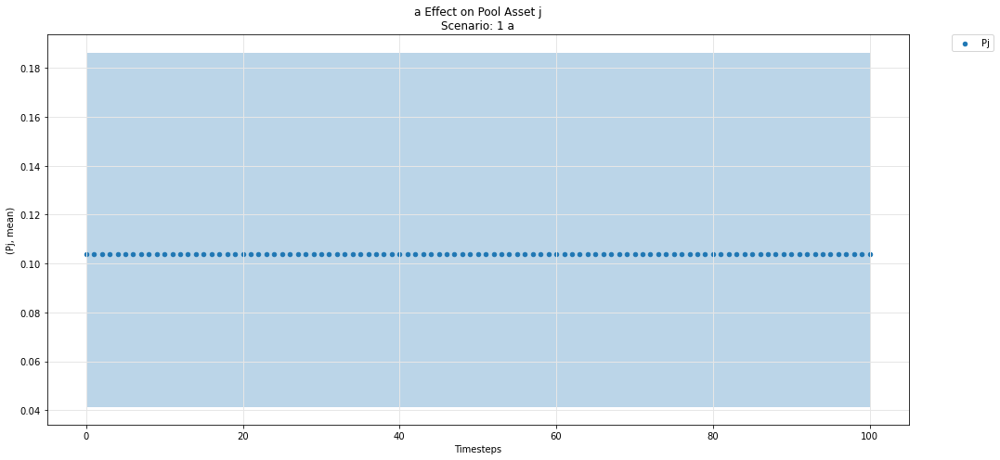

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

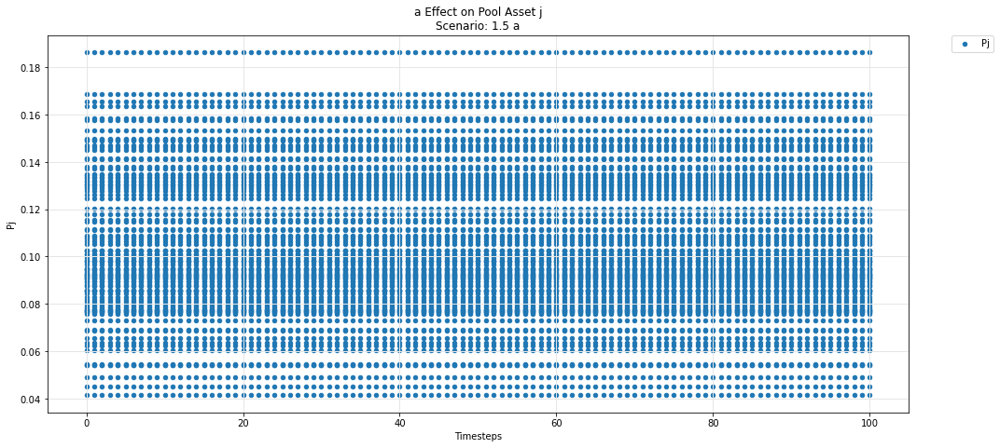

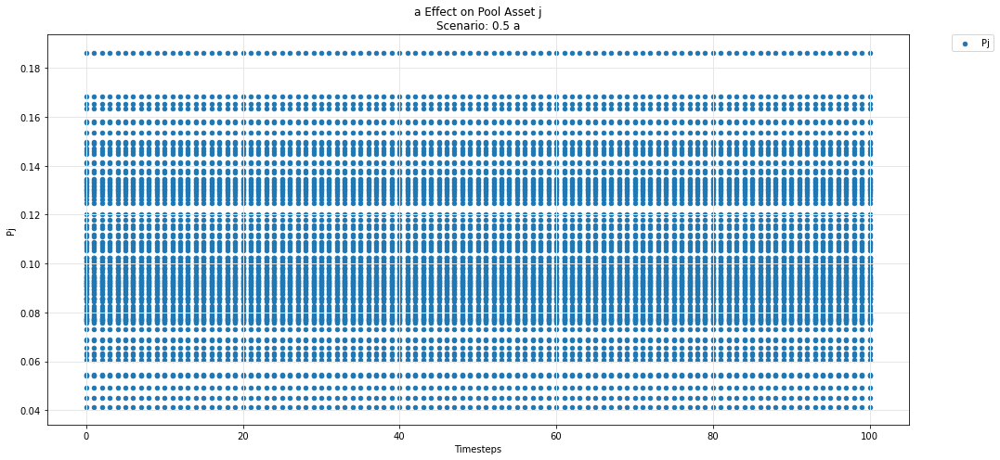

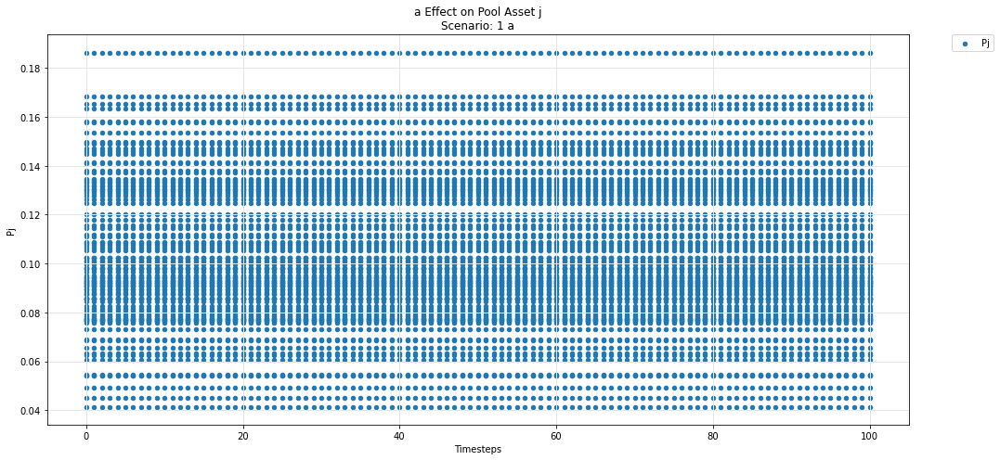

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

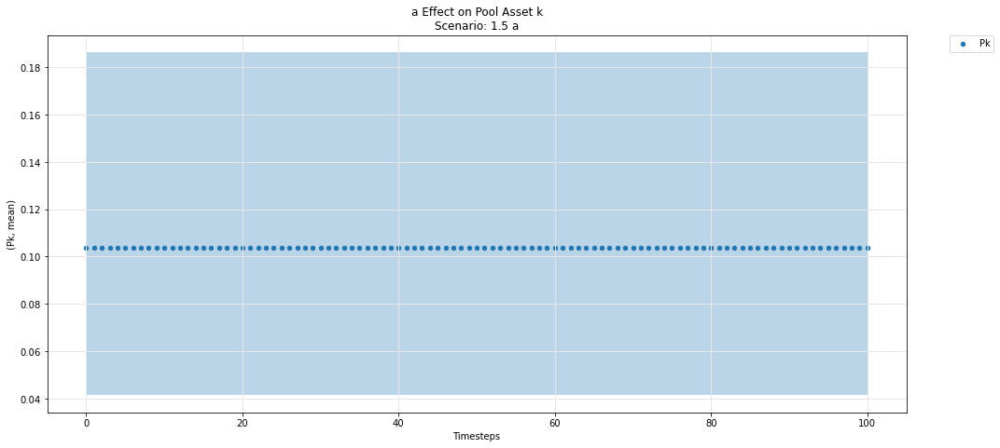

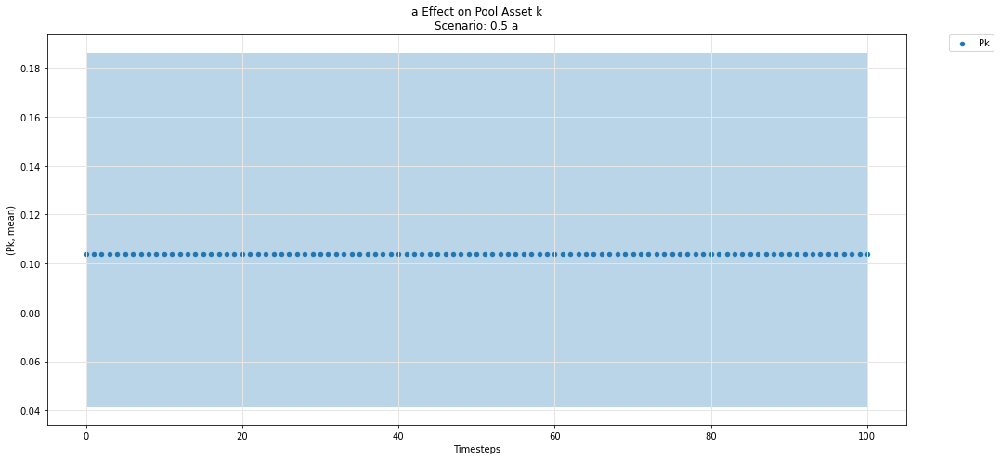

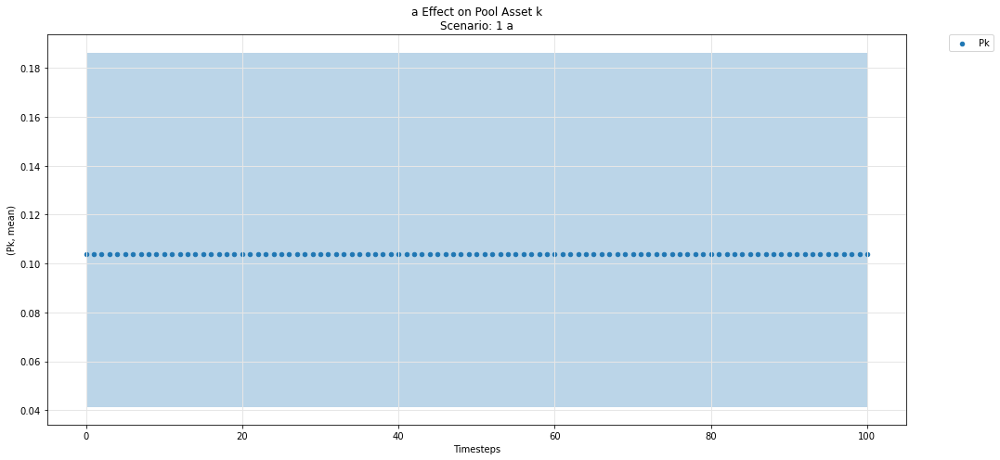

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

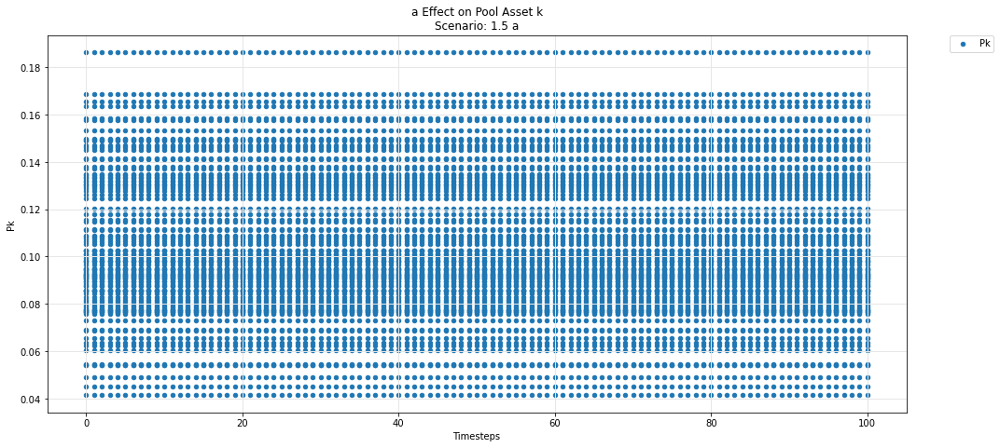

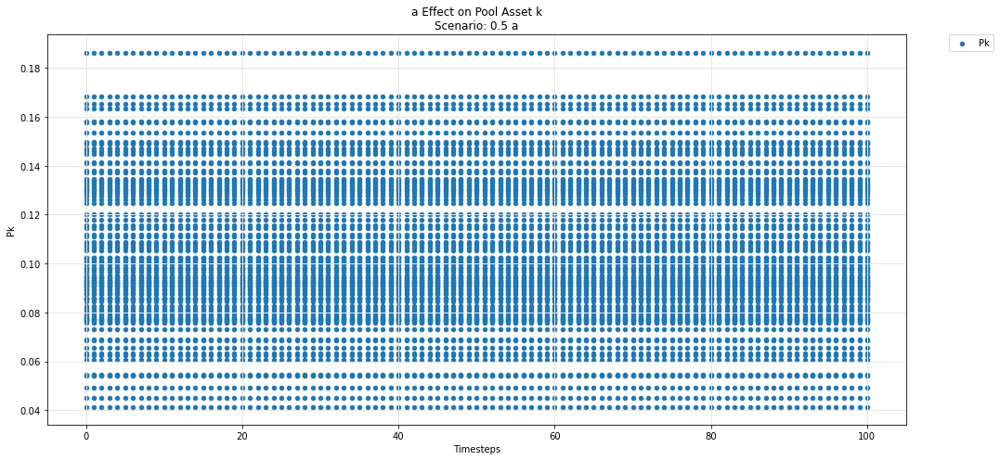

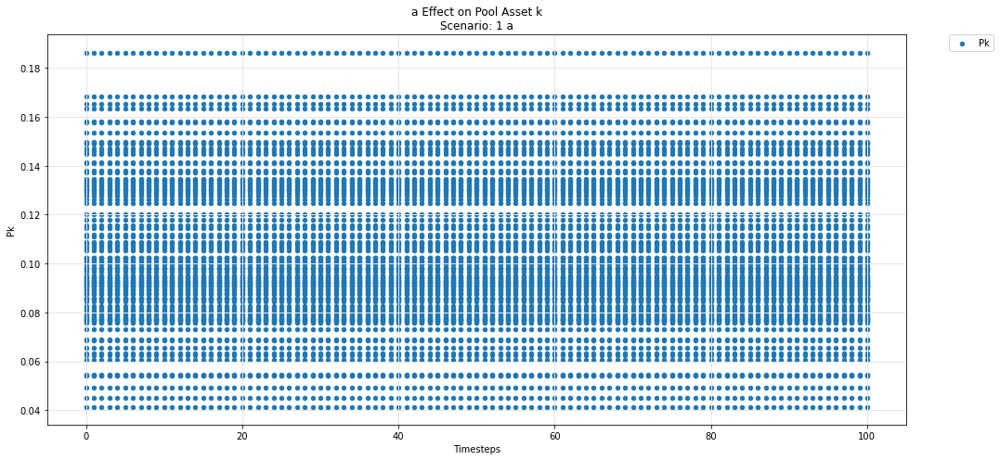

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')